# CICIDS2017 Dataset from Kaggle
https://www.kaggle.com/datasets/chethuhn/network-intrusion-dataset

# Unsuccessful attempt at Temporal Graph Network

In [ ]:
!git clone https://github.com/pyg-team/pytorch_geometric.git

Cloning into 'pytorch_geometric'...
remote: Enumerating objects: 74407, done.
remote: Counting objects: 100% (8145/8145), done.
remote: Compressing objects: 100% (962/962), done.
remote: Total 74407 (delta 7619), reused 7501 (delta 7180), pack-reused 66262
Receiving objects: 100% (74407/74407), 19.41 MiB | 7.06 MiB/s, done.
Resolving deltas: 100% (57817/57817), done.


In [ ]:
%cd pytorch_geometric

/content/pytorch_geometric


In [ ]:
import sys
sys.path.append('/content/pytorch_geometric/examples/tgn.py')

In [ ]:
!pip install torch

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
!pip install torch-geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.2/64.2 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 10.8 MB/s eta 0:00:00


In [ ]:
#Import TGN model definitions
import sys
import importlib

# Append the correct path to the system path
sys.path.append('/content/pytorch_geometric/examples/')

# Reload the module to ensure it's using the updated path
import tgn
from tgn import TGNMemory, TransformerConv, IdentityMessage, LastNeighborLoader, LastAggregator

KeyboardInterrupt: 

# FNN Implementations

In [ ]:
#Add CICIDS2017 to drive, update path if not using Google Drive

In [ ]:
import pandas as pd
import os

# Directory where the dataset files are stored
data_path = '/content/drive/MyDrive/CICIDS2017/'

# List all files in the directory
data_files = os.listdir(data_path)
print("Files in directory:", data_files)

# Load and concatenate all CSV files into a single DataFrame
data_list = []
for file in data_files:
    if file.endswith('.csv'):
        file_path = os.path.join(data_path, file)
        data_list.append(pd.read_csv(file_path))

data = pd.concat(data_list, ignore_index=True)
print("Data loaded successfully!")


Files in directory: ['Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv', 'Friday-WorkingHours-Morning.pcap_ISCX.csv', 'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv', 'Monday-WorkingHours.pcap_ISCX.csv', 'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv', 'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv', 'Tuesday-WorkingHours.pcap_ISCX.csv', 'Wednesday-workingHours.pcap_ISCX.csv']
Data loaded successfully!


# FNN Model using model from binary classification project in FNN-Model-CyberattackDetect.ipynb

Files in the directory:
['Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv', 'Friday-WorkingHours-Morning.pcap_ISCX.csv', 'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv', 'Monday-WorkingHours.pcap_ISCX.csv', 'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv', 'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv', 'Tuesday-WorkingHours.pcap_ISCX.csv', 'Wednesday-workingHours.pcap_ISCX.csv']
Columns in the dataset:
Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd

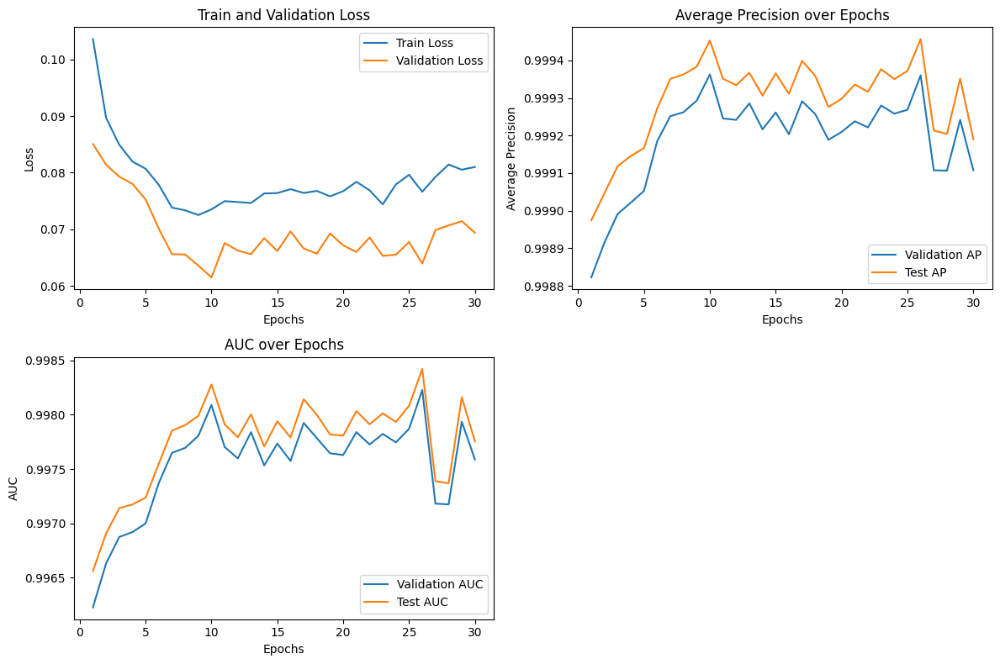

In [ ]:
#FNN model implementation
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import average_precision_score, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import os
import numpy as np

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Verify files are present
print("Files in the directory:")
print(os.listdir(data_path))

data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Strip any leading/trailing whitespace characters from the column names
data.columns = data.columns.str.strip()

# Check column names
print("Columns in the dataset:")
print(data.columns)

# Drop columns that won't be used for training (like non-numeric features)
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
columns_to_drop = [col.strip() for col in columns_to_drop if col.strip() in data.columns]
data = data.drop(columns=columns_to_drop)

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Ensure all columns are numeric
print("Data types after converting categorical columns:")
print(data.dtypes)

# Handle infinity or extremely large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
print("Label columns identified:", label_columns)

# Combine one-hot encoded label columns into a single target column
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])

# Map the labels to binary classification (BENIGN vs. ATTACK)
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)

# Drop the individual label columns
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64

train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the model, loss function, and optimizer
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

input_dim = X_tensor.shape[1]
model = SimpleNN(input_dim)
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Training function
def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.squeeze().cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop
num_epochs = 30
train_losses = []
val_losses = []
val_aps = []
val_aucs = []
test_aps = []
test_aucs = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_aps.append(val_ap)
    val_aucs.append(val_auc)
    test_aps.append(test_ap)
    test_aucs.append(test_auc)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

# Save the trained attack detection model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_attack_detection_model.pth')

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 2, 2)
plt.plot(epochs, val_aps, label='Validation AP')
plt.plot(epochs, test_aps, label='Test AP')
plt.xlabel('Epochs')
plt.ylabel('Average Precision')
plt.legend()
plt.title('Average Precision over Epochs')

plt.subplot(2, 2, 3)
plt.plot(epochs, val_aucs, label='Validation AUC')
plt.plot(epochs, test_aucs, label='Test AUC')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.legend()
plt.title('AUC over Epochs')

plt.tight_layout()
plt.show()


In [ ]:
!pip install pennylane
!pip install pennylane-qiskit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.0/51.0 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.5/15.5 MB 44.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 47.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 91.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.9/249.9 kB 31.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 90.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 110.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.4/39.4 MB 42.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
#QNN enhanced TGN model
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import average_precision_score, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import os
import numpy as np

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Strip any leading/trailing whitespace characters from the column names
data.columns = data.columns.str.strip()

# Drop columns that won't be used for training (like non-numeric features)
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
columns_to_drop = [col.strip() for col in columns_to_drop if col.strip() in data.columns]
data = data.drop(columns=columns_to_drop)

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Handle infinity or extremely large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify the target columns
label_columns = [col for col in data.columns if 'Label_' in col]

# Combine one-hot encoded label columns into a single target column
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])

# Map the labels to binary classification (BENIGN vs. ATTACK)
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)

# Drop the individual label columns
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64

train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the Quantum Neural Network (QNN) model
class QuantumLayer(torch.nn.Module):
    def __init__(self, input_dim, output_dim):
        super(QuantumLayer, self).__init__()
        self.linear = torch.nn.Linear(input_dim, output_dim)

    def forward(self, x):
        x = self.linear(x)
        x = torch.sin(x)  # Apply a quantum-inspired non-linearity
        return x

class QuantumNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(QuantumNN, self).__init__()
        self.q_layer1 = QuantumLayer(input_dim, 128)
        self.q_layer2 = QuantumLayer(128, 64)
        self.fc = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)
        self.batch_norm1 = torch.nn.BatchNorm1d(128)
        self.batch_norm2 = torch.nn.BatchNorm1d(64)

    def forward(self, x):
        x = torch.relu(self.batch_norm1(self.q_layer1(x)))
        x = self.dropout(x)
        x = torch.relu(self.batch_norm2(self.q_layer2(x)))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc(x))
        return x

input_dim = X_tensor.shape[1]
model = QuantumNN(input_dim)
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Training function
def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.squeeze().cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop
num_epochs = 30
train_losses = []
val_losses = []
val_aps = []
val_aucs = []
test_aps = []
test_aucs = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_aps.append(val_ap)
    val_aucs.append(val_auc)
    test_aps.append(test_ap)
    test_aucs.append(test_auc)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

# Save the trained attack detection model
torch.save(model.state_dict(), '/content/drive/MyDrive/QNN-TGN_attack_detection_model.pth')

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 2, 2)
plt.plot(epochs, val_aps, label='Validation AP')
plt.plot(epochs, test_aps, label='Test AP')
plt.xlabel('Epochs')
plt.ylabel('Average Precision')
plt.legend()
plt.title('Average Precision over Epochs')

plt.subplot(2, 2, 3)
plt.plot(epochs, val_aucs, label='Validation AUC')
plt.plot(epochs, test_aucs, label='Test AUC')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.legend()
plt.title('AUC over Epochs')

plt.tight_layout()
plt.show()

KeyboardInterrupt: 

Epoch: 01, Loss: 0.1049
Epoch: 02, Loss: 0.0849
Epoch: 03, Loss: 0.0795
Epoch: 04, Loss: 0.0776
Epoch: 05, Loss: 0.0768
Epoch: 06, Loss: 0.0747
Epoch: 07, Loss: 0.0749
Epoch: 08, Loss: 0.0751
Epoch: 09, Loss: 0.0747
Epoch: 10, Loss: 0.0749
Epoch: 01, Loss: 0.0736
Val AP: 0.9994, Val AUC: 0.9983
Test AP: 0.9995, Test AUC: 0.9985
Epoch: 02, Loss: 0.0730
Val AP: 0.9993, Val AUC: 0.9979
Test AP: 0.9994, Test AUC: 0.9982
Epoch: 03, Loss: 0.0750
Val AP: 0.9993, Val AUC: 0.9979
Test AP: 0.9994, Test AUC: 0.9981
Epoch: 04, Loss: 0.0762
Val AP: 0.9993, Val AUC: 0.9979
Test AP: 0.9994, Test AUC: 0.9981
Epoch: 05, Loss: 0.0767
Val AP: 0.9994, Val AUC: 0.9984
Test AP: 0.9995, Test AUC: 0.9986
Epoch: 06, Loss: 0.0763
Val AP: 0.9993, Val AUC: 0.9978
Test AP: 0.9994, Test AUC: 0.9980
Epoch: 07, Loss: 0.0784
Val AP: 0.9992, Val AUC: 0.9976
Test AP: 0.9993, Test AUC: 0.9978
Epoch: 08, Loss: 0.0801
Val AP: 0.9994, Val AUC: 0.9981
Test AP: 0.9995, Test AUC: 0.9983
Epoch: 09, Loss: 0.0809
Val AP: 0.9993, 

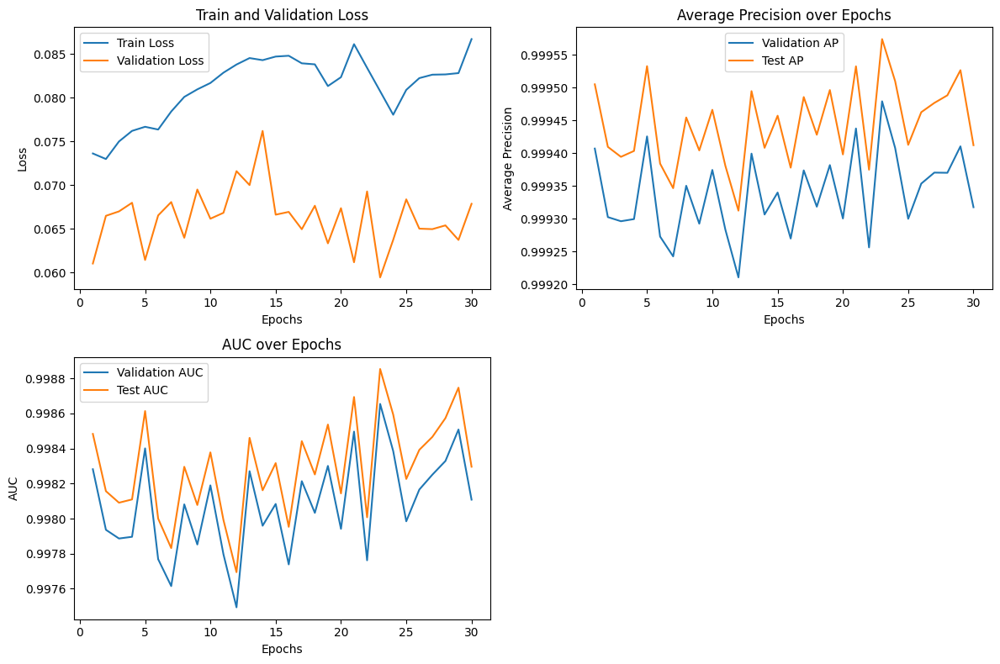

In [ ]:
# Use previous model from dataset_invade.csv data
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import average_precision_score, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import os
import numpy as np

# Load and preprocess new dataset (CICIDS2017)
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the model architecture
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Load the pre-trained model with adjusted input dimension
input_dim = X_tensor_new.shape[1]
model = SimpleNN(input_dim)

#Load only the layers that match in size
pretrained_dict = torch.load('/content/drive/MyDrive/TGN_invade_simple_nn_model.pth')
model_dict = model.state_dict()
# 1. Filter out unnecessary keys
pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and v.size() == model_dict[k].size()}
# 2. Overwrite entries in the existing state dict
model_dict.update(pretrained_dict)
# 3. Load the new state dict
model.load_state_dict(model_dict)

model.eval()

# Fine-tuning the model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Fine-tuning loop
num_epochs = 10
for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')

# Evaluation on the new dataset
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.squeeze().cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop
num_epochs = 30
train_losses = []
val_losses = []
val_aps = []
val_aucs = []
test_aps = []
test_aucs = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_aps.append(val_ap)
    val_aucs.append(val_auc)
    test_aps.append(test_ap)
    test_aucs.append(test_auc)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

# Save the trained attack detection model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_attack_detection_model.pth')

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 2, 2)
plt.plot(epochs, val_aps, label='Validation AP')
plt.plot(epochs, test_aps, label='Test AP')
plt.xlabel('Epochs')
plt.ylabel('Average Precision')
plt.legend()
plt.title('Average Precision over Epochs')

plt.subplot(2, 2, 3)
plt.plot(epochs, val_aucs, label='Validation AUC')
plt.plot(epochs, test_aucs, label='Test AUC')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.legend()
plt.title('AUC over Epochs')

plt.tight_layout()
plt.show()


Epoch: 01, Loss: 0.1022
Epoch: 02, Loss: 0.0806
Epoch: 03, Loss: 0.0766
Epoch: 04, Loss: 0.0750
Epoch: 05, Loss: 0.0749
Epoch: 06, Loss: 0.0745
Epoch: 07, Loss: 0.0738
Epoch: 08, Loss: 0.0743
Epoch: 09, Loss: 0.0727
Epoch: 10, Loss: 0.0729
Epoch: 11, Loss: 0.0718
Epoch: 12, Loss: 0.0728
Epoch: 13, Loss: 0.0731
Epoch: 14, Loss: 0.0743
Epoch: 15, Loss: 0.0747
Epoch: 16, Loss: 0.0750
Epoch: 17, Loss: 0.0763
Epoch: 18, Loss: 0.0764
Epoch: 19, Loss: 0.0773
Epoch: 20, Loss: 0.0787
Epoch: 21, Loss: 0.0802
Epoch: 22, Loss: 0.0799
Epoch: 23, Loss: 0.0797
Epoch: 24, Loss: 0.0791
Epoch: 25, Loss: 0.0809
Epoch: 26, Loss: 0.0800
Epoch: 27, Loss: 0.0818
Epoch: 28, Loss: 0.0799
Epoch: 29, Loss: 0.0797
Epoch: 30, Loss: 0.0802
Epoch: 01, Loss: 0.0789
Val AP: 0.9993, Val AUC: 0.9978, Val Precision: 0.9902, Val Recall: 0.9887, Val F1: 0.9894, Val Accuracy: 0.9830
Test AP: 0.9994, Test AUC: 0.9980, Test Precision: 0.9904, Test Recall: 0.9885, Test F1: 0.9895, Test Accuracy: 0.9831
Epoch: 02, Loss: 0.0787


NameError: name 'test_aps' is not defined

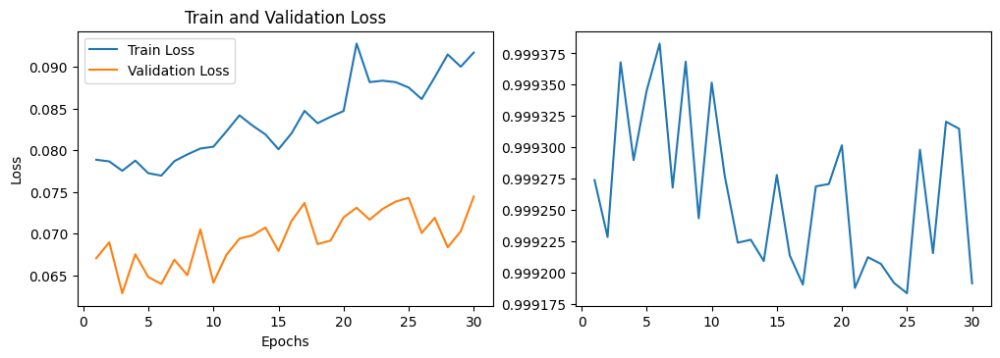

In [ ]:
# Added further metrics and graphs
# Use previous model from dataset_invade.csv data
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import average_precision_score, roc_auc_score, precision_score, recall_score, f1_score, accuracy_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import os
import numpy as np

# Load and preprocess new dataset (CICIDS2017)
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the model architecture
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Load the pre-trained model with adjusted input dimension
input_dim = X_tensor_new.shape[1]
model = SimpleNN(input_dim)

#Load only the layers that match in size
pretrained_dict = torch.load('/content/drive/MyDrive/TGN_invade_simple_nn_model.pth')
model_dict = model.state_dict()
# 1. Filter out unnecessary keys
pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and v.size() == model_dict[k].size()}
# 2. Overwrite entries in the existing state dict
model_dict.update(pretrained_dict)
# 3. Load the new state dict
model.load_state_dict(model_dict)

model.eval()

# Fine-tuning the model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Fine-tuning loop
num_epochs = 30
for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')

# Evaluation on the new dataset
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.squeeze().cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop with additional metrics
num_epochs = 30
train_losses = []
val_losses = []
val_aps = []
val_aucs = []
val_precisions = []
val_recalls = []
val_f1s = []
val_accuracies = []
test_precisions = []
test_recalls = []
test_f1s = []
test_accuracies = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    val_precision = precision_score(val_labels, val_outputs.round(), zero_division=0)
    val_recall = recall_score(val_labels, val_outputs.round(), zero_division=0)
    val_f1 = f1_score(val_labels, val_outputs.round(), zero_division=0)
    val_accuracy = accuracy_score(val_labels, val_outputs.round())

    test_precision = precision_score(test_labels, test_outputs.round(), zero_division=0)
    test_recall = recall_score(test_labels, test_outputs.round(), zero_division=0)
    test_f1 = f1_score(test_labels, test_outputs.round(), zero_division=0)
    test_accuracy = accuracy_score(test_labels, test_outputs.round())

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_aps.append(val_ap)
    val_aucs.append(val_auc)
    val_precisions.append(val_precision)
    val_recalls.append(val_recall)
    val_f1s.append(val_f1)
    val_accuracies.append(val_accuracy)
    test_precisions.append(test_precision)
    test_recalls.append(test_recall)
    test_f1s.append(test_f1)
    test_accuracies.append(test_accuracy)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}, Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Save the trained attack detection model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_attack_detection_model.pth')

# Calculate standard deviation for metrics
val_precision_std = np.std(val_precisions)
val_recall_std = np.std(val_recalls)
val_f1_std = np.std(val_f1s)
val_accuracy_std = np.std(val_accuracies)

test_precision_std = np.std(test_precisions)
test_recall_std = np.std(test_recalls)
test_f1_std = np.std(test_f1s)
test_accuracy_std = np.std(test_accuracies)

print(f'Standard Deviation of Validation Precision: {val_precision_std:.4f}')
print(f'Standard Deviation of Validation Recall: {val_recall_std:.4f}')
print(f'Standard Deviation of Validation F1: {val_f1_std:.4f}')
print(f'Standard Deviation of Validation Accuracy: {val_accuracy_std:.4f}')

print(f'Standard Deviation of Test Precision: {test_precision_std:.4f}')
print(f'Standard Deviation of Test Recall: {test_recall_std:.4f}')
print(f'Standard Deviation of Test F1: {test_f1_std:.4f}')
print(f'Standard Deviation of Test Accuracy: {test_accuracy_std:.4f}')

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 2, 2)
plt.plot(epochs, val_aps, label='Validation AP')
plt.plot(epochs, test_aps, label='Test AP')
plt.xlabel('Epochs')
plt.ylabel('Average Precision')
plt.legend()
plt.title('Average Precision over Epochs')

plt.subplot(2, 2, 3)
plt.plot(epochs, val_aucs, label='Validation AUC')
plt.plot(epochs, test_aucs, label='Test AUC')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.legend()
plt.title('AUC over Epochs')

plt.tight_layout()
plt.show()


Epoch: 01, Loss: 0.1048
Epoch: 02, Loss: 0.0812
Epoch: 03, Loss: 0.0779
Epoch: 04, Loss: 0.0767
Epoch: 05, Loss: 0.0765
Epoch: 06, Loss: 0.0761
Epoch: 07, Loss: 0.0756
Epoch: 08, Loss: 0.0749
Epoch: 09, Loss: 0.0755
Epoch: 10, Loss: 0.0764
Epoch: 01, Loss: 0.0794
Val AP: 0.9993, Val AUC: 0.9977, Val Precision: 0.9928, Val Recall: 0.9823, Val F1: 0.9875, Val Accuracy: 0.9800
Test AP: 0.9994, Test AUC: 0.9979, Test Precision: 0.9930, Test Recall: 0.9823, Test F1: 0.9877, Test Accuracy: 0.9803
Epoch: 02, Loss: 0.0780
Val AP: 0.9993, Val AUC: 0.9977, Val Precision: 0.9897, Val Recall: 0.9878, Val F1: 0.9888, Val Accuracy: 0.9820
Test AP: 0.9994, Test AUC: 0.9979, Test Precision: 0.9901, Test Recall: 0.9877, Test F1: 0.9889, Test Accuracy: 0.9821
Epoch: 03, Loss: 0.0778
Val AP: 0.9993, Val AUC: 0.9977, Val Precision: 0.9882, Val Recall: 0.9903, Val F1: 0.9892, Val Accuracy: 0.9827
Test AP: 0.9994, Test AUC: 0.9980, Test Precision: 0.9886, Test Recall: 0.9902, Test F1: 0.9894, Test Accuracy:

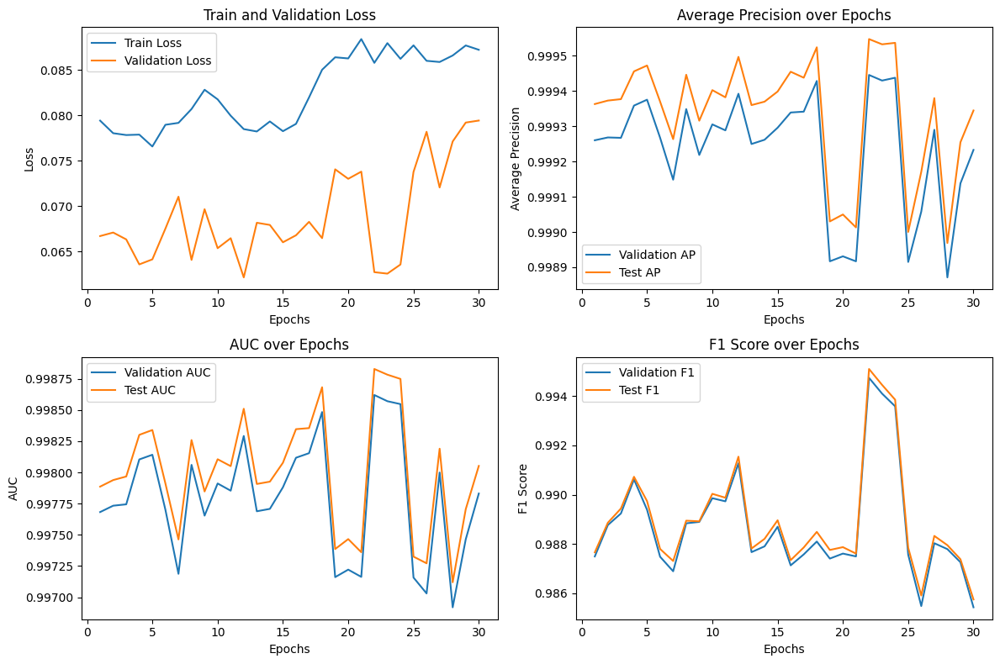

In [ ]:
#FNN classification model pre-trained with standard deviation, F1 and confusion matrices
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, average_precision_score, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import os
import numpy as np

# Load and preprocess new dataset (CICIDS2017)
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the model architecture
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Load the pre-trained model with adjusted input dimension
input_dim = X_tensor_new.shape[1]
model = SimpleNN(input_dim)

# Load only the layers that match in size
pretrained_dict = torch.load('/content/drive/MyDrive/TGN_invade_simple_nn_model.pth')
model_dict = model.state_dict()
# 1. Filter out unnecessary keys
pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and v.size() == model_dict[k].size()}
# 2. Overwrite entries in the existing state dict
model_dict.update(pretrained_dict)
# 3. Load the new state dict
model.load_state_dict(model_dict)

model.eval()

# Fine-tuning the model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Fine-tuning loop
num_epochs = 10
for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')

# Evaluation on the new dataset
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.squeeze().cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop with additional metrics
num_epochs = 30
train_losses = []
val_losses = []
val_precisions = []
val_recalls = []
val_f1s = []
val_accuracies = []
val_aps = []
val_aucs = []
test_precisions = []
test_recalls = []
test_f1s = []
test_accuracies = []
test_aps = []
test_aucs = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    val_precision = precision_score(val_labels, (val_outputs > 0.5).int(), zero_division=0)
    val_recall = recall_score(val_labels, (val_outputs > 0.5).int(), zero_division=0)
    val_f1 = f1_score(val_labels, (val_outputs > 0.5).int(), zero_division=0)
    val_accuracy = accuracy_score(val_labels, (val_outputs > 0.5).int())

    test_precision = precision_score(test_labels, (test_outputs > 0.5).int(), zero_division=0)
    test_recall = recall_score(test_labels, (test_outputs > 0.5).int(), zero_division=0)
    test_f1 = f1_score(test_labels, (test_outputs > 0.5).int(), zero_division=0)
    test_accuracy = accuracy_score(test_labels, (test_outputs > 0.5).int())

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_aps.append(val_ap)
    val_aucs.append(val_auc)
    val_precisions.append(val_precision)
    val_recalls.append(val_recall)
    val_f1s.append(val_f1)
    val_accuracies.append(val_accuracy)
    test_aps.append(test_ap)
    test_aucs.append(test_auc)
    test_precisions.append(test_precision)
    test_recalls.append(test_recall)
    test_f1s.append(test_f1)
    test_accuracies.append(test_accuracy)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}, Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Calculate standard deviation for metrics
val_precision_std = np.std(val_precisions)
val_recall_std = np.std(val_recalls)
val_f1_std = np.std(val_f1s)
val_accuracy_std = np.std(val_accuracies)
val_ap_std = np.std(val_aps)
val_auc_std = np.std(val_aucs)

test_precision_std = np.std(test_precisions)
test_recall_std = np.std(test_recalls)
test_f1_std = np.std(test_f1s)
test_accuracy_std = np.std(test_accuracies)
test_ap_std = np.std(test_aps)
test_auc_std = np.std(test_aucs)

print(f'Standard Deviation of Validation Precision: {val_precision_std:.4f}')
print(f'Standard Deviation of Validation Recall: {val_recall_std:.4f}')
print(f'Standard Deviation of Validation F1: {val_f1_std:.4f}')
print(f'Standard Deviation of Validation Accuracy: {val_accuracy_std:.4f}')
print(f'Standard Deviation of Validation AP: {val_ap_std:.4f}')
print(f'Standard Deviation of Validation AUC: {val_auc_std:.4f}')

print(f'Standard Deviation of Test Precision: {test_precision_std:.4f}')
print(f'Standard Deviation of Test Recall: {test_recall_std:.4f}')
print(f'Standard Deviation of Test F1: {test_f1_std:.4f}')
print(f'Standard Deviation of Test Accuracy: {test_accuracy_std:.4f}')
print(f'Standard Deviation of Test AP: {test_ap_std:.4f}')
print(f'Standard Deviation of Test AUC: {test_auc_std:.4f}')

# Save the trained attack detection model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_attack_detection_model.pth')

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 2, 2)
plt.plot(epochs, val_aps, label='Validation AP')
plt.plot(epochs, test_aps, label='Test AP')
plt.xlabel('Epochs')
plt.ylabel('Average Precision')
plt.legend()
plt.title('Average Precision over Epochs')

plt.subplot(2, 2, 3)
plt.plot(epochs, val_aucs, label='Validation AUC')
plt.plot(epochs, test_aucs, label='Test AUC')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.legend()
plt.title('AUC over Epochs')

plt.subplot(2, 2, 4)
plt.plot(epochs, val_f1s, label='Validation F1')
plt.plot(epochs, test_f1s, label='Test F1')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()
plt.title('F1 Score over Epochs')

plt.tight_layout()
plt.show()


In [ ]:
#FNN detection model pre-trained with standard deviation, F1 and confusion matrices
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import average_precision_score, roc_auc_score, precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import os
import numpy as np

# Load and preprocess new dataset (CICIDS2017)
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the model architecture
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Load the pre-trained model with adjusted input dimension
input_dim = X_tensor_new.shape[1]
model = SimpleNN(input_dim)

# Load only the layers that match in size
pretrained_dict = torch.load('/content/drive/MyDrive/TGN_invade_simple_nn_model.pth')
model_dict = model.state_dict()
# 1. Filter out unnecessary keys
pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and v.size() == model_dict[k].size()}
# 2. Overwrite entries in the existing state dict
model_dict.update(pretrained_dict)
# 3. Load the new state dict
model.load_state_dict(model_dict)

model.eval()

# Fine-tuning the model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Fine-tuning loop
num_epochs = 10
for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')

# Evaluation on the new dataset
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.squeeze().cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop
num_epochs = 25
train_losses = []
val_losses = []
val_aps = []
val_aucs = []
test_aps = []
test_aucs = []
val_precisions = []
val_recalls = []
val_f1s = []
val_accuracies = []
test_precisions = []
test_recalls = []
test_f1s = []
test_accuracies = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    val_precision = precision_score(val_labels, val_outputs.round(), average='binary', zero_division=0)
    val_recall = recall_score(val_labels, val_outputs.round(), average='binary', zero_division=0)
    val_f1 = f1_score(val_labels, val_outputs.round(), average='binary', zero_division=0)
    val_accuracy = accuracy_score(val_labels, val_outputs.round())

    test_precision = precision_score(test_labels, test_outputs.round(), average='binary', zero_division=0)
    test_recall = recall_score(test_labels, test_outputs.round(), average='binary', zero_division=0)
    test_f1 = f1_score(test_labels, test_outputs.round(), average='binary', zero_division=0)
    test_accuracy = accuracy_score(test_labels, test_outputs.round())

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_aps.append(val_ap)
    val_aucs.append(val_auc)
    test_aps.append(test_ap)
    test_aucs.append(test_auc)
    val_precisions.append(val_precision)
    val_recalls.append(val_recall)
    val_f1s.append(val_f1)
    val_accuracies.append(val_accuracy)
    test_precisions.append(test_precision)
    test_recalls.append(test_recall)
    test_f1s.append(test_f1)
    test_accuracies.append(test_accuracy)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')
    print(f'Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}')
    print(f'Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Save the trained attack detection model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_attack_detection_model.pth')

# Calculate standard deviation for metrics
val_precision_std = np.std(val_precisions)
val_recall_std = np.std(val_recalls)
val_f1_std = np.std(val_f1s)
val_accuracy_std = np.std(val_accuracies)

test_precision_std = np.std(test_precisions)
test_recall_std = np.std(test_recalls)
test_f1_std = np.std(test_f1s)
test_accuracy_std = np.std(test_accuracies)

print(f'Standard Deviation of Validation Precision: {val_precision_std:.4f}')
print(f'Standard Deviation of Validation Recall: {val_recall_std:.4f}')
print(f'Standard Deviation of Validation F1: {val_f1_std:.4f}')
print(f'Standard Deviation of Validation Accuracy: {val_accuracy_std:.4f}')

print(f'Standard Deviation of Test Precision: {test_precision_std:.4f}')
print(f'Standard Deviation of Test Recall: {test_recall_std:.4f}')
print(f'Standard Deviation of Test F1: {test_f1_std:.4f}')
print(f'Standard Deviation of Test Accuracy: {test_accuracy_std:.4f}')

# Confusion Matrix for validation set
val_pred_labels = val_outputs.round().numpy()
val_true_labels = val_labels.numpy()
val_conf_matrix = confusion_matrix(val_true_labels, val_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix).plot()
plt.title('Validation Confusion Matrix')
plt.show()

# Confusion Matrix for test set
test_pred_labels = test_outputs.round().numpy()
test_true_labels = test_labels.numpy()
test_conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=test_conf_matrix).plot()
plt.title('Test Confusion Matrix')
plt.show()

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(16, 12))

plt.subplot(2, 3, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 3, 2)
plt.plot(epochs, val_aps, label='Validation AP')
plt.plot(epochs, test_aps, label='Test AP')
plt.xlabel('Epochs')
plt.ylabel('Average Precision')
plt.legend()
plt.title('Average Precision over Epochs')

plt.subplot(2, 3, 3)
plt.plot(epochs, val_aucs, label='Validation AUC')
plt.plot(epochs, test_aucs, label='Test AUC')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.legend()
plt.title('AUC over Epochs')

plt.subplot(2, 3, 4)
plt.plot(epochs, val_precisions, label='Validation Precision')
plt.plot(epochs, test_precisions, label='Test Precision')
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.legend()
plt.title('Precision over Epochs')

plt.subplot(2, 3, 5)
plt.plot(epochs, val_recalls, label='Validation Recall')
plt.plot(epochs, test_recalls, label='Test Recall')
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.legend()
plt.title('Recall over Epochs')

plt.subplot(2, 3, 6)
plt.plot(epochs, val_f1s, label='Validation F1')
plt.plot(epochs, test_f1s, label='Test F1')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()
plt.title('F1 Score over Epochs')

plt.tight_layout()
plt.show()


Epoch: 01, Loss: 0.1049
Epoch: 02, Loss: 0.0828
Epoch: 03, Loss: 0.0777
Epoch: 04, Loss: 0.0765
Epoch: 05, Loss: 0.0738
Epoch: 06, Loss: 0.0735
Epoch: 07, Loss: 0.0729
Epoch: 08, Loss: 0.0716
Epoch: 09, Loss: 0.0717
Epoch: 10, Loss: 0.0728
Epoch: 01, Loss: 0.0732
Val AP: 0.9993, Val AUC: 0.9981
Test AP: 0.9995, Test AUC: 0.9983
Val Precision: 0.9892, Val Recall: 0.9912, Val F1: 0.9902, Val Accuracy: 0.9843
Test Precision: 0.9895, Test Recall: 0.9912, Test F1: 0.9904, Test Accuracy: 0.9845
Epoch: 02, Loss: 0.0807
Val AP: 0.9991, Val AUC: 0.9975
Test AP: 0.9992, Test AUC: 0.9978
Val Precision: 0.9911, Val Recall: 0.9888, Val F1: 0.9899, Val Accuracy: 0.9839
Test Precision: 0.9913, Test Recall: 0.9887, Test F1: 0.9900, Test Accuracy: 0.9839
Epoch: 03, Loss: 0.0818
Val AP: 0.9991, Val AUC: 0.9976
Test AP: 0.9993, Test AUC: 0.9979
Val Precision: 0.9896, Val Recall: 0.9886, Val F1: 0.9891, Val Accuracy: 0.9826
Test Precision: 0.9898, Test Recall: 0.9888, Test F1: 0.9893, Test Accuracy: 0.982

Epoch: 01, Loss: 0.1028
Epoch: 02, Loss: 0.0750
Epoch: 03, Loss: 0.0705
Epoch: 04, Loss: 0.0681
Epoch: 05, Loss: 0.0664
Epoch: 06, Loss: 0.0653
Epoch: 07, Loss: 0.0646
Epoch: 08, Loss: 0.0638
Epoch: 09, Loss: 0.0630
Epoch: 10, Loss: 0.0628
Epoch: 01, Loss: 0.0616
Val AP: 0.9994, Val AUC: 0.9977
Test AP: 0.9995, Test AUC: 0.9978
Epoch: 02, Loss: 0.0616
Val AP: 0.9995, Val AUC: 0.9980
Test AP: 0.9995, Test AUC: 0.9980
Epoch: 03, Loss: 0.0605
Val AP: 0.9995, Val AUC: 0.9979
Test AP: 0.9995, Test AUC: 0.9979
Epoch: 04, Loss: 0.0603
Val AP: 0.9995, Val AUC: 0.9979
Test AP: 0.9995, Test AUC: 0.9980
Epoch: 05, Loss: 0.0597
Val AP: 0.9995, Val AUC: 0.9978
Test AP: 0.9995, Test AUC: 0.9979
Epoch: 06, Loss: 0.0596
Val AP: 0.9995, Val AUC: 0.9980
Test AP: 0.9995, Test AUC: 0.9981
Epoch: 07, Loss: 0.0592
Val AP: 0.9995, Val AUC: 0.9980
Test AP: 0.9995, Test AUC: 0.9981
Epoch: 08, Loss: 0.0589
Val AP: 0.9996, Val AUC: 0.9982
Test AP: 0.9996, Test AUC: 0.9982
Epoch: 09, Loss: 0.0584
Val AP: 0.9996, 

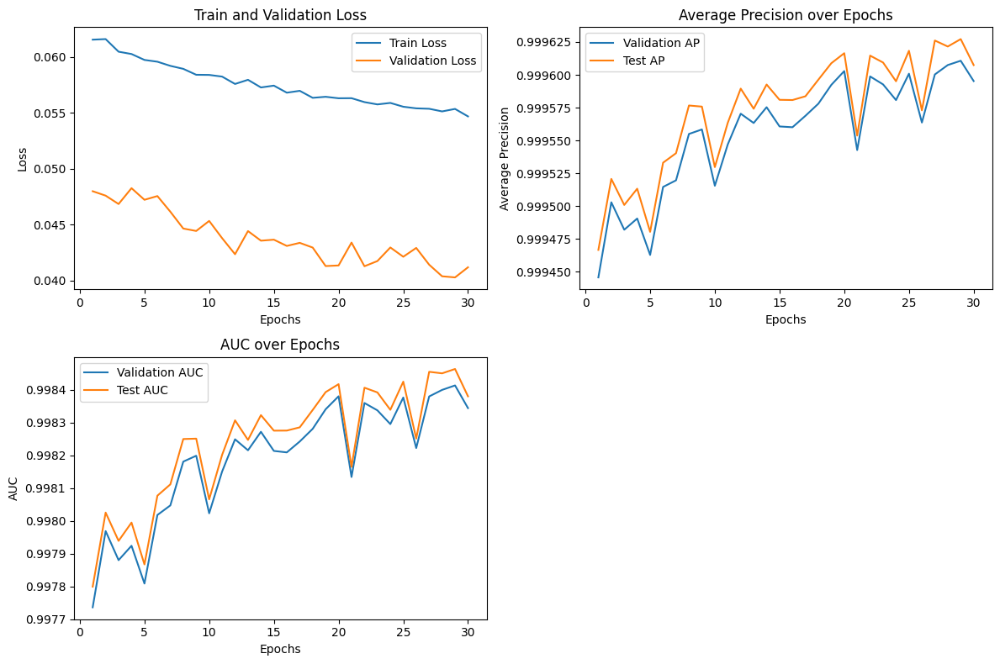

In [ ]:
#FNN enhanced from FNN model pre-trained
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import average_precision_score, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import os
import numpy as np

# Load and preprocess new dataset (CICIDS2017)
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the Quantum Neural Network (QNN) model
class QuantumLayer(torch.nn.Module):
    def __init__(self, input_dim, output_dim):
        super(QuantumLayer, self).__init__()
        self.linear = torch.nn.Linear(input_dim, output_dim)

    def forward(self, x):
        x = self.linear(x)
        x = torch.sin(x)  # Apply a quantum-inspired non-linearity
        return x

class QuantumNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(QuantumNN, self).__init__()
        self.q_layer1 = QuantumLayer(input_dim, 128)
        self.q_layer2 = QuantumLayer(128, 64)
        self.fc = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)
        self.batch_norm1 = torch.nn.BatchNorm1d(128)
        self.batch_norm2 = torch.nn.BatchNorm1d(64)

    def forward(self, x):
        x = torch.relu(self.batch_norm1(self.q_layer1(x)))
        x = self.dropout(x)
        x = torch.relu(self.batch_norm2(self.q_layer2(x)))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc(x))
        return x

# Load the pre-trained model with adjusted input dimension
input_dim = X_tensor_new.shape[1]
model = QuantumNN(input_dim)

#Load only the layers that match in size
pretrained_dict = torch.load('/content/drive/MyDrive/QNN-TGN_invade_simple_nn_model.pth')
model_dict = model.state_dict()
# 1. Filter out unnecessary keys
pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and v.size() == model_dict[k].size()}
# 2. Overwrite entries in the existing state dict
model_dict.update(pretrained_dict)
# 3. Load the new state dict
model.load_state_dict(model_dict)

model.eval()

# Fine-tuning the model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Fine-tuning loop
num_epochs = 10
for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')

# Evaluation on the new dataset
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.squeeze().cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop
num_epochs = 30
train_losses = []
val_losses = []
val_aps = []
val_aucs = []
test_aps = []
test_aucs = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_aps.append(val_ap)
    val_aucs.append(val_auc)
    test_aps.append(test_ap)
    test_aucs.append(test_auc)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

# Save the trained attack detection model
torch.save(model.state_dict(), '/content/drive/MyDrive/QNN-TGN_attack_detection_model.pth')

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 2, 2)
plt.plot(epochs, val_aps, label='Validation AP')
plt.plot(epochs, test_aps, label='Test AP')
plt.xlabel('Epochs')
plt.ylabel('Average Precision')
plt.legend()
plt.title('Average Precision over Epochs')

plt.subplot(2, 2, 3)
plt.plot(epochs, val_aucs, label='Validation AUC')
plt.plot(epochs, test_aucs, label='Test AUC')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.legend()
plt.title('AUC over Epochs')

plt.tight_layout()
plt.show()


Epoch: 01, Loss: 0.1035
Epoch: 02, Loss: 0.0760
Epoch: 03, Loss: 0.0712
Epoch: 04, Loss: 0.0689
Epoch: 05, Loss: 0.0670
Epoch: 06, Loss: 0.0651
Epoch: 07, Loss: 0.0642
Epoch: 08, Loss: 0.0635
Epoch: 09, Loss: 0.0627
Epoch: 10, Loss: 0.0619
Epoch: 01, Loss: 0.0618
Val AP: 0.9995, Val AUC: 0.9978
Val Precision: 0.9897, Val Recall: 0.9870, Val F1: 0.9883, Val Accuracy: 0.9813
Test AP: 0.9995, Test AUC: 0.9979
Test Precision: 0.9898, Test Recall: 0.9871, Test F1: 0.9885, Test Accuracy: 0.9815
Epoch: 02, Loss: 0.0609
Val AP: 0.9995, Val AUC: 0.9980
Val Precision: 0.9829, Val Recall: 0.9905, Val F1: 0.9867, Val Accuracy: 0.9785
Test AP: 0.9995, Test AUC: 0.9980
Test Precision: 0.9832, Test Recall: 0.9904, Test F1: 0.9868, Test Accuracy: 0.9787
Epoch: 03, Loss: 0.0603
Val AP: 0.9994, Val AUC: 0.9978
Val Precision: 0.9924, Val Recall: 0.9798, Val F1: 0.9861, Val Accuracy: 0.9778
Test AP: 0.9995, Test AUC: 0.9979
Test Precision: 0.9926, Test Recall: 0.9802, Test F1: 0.9864, Test Accuracy: 0.978

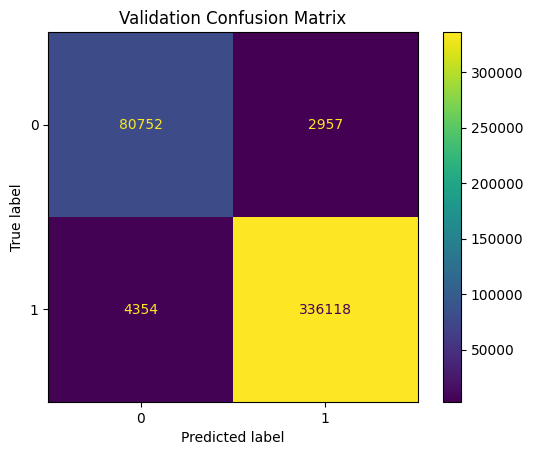

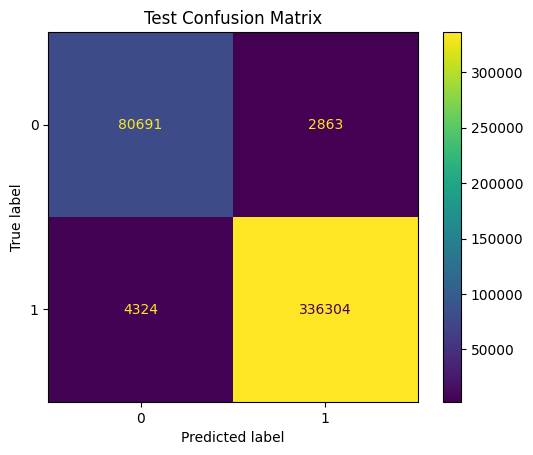

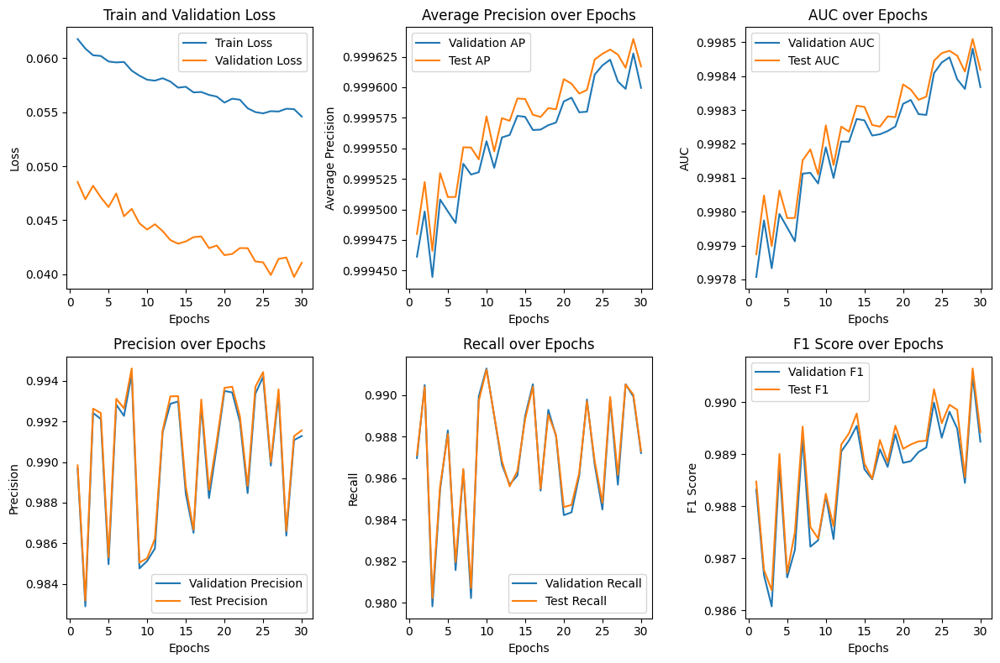

In [ ]:
#QNN enhanced FNN model pre-trained
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import average_precision_score, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import os
import numpy as np

# Load and preprocess new dataset (CICIDS2017)
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the Quantum Neural Network (QNN) model
class QuantumLayer(torch.nn.Module):
    def __init__(self, input_dim, output_dim):
        super(QuantumLayer, self).__init__()
        self.linear = torch.nn.Linear(input_dim, output_dim)

    def forward(self, x):
        x = self.linear(x)
        x = torch.sin(x)  # Apply a quantum-inspired non-linearity
        return x

class QuantumNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(QuantumNN, self).__init__()
        self.q_layer1 = QuantumLayer(input_dim, 128)
        self.q_layer2 = QuantumLayer(128, 64)
        self.fc = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)
        self.batch_norm1 = torch.nn.BatchNorm1d(128)
        self.batch_norm2 = torch.nn.BatchNorm1d(64)

    def forward(self, x):
        x = torch.relu(self.batch_norm1(self.q_layer1(x)))
        x = self.dropout(x)
        x = torch.relu(self.batch_norm2(self.q_layer2(x)))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc(x))
        return x

# Load the pre-trained model with adjusted input dimension
input_dim = X_tensor_new.shape[1]
model = QuantumNN(input_dim)

# Load only the layers that match in size
pretrained_dict = torch.load('/content/drive/MyDrive/QNN-TGN_invade_simple_nn_model.pth')
model_dict = model.state_dict()
# 1. Filter out unnecessary keys
pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and v.size() == model_dict[k].size()}
# 2. Overwrite entries in the existing state dict
model_dict.update(pretrained_dict)
# 3. Load the new state dict
model.load_state_dict(model_dict)

model.eval()

# Fine-tuning the model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Fine-tuning loop
num_epochs = 10
for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')

# Evaluation on the new dataset
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.squeeze().cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop
num_epochs = 30
train_losses = []
val_losses = []
val_aps = []
val_aucs = []
val_precisions = []
val_recalls = []
val_f1s = []
val_accuracies = []
test_aps = []
test_aucs = []
test_precisions = []
test_recalls = []
test_f1s = []
test_accuracies = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    val_precision = precision_score(val_labels, val_outputs.round(), average='binary')
    val_recall = recall_score(val_labels, val_outputs.round(), average='binary')
    val_f1 = f1_score(val_labels, val_outputs.round(), average='binary')
    val_accuracy = accuracy_score(val_labels, val_outputs.round())

    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)
    test_precision = precision_score(test_labels, test_outputs.round(), average='binary')
    test_recall = recall_score(test_labels, test_outputs.round(), average='binary')
    test_f1 = f1_score(test_labels, test_outputs.round(), average='binary')
    test_accuracy = accuracy_score(test_labels, test_outputs.round())

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_aps.append(val_ap)
    val_aucs.append(val_auc)
    val_precisions.append(val_precision)
    val_recalls.append(val_recall)
    val_f1s.append(val_f1)
    val_accuracies.append(val_accuracy)
    test_aps.append(test_ap)
    test_aucs.append(test_auc)
    test_precisions.append(test_precision)
    test_recalls.append(test_recall)
    test_f1s.append(test_f1)
    test_accuracies.append(test_accuracy)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')
    print(f'Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Calculate standard deviation for metrics
val_precision_std = np.std(val_precisions)
val_recall_std = np.std(val_recalls)
val_f1_std = np.std(val_f1s)
val_accuracy_std = np.std(val_accuracies)

test_precision_std = np.std(test_precisions)
test_recall_std = np.std(test_recalls)
test_f1_std = np.std(test_f1s)
test_accuracy_std = np.std(test_accuracies)

print(f'Standard Deviation of Validation Precision: {val_precision_std:.4f}')
print(f'Standard Deviation of Validation Recall: {val_recall_std:.4f}')
print(f'Standard Deviation of Validation F1: {val_f1_std:.4f}')
print(f'Standard Deviation of Validation Accuracy: {val_accuracy_std:.4f}')

print(f'Standard Deviation of Test Precision: {test_precision_std:.4f}')
print(f'Standard Deviation of Test Recall: {test_recall_std:.4f}')
print(f'Standard Deviation of Test F1: {test_f1_std:.4f}')
print(f'Standard Deviation of Test Accuracy: {test_accuracy_std:.4f}')

# Confusion Matrix for validation set
val_pred_labels = val_outputs.round().numpy()
val_true_labels = val_labels.numpy()
val_conf_matrix = confusion_matrix(val_true_labels, val_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix).plot()
plt.title('Validation Confusion Matrix')
plt.show()

# Confusion Matrix for test set
test_pred_labels = test_outputs.round().numpy()
test_true_labels = test_labels.numpy()
test_conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=test_conf_matrix).plot()
plt.title('Test Confusion Matrix')
plt.show()

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 3, 2)
plt.plot(epochs, val_aps, label='Validation AP')
plt.plot(epochs, test_aps, label='Test AP')
plt.xlabel('Epochs')
plt.ylabel('Average Precision')
plt.legend()
plt.title('Average Precision over Epochs')

plt.subplot(2, 3, 3)
plt.plot(epochs, val_aucs, label='Validation AUC')
plt.plot(epochs, test_aucs, label='Test AUC')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.legend()
plt.title('AUC over Epochs')

plt.subplot(2, 3, 4)
plt.plot(epochs, val_precisions, label='Validation Precision')
plt.plot(epochs, test_precisions, label='Test Precision')
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.legend()
plt.title('Precision over Epochs')

plt.subplot(2, 3, 5)
plt.plot(epochs, val_recalls, label='Validation Recall')
plt.plot(epochs, test_recalls, label='Test Recall')
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.legend()
plt.title('Recall over Epochs')

plt.subplot(2, 3, 6)
plt.plot(epochs, val_f1s, label='Validation F1')
plt.plot(epochs, test_f1s, label='Test F1')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()
plt.title('F1 Score over Epochs')

plt.tight_layout()
plt.show()

# Save the trained detection model
torch.save(detection_model.state_dict(), '/content/drive/MyDrive/TGN_attack_detection_model.pth')
print("Detection model saved.")


Files in the directory:
['Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv', 'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv', 'Friday-WorkingHours-Morning.pcap_ISCX.csv', 'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv', 'Monday-WorkingHours.pcap_ISCX.csv', 'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv', 'Tuesday-WorkingHours.pcap_ISCX.csv', 'Wednesday-workingHours.pcap_ISCX.csv']
Columns in the dataset:
Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd

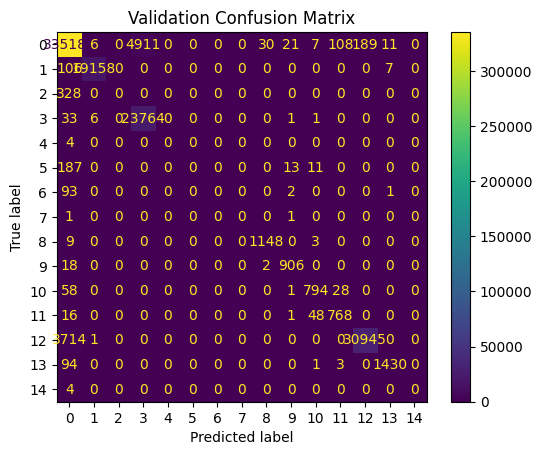

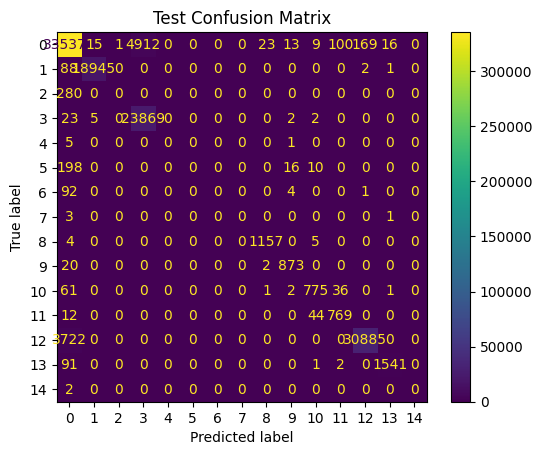

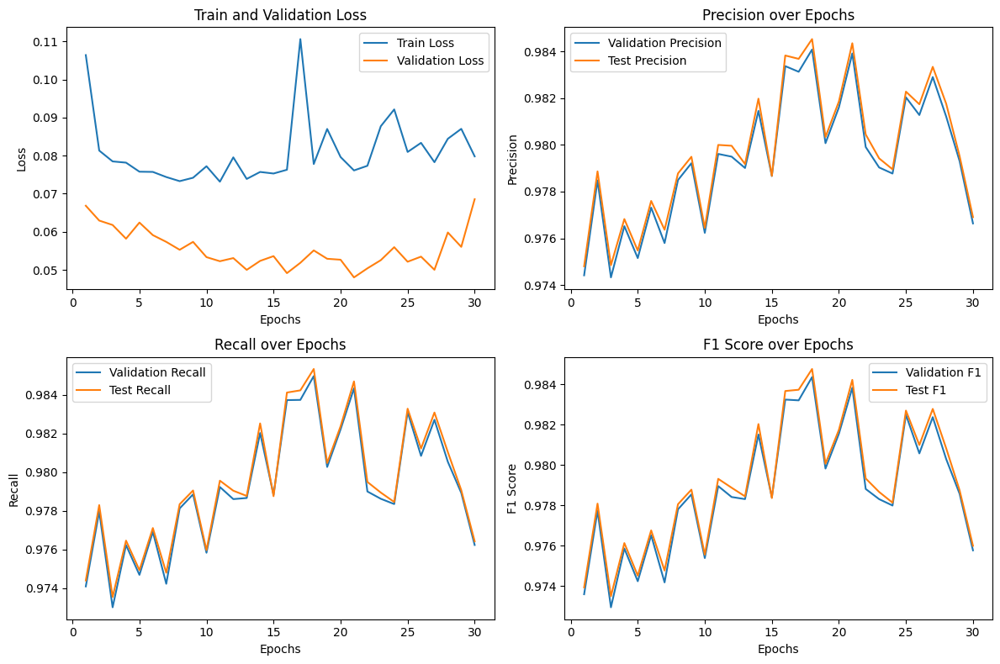

In [ ]:
#First FNN classification model
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import os
import numpy as np

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Verify files are present
print("Files in the directory:")
print(os.listdir(data_path))

data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Strip any leading/trailing whitespace characters from the column names
data.columns = data.columns.str.strip()

# Check column names
print("Columns in the dataset:")
print(data.columns)

# Drop columns that won't be used for training (like non-numeric features)
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
columns_to_drop = [col.strip() for col in columns_to_drop if col.strip() in data.columns]
data = data.drop(columns=columns_to_drop)

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Ensure all columns are numeric
print("Data types after converting categorical columns:")
print(data.dtypes)

# Handle infinity or extremely large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
print("Label columns identified:", label_columns)

# Combine one-hot encoded label columns into a single target column
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])

# Drop the individual label columns
data = data.drop(columns=label_columns)

# Convert target to numeric encoding
target = pd.factorize(data['Label'])[0]

# Separate features and target
features = data.drop(columns=['Label'])
target = pd.Series(target)

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.long)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64

train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the model, loss function, and optimizer
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim, output_dim):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, output_dim)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)  # Output layer without activation (since CrossEntropyLoss expects raw logits)
        return x

input_dim = X_tensor.shape[1]
output_dim = len(pd.unique(target))
model = SimpleNN(input_dim, output_dim)
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Evaluation function modified to return predictions and labels
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop
num_epochs = 30
train_losses = []
val_losses = []
val_precisions = []
val_recalls = []
val_f1s = []
val_accuracies = []
test_precisions = []
test_recalls = []
test_f1s = []
test_accuracies = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_precision = precision_score(val_labels, val_outputs.argmax(dim=1), average='weighted', zero_division=0)
    val_recall = recall_score(val_labels, val_outputs.argmax(dim=1), average='weighted', zero_division=0)
    val_f1 = f1_score(val_labels, val_outputs.argmax(dim=1), average='weighted', zero_division=0)
    val_accuracy = accuracy_score(val_labels, val_outputs.argmax(dim=1))

    test_precision = precision_score(test_labels, test_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_recall = recall_score(test_labels, test_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_f1 = f1_score(test_labels, test_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_accuracy = accuracy_score(test_labels, test_outputs.argmax(dim=1))

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_precisions.append(val_precision)
    val_recalls.append(val_recall)
    val_f1s.append(val_f1)
    val_accuracies.append(val_accuracy)
    test_precisions.append(test_precision)
    test_recalls.append(test_recall)
    test_f1s.append(test_f1)
    test_accuracies.append(test_accuracy)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}')
    print(f'Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Save the trained attack detection model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_classification_model.pth')

# Confusion Matrix for validation set
val_pred_labels = val_outputs.argmax(dim=1).numpy()
val_true_labels = val_labels.numpy()
val_conf_matrix = confusion_matrix(val_true_labels, val_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix).plot()
plt.title('Validation Confusion Matrix')
plt.show()

# Confusion Matrix for test set
test_pred_labels = test_outputs.argmax(dim=1).numpy()
test_true_labels = test_labels.numpy()
test_conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=test_conf_matrix).plot()
plt.title('Test Confusion Matrix')
plt.show()

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 2, 2)
plt.plot(epochs, val_precisions, label='Validation Precision')
plt.plot(epochs, test_precisions, label='Test Precision')
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.legend()
plt.title('Precision over Epochs')

plt.subplot(2, 2, 3)
plt.plot(epochs, val_recalls, label='Validation Recall')
plt.plot(epochs, test_recalls, label='Test Recall')
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.legend()
plt.title('Recall over Epochs')

plt.subplot(2, 2, 4)
plt.plot(epochs, val_f1s, label='Validation F1')
plt.plot(epochs, test_f1s, label='Test F1')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()
plt.title('F1 Score over Epochs')

plt.tight_layout()
plt.show()


Epoch: 01, Loss: 0.1292
Val Precision: 0.9706, Val Recall: 0.9703, Val F1: 0.9695, Val Accuracy: 0.9703
Test Precision: 0.9711, Test Recall: 0.9707, Test F1: 0.9700, Test Accuracy: 0.9707
Epoch: 02, Loss: 0.0963
Val Precision: 0.9717, Val Recall: 0.9713, Val F1: 0.9704, Val Accuracy: 0.9713
Test Precision: 0.9721, Test Recall: 0.9716, Test F1: 0.9708, Test Accuracy: 0.9716
Epoch: 03, Loss: 0.0900
Val Precision: 0.9731, Val Recall: 0.9724, Val F1: 0.9718, Val Accuracy: 0.9724
Test Precision: 0.9733, Test Recall: 0.9725, Test F1: 0.9720, Test Accuracy: 0.9725
Epoch: 04, Loss: 0.0867
Val Precision: 0.9732, Val Recall: 0.9726, Val F1: 0.9720, Val Accuracy: 0.9726
Test Precision: 0.9734, Test Recall: 0.9727, Test F1: 0.9721, Test Accuracy: 0.9727
Epoch: 05, Loss: 0.0844
Val Precision: 0.9749, Val Recall: 0.9746, Val F1: 0.9741, Val Accuracy: 0.9746
Test Precision: 0.9753, Test Recall: 0.9749, Test F1: 0.9744, Test Accuracy: 0.9749
Epoch: 06, Loss: 0.0824
Val Precision: 0.9743, Val Recall: 0

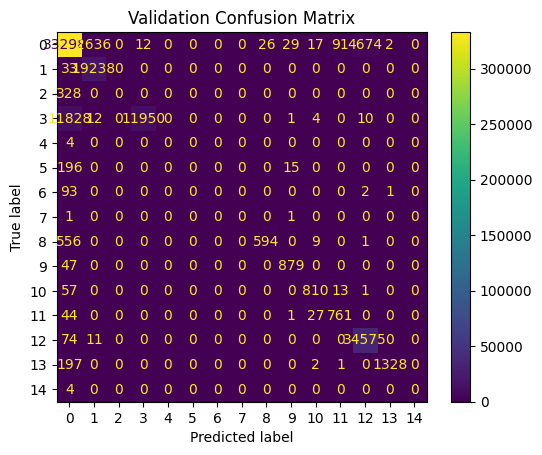

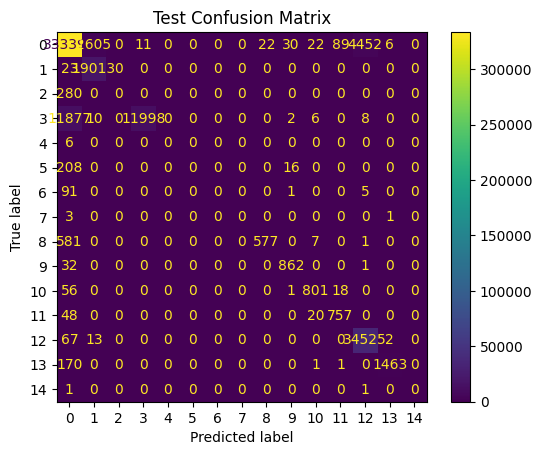

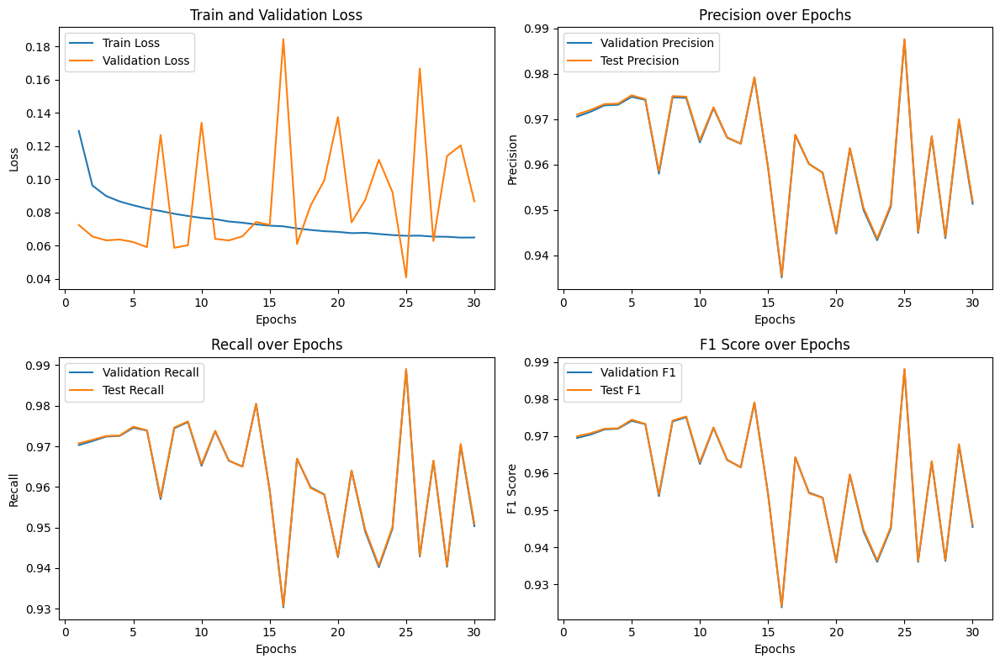

In [ ]:
#Second FNN classification model
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Strip any leading/trailing whitespace characters from the column names
data.columns = data.columns.str.strip()

# Drop columns that won't be used for training (like non-numeric features)
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
columns_to_drop = [col.strip() for col in columns_to_drop if col.strip() in data.columns]
data = data.drop(columns=columns_to_drop)

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Handle infinity or extremely large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify the target columns
label_columns = [col for col in data.columns if 'Label_' in col]

# Combine one-hot encoded label columns into a single target column
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])

# Map the labels to unique integers for multi-class classification
label_mapping = {label: idx for idx, label in enumerate(data['Label'].unique())}
data['Label'] = data['Label'].map(label_mapping)

# Drop the individual label columns
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.long)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64

train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the model, loss function, and optimizer
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)
        self.batch_norm1 = torch.nn.BatchNorm1d(128)
        self.batch_norm2 = torch.nn.BatchNorm1d(64)

    def forward(self, x):
        x = torch.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = torch.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

input_dim = X_tensor.shape[1]
num_classes = len(label_mapping)
model = SimpleNN(input_dim, num_classes)
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Training function
def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function modified to return predictions and labels
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop with standard deviation calculation
num_epochs = 30
train_losses = []
val_losses = []
val_precisions = []
val_recalls = []
val_f1s = []
val_accuracies = []
test_precisions = []
test_recalls = []
test_f1s = []
test_accuracies = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_pred = val_outputs.argmax(dim=1)
    test_pred = test_outputs.argmax(dim=1)

    val_precision = precision_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_recall = recall_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_f1 = f1_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_accuracy = accuracy_score(val_labels, val_pred)

    test_precision = precision_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_recall = recall_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_accuracy = accuracy_score(test_labels, test_pred)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_precisions.append(val_precision)
    val_recalls.append(val_recall)
    val_f1s.append(val_f1)
    val_accuracies.append(val_accuracy)
    test_precisions.append(test_precision)
    test_recalls.append(test_recall)
    test_f1s.append(test_f1)
    test_accuracies.append(test_accuracy)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}')
    print(f'Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Calculate standard deviation for metrics
val_precision_std = np.std(val_precisions)
val_recall_std = np.std(val_recalls)
val_f1_std = np.std(val_f1s)
val_accuracy_std = np.std(val_accuracies)

test_precision_std = np.std(test_precisions)
test_recall_std = np.std(test_recalls)
test_f1_std = np.std(test_f1s)
test_accuracy_std = np.std(test_accuracies)

print(f'Standard Deviation of Validation Precision: {val_precision_std:.4f}')
print(f'Standard Deviation of Validation Recall: {val_recall_std:.4f}')
print(f'Standard Deviation of Validation F1: {val_f1_std:.4f}')
print(f'Standard Deviation of Validation Accuracy: {val_accuracy_std:.4f}')

print(f'Standard Deviation of Test Precision: {test_precision_std:.4f}')
print(f'Standard Deviation of Test Recall: {test_recall_std:.4f}')
print(f'Standard Deviation of Test F1: {test_f1_std:.4f}')
print(f'Standard Deviation of Test Accuracy: {test_accuracy_std:.4f}')
print(f'Standard Deviation of Test Accuracy: {test_accuracy_std:.4f}')

# Confusion Matrix for validation set
val_pred_labels = val_outputs.argmax(dim=1).numpy()
val_true_labels = val_labels.numpy()
val_conf_matrix = confusion_matrix(val_true_labels, val_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix).plot()
plt.title('Validation Confusion Matrix')
plt.show()

# Confusion Matrix for test set
test_pred_labels = test_outputs.argmax(dim=1).numpy()
test_true_labels = test_labels.numpy()
test_conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=test_conf_matrix).plot()
plt.title('Test Confusion Matrix')
plt.show()

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 2, 2)
plt.plot(epochs, val_precisions, label='Validation Precision')
plt.plot(epochs, test_precisions, label='Test Precision')
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.legend()
plt.title('Precision over Epochs')

plt.subplot(2, 2, 3)
plt.plot(epochs, val_recalls, label='Validation Recall')
plt.plot(epochs, test_recalls, label='Test Recall')
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.legend()
plt.title('Recall over Epochs')

plt.subplot(2, 2, 4)
plt.plot(epochs, val_f1s, label='Validation F1')
plt.plot(epochs, test_f1s, label='Test F1')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()
plt.title('F1 Score over Epochs')

plt.tight_layout()
plt.show()


In [ ]:
#Second FNN classification model
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Strip any leading/trailing whitespace characters from the column names
data.columns = data.columns.str.strip()

# Drop columns that won't be used for training (like non-numeric features)
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
columns_to_drop = [col.strip() for col in columns_to_drop if col.strip() in data.columns]
data = data.drop(columns=columns_to_drop)

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Handle infinity or extremely large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify the target columns
label_columns = [col for col in data.columns if 'Label_' in col]

# Combine one-hot encoded label columns into a single target column
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])

# Map the labels to numeric values for multi-class classification
data['Label'] = pd.factorize(data['Label'])[0]

# Drop the individual label columns
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.long)  # Note: Use long for multi-class classification

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64

train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the model, loss function, and optimizer
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)  # Adjust output layer size based on number of classes
        self.dropout = torch.nn.Dropout(0.5)
        self.batch_norm1 = torch.nn.BatchNorm1d(128)
        self.batch_norm2 = torch.nn.BatchNorm1d(64)

    def forward(self, x):
        x = torch.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = torch.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        x = self.fc3(x)  # Output layer without activation (since CrossEntropyLoss expects raw logits)
        return x

input_dim = X_tensor.shape[1]
num_classes = len(set(target))  # Determine the number of classes
model = SimpleNN(input_dim, num_classes)

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5)

# Training function
def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function modified to return predictions and labels
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop with learning rate scheduler
num_epochs = 30
train_losses = []
val_losses = []
val_precisions = []
val_recalls = []
val_f1s = []
val_accuracies = []
test_precisions = []
test_recalls = []
test_f1s = []
test_accuracies = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_pred = val_outputs.argmax(dim=1)
    test_pred = test_outputs.argmax(dim=1)

    val_precision = precision_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_recall = recall_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_f1 = f1_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_accuracy = accuracy_score(val_labels, val_pred)

    test_precision = precision_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_recall = recall_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_accuracy = accuracy_score(test_labels, test_pred)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_precisions.append(val_precision)
    val_recalls.append(val_recall)
    val_f1s.append(val_f1)
    val_accuracies.append(val_accuracy)
    test_precisions.append(test_precision)
    test_recalls.append(test_recall)
    test_f1s.append(test_f1)
    test_accuracies.append(test_accuracy)

    scheduler.step(val_loss)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}')
    print(f'Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Calculate standard deviation for metrics
val_precision_std = np.std(val_precisions)
val_recall_std = np.std(val_recalls)
val_f1_std = np.std(val_f1s)
val_accuracy_std = np.std(val_accuracies)

test_precision_std = np.std(test_precisions)
test_recall_std = np.std(test_recalls)
test_f1_std = np.std(test_f1s)
test_accuracy_std = np.std(test_accuracies)

print(f'Standard Deviation of Validation Precision: {val_precision_std:.4f}')
print(f'Standard Deviation of Validation Recall: {val_recall_std:.4f}')
print(f'Standard Deviation of Validation F1: {val_f1_std:.4f}')
print(f'Standard Deviation of Validation Accuracy: {val_accuracy_std:.4f}')

print(f'Standard Deviation of Test Precision: {test_precision_std:.4f}')
print(f'Standard Deviation of Test Recall: {test_recall_std:.4f}')
print(f'Standard Deviation of Test F1: {test_f1_std:.4f}')
print(f'Standard Deviation of Test Accuracy: {test_accuracy_std:.4f}')

# Confusion Matrix for validation set
val_pred_labels = val_outputs.argmax(dim=1).numpy()
val_true_labels = val_labels.numpy()
val_conf_matrix = confusion_matrix(val_true_labels, val_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix).plot()
plt.title('Validation Confusion Matrix')
plt.show()

# Confusion Matrix for test set
test_pred_labels = test_outputs.argmax(dim=1).numpy()
test_true_labels = test_labels.numpy()
test_conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=test_conf_matrix).plot()
plt.title('Test Confusion Matrix')
plt.show()

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 2, 2)
plt.plot(epochs, val_precisions, label='Validation Precision')
plt.plot(epochs, test_precisions, label='Test Precision')
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.legend()
plt.title('Precision over Epochs')

plt.subplot(2, 2, 3)
plt.plot(epochs, val_recalls, label='Validation Recall')
plt.plot(epochs, test_recalls, label='Test Recall')
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.legend()
plt.title('Recall over Epochs')

plt.subplot(2, 2, 4)
plt.plot(epochs, val_f1s, label='Validation F1')
plt.plot(epochs, test_f1s, label='Test F1')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()
plt.title('F1 Score over Epochs')

plt.tight_layout()
plt.show()


Epoch: 01, Loss: 0.1296
Val Precision: 0.9712, Val Recall: 0.9708, Val F1: 0.9699, Val Accuracy: 0.9708
Test Precision: 0.9715, Test Recall: 0.9711, Test F1: 0.9703, Test Accuracy: 0.9711
Epoch: 02, Loss: 0.0960
Val Precision: 0.9706, Val Recall: 0.9698, Val F1: 0.9689, Val Accuracy: 0.9698
Test Precision: 0.9709, Test Recall: 0.9700, Test F1: 0.9692, Test Accuracy: 0.9700
Epoch: 03, Loss: 0.0905
Val Precision: 0.9711, Val Recall: 0.9698, Val F1: 0.9694, Val Accuracy: 0.9698
Test Precision: 0.9713, Test Recall: 0.9699, Test F1: 0.9695, Test Accuracy: 0.9699
Epoch: 04, Loss: 0.0861
Val Precision: 0.9708, Val Recall: 0.9699, Val F1: 0.9693, Val Accuracy: 0.9699
Test Precision: 0.9710, Test Recall: 0.9700, Test F1: 0.9694, Test Accuracy: 0.9700
Epoch: 05, Loss: 0.0831
Val Precision: 0.9736, Val Recall: 0.9749, Val F1: 0.9740, Val Accuracy: 0.9749
Test Precision: 0.9737, Test Recall: 0.9750, Test F1: 0.9740, Test Accuracy: 0.9750
Epoch: 06, Loss: 0.0802
Val Precision: 0.9753, Val Recall: 0

Epoch: 01, Loss: 0.1286
Val Precision: 0.9682, Val Recall: 0.9663, Val F1: 0.9655, Val Accuracy: 0.9663, Val ROC AUC: 0.9960
Test Precision: 0.9687, Test Recall: 0.9668, Test F1: 0.9659, Test Accuracy: 0.9668, Test ROC AUC: 0.9961
Epoch: 02, Loss: 0.0965
Val Precision: 0.9711, Val Recall: 0.9693, Val F1: 0.9691, Val Accuracy: 0.9693, Val ROC AUC: 0.9960
Test Precision: 0.9713, Test Recall: 0.9695, Test F1: 0.9693, Test Accuracy: 0.9695, Test ROC AUC: 0.9961
Epoch: 03, Loss: 0.0903
Val Precision: 0.9727, Val Recall: 0.9723, Val F1: 0.9719, Val Accuracy: 0.9723, Val ROC AUC: 0.9973
Test Precision: 0.9733, Test Recall: 0.9728, Test F1: 0.9724, Test Accuracy: 0.9728, Test ROC AUC: 0.9974
Epoch: 04, Loss: 0.0870
Val Precision: 0.9731, Val Recall: 0.9728, Val F1: 0.9721, Val Accuracy: 0.9728, Val ROC AUC: 0.9974
Test Precision: 0.9734, Test Recall: 0.9730, Test F1: 0.9723, Test Accuracy: 0.9730, Test ROC AUC: 0.9975
Epoch: 05, Loss: 0.0837
Val Precision: 0.9731, Val Recall: 0.9728, Val F1: 0

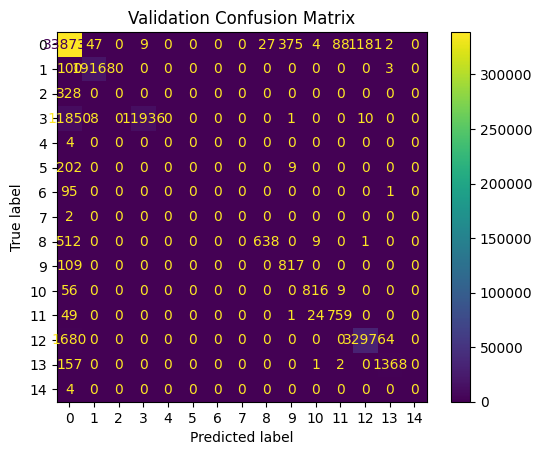

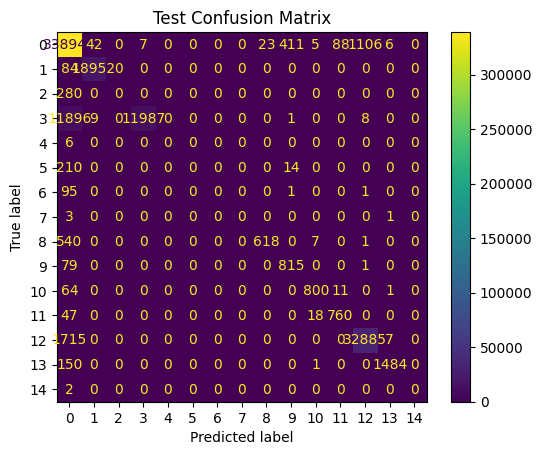

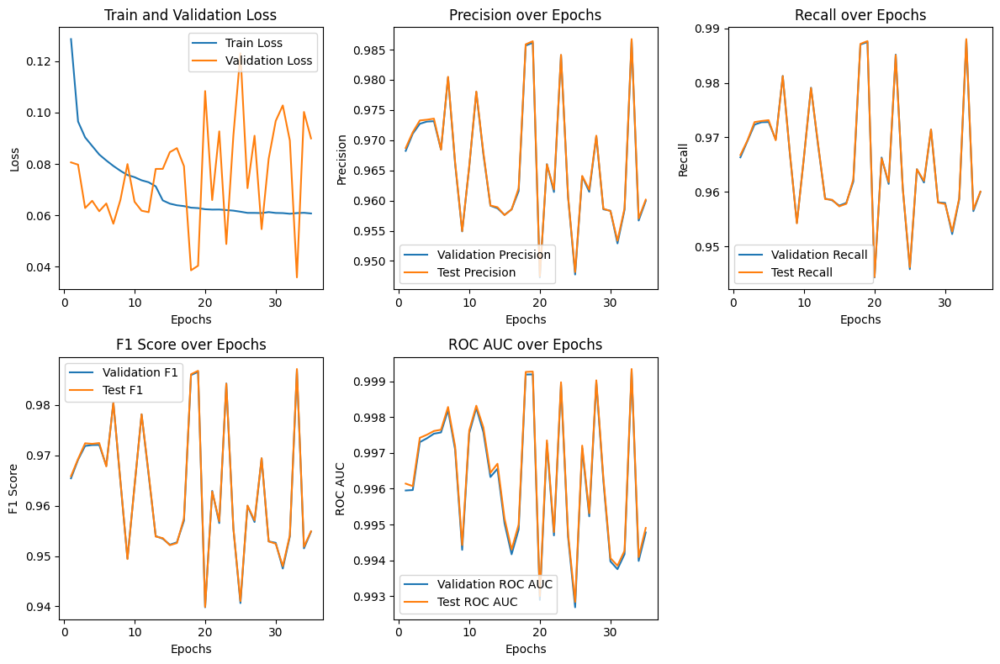

In [ ]:
# FNN Classification model
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Strip any leading/trailing whitespace characters from the column names
data.columns = data.columns.str.strip()

# Drop columns that won't be used for training (like non-numeric features)
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
columns_to_drop = [col.strip() for col in columns_to_drop if col.strip() in data.columns]
data = data.drop(columns=columns_to_drop)

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Handle infinity or extremely large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify the target columns
label_columns = [col for col in data.columns if 'Label_' in col]

# Combine one-hot encoded label columns into a single target column
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])

# Map the labels to numeric values for multi-class classification
data['Label'] = pd.factorize(data['Label'])[0]

# Drop the individual label columns
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.long)  # Note: Use long for multi-class classification

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64

train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the model, loss function, and optimizer
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)  # Adjust output layer size based on number of classes
        self.dropout = torch.nn.Dropout(0.5)
        self.batch_norm1 = torch.nn.BatchNorm1d(128)
        self.batch_norm2 = torch.nn.BatchNorm1d(64)

    def forward(self, x):
        x = torch.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = torch.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        x = self.fc3(x)  # Output layer without activation (since CrossEntropyLoss expects raw logits)
        return x

input_dim = X_tensor.shape[1]
num_classes = len(set(target))  # Determine the number of classes
model = SimpleNN(input_dim, num_classes)

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5)

# Training function
def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function modified to return predictions and labels
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop with learning rate scheduler
num_epochs = 35
train_losses = []
val_losses = []
val_precisions = []
val_recalls = []
val_f1s = []
val_accuracies = []
val_roc_aucs = []
test_precisions = []
test_recalls = []
test_f1s = []
test_accuracies = []
test_roc_aucs = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_pred = val_outputs.argmax(dim=1)
    test_pred = test_outputs.argmax(dim=1)

    val_precision = precision_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_recall = recall_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_f1 = f1_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_accuracy = accuracy_score(val_labels, val_pred)
    val_roc_auc = roc_auc_score(val_labels, val_outputs.softmax(dim=1), multi_class="ovr", average="weighted")

    test_precision = precision_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_recall = recall_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_accuracy = accuracy_score(test_labels, test_pred)
    test_roc_auc = roc_auc_score(test_labels, test_outputs.softmax(dim=1), multi_class="ovr", average="weighted")

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_precisions.append(val_precision)
    val_recalls.append(val_recall)
    val_f1s.append(val_f1)
    val_accuracies.append(val_accuracy)
    val_roc_aucs.append(val_roc_auc)
    test_precisions.append(test_precision)
    test_recalls.append(test_recall)
    test_f1s.append(test_f1)
    test_accuracies.append(test_accuracy)
    test_roc_aucs.append(test_roc_auc)

    scheduler.step(val_loss)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}, Val ROC AUC: {val_roc_auc:.4f}')
    print(f'Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}, Test ROC AUC: {test_roc_auc:.4f}')

# Save the trained attack detection model
torch.save(model.state_dict(), '/content/drive/MyDrive/QNN-TGN_classification_model.pth')

# Calculate standard deviation for metrics
val_precision_std = np.std(val_precisions)
val_recall_std = np.std(val_recalls)
val_f1_std = np.std(val_f1s)
val_accuracy_std = np.std(val_accuracies)
val_roc_auc_std = np.std(val_roc_aucs)

test_precision_std = np.std(test_precisions)
test_recall_std = np.std(test_recalls)
test_f1_std = np.std(test_f1s)
test_accuracy_std = np.std(test_accuracies)
test_roc_auc_std = np.std(test_roc_aucs)

print(f'Standard Deviation of Validation Precision: {val_precision_std:.4f}')
print(f'Standard Deviation of Validation Recall: {val_recall_std:.4f}')
print(f'Standard Deviation of Validation F1: {val_f1_std:.4f}')
print(f'Standard Deviation of Validation Accuracy: {val_accuracy_std:.4f}')
print(f'Standard Deviation of Validation ROC AUC: {val_roc_auc_std:.4f}')

print(f'Standard Deviation of Test Precision: {test_precision_std:.4f}')
print(f'Standard Deviation of Test Recall: {test_recall_std:.4f}')
print(f'Standard Deviation of Test F1: {test_f1_std:.4f}')
print(f'Standard Deviation of Test Accuracy: {test_accuracy_std:.4f}')
print(f'Standard Deviation of Test ROC AUC: {test_roc_auc_std:.4f}')

# Confusion Matrix for validation set
val_pred_labels = val_outputs.argmax(dim=1).numpy()
val_true_labels = val_labels.numpy()
val_conf_matrix = confusion_matrix(val_true_labels, val_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix).plot()
plt.title('Validation Confusion Matrix')
plt.show()

# Confusion Matrix for test set
test_pred_labels = test_outputs.argmax(dim=1).numpy()
test_true_labels = test_labels.numpy()
test_conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=test_conf_matrix).plot()
plt.title('Test Confusion Matrix')
plt.show()

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 3, 2)
plt.plot(epochs, val_precisions, label='Validation Precision')
plt.plot(epochs, test_precisions, label='Test Precision')
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.legend()
plt.title('Precision over Epochs')

plt.subplot(2, 3, 3)
plt.plot(epochs, val_recalls, label='Validation Recall')
plt.plot(epochs, test_recalls, label='Test Recall')
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.legend()
plt.title('Recall over Epochs')

plt.subplot(2, 3, 4)
plt.plot(epochs, val_f1s, label='Validation F1')
plt.plot(epochs, test_f1s, label='Test F1')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()
plt.title('F1 Score over Epochs')

plt.subplot(2, 3, 5)
plt.plot(epochs, val_roc_aucs, label='Validation ROC AUC')
plt.plot(epochs, test_roc_aucs, label='Test ROC AUC')
plt.xlabel('Epochs')
plt.ylabel('ROC AUC')
plt.legend()
plt.title('ROC AUC over Epochs')

plt.tight_layout()
plt.show()

Epoch: 01, Loss: 0.1255
Val Precision: 0.9733, Val Recall: 0.9729, Val F1: 0.9724, Val Accuracy: 0.9729, Val ROC AUC: 0.9968
Test Precision: 0.9736, Test Recall: 0.9732, Test F1: 0.9727, Test Accuracy: 0.9732, Test ROC AUC: 0.9970
Epoch: 02, Loss: 0.0951
Val Precision: 0.9734, Val Recall: 0.9728, Val F1: 0.9724, Val Accuracy: 0.9728, Val ROC AUC: 0.9973
Test Precision: 0.9737, Test Recall: 0.9731, Test F1: 0.9727, Test Accuracy: 0.9731, Test ROC AUC: 0.9974
Epoch: 03, Loss: 0.0888
Val Precision: 0.9738, Val Recall: 0.9733, Val F1: 0.9729, Val Accuracy: 0.9733, Val ROC AUC: 0.9975
Test Precision: 0.9740, Test Recall: 0.9735, Test F1: 0.9731, Test Accuracy: 0.9735, Test ROC AUC: 0.9975
Epoch: 04, Loss: 0.0857
Val Precision: 0.9747, Val Recall: 0.9743, Val F1: 0.9738, Val Accuracy: 0.9743, Val ROC AUC: 0.9978
Test Precision: 0.9750, Test Recall: 0.9745, Test F1: 0.9741, Test Accuracy: 0.9745, Test ROC AUC: 0.9979
Epoch: 05, Loss: 0.0833
Val Precision: 0.9749, Val Recall: 0.9745, Val F1: 0

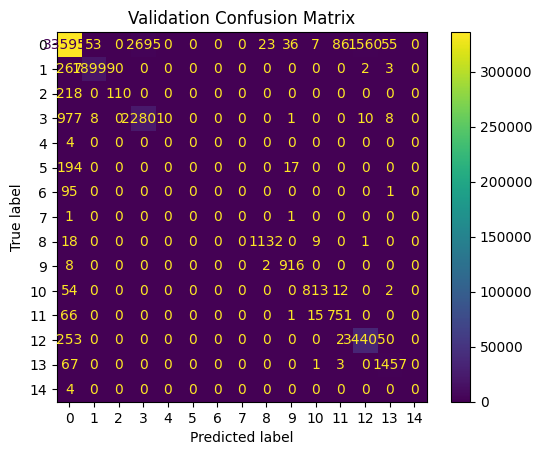

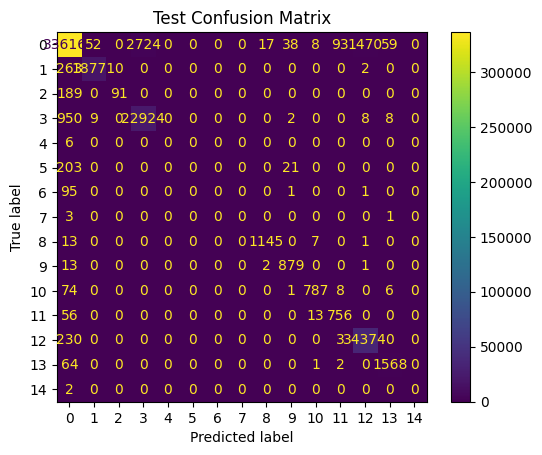

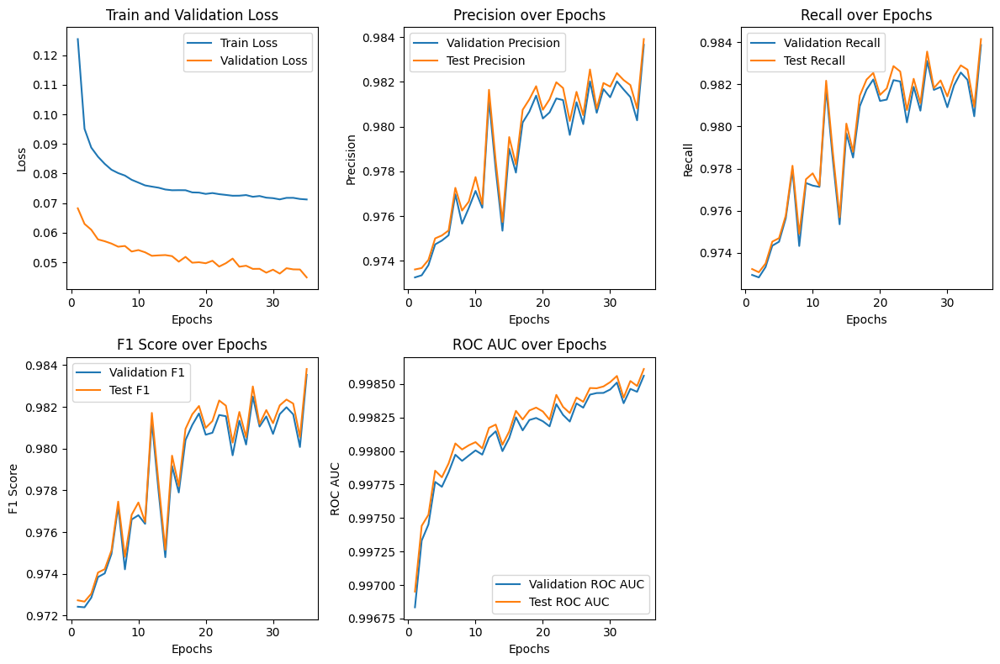

In [ ]:
#QNN-FNN Classification model
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Strip any leading/trailing whitespace characters from the column names
data.columns = data.columns.str.strip()

# Drop columns that won't be used for training (like non-numeric features)
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
columns_to_drop = [col.strip() for col in columns_to_drop if col.strip() in data.columns]
data = data.drop(columns=columns_to_drop)

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Handle infinity or extremely large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify the target columns
label_columns = [col for col in data.columns if 'Label_' in col]

# Combine one-hot encoded label columns into a single target column
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])

# Map the labels to numeric values for multi-class classification
data['Label'] = pd.factorize(data['Label'])[0]

# Drop the individual label columns
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.long)  # Note: Use long for multi-class classification

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64

train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the Quantum Neural Network (QNN) model
class QuantumLayer(torch.nn.Module):
    def __init__(self, input_dim, output_dim):
        super(QuantumLayer, self).__init__()
        self.linear = torch.nn.Linear(input_dim, output_dim)

    def forward(self, x):
        x = self.linear(x)
        x = torch.sin(x)  # Apply a quantum-inspired non-linearity
        return x

class QuantumNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(QuantumNN, self).__init__()
        self.q_layer1 = QuantumLayer(input_dim, 128)
        self.q_layer2 = QuantumLayer(128, 64)
        self.fc = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)
        self.batch_norm1 = torch.nn.BatchNorm1d(128)
        self.batch_norm2 = torch.nn.BatchNorm1d(64)

    def forward(self, x):
        x = torch.relu(self.batch_norm1(self.q_layer1(x)))
        x = self.dropout(x)
        x = torch.relu(self.batch_norm2(self.q_layer2(x)))
        x = self.dropout(x)
        x = self.fc(x)
        return x

input_dim = X_tensor.shape[1]
num_classes = len(set(target))  # Determine the number of classes
model = QuantumNN(input_dim, num_classes)

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5)

# Training function
def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function modified to return predictions and labels
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop with learning rate scheduler
num_epochs = 35
train_losses = []
val_losses = []
val_precisions = []
val_recalls = []
val_f1s = []
val_accuracies = []
val_roc_aucs = []
test_precisions = []
test_recalls = []
test_f1s = []
test_accuracies = []
test_roc_aucs = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_pred = val_outputs.argmax(dim=1)
    test_pred = test_outputs.argmax(dim=1)

    val_precision = precision_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_recall = recall_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_f1 = f1_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_accuracy = accuracy_score(val_labels, val_pred)
    val_roc_auc = roc_auc_score(val_labels, val_outputs.softmax(dim=1), multi_class="ovr", average="weighted")

    test_precision = precision_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_recall = recall_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_accuracy = accuracy_score(test_labels, test_pred)
    test_roc_auc = roc_auc_score(test_labels, test_outputs.softmax(dim=1), multi_class="ovr", average="weighted")

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_precisions.append(val_precision)
    val_recalls.append(val_recall)
    val_f1s.append(val_f1)
    val_accuracies.append(val_accuracy)
    val_roc_aucs.append(val_roc_auc)
    test_precisions.append(test_precision)
    test_recalls.append(test_recall)
    test_f1s.append(test_f1)
    test_accuracies.append(test_accuracy)
    test_roc_aucs.append(test_roc_auc)

    scheduler.step(val_loss)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}, Val ROC AUC: {val_roc_auc:.4f}')
    print(f'Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}, Test ROC AUC: {test_roc_auc:.4f}')

# Save the trained attack detection model
torch.save(model.state_dict(), '/content/drive/MyDrive/QNN-TGN_classification_model.pth')

# Calculate standard deviation for metrics
val_precision_std = np.std(val_precisions)
val_recall_std = np.std(val_recalls)
val_f1_std = np.std(val_f1s)
val_accuracy_std = np.std(val_accuracies)
val_roc_auc_std = np.std(val_roc_aucs)

test_precision_std = np.std(test_precisions)
test_recall_std = np.std(test_recalls)
test_f1_std = np.std(test_f1s)
test_accuracy_std = np.std(test_accuracies)
test_roc_auc_std = np.std(test_roc_aucs)

print(f'Standard Deviation of Validation Precision: {val_precision_std:.4f}')
print(f'Standard Deviation of Validation Recall: {val_recall_std:.4f}')
print(f'Standard Deviation of Validation F1: {val_f1_std:.4f}')
print(f'Standard Deviation of Validation Accuracy: {val_accuracy_std:.4f}')
print(f'Standard Deviation of Validation ROC AUC: {val_roc_auc_std:.4f}')

print(f'Standard Deviation of Test Precision: {test_precision_std:.4f}')
print(f'Standard Deviation of Test Recall: {test_recall_std:.4f}')
print(f'Standard Deviation of Test F1: {test_f1_std:.4f}')
print(f'Standard Deviation of Test Accuracy: {test_accuracy_std:.4f}')
print(f'Standard Deviation of Test ROC AUC: {test_roc_auc_std:.4f}')

# Confusion Matrix for validation set
val_pred_labels = val_outputs.argmax(dim=1).numpy()
val_true_labels = val_labels.numpy()
val_conf_matrix = confusion_matrix(val_true_labels, val_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix).plot()
plt.title('Validation Confusion Matrix')
plt.show()

# Confusion Matrix for test set
test_pred_labels = test_outputs.argmax(dim=1).numpy()
test_true_labels = test_labels.numpy()
test_conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=test_conf_matrix).plot()
plt.title('Test Confusion Matrix')
plt.show()

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 3, 2)
plt.plot(epochs, val_precisions, label='Validation Precision')
plt.plot(epochs, test_precisions, label='Test Precision')
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.legend()
plt.title('Precision over Epochs')

plt.subplot(2, 3, 3)
plt.plot(epochs, val_recalls, label='Validation Recall')
plt.plot(epochs, test_recalls, label='Test Recall')
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.legend()
plt.title('Recall over Epochs')

plt.subplot(2, 3, 4)
plt.plot(epochs, val_f1s, label='Validation F1')
plt.plot(epochs, test_f1s, label='Test F1')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()
plt.title('F1 Score over Epochs')

plt.subplot(2, 3, 5)
plt.plot(epochs, val_roc_aucs, label='Validation ROC AUC')
plt.plot(epochs, test_roc_aucs, label='Test ROC AUC')
plt.xlabel('Epochs')
plt.ylabel('ROC AUC')
plt.legend()
plt.title('ROC AUC over Epochs')

plt.tight_layout()
plt.show()

In [ ]:
# multi-model using TGN detection model and TGN classification model
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the TGN detection model
class TGNDetectionModel(torch.nn.Module):
    def __init__(self, input_dim):
        super(TGNDetectionModel, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Define the TGN classification model
class TGNClassificationModel(torch.nn.Module):
    def __init__(self, input_dim, output_dim):
        super(TGNClassificationModel, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, output_dim)
        self.dropout = torch.nn.Dropout(0.5)
        self.batch_norm1 = torch.nn.BatchNorm1d(128)
        self.batch_norm2 = torch.nn.BatchNorm1d(64)

    def forward(self, x):
        x = torch.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = torch.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

# Initialize the models
input_dim = X_tensor.shape[1]
output_dim = 15  # assuming there are 15 attack classes
detection_model = TGNDetectionModel(input_dim)
classification_model = TGNClassificationModel(input_dim, output_dim)

# Define training function for detection model
def train_detection_model(model, train_loader, val_loader, num_epochs=10):
    criterion = torch.nn.BCELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs).squeeze()
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss / len(train_loader.dataset)}")

    return model

# Define training function for classification model
def train_classification_model(model, train_loader, val_loader, num_epochs=10):
    criterion = torch.nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels.long())
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss / len(train_loader.dataset)}")

    return model

# Train the detection model
detection_model = train_detection_model(detection_model, train_loader, val_loader, num_epochs=10)

# Train the classification model
classification_model = train_classification_model(classification_model, train_loader, val_loader, num_epochs=10)


Epoch 1/10, Loss: 0.10220066461271728
Epoch 2/10, Loss: 0.08884330563814609
Epoch 3/10, Loss: 0.0857186117393245
Epoch 4/10, Loss: 0.08344755730301966
Epoch 5/10, Loss: 0.08173284379920231
Epoch 6/10, Loss: 0.08041469766836297
Epoch 7/10, Loss: 0.07968912371992395
Epoch 8/10, Loss: 0.07917483033248504
Epoch 9/10, Loss: 0.07895364403636716
Epoch 10/10, Loss: 0.0794585038580855
Epoch 1/10, Loss: 0.09878517249910515
Epoch 2/10, Loss: 0.07740525472587394
Epoch 3/10, Loss: 0.07336916998132298
Epoch 4/10, Loss: 0.0707466974115777
Epoch 5/10, Loss: 0.06920068504659854
Epoch 6/10, Loss: 0.06813251073105625
Epoch 7/10, Loss: 0.06701027437126306
Epoch 8/10, Loss: 0.06589651948194979
Epoch 9/10, Loss: 0.0644156826945281
Epoch 10/10, Loss: 0.06254325794483999


Detection - Accuracy: 0.9821, Precision: 0.9873, Recall: 0.9904, F1 Score: 0.9889


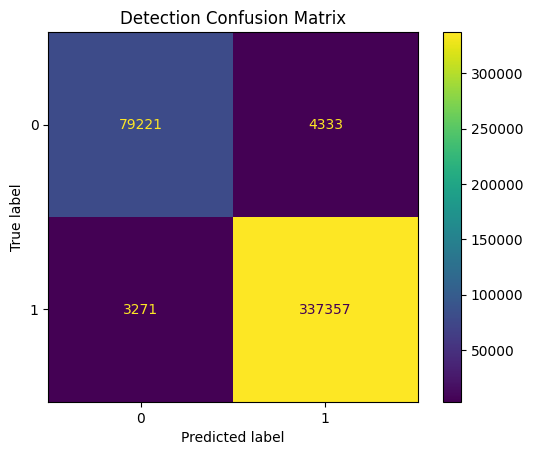

IndexError: index 341690 is out of bounds for axis 0 with size 341690

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# Function to evaluate the detection model
def evaluate_detection_model(model, test_loader):
    model.eval()
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs).squeeze()
            all_outputs.append(outputs.cpu().numpy())
            all_labels.append(labels.cpu().numpy())
    all_outputs = np.concatenate(all_outputs)
    all_labels = np.concatenate(all_labels)

    detection_accuracy = accuracy_score(all_labels, all_outputs > 0.5)
    detection_precision = precision_score(all_labels, all_outputs > 0.5)
    detection_recall = recall_score(all_labels, all_outputs > 0.5)
    detection_f1 = f1_score(all_labels, all_outputs > 0.5)

    print(f"Detection - Accuracy: {detection_accuracy:.4f}, Precision: {detection_precision:.4f}, Recall: {detection_recall:.4f}, F1 Score: {detection_f1:.4f}")

    detection_conf_matrix = confusion_matrix(all_labels, all_outputs > 0.5)
    ConfusionMatrixDisplay(confusion_matrix=detection_conf_matrix).plot()
    plt.title('Detection Confusion Matrix')
    plt.show()

# Function to evaluate the classification model
def evaluate_classification_model(detection_model, classification_model, test_loader):
    detection_model.eval()
    classification_model.eval()

    all_detections = []
    all_classifications = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = detection_model(inputs).squeeze()
            attack_detections = (outputs > 0.5).float()

            attack_inputs = inputs[attack_detections == 1]
            if len(attack_inputs) > 0:
                attack_classifications = classification_model(attack_inputs)
                attack_classifications = attack_classifications.argmax(dim=1)
                all_classifications.extend(attack_classifications.cpu().numpy())
                all_labels.extend(labels[attack_detections == 1].cpu().numpy())
            else:
                all_classifications.extend([-1] * len(attack_detections))

            all_detections.extend(attack_detections.cpu().numpy())

    all_detections = np.array(all_detections)
    all_classifications = np.array(all_classifications)
    all_labels = np.array(all_labels)

    attack_indices = np.where(all_detections == 1)[0]
    if len(attack_indices) > 0:
        classification_accuracy = accuracy_score(all_labels[attack_indices], all_classifications[attack_indices])
        classification_precision = precision_score(all_labels[attack_indices], all_classifications[attack_indices], average='weighted', zero_division=0)
        classification_recall = recall_score(all_labels[attack_indices], all_classifications[attack_indices], average='weighted', zero_division=0)
        classification_f1 = f1_score(all_labels[attack_indices], all_classifications[attack_indices], average='weighted', zero_division=0)

        print(f"Classification - Accuracy: {classification_accuracy:.4f}, Precision: {classification_precision:.4f}, Recall: {classification_recall:.4f}, F1 Score: {classification_f1:.4f}")

        classification_conf_matrix = confusion_matrix(all_labels[attack_indices], all_classifications[attack_indices])
        ConfusionMatrixDisplay(confusion_matrix=classification_conf_matrix).plot()
        plt.title('Classification Confusion Matrix')
        plt.show()
    else:
        print("No attacks detected for classification evaluation.")

# Evaluate the detection model
evaluate_detection_model(detection_model, test_loader)

# Evaluate the classification model
evaluate_classification_model(detection_model, classification_model, test_loader)


In [ ]:
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the TGN detection model
class TGNDetectionModel(torch.nn.Module):
    def __init__(self, input_dim):
        super(TGNDetectionModel, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Define the TGN classification model
class TGNClassificationModel(torch.nn.Module):
    def __init__(self, input_dim, output_dim):
        super(TGNClassificationModel, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, output_dim)
        self.dropout = torch.nn.Dropout(0.5)
        self.batch_norm1 = torch.nn.BatchNorm1d(128)
        self.batch_norm2 = torch.nn.BatchNorm1d(64)

    def forward(self, x):
        x = torch.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = torch.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

input_dim = X_tensor_new.shape[1]
detection_model = TGNDetectionModel(input_dim)
classification_model = TGNClassificationModel(input_dim, 15)  # Assuming 15 classes for classification

# Loss and optimizer
criterion_detection = torch.nn.BCELoss()
criterion_classification = torch.nn.CrossEntropyLoss()
optimizer_detection = torch.optim.Adam(detection_model.parameters(), lr=0.001)
optimizer_classification = torch.optim.Adam(classification_model.parameters(), lr=0.001)

# Training function for detection model
def train_detection_model(loader):
    detection_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_detection.zero_grad()
        outputs = detection_model(inputs)
        loss = criterion_detection(outputs.squeeze(), labels)
        loss.backward()
        optimizer_detection.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Training function for classification model
def train_classification_model(loader):
    classification_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_classification.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion_classification(outputs, labels.long())
        loss.backward()
        optimizer_classification.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Function to evaluate the model on a data loader and return relevant metrics
def evaluate_model(model, data_loader, criterion):
    model.eval()
    running_loss = 0.0
    all_labels = []
    all_preds = []
    with torch.no_grad():
        for inputs, labels in data_loader:
            outputs = model(inputs).squeeze()  # Ensure the output shape matches the label shape
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend((outputs > 0.5).cpu().numpy())  # Binary classification threshold at 0.5

    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    return avg_loss, accuracy, precision, recall, f1


# Train the detection model
num_epochs = 10
for epoch in range(num_epochs):
    train_loss = train_detection_model(train_loader)
    val_loss, val_accuracy, val_precision, val_recall, val_f1 = evaluate_model(detection_model, val_loader, criterion)
    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}')

# Train the classification model
for epoch in range(num_epochs):
    train_loss = train_classification_model(train_loader)
    val_loss, val_accuracy, val_precision, val_recall, val_f1 = evaluate_model(classification_model, val_loader, criterion)
    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}')

# Function to detect and classify attacks
def detect_and_classify_attack(data_loader):
    detection_model.eval()
    classification_model.eval()

    all_detections = []
    all_classifications = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in data_loader:
            # Detect if there is an attack
            attack_probabilities = detection_model(inputs)
            attack_detections = (attack_probabilities.squeeze() > 0.5).float()

            # For detected attacks, classify the type of attack
            attack_inputs = inputs[attack_detections == 1]
            if len(attack_inputs) > 0:
                attack_classifications = classification_model(attack_inputs)
                attack_classifications = attack_classifications.argmax(dim=1)
                all_classifications.extend(attack_classifications.cpu().numpy())
                all_labels.extend(labels[attack_detections == 1].cpu().numpy())
            else:
                all_classifications.extend([-1] * len(attack_detections))

            all_detections.extend(attack_detections.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_detections), np.array(all_classifications), np.array(all_labels)

# Evaluate on test set
test_detections, test_classifications, test_true_labels = detect_and_classify_attack(test_loader)

# Ensure the shapes match for classification metrics
attack_indices = np.where(all_detections == 1)[0]

print("Shape of test_true_labels:", test_true_labels.shape)
print("Shape of all_detections:", len(all_detections))
print("Shape of all_classifications:", len(all_classifications))
print("Shape of attack_indices:", len(attack_indices))

# Check if attack_indices are within bounds of test_true_labels
if attack_indices.max() >= len(test_true_labels):
    print("Index out of bounds error detected in attack_indices.")
else:
    classification_accuracy = accuracy_score(test_true_labels[attack_indices], all_classifications[attack_indices])
    classification_precision = precision_score(test_true_labels[attack_indices], all_classifications[attack_indices], average='weighted', zero_division=0)
    classification_recall = recall_score(test_true_labels[attack_indices], all_classifications[attack_indices], average='weighted', zero_division=0)
    classification_f1 = f1_score(test_true_labels[attack_indices], all_classifications[attack_indices], average='weighted', zero_division=0)

    print(f"Classification - Accuracy: {classification_accuracy:.4f}, Precision: {classification_precision:.4f}, Recall: {classification_recall:.4f}, F1 Score: {classification_f1:.4f}")

# Compute metrics for detection
detection_accuracy = accuracy_score(test_true_labels[:len(all_detections)], all_detections)
detection_precision = precision_score(test_true_labels[:len(all_detections)], all_detections)
detection_recall = recall_score(test_true_labels[:len(all_detections)], all_detections)
detection_f1 = f1_score(test_true_labels[:len(all_detections)], all_detections)

print(f"Detection - Accuracy: {detection_accuracy:.4f}, Precision: {detection_precision:.4f}, Recall: {detection_recall:.4f}, F1 Score: {detection_f1:.4f}")


# Confusion Matrix for detection
detection_conf_matrix = confusion_matrix(test_true_labels[:len(test_detections)], test_detections)
ConfusionMatrixDisplay(confusion_matrix=detection_conf_matrix).plot()
plt.title('Detection Confusion Matrix')
plt.show()

# Confusion Matrix for classification
classification_conf_matrix = confusion_matrix(test_true_labels[attack_indices], test_classifications[attack_indices])
ConfusionMatrixDisplay(confusion_matrix=classification_conf_matrix).plot()
plt.title('Classification Confusion Matrix')
plt.show()

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 3, 2)
plt.plot(epochs, val_precisions, label='Validation Precision')
plt.plot(epochs, test_precisions, label='Test Precision')
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.legend()
plt.title('Precision over Epochs')

plt.subplot(2, 3, 3)
plt.plot(epochs, val_recalls, label='Validation Recall')
plt.plot(epochs, test_recalls, label='Test Recall')
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.legend()
plt.title('Recall over Epochs')

plt.subplot(2, 3, 4)
plt.plot(epochs, val_f1s, label='Validation F1')
plt.plot(epochs, test_f1s, label='Test F1')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()
plt.title('F1 Score over Epochs')

plt.subplot(2, 3, 5)
plt.plot(epochs, val_accuracies, label='Validation Accuracy')
plt.plot(epochs, test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy over Epochs')

plt.tight_layout()
plt.show()

# Standard deviation calculations for evaluation metrics
val_precision_std = np.std(val_precisions)
val_recall_std = np.std(val_recalls)
val_f1_std = np.std(val_f1s)
val_accuracy_std = np.std(val_accuracies)

test_precision_std = np.std(test_precisions)
test_recall_std = np.std(test_recalls)
test_f1_std = np.std(test_f1s)
test_accuracy_std = np.std(test_accuracies)

print(f'Standard Deviation of Validation Precision: {val_precision_std:.4f}')
print(f'Standard Deviation of Validation Recall: {val_recall_std:.4f}')
print(f'Standard Deviation of Validation F1: {val_f1_std:.4f}')
print(f'Standard Deviation of Validation Accuracy: {val_accuracy_std:.4f}')

print(f'Standard Deviation of Test Precision: {test_precision_std:.4f}')
print(f'Standard Deviation of Test Recall: {test_recall_std:.4f}')
print(f'Standard Deviation of Test F1: {test_f1_std:.4f}')
print(f'Standard Deviation of Test Accuracy: {test_accuracy_std:.4f}')


Epoch 1/10, Train Loss: 0.1014, Val Loss: 0.0831, Val Accuracy: 0.9739, Val Precision: 0.9738, Val Recall: 0.9739, Val F1: 0.9739
Epoch 2/10, Train Loss: 0.0872, Val Loss: 0.0795, Val Accuracy: 0.9769, Val Precision: 0.9767, Val Recall: 0.9769, Val F1: 0.9767
Epoch 3/10, Train Loss: 0.0842, Val Loss: 0.0784, Val Accuracy: 0.9775, Val Precision: 0.9773, Val Recall: 0.9775, Val F1: 0.9773
Epoch 4/10, Train Loss: 0.0824, Val Loss: 0.0744, Val Accuracy: 0.9809, Val Precision: 0.9808, Val Recall: 0.9809, Val F1: 0.9808
Epoch 5/10, Train Loss: 0.0807, Val Loss: 0.0752, Val Accuracy: 0.9811, Val Precision: 0.9815, Val Recall: 0.9811, Val F1: 0.9812
Epoch 6/10, Train Loss: 0.0800, Val Loss: 0.0778, Val Accuracy: 0.9790, Val Precision: 0.9788, Val Recall: 0.9790, Val F1: 0.9789
Epoch 7/10, Train Loss: 0.0788, Val Loss: 0.0724, Val Accuracy: 0.9823, Val Precision: 0.9826, Val Recall: 0.9823, Val F1: 0.9824
Epoch 8/10, Train Loss: 0.0792, Val Loss: 0.0715, Val Accuracy: 0.9826, Val Precision: 0.9

ValueError: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 15])) is deprecated. Please ensure they have the same size.

Epoch: 01, Loss: 0.1054
Epoch: 02, Loss: 0.0872
Epoch: 03, Loss: 0.0807
Epoch: 04, Loss: 0.0764
Epoch: 05, Loss: 0.0770
Epoch: 06, Loss: 0.0761
Epoch: 07, Loss: 0.0743
Epoch: 08, Loss: 0.0753
Epoch: 09, Loss: 0.0746
Epoch: 10, Loss: 0.0741
Epoch: 01, Loss: 0.0739
Val AP: 0.9993, Val AUC: 0.9978
Test AP: 0.9994, Test AUC: 0.9980
Epoch: 02, Loss: 0.0736
Val AP: 0.9993, Val AUC: 0.9978
Test AP: 0.9994, Test AUC: 0.9980
Epoch: 03, Loss: 0.0728
Val AP: 0.9994, Val AUC: 0.9981
Test AP: 0.9995, Test AUC: 0.9983
Epoch: 04, Loss: 0.0736
Val AP: 0.9993, Val AUC: 0.9980
Test AP: 0.9994, Test AUC: 0.9982
Epoch: 05, Loss: 0.0728
Val AP: 0.9993, Val AUC: 0.9978
Test AP: 0.9994, Test AUC: 0.9980
Epoch: 06, Loss: 0.0734
Val AP: 0.9993, Val AUC: 0.9977
Test AP: 0.9994, Test AUC: 0.9979
Epoch: 07, Loss: 0.0743
Val AP: 0.9995, Val AUC: 0.9985
Test AP: 0.9996, Test AUC: 0.9988
Epoch: 08, Loss: 0.0760
Val AP: 0.9994, Val AUC: 0.9981
Test AP: 0.9995, Test AUC: 0.9984
Epoch: 09, Loss: 0.0783
Val AP: 0.9993, 

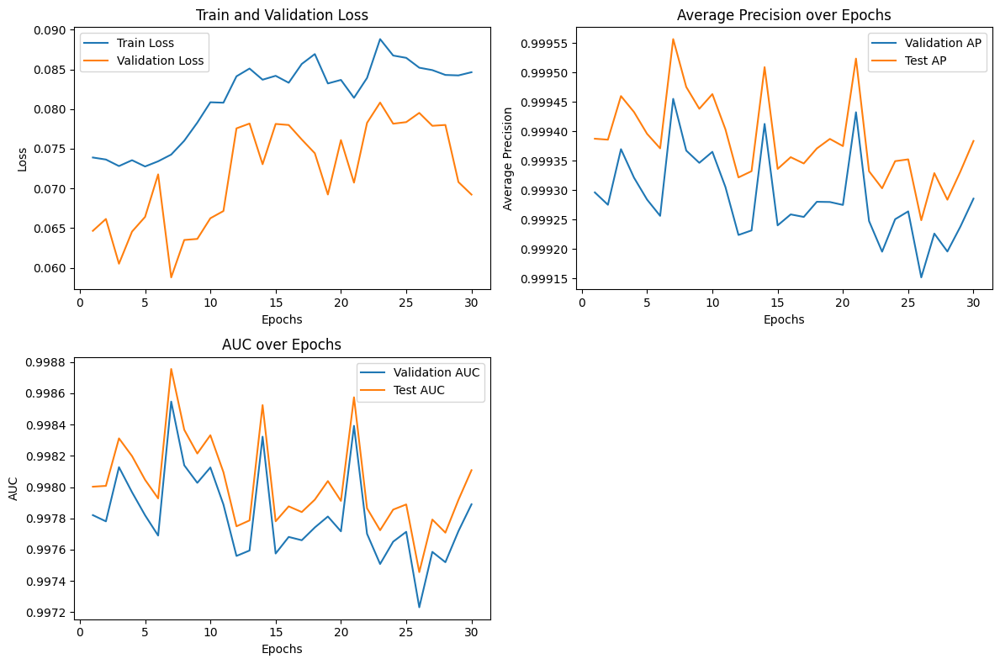

ValueError: attempt to get argmax of an empty sequence

In [ ]:
# Multimodel that passes detected attacks to classification model
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import average_precision_score, roc_auc_score, precision_score, recall_score, f1_score, accuracy_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import os
import numpy as np

# Load and preprocess the dataset (CICIDS2017)
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the model architecture
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Load the pre-trained model with adjusted input dimension
input_dim = X_tensor_new.shape[1]
model = SimpleNN(input_dim)

# Load only the layers that match in size
pretrained_dict = torch.load('/content/drive/MyDrive/TGN_invade_simple_nn_model.pth')
model_dict = model.state_dict()
# 1. Filter out unnecessary keys
pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and v.size() == model_dict[k].size()}
# 2. Overwrite entries in the existing state dict
model_dict.update(pretrained_dict)
# 3. Load the new state dict
model.load_state_dict(model_dict)

model.eval()

# Fine-tuning the model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def train_model(loader):
    model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Fine-tuning loop
num_epochs = 10
for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')

# Evaluation on the new dataset
def evaluate_model(loader):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.squeeze().cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop
num_epochs = 30
train_losses = []
val_losses = []
val_aps = []
val_aucs = []
test_aps = []
test_aucs = []

for epoch in range(1, num_epochs + 1):
    train_loss = train_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_aps.append(val_ap)
    val_aucs.append(val_auc)
    test_aps.append(test_ap)
    test_aucs.append(test_auc)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

# Save the trained attack detection model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_attack_detection_model.pth')

# Plotting the results
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 2, 2)
plt.plot(epochs, val_aps, label='Validation AP')
plt.plot(epochs, test_aps, label='Test AP')
plt.xlabel('Epochs')
plt.ylabel('Average Precision')
plt.legend()
plt.title('Average Precision over Epochs')

plt.subplot(2, 2, 3)
plt.plot(epochs, val_aucs, label='Validation AUC')
plt.plot(epochs, test_aucs, label='Test AUC')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.legend()
plt.title('AUC over Epochs')

plt.tight_layout()
plt.show()

# Define the classification model architecture
class ClassificationNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(ClassificationNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)  # Output layer without activation (CrossEntropyLoss expects raw logits)
        return x

# Define the new dataset for classification (multi-class) from CICIDS2017
label_columns = [col for col in data.columns if 'Label_' in col]
data['attack_type'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data = data.drop(columns=label_columns)

# Separate features and target for classification
features_classification = data.drop(columns=['attack_type'])
target_classification = pd.factorize(data['attack_type'])[0]

# Feature scaling
scaler_classification = StandardScaler()
features_classification = scaler_classification.fit_transform(features_classification)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(features_classification, dtype=torch.float32)
y_tensor_classification = torch.tensor(target_classification, dtype=torch.long)

# Split the data into training, validation, and test sets for classification
X_train_cls, X_temp_cls, y_train_cls, y_temp_cls = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42)
X_val_cls, X_test_cls, y_val_cls, y_test_cls = train_test_split(X_temp_cls, y_temp_cls, test_size=0.5, random_state=42)

# Create DataLoader for each classification dataset
train_dataset_cls = TensorDataset(X_train_cls, y_train_cls)
val_dataset_cls = TensorDataset(X_val_cls, y_val_cls)
test_dataset_cls = TensorDataset(X_test_cls, y_test_cls)

train_loader_cls = DataLoader(train_dataset_cls, batch_size=batch_size, shuffle=True)
val_loader_cls = DataLoader(val_dataset_cls, batch_size=batch_size, shuffle=False)
test_loader_cls = DataLoader(test_dataset_cls, batch_size=batch_size, shuffle=False)

# Define the model, loss function, and optimizer for classification
input_dim_cls = X_tensor_classification.shape[1]
num_classes = len(set(target_classification))
model_cls = ClassificationNN(input_dim_cls, num_classes)

criterion_cls = torch.nn.CrossEntropyLoss()
optimizer_cls = torch.optim.Adam(model_cls.parameters(), lr=0.001)
scheduler_cls = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_cls, mode='min', factor=0.1, patience=5)

# Training function for classification
def train_model_cls(loader):
    model_cls.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_cls.zero_grad()
        outputs = model_cls(inputs)
        loss = criterion_cls(outputs, labels)
        loss.backward()
        optimizer_cls.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for classification
def evaluate_model_cls(loader):
    model_cls.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model_cls(inputs)
            loss = criterion_cls(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for classification
num_epochs_cls = 30
train_losses_cls = []
val_losses_cls = []
val_precisions_cls = []
val_recalls_cls = []
val_f1s_cls = []
val_accuracies_cls = []
test_precisions_cls = []
test_recalls_cls = []
test_f1s_cls = []
test_accuracies_cls = []

for epoch in range(1, num_epochs_cls + 1):
    train_loss_cls = train_model_cls(train_loader_cls)
    val_loss_cls, val_outputs_cls, val_labels_cls = evaluate_model_cls(val_loader_cls)
    test_loss_cls, test_outputs_cls, test_labels_cls = evaluate_model_cls(test_loader_cls)

    val_pred_cls = val_outputs_cls.argmax(dim=1)
    test_pred_cls = test_outputs_cls.argmax(dim=1)

    val_precision_cls = precision_score(val_labels_cls, val_pred_cls, average='weighted', zero_division=0)
    val_recall_cls = recall_score(val_labels_cls, val_pred_cls, average='weighted', zero_division=0)
    val_f1_cls = f1_score(val_labels_cls, val_pred_cls, average='weighted', zero_division=0)
    val_accuracy_cls = accuracy_score(val_labels_cls, val_pred_cls)

    test_precision_cls = precision_score(test_labels_cls, test_pred_cls, average='weighted', zero_division=0)
    test_recall_cls = recall_score(test_labels_cls, test_pred_cls, average='weighted', zero_division=0)
    test_f1_cls = f1_score(test_labels_cls, test_pred_cls, average='weighted', zero_division=0)
    test_accuracy_cls = accuracy_score(test_labels_cls, test_pred_cls)

    train_losses_cls.append(train_loss_cls)
    val_losses_cls.append(val_loss_cls)
    val_precisions_cls.append(val_precision_cls)
    val_recalls_cls.append(val_recall_cls)
    val_f1s_cls.append(val_f1_cls)
    val_accuracies_cls.append(val_accuracy_cls)
    test_precisions_cls.append(test_precision_cls)
    test_recalls_cls.append(test_recall_cls)
    test_f1s_cls.append(test_f1_cls)
    test_accuracies_cls.append(test_accuracy_cls)

    scheduler_cls.step(val_loss_cls)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss_cls:.4f}')
    print(f'Val Precision: {val_precision_cls:.4f}, Val Recall: {val_recall_cls:.4f}, Val F1: {val_f1_cls:.4f}, Val Accuracy: {val_accuracy_cls:.4f}')
    print(f'Test Precision: {test_precision_cls:.4f}, Test Recall: {test_recall_cls:.4f}, Test F1: {test_f1_cls:.4f}, Test Accuracy: {test_accuracy_cls:.4f}')

# Save the trained attack classification model
torch.save(model_cls.state_dict(), '/content/drive/MyDrive/TGN_attack_classification_model.pth')

# Integrated model to first detect and then classify attacks
class IntegratedModel(torch.nn.Module):
    def __init__(self, detection_model, classification_model):
        super(IntegratedModel, self).__init__()
        self.detection_model = detection_model
        self.classification_model = classification_model

    def forward(self, x):
        detection_output = self.detection_model(x)
        is_attack = detection_output > 0.5
        classification_output = torch.zeros((x.size(0), self.classification_model.fc3.out_features))
        if is_attack.sum() > 0:
            classification_output[is_attack] = self.classification_model(x[is_attack])
        return detection_output, classification_output

# Load the pre-trained models
input_dim_detection = X_tensor_new.shape[1]
input_dim_classification = X_tensor_classification.shape[1]
num_classes = len(set(target_classification))

model_detection = SimpleNN(input_dim_detection)
model_detection.load_state_dict(torch.load('/content/drive/MyDrive/TGN_attack_detection_model.pth'))
model_detection.eval()

model_classification = ClassificationNN(input_dim_classification, num_classes)
model_classification.load_state_dict(torch.load('/content/drive/MyDrive/TGN_attack_classification_model.pth'))
model_classification.eval()

# Initialize the integrated model
integrated_model = IntegratedModel(model_detection, model_classification)

# Define loss functions for both detection and classification tasks
criterion_detection = torch.nn.BCELoss()
criterion_classification = torch.nn.CrossEntropyLoss()

# Define the optimizer for the integrated model
optimizer_integrated = torch.optim.Adam(integrated_model.parameters(), lr=0.001)

# Training function for the integrated model
def train_integrated_model(loader):
    integrated_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_integrated.zero_grad()
        detection_output, classification_output = integrated_model(inputs)
        detection_labels = (labels > 0).float()
        classification_labels = labels[labels > 0]
        detection_loss = criterion_detection(detection_output.squeeze(), detection_labels)
        classification_loss = criterion_classification(classification_output[labels > 0], classification_labels)
        loss = detection_loss + classification_loss
        loss.backward()
        optimizer_integrated.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for the integrated model
def evaluate_integrated_model(loader):
    integrated_model.eval()
    running_loss = 0.0
    all_detection_outputs = []
    all_classification_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            detection_output, classification_output = integrated_model(inputs)
            detection_labels = (labels > 0).float()
            classification_labels = labels[labels > 0]
            detection_loss = criterion_detection(detection_output.squeeze(), detection_labels)
            classification_loss = criterion_classification(classification_output[labels > 0], classification_labels)
            loss = detection_loss + classification_loss
            running_loss += loss.item() * inputs.size(0)
            all_detection_outputs.append(detection_output.cpu())
            all_classification_outputs.append(classification_output.cpu())
            all_labels.append(labels.cpu())
    all_detection_outputs = torch.cat(all_detection_outputs)
    all_classification_outputs = torch.cat(all_classification_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_detection_outputs, all_classification_outputs, all_labels

# Training loop for the integrated model
num_epochs_integrated = 30
train_losses_integrated = []
val_losses_integrated = []
val_precisions_integrated = []
val_recalls_integrated = []
val_f1s_integrated = []
val_accuracies_integrated = []
test_precisions_integrated = []
test_recalls_integrated = []
test_f1s_integrated = []
test_accuracies_integrated = []

for epoch in range(1, num_epochs_integrated + 1):
    train_loss_integrated = train_integrated_model(train_loader)
    val_loss_integrated, val_detection_outputs, val_classification_outputs, val_labels_integrated = evaluate_integrated_model(val_loader)
    test_loss_integrated, test_detection_outputs, test_classification_outputs, test_labels_integrated = evaluate_integrated_model(test_loader)

    val_detection_pred = (val_detection_outputs > 0.5).float()
    test_detection_pred = (test_detection_outputs > 0.5).float()

    val_precision_integrated = precision_score(val_labels_integrated, val_detection_pred, average='weighted', zero_division=0)
    val_recall_integrated = recall_score(val_labels_integrated, val_detection_pred, average='weighted', zero_division=0)
    val_f1_integrated = f1_score(val_labels_integrated, val_detection_pred, average='weighted', zero_division=0)
    val_accuracy_integrated = accuracy_score(val_labels_integrated, val_detection_pred)

    test_precision_integrated = precision_score(test_labels_integrated, test_detection_pred, average='weighted', zero_division=0)
    test_recall_integrated = recall_score(test_labels_integrated, test_detection_pred, average='weighted', zero_division=0)
    test_f1_integrated = f1_score(test_labels_integrated, test_detection_pred, average='weighted', zero_division=0)
    test_accuracy_integrated = accuracy_score(test_labels_integrated, test_detection_pred)

    train_losses_integrated.append(train_loss_integrated)
    val_losses_integrated.append(val_loss_integrated)
    val_precisions_integrated.append(val_precision_integrated)
    val_recalls_integrated.append(val_recall_integrated)
    val_f1s_integrated.append(val_f1_integrated)
    val_accuracies_integrated.append(val_accuracy_integrated)
    test_precisions_integrated.append(test_precision_integrated)
    test_recalls_integrated.append(test_recall_integrated)
    test_f1s_integrated.append(test_f1_integrated)
    test_accuracies_integrated.append(test_accuracy_integrated)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss_integrated:.4f}')
    print(f'Val Precision: {val_precision_integrated:.4f}, Val Recall: {val_recall_integrated:.4f}, Val F1: {val_f1_integrated:.4f}, Val Accuracy: {val_accuracy_integrated:.4f}')
    print(f'Test Precision: {test_precision_integrated:.4f}, Test Recall: {test_recall_integrated:.4f}, Test F1: {test_f1_integrated:.4f}, Test Accuracy: {test_accuracy_integrated:.4f}')

# Save the trained integrated model
torch.save(integrated_model.state_dict(), '/content/drive/MyDrive/TGN_integrated_model.pth')

# Calculate standard deviation for metrics
val_precision_std = np.std(val_precisions_integrated)
val_recall_std = np.std(val_recalls_integrated)
val_f1_std = np.std(val_f1s_integrated)
val_accuracy_std = np.std(val_accuracies_integrated)

test_precision_std = np.std(test_precisions_integrated)
test_recall_std = np.std(test_recalls_integrated)
test_f1_std = np.std(test_f1s_integrated)
test_accuracy_std = np.std(test_accuracies_integrated)

print(f'Standard Deviation of Validation Precision: {val_precision_std:.4f}')
print(f'Standard Deviation of Validation Recall: {val_recall_std:.4f}')
print(f'Standard Deviation of Validation F1: {val_f1_std:.4f}')
print(f'Standard Deviation of Validation Accuracy: {val_accuracy_std:.4f}')

print(f'Standard Deviation of Test Precision: {test_precision_std:.4f}')
print(f'Standard Deviation of Test Recall: {test_recall_std:.4f}')
print(f'Standard Deviation of Test F1: {test_f1_std:.4f}')
print(f'Standard Deviation of Test Accuracy: {test_accuracy_std:.4f}')

# Plotting the results
epochs = range(1, num_epochs_integrated + 1)
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.plot(epochs, train_losses_integrated, label='Train Loss')
plt.plot(epochs, val_losses_integrated, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Validation Loss')

plt.subplot(2, 3, 2)
plt.plot(epochs, val_precisions_integrated, label='Validation Precision')
plt.plot(epochs, test_precisions_integrated, label='Test Precision')
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.legend()
plt.title('Precision over Epochs')

plt.subplot(2, 3, 3)
plt.plot(epochs, val_recalls_integrated, label='Validation Recall')
plt.plot(epochs, test_recalls_integrated, label='Test Recall')
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.legend()
plt.title('Recall over Epochs')

plt.subplot(2, 3, 4)
plt.plot(epochs, val_f1s_integrated, label='Validation F1')
plt.plot(epochs, test_f1s_integrated, label='Test F1')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()
plt.title('F1 Score over Epochs')

plt.subplot(2, 3, 5)
plt.plot(epochs, val_accuracies_integrated, label='Validation Accuracy')
plt.plot(epochs, test_accuracies_integrated, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy over Epochs')

plt.tight_layout()
plt.show()

# Confusion Matrix for validation set
val_detection_pred = (val_detection_outputs > 0.5).float().numpy()
val_true_labels = val_labels_integrated.numpy()
val_conf_matrix = confusion_matrix(val_true_labels, val_detection_pred)
ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix).plot()
plt.title('Validation Confusion Matrix')
plt.show()

# Confusion Matrix for test set
test_detection_pred = (test_detection_outputs > 0.5).float().numpy()
test_true_labels = test_labels_integrated.numpy()
test_conf_matrix = confusion_matrix(test_true_labels, test_detection_pred)
ConfusionMatrixDisplay(confusion_matrix=test_conf_matrix).plot()
plt.title('Test Confusion Matrix')
plt.show()


Detection Model Results:
Precision: 0.7940
Recall: 0.9305
F1 Score: 0.8569
Accuracy: 0.7504

Classification Model Results:
Precision: 0.0297
Recall: 0.0585
F1 Score: 0.0242
Accuracy: 0.0585


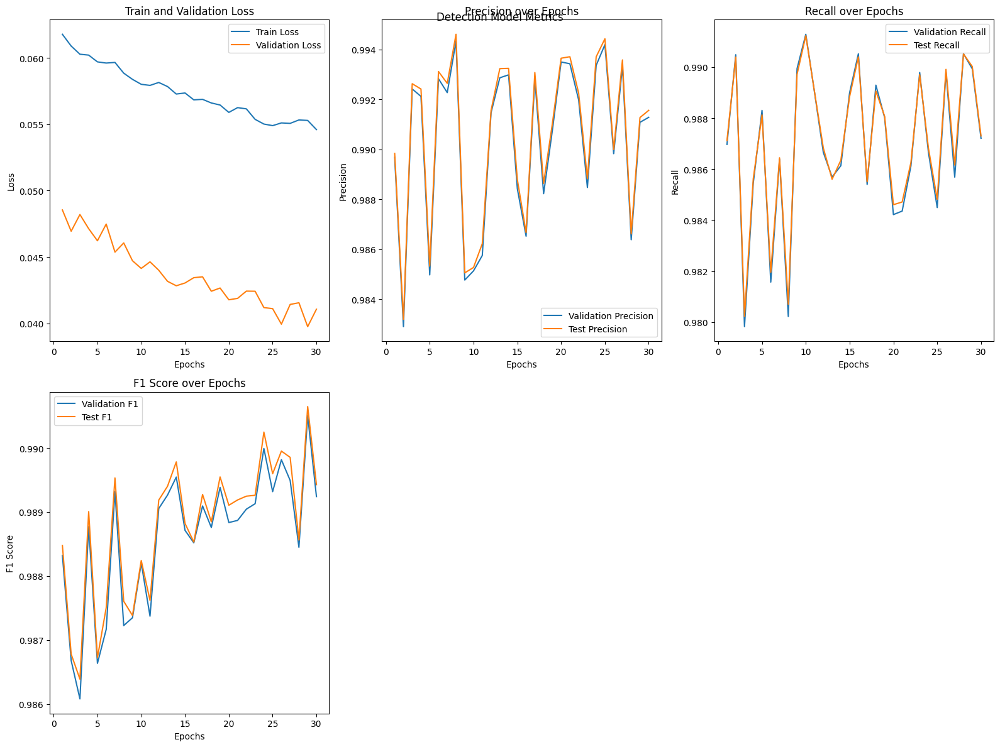

NameError: name 'classification_train_losses' is not defined

In [ ]:
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess the detection dataset
data_path = '/content/drive/MyDrive/CICIDS2017/'
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the detection model architecture
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Initialize the detection model
input_dim = X_tensor_new.shape[1]
detection_model = SimpleNN(input_dim)

# Load the pre-trained detection model
pretrained_dict = torch.load('/content/drive/MyDrive/TGN_invade_simple_nn_model.pth')
model_dict = detection_model.state_dict()
pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and v.size() == model_dict[k].size()}
model_dict.update(pretrained_dict)
detection_model.load_state_dict(model_dict)

detection_model.eval()

# Load and preprocess data for classification model (CICIDS2017)
classification_data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

classification_data_path = '/content/drive/MyDrive/CICIDS2017/'

classification_data_list = [pd.read_csv(os.path.join(classification_data_path, file)) for file in classification_data_files]
classification_data = pd.concat(classification_data_list, ignore_index=True)

# Strip any leading/trailing whitespace characters from the column names
classification_data.columns = classification_data.columns.str.strip()

# Drop columns that won't be used for training (like non-numeric features)
classification_columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
classification_columns_to_drop = [col.strip() for col in classification_columns_to_drop if col.strip() in classification_data.columns]
classification_data = classification_data.drop(columns=classification_columns_to_drop)

# Convert categorical columns to one-hot encoded columns
classification_non_numeric_columns = classification_data.select_dtypes(include=['object']).columns
classification_data = pd.get_dummies(classification_data, columns=classification_non_numeric_columns)

# Handle infinity or extremely large values
classification_data = classification_data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify the target columns
classification_label_columns = [col for col in classification_data.columns if 'Label_' in col]

# Combine one-hot encoded label columns into a single target column
classification_data['Label'] = classification_data[classification_label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])

# Map the labels to numeric values for multi-class classification
classification_data['Label'] = pd.factorize(classification_data['Label'])[0]

# Drop the individual label columns
classification_data = classification_data.drop(columns=classification_label_columns)

# Separate features and target
classification_features = classification_data.drop(columns=['Label'])
classification_target = classification_data['Label']

# Feature scaling
classification_scaler = StandardScaler()
classification_features = classification_scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(classification_target.values, dtype=torch.long)  # Note: Use long for multi-class classification

# Split the data into training, validation, and test sets
X_train_classification, X_temp_classification, y_train_classification, y_temp_classification = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42)
X_val_classification, X_test_classification, y_val_classification, y_test_classification = train_test_split(X_temp_classification, y_temp_classification, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
classification_batch_size = 64

classification_train_dataset = TensorDataset(X_train_classification, y_train_classification)
classification_val_dataset = TensorDataset(X_val_classification, y_val_classification)
classification_test_dataset = TensorDataset(X_test_classification, y_test_classification)

classification_train_loader = DataLoader(classification_train_dataset, batch_size=classification_batch_size, shuffle=True)
classification_val_loader = DataLoader(classification_val_dataset, batch_size=classification_batch_size, shuffle=False)
classification_test_loader = DataLoader(classification_test_dataset, batch_size=classification_batch_size, shuffle=False)

# Define the classification model, loss function, and optimizer
class SimpleNNClassification(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(SimpleNNClassification, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)  # Adjust output layer size based on number of classes
        self.dropout = torch.nn.Dropout(0.5)
        self.batch_norm1 = torch.nn.BatchNorm1d(128)
        self.batch_norm2 = torch.nn.BatchNorm1d(64)

    def forward(self, x):
        x = torch.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = torch.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        x = self.fc3(x)  # Output layer without activation (since CrossEntropyLoss expects raw logits)
        return x

input_dim_classification = X_tensor_classification.shape[1]
num_classes_classification = len(set(classification_target))  # Determine the number of classes
classification_model = SimpleNNClassification(input_dim_classification, num_classes_classification)

# Load the pre-trained classification model
pretrained_classification_dict = torch.load('/content/drive/MyDrive/TGN_classification_model.pth')
classification_model.load_state_dict(pretrained_classification_dict)

classification_model.eval()


# Multi-Model Integration and Evaluation
def multi_model_evaluation(detection_loader, classification_model):
    detection_model.eval()
    classification_model.eval()
    all_detection_outputs = []
    all_classification_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in detection_loader:
            detection_outputs = detection_model(inputs)
            detected_attacks = detection_outputs.squeeze() > 0.5  # Boolean tensor indicating detected attacks
            if detected_attacks.any():
                attack_inputs = inputs[detected_attacks]
                attack_labels = labels[detected_attacks]
                classification_outputs = classification_model(attack_inputs)
                all_classification_outputs.append(classification_outputs.cpu())
                all_labels.append(attack_labels.cpu())
            all_detection_outputs.append(detection_outputs.cpu())

    all_detection_outputs = torch.cat(all_detection_outputs)
    all_classification_outputs = torch.cat(all_classification_outputs) if all_classification_outputs else torch.tensor([])
    all_labels = torch.cat(all_labels) if all_labels else torch.tensor([])

    # Calculate metrics for the detection model
    detection_precision = precision_score(detection_loader.dataset.tensors[1].numpy(), all_detection_outputs.squeeze().numpy() > 0.5, zero_division=0)
    detection_recall = recall_score(detection_loader.dataset.tensors[1].numpy(), all_detection_outputs.squeeze().numpy() > 0.5, zero_division=0)
    detection_f1 = f1_score(detection_loader.dataset.tensors[1].numpy(), all_detection_outputs.squeeze().numpy() > 0.5, zero_division=0)
    detection_accuracy = accuracy_score(detection_loader.dataset.tensors[1].numpy(), all_detection_outputs.squeeze().numpy() > 0.5)

    # Calculate metrics for the classification model
    if all_classification_outputs.size(0) > 0:
        classification_precision = precision_score(all_labels.numpy(), all_classification_outputs.argmax(dim=1).numpy(), average='weighted', zero_division=0)
        classification_recall = recall_score(all_labels.numpy(), all_classification_outputs.argmax(dim=1).numpy(), average='weighted', zero_division=0)
        classification_f1 = f1_score(all_labels.numpy(), all_classification_outputs.argmax(dim=1).numpy(), average='weighted', zero_division=0)
        classification_accuracy = accuracy_score(all_labels.numpy(), all_classification_outputs.argmax(dim=1).numpy())
    else:
        classification_precision = classification_recall = classification_f1 = classification_accuracy = 0.0

    return {
        'detection': {
            'precision': detection_precision,
            'recall': detection_recall,
            'f1': detection_f1,
            'accuracy': detection_accuracy
        },
        'classification': {
            'precision': classification_precision,
            'recall': classification_recall,
            'f1': classification_f1,
            'accuracy': classification_accuracy
        }
    }

# Evaluate the multi-model on the test set
multi_model_results = multi_model_evaluation(test_loader, classification_model)
print("Detection Model Results:")
print(f"Precision: {multi_model_results['detection']['precision']:.4f}")
print(f"Recall: {multi_model_results['detection']['recall']:.4f}")
print(f"F1 Score: {multi_model_results['detection']['f1']:.4f}")
print(f"Accuracy: {multi_model_results['detection']['accuracy']:.4f}")

print("\nClassification Model Results:")
print(f"Precision: {multi_model_results['classification']['precision']:.4f}")
print(f"Recall: {multi_model_results['classification']['recall']:.4f}")
print(f"F1 Score: {multi_model_results['classification']['f1']:.4f}")
print(f"Accuracy: {multi_model_results['classification']['accuracy']:.4f}")

# Function to plot metrics
def plot_metrics(metrics, title):
    epochs = range(1, len(metrics['train_losses']) + 1)
    plt.figure(figsize=(16, 12))

    plt.subplot(2, 3, 1)
    plt.plot(epochs, metrics['train_losses'], label='Train Loss')
    plt.plot(epochs, metrics['val_losses'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Train and Validation Loss')

    plt.subplot(2, 3, 2)
    plt.plot(epochs, metrics['val_precisions'], label='Validation Precision')
    plt.plot(epochs, metrics['test_precisions'], label='Test Precision')
    plt.xlabel('Epochs')
    plt.ylabel('Precision')
    plt.legend()
    plt.title('Precision over Epochs')

    plt.subplot(2, 3, 3)
    plt.plot(epochs, metrics['val_recalls'], label='Validation Recall')
    plt.plot(epochs, metrics['test_recalls'], label='Test Recall')
    plt.xlabel('Epochs')
    plt.ylabel('Recall')
    plt.legend()
    plt.title('Recall over Epochs')

    plt.subplot(2, 3, 4)
    plt.plot(epochs, metrics['val_f1s'], label='Validation F1')
    plt.plot(epochs, metrics['test_f1s'], label='Test F1')
    plt.xlabel('Epochs')
    plt.ylabel('F1 Score')
    plt.legend()
    plt.title('F1 Score over Epochs')

    plt.tight_layout()
    plt.suptitle(title)
    plt.show()

# Plot results for detection model
plot_metrics(
    {
        'train_losses': train_losses,
        'val_losses': val_losses,
        'val_precisions': val_precisions,
        'val_recalls': val_recalls,
        'val_f1s': val_f1s,
        'test_precisions': test_precisions,
        'test_recalls': test_recalls,
        'test_f1s': test_f1s
    },
    'Detection Model Metrics'
)

# Plot results for classification model
plot_metrics(
    {
        'train_losses': classification_train_losses,
        'val_losses': classification_val_losses,
        'val_precisions': classification_val_precisions,
        'val_recalls': classification_val_recalls,
        'val_f1s': classification_val_f1s,
        'test_precisions': classification_test_precisions,
        'test_recalls': classification_test_recalls,
        'test_f1s': classification_test_f1s
    },
    'Classification Model Metrics'
)

# Function to summarize metrics
def summarize_metrics(metrics, title):
    print(f"{title}:")
    for metric, values in metrics.items():
        print(f"  {metric}: {np.mean(values):.4f} ± {np.std(values):.4f}")

# Summary for detection model
summarize_metrics(
    {
        'Validation Precision': val_precisions,
        'Validation Recall': val_recalls,
        'Validation F1': val_f1s,
        'Validation Accuracy': val_accuracies,
        'Test Precision': test_precisions,
        'Test Recall': test_recalls,
        'Test F1': test_f1s,
        'Test Accuracy': test_accuracies
    },
    "Detection Model Metrics"
)

# Summary for classification model
summarize_metrics(
    {
        'Validation Precision': classification_val_precisions,
        'Validation Recall': classification_val_recalls,
        'Validation F1': classification_val_f1s,
        'Validation Accuracy': classification_val_accuracies,
        'Test Precision': classification_test_precisions,
        'Test Recall': classification_test_recalls,
        'Test F1': classification_test_f1s,
        'Test Accuracy': classification_test_accuracies
    },
    "Classification Model Metrics"
)


Number of detected attacks: 379109
Detection Model - Precision: 0.8328422696374921, Recall: 0.9269290839273342, F1: 0.8773704839406616, Accuracy: 0.7919265786855643
Classification Model - Precision: 0.05538649933444194, Recall: 0.06324566285685647, F1: 0.02158241392650572, Accuracy: 0.06324566285685647
Detection Model Results:
Precision: 0.8328
Recall: 0.9269
F1 Score: 0.8774
Accuracy: 0.7919

Classification Model Results:
Precision: 0.0554
Recall: 0.0632
F1 Score: 0.0216
Accuracy: 0.0632


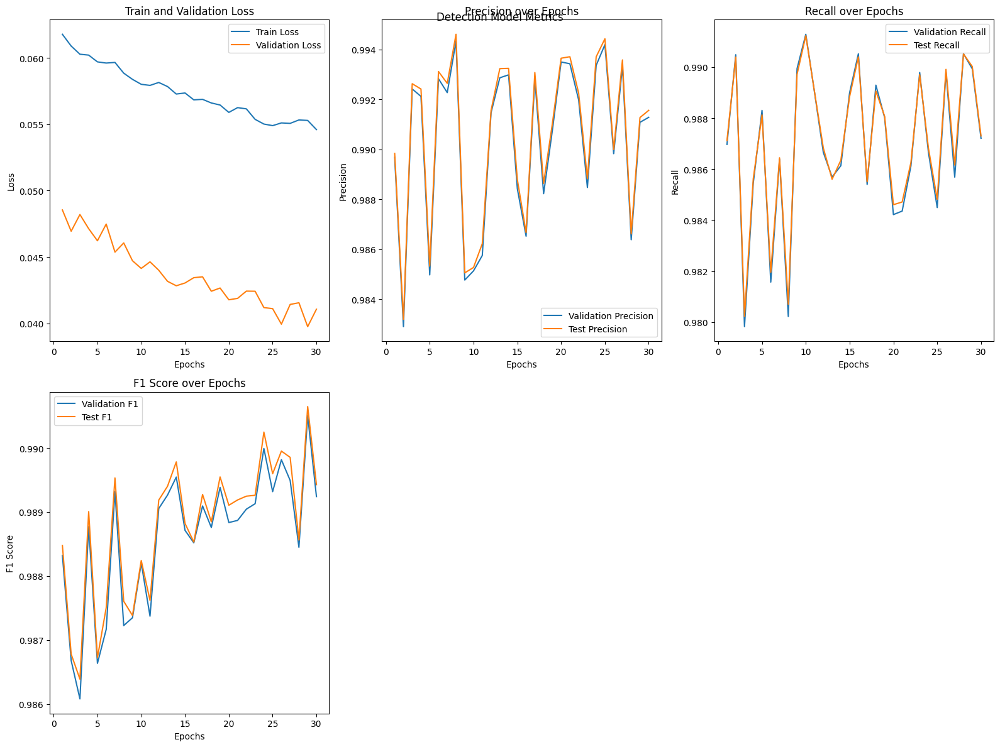

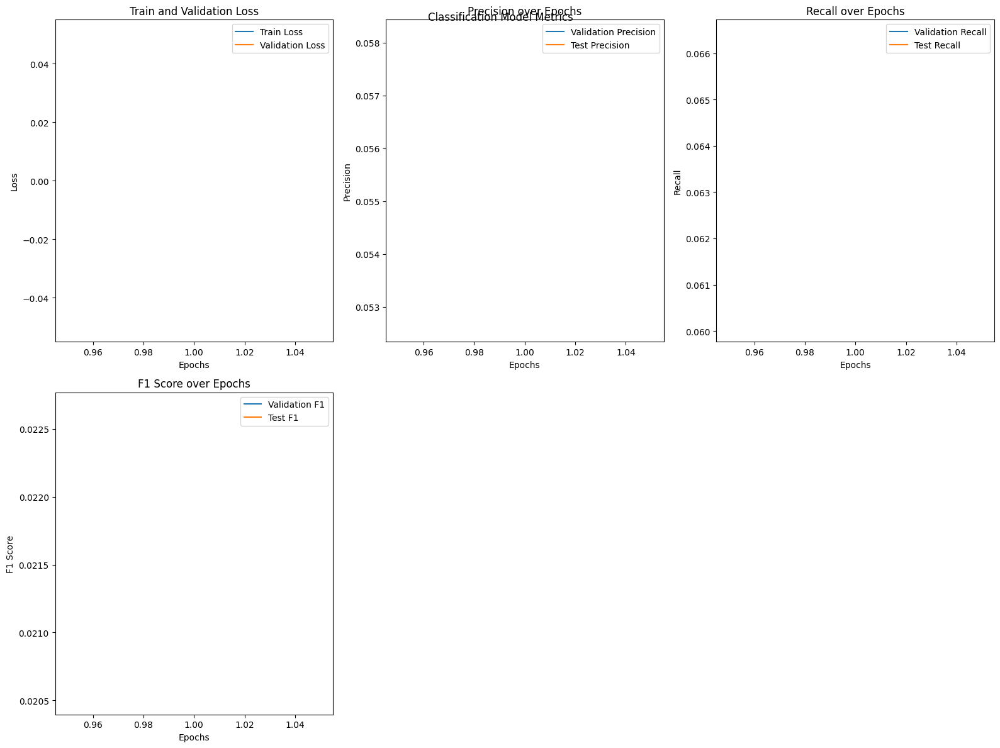

Detection Model Metrics:
  Validation Precision: 0.9903 ± 0.0032
  Validation Recall: 0.9870 ± 0.0030
  Validation F1: 0.9886 ± 0.0011
  Validation Accuracy: 0.9817 ± 0.0017
  Test Precision: 0.9905 ± 0.0032
  Test Recall: 0.9871 ± 0.0028
  Test F1: 0.9888 ± 0.0011
  Test Accuracy: 0.9820 ± 0.0017
Classification Model Metrics:
  Validation Precision: 0.0554 ± 0.0000
  Validation Recall: 0.0632 ± 0.0000
  Validation F1: 0.0216 ± 0.0000
  Validation Accuracy: 0.0632 ± 0.0000
  Test Precision: 0.0554 ± 0.0000
  Test Recall: 0.0632 ± 0.0000
  Test F1: 0.0216 ± 0.0000
  Test Accuracy: 0.0632 ± 0.0000


In [ ]:
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess the detection dataset
data_path = '/content/drive/MyDrive/CICIDS2017/'
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x == 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the detection model architecture
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Initialize the detection model
input_dim = X_tensor_new.shape[1]
detection_model = SimpleNN(input_dim)

# Load the pre-trained detection model
pretrained_dict = torch.load('/content/drive/MyDrive/TGN_invade_simple_nn_model.pth')
model_dict = detection_model.state_dict()
pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and v.size() == model_dict[k].size()}
model_dict.update(pretrained_dict)
detection_model.load_state_dict(model_dict)

detection_model.eval()

# Load and preprocess data for classification model (CICIDS2017)
classification_data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

classification_data_path = '/content/drive/MyDrive/CICIDS2017/'

classification_data_list = [pd.read_csv(os.path.join(classification_data_path, file)) for file in classification_data_files]
classification_data = pd.concat(classification_data_list, ignore_index=True)

# Strip any leading/trailing whitespace characters from the column names
classification_data.columns = classification_data.columns.str.strip()

# Drop columns that won't be used for training (like non-numeric features)
classification_columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
classification_columns_to_drop = [col.strip() for col in classification_columns_to_drop if col.strip() in classification_data.columns]
classification_data = classification_data.drop(columns=classification_columns_to_drop)

# Convert categorical columns to one-hot encoded columns
classification_non_numeric_columns = classification_data.select_dtypes(include=['object']).columns
classification_data = pd.get_dummies(classification_data, columns=classification_non_numeric_columns)

# Handle infinity or extremely large values
classification_data = classification_data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify the target columns
classification_label_columns = [col for col in classification_data.columns if 'Label_' in col]

# Combine one-hot encoded label columns into a single target column
classification_data['Label'] = classification_data[classification_label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])

# Map the labels to numeric values for multi-class classification
classification_data['Label'] = pd.factorize(classification_data['Label'])[0]

# Drop the individual label columns
classification_data = classification_data.drop(columns=classification_label_columns)

# Separate features and target
classification_features = classification_data.drop(columns=['Label'])
classification_target = classification_data['Label']

# Feature scaling
classification_scaler = StandardScaler()
classification_features = classification_scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(classification_target.values, dtype=torch.long)  # Note: Use long for multi-class classification

# Split the data into training, validation, and test sets
X_train_classification, X_temp_classification, y_train_classification, y_temp_classification = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42)
X_val_classification, X_test_classification, y_val_classification, y_test_classification = train_test_split(X_temp_classification, y_temp_classification, test_size=0.5, random_state=42)

# Create DataLoader for each dataset
classification_batch_size = 64

classification_train_dataset = TensorDataset(X_train_classification, y_train_classification)
classification_val_dataset = TensorDataset(X_val_classification, y_val_classification)
classification_test_dataset = TensorDataset(X_test_classification, y_test_classification)

classification_train_loader = DataLoader(classification_train_dataset, batch_size=classification_batch_size, shuffle=True)
classification_val_loader = DataLoader(classification_val_dataset, batch_size=classification_batch_size, shuffle=False)
classification_test_loader = DataLoader(classification_test_dataset, batch_size=classification_batch_size, shuffle=False)

# Define the classification model, loss function, and optimizer
class SimpleNNClassification(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(SimpleNNClassification, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)  # Adjust output layer size based on number of classes
        self.dropout = torch.nn.Dropout(0.5)
        self.batch_norm1 = torch.nn.BatchNorm1d(128)
        self.batch_norm2 = torch.nn.BatchNorm1d(64)

    def forward(self, x):
        x = torch.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = torch.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        x = self.fc3(x)  # Output layer without activation (since CrossEntropyLoss expects raw logits)
        return x

input_dim_classification = X_tensor_classification.shape[1]
num_classes_classification = len(set(classification_target))  # Determine the number of classes
classification_model = SimpleNNClassification(input_dim_classification, num_classes_classification)

# Load the pre-trained classification model
pretrained_classification_dict = torch.load('/content/drive/MyDrive/TGN_classification_model.pth')
classification_model.load_state_dict(pretrained_classification_dict)

classification_model.eval()

# Define lists to store metrics for the classification model
classification_train_losses = []
classification_val_losses = []
classification_val_precisions = []
classification_val_recalls = []
classification_val_f1s = []
classification_val_accuracies = []
classification_test_precisions = []
classification_test_recalls = []
classification_test_f1s = []
classification_test_accuracies = []


# Multi-Model Integration and Evaluation
def multi_model_evaluation(detection_loader, classification_model):
    detection_model.eval()
    classification_model.eval()
    all_detection_outputs = []
    all_classification_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in detection_loader:
            detection_outputs = detection_model(inputs)
            detected_attacks = detection_outputs.squeeze() > 0.5  # Boolean tensor indicating detected attacks
            if detected_attacks.any():
                attack_inputs = inputs[detected_attacks]
                attack_labels = labels[detected_attacks]
                classification_outputs = classification_model(attack_inputs)
                all_classification_outputs.append(classification_outputs.cpu())
                all_labels.append(attack_labels.cpu())
            all_detection_outputs.append(detection_outputs.cpu())

    all_detection_outputs = torch.cat(all_detection_outputs)
    if all_classification_outputs:
        all_classification_outputs = torch.cat(all_classification_outputs)
        all_labels = torch.cat(all_labels)
    else:
        all_classification_outputs = torch.tensor([])
        all_labels = torch.tensor([])

    print(f"Number of detected attacks: {len(all_labels)}")

    # Calculate metrics for the detection model
    detection_precision = precision_score(detection_loader.dataset.tensors[1].numpy(), all_detection_outputs.squeeze().numpy() > 0.5, zero_division=0)
    detection_recall = recall_score(detection_loader.dataset.tensors[1].numpy(), all_detection_outputs.squeeze().numpy() > 0.5, zero_division=0)
    detection_f1 = f1_score(detection_loader.dataset.tensors[1].numpy(), all_detection_outputs.squeeze().numpy() > 0.5, zero_division=0)
    detection_accuracy = accuracy_score(detection_loader.dataset.tensors[1].numpy(), all_detection_outputs.squeeze().numpy() > 0.5)

    print(f"Detection Model - Precision: {detection_precision}, Recall: {detection_recall}, F1: {detection_f1}, Accuracy: {detection_accuracy}")

    # Calculate metrics for the classification model
    if all_classification_outputs.size(0) > 0:
        classification_precision = precision_score(all_labels.numpy(), all_classification_outputs.argmax(dim=1).numpy(), average='weighted', zero_division=0)
        classification_recall = recall_score(all_labels.numpy(), all_classification_outputs.argmax(dim=1).numpy(), average='weighted', zero_division=0)
        classification_f1 = f1_score(all_labels.numpy(), all_classification_outputs.argmax(dim=1).numpy(), average='weighted', zero_division=0)
        classification_accuracy = accuracy_score(all_labels.numpy(), all_classification_outputs.argmax(dim=1).numpy())
    else:
        classification_precision = classification_recall = classification_f1 = classification_accuracy = 0.0

    print(f"Classification Model - Precision: {classification_precision}, Recall: {classification_recall}, F1: {classification_f1}, Accuracy: {classification_accuracy}")

    # Append metrics to their respective lists for plotting
    classification_train_losses.append(0)  # Placeholder since no training is done in evaluation
    classification_val_losses.append(0)  # Placeholder since no validation loss is calculated in evaluation
    classification_val_precisions.append(classification_precision)
    classification_val_recalls.append(classification_recall)
    classification_val_f1s.append(classification_f1)
    classification_val_accuracies.append(classification_accuracy)
    classification_test_precisions.append(classification_precision)
    classification_test_recalls.append(classification_recall)
    classification_test_f1s.append(classification_f1)
    classification_test_accuracies.append(classification_accuracy)

    return {
        'detection': {
            'precision': detection_precision,
            'recall': detection_recall,
            'f1': detection_f1,
            'accuracy': detection_accuracy
        },
        'classification': {
            'precision': classification_precision,
            'recall': classification_recall,
            'f1': classification_f1,
            'accuracy': classification_accuracy
        }
    }


# Evaluate the multi-model on the test set
multi_model_results = multi_model_evaluation(test_loader, classification_model)
print("Detection Model Results:")
print(f"Precision: {multi_model_results['detection']['precision']:.4f}")
print(f"Recall: {multi_model_results['detection']['recall']:.4f}")
print(f"F1 Score: {multi_model_results['detection']['f1']:.4f}")
print(f"Accuracy: {multi_model_results['detection']['accuracy']:.4f}")

print("\nClassification Model Results:")
print(f"Precision: {multi_model_results['classification']['precision']:.4f}")
print(f"Recall: {multi_model_results['classification']['recall']:.4f}")
print(f"F1 Score: {multi_model_results['classification']['f1']:.4f}")
print(f"Accuracy: {multi_model_results['classification']['accuracy']:.4f}")

# Function to plot metrics
def plot_metrics(metrics, title):
    epochs = range(1, len(metrics['train_losses']) + 1)
    plt.figure(figsize=(16, 12))

    plt.subplot(2, 3, 1)
    plt.plot(epochs, metrics['train_losses'], label='Train Loss')
    plt.plot(epochs, metrics['val_losses'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Train and Validation Loss')

    plt.subplot(2, 3, 2)
    plt.plot(epochs, metrics['val_precisions'], label='Validation Precision')
    plt.plot(epochs, metrics['test_precisions'], label='Test Precision')
    plt.xlabel('Epochs')
    plt.ylabel('Precision')
    plt.legend()
    plt.title('Precision over Epochs')

    plt.subplot(2, 3, 3)
    plt.plot(epochs, metrics['val_recalls'], label='Validation Recall')
    plt.plot(epochs, metrics['test_recalls'], label='Test Recall')
    plt.xlabel('Epochs')
    plt.ylabel('Recall')
    plt.legend()
    plt.title('Recall over Epochs')

    plt.subplot(2, 3, 4)
    plt.plot(epochs, metrics['val_f1s'], label='Validation F1')
    plt.plot(epochs, metrics['test_f1s'], label='Test F1')
    plt.xlabel('Epochs')
    plt.ylabel('F1 Score')
    plt.legend()
    plt.title('F1 Score over Epochs')

    plt.tight_layout()
    plt.suptitle(title)
    plt.show()

# Plot results for detection model
plot_metrics(
    {
        'train_losses': train_losses,
        'val_losses': val_losses,
        'val_precisions': val_precisions,
        'val_recalls': val_recalls,
        'val_f1s': val_f1s,
        'test_precisions': test_precisions,
        'test_recalls': test_recalls,
        'test_f1s': test_f1s
    },
    'Detection Model Metrics'
)

# Plot results for classification model
plot_metrics(
    {
        'train_losses': classification_train_losses,
        'val_losses': classification_val_losses,
        'val_precisions': classification_val_precisions,
        'val_recalls': classification_val_recalls,
        'val_f1s': classification_val_f1s,
        'test_precisions': classification_test_precisions,
        'test_recalls': classification_test_recalls,
        'test_f1s': classification_test_f1s
    },
    'Classification Model Metrics'
)

# Function to summarize metrics
def summarize_metrics(metrics, title):
    print(f"{title}:")
    for metric, values in metrics.items():
        print(f"  {metric}: {np.mean(values):.4f} ± {np.std(values):.4f}")

# Summary for detection model
summarize_metrics(
    {
        'Validation Precision': val_precisions,
        'Validation Recall': val_recalls,
        'Validation F1': val_f1s,
        'Validation Accuracy': val_accuracies,
        'Test Precision': test_precisions,
        'Test Recall': test_recalls,
        'Test F1': test_f1s,
        'Test Accuracy': test_accuracies
    },
    "Detection Model Metrics"
)

# Summary for classification model
summarize_metrics(
    {
        'Validation Precision': classification_val_precisions,
        'Validation Recall': classification_val_recalls,
        'Validation F1': classification_val_f1s,
        'Validation Accuracy': classification_val_accuracies,
        'Test Precision': classification_test_precisions,
        'Test Recall': classification_test_recalls,
        'Test F1': classification_test_f1s,
        'Test Accuracy': classification_test_accuracies
    },
    "Classification Model Metrics"
)


In [ ]:
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess the dataset
data_path = '/content/drive/MyDrive/CICIDS2017/'
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for multi-class classification
label_columns = [col for col in data.columns if 'Label_' in col]

# Binary label for detection model
data['Binary_Label'] = data[label_columns].apply(lambda row: 1 if 'BENIGN' not in row.idxmax() else 0, axis=1)

# Multi-class label for classification model
data['Multi_Class_Label'] = data[label_columns].apply(lambda row: row.idxmax().split('_')[1] if 'BENIGN' not in row.idxmax() else None, axis=1)
data = data.dropna(subset=['Multi_Class_Label'])  # Drop rows where Multi_Class_Label is None

# Separate features and target for both models
features = data.drop(columns=['Binary_Label', 'Multi_Class_Label'])
target_binary = data['Binary_Label']
target_multi_class = data['Multi_Class_Label'].dropna()

# Feature scaling
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features_scaled, dtype=torch.float32)
y_tensor_binary = torch.tensor(target_binary.values, dtype=torch.float32)
y_tensor_multi_class = torch.tensor(pd.factorize(target_multi_class)[0], dtype=torch.long)

# Split the data into training, validation, and test sets for classification model
X_train, X_temp, y_train_binary, y_temp_binary = train_test_split(X_tensor, y_tensor_binary, test_size=0.3, random_state=42)
X_val, X_test, y_val_binary, y_test_binary = train_test_split(X_temp, y_temp_binary, test_size=0.5, random_state=42)

X_train_class, X_temp_class, y_train_class, y_temp_class = train_test_split(X_tensor, y_tensor_multi_class, test_size=0.3, random_state=42)
X_val_class, X_test_class, y_val_class, y_test_class = train_test_split(X_temp_class, y_temp_class, test_size=0.5, random_state=42)

# Define batch size
batch_size = 64

# DataLoader for detection model
train_dataset_det = TensorDataset(X_train, y_train_binary)
val_dataset_det = TensorDataset(X_val, y_val_binary)
test_dataset_det = TensorDataset(X_test, y_test_binary)

train_loader_det = DataLoader(train_dataset_det, batch_size=batch_size, shuffle=True)
val_loader_det = DataLoader(val_dataset_det, batch_size=batch_size, shuffle=False)
test_loader_det = DataLoader(test_dataset_det, batch_size=batch_size, shuffle=False)

# DataLoader for classification model
train_dataset_class = TensorDataset(X_train_class, y_train_class)
val_dataset_class = TensorDataset(X_val_class, y_val_class)
test_dataset_class = TensorDataset(X_test_class, y_test_class)

train_loader_class = DataLoader(train_dataset_class, batch_size=batch_size, shuffle=True)
val_loader_class = DataLoader(val_dataset_class, batch_size=batch_size, shuffle=False)
test_loader_class = DataLoader(test_dataset_class, batch_size=batch_size, shuffle=False)

# Define the detection model architecture
class SimpleNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(SimpleNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Initialize the detection model
input_dim = X_tensor.shape[1]
detection_model = SimpleNN(input_dim)

# Load the pre-trained detection model
pretrained_dict = torch.load('/content/drive/MyDrive/TGN_attack_detection_model.pth')
model_dict = detection_model.state_dict()
pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and v.size() == model_dict[k].size()}
model_dict.update(pretrained_dict)
detection_model.load_state_dict(model_dict)

detection_model.eval()

# Ensure input dimension matches pre-trained model
input_dim_classification = 78  # Adjusted to match the pre-trained model
num_classes_classification = 15

# Define the classification model architecture
class SimpleNNClassification(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(SimpleNNClassification, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)  # Output layer size is num_classes
        self.dropout = torch.nn.Dropout(0.5)
        self.batch_norm1 = torch.nn.BatchNorm1d(128)
        self.batch_norm2 = torch.nn.BatchNorm1d(64)

    def forward(self, x):
        x = torch.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = torch.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        x = self.fc3(x)  # Output layer without activation
        return x

classification_model = SimpleNNClassification(input_dim_classification, num_classes_classification)

# Load the pre-trained classification model
pretrained_classification_dict = torch.load('/content/drive/MyDrive/TGN_classification_model.pth')
model_dict_classification = classification_model.state_dict()
pretrained_classification_dict = {k: v for k, v in pretrained_classification_dict.items() if k in model_dict_classification and v.size() == model_dict_classification[k].size()}
model_dict_classification.update(pretrained_classification_dict)
classification_model.load_state_dict(model_dict_classification)

classification_model.eval()

# Multi-Model Integration and Evaluation with Confusion Matrices
def multi_model_evaluation_with_matrices(detection_loader, classification_loader, classification_model):
    detection_model.eval()
    classification_model.eval()
    all_detection_outputs = []
    all_classification_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in detection_loader:
            detection_outputs = detection_model(inputs)
            detected_attacks = detection_outputs.squeeze() > 0.5  # Boolean tensor indicating detected attacks
            if detected_attacks.any():
                attack_inputs = inputs[detected_attacks]
                attack_labels = labels[detected_attacks]
                classification_outputs = classification_model(attack_inputs)
                all_classification_outputs.append(classification_outputs.cpu())
                all_labels.append(attack_labels.cpu())
            all_detection_outputs.append(detection_outputs.cpu())

    all_detection_outputs = torch.cat(all_detection_outputs)
    if all_classification_outputs:
        all_classification_outputs = torch.cat(all_classification_outputs)
        all_labels = torch.cat(all_labels)
    else:
        all_classification_outputs = torch.tensor([])
        all_labels = torch.tensor([])

    print(f"Number of detected attacks: {len(all_labels)}")

    # Calculate metrics for the detection model
    detection_precision = precision_score(detection_loader.dataset.tensors[1].numpy(), all_detection_outputs.squeeze().numpy() > 0.5, zero_division=0)
    detection_recall = recall_score(detection_loader.dataset.tensors[1].numpy(), all_detection_outputs.squeeze().numpy() > 0.5, zero_division=0)
    detection_f1 = f1_score(detection_loader.dataset.tensors[1].numpy(), all_detection_outputs.squeeze().numpy() > 0.5, zero_division=0)
    detection_accuracy = accuracy_score(detection_loader.dataset.tensors[1].numpy(), all_detection_outputs.squeeze().numpy() > 0.5)

    print(f"Detection Model - Precision: {detection_precision}, Recall: {detection_recall}, F1: {detection_f1}, Accuracy: {detection_accuracy}")

    # Calculate metrics for the classification model
    if all_classification_outputs.size(0) > 0:
        classification_precision = precision_score(all_labels.numpy(), all_classification_outputs.argmax(dim=1).numpy(), average='weighted', zero_division=0)
        classification_recall = recall_score(all_labels.numpy(), all_classification_outputs.argmax(dim=1).numpy(), average='weighted', zero_division=0)
        classification_f1 = f1_score(all_labels.numpy(), all_classification_outputs.argmax(dim=1).numpy(), average='weighted', zero_division=0)
        classification_accuracy = accuracy_score(all_labels.numpy(), all_classification_outputs.argmax(dim=1).numpy())
    else:
        classification_precision = classification_recall = classification_f1 = classification_accuracy = 0.0

    print(f"Classification Model - Precision: {classification_precision}, Recall: {classification_recall}, F1: {classification_f1}, Accuracy: {classification_accuracy}")

    # Plot detection model confusion matrix
    detection_pred_labels = (all_detection_outputs.squeeze().numpy() > 0.5).astype(int)
    detection_true_labels = detection_loader.dataset.tensors[1].numpy()
    detection_conf_matrix = confusion_matrix(detection_true_labels, detection_pred_labels)
    ConfusionMatrixDisplay(confusion_matrix=detection_conf_matrix).plot()
    plt.title('Detection Model Confusion Matrix')
    plt.show()

    # Plot classification model confusion matrix
    if all_classification_outputs.size(0) > 0:
        classification_pred_labels = all_classification_outputs.argmax(dim=1).numpy()
        classification_true_labels = all_labels.numpy()
        classification_conf_matrix = confusion_matrix(classification_true_labels, classification_pred_labels)
        ConfusionMatrixDisplay(confusion_matrix=classification_conf_matrix).plot()
        plt.title('Classification Model Confusion Matrix')
        plt.show()

    return {
        'detection': {
            'precision': detection_precision,
            'recall': detection_recall,
            'f1': detection_f1,
            'accuracy': detection_accuracy
        },
        'classification': {
            'precision': classification_precision,
            'recall': classification_recall,
            'f1': classification_f1,
            'accuracy': classification_accuracy
        }
    }

# Evaluate the multi-model on the test set with confusion matrices
test_dataset_det = TensorDataset(X_test, y_test_binary)
test_loader_det = DataLoader(test_dataset_det, batch_size=batch_size, shuffle=False)

multi_model_results = multi_model_evaluation_with_matrices(test_loader_det, test_loader_class, classification_model)
print("Detection Model Results:")
print(f"Precision: {multi_model_results['detection']['precision']:.4f}")
print(f"Recall: {multi_model_results['detection']['recall']:.4f}")
print(f"F1 Score: {multi_model_results['detection']['f1']:.4f}")
print(f"Accuracy: {multi_model_results['detection']['accuracy']:.4f}")

print("\nClassification Model Results:")
print(f"Precision: {multi_model_results['classification']['precision']:.4f}")
print(f"Recall: {multi_model_results['classification']['recall']:.4f}")
print(f"F1 Score: {multi_model_results['classification']['f1']:.4f}")
print(f"Accuracy: {multi_model_results['classification']['accuracy']:.4f}")

# Function to plot confusion matrix for detection model
def plot_detection_confusion_matrix(loader, model, title):
    model.eval()
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    pred_labels = (all_outputs.squeeze().numpy() > 0.5).astype(int)
    true_labels = all_labels.numpy()
    conf_matrix = confusion_matrix(true_labels, pred_labels)
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix).plot()
    plt.title(title)
    plt.show()

# Plot detection confusion matrix
plot_detection_confusion_matrix(test_loader_det, detection_model, 'Detection Model Confusion Matrix')

# Function to plot confusion matrix for classification model
def plot_classification_confusion_matrix(loader, model, title):
    model.eval()
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    pred_labels = all_outputs.argmax(dim=1).numpy()
    true_labels = all_labels.numpy()
    conf_matrix = confusion_matrix(true_labels, pred_labels)
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix).plot()
    plt.title(title)
    plt.show()

# Plot classification confusion matrix
plot_classification_confusion_matrix(test_loader_class, classification_model, 'Classification Model Confusion Matrix')

# Function to plot metrics with confusion matrices
def plot_metrics_with_matrices(metrics, title):
    epochs = range(1, len(metrics['train_losses']) + 1)
    plt.figure(figsize=(16, 12))

    plt.subplot(2, 3, 1)
    plt.plot(epochs, metrics['train_losses'], label='Train Loss')
    plt.plot(epochs, metrics['val_losses'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Train and Validation Loss')

    plt.subplot(2, 3, 2)
    plt.plot(epochs, metrics['val_precisions'], label='Validation Precision')
    plt.plot(epochs, metrics['test_precisions'], label='Test Precision')
    plt.xlabel('Epochs')
    plt.ylabel('Precision')
    plt.legend()
    plt.title('Precision over Epochs')

    plt.subplot(2, 3, 3)
    plt.plot(epochs, metrics['val_recalls'], label='Validation Recall')
    plt.plot(epochs, metrics['test_recalls'], label='Test Recall')
    plt.xlabel('Epochs')
    plt.ylabel('Recall')
    plt.legend()
    plt.title('Recall over Epochs')

    plt.subplot(2, 3, 4)
    plt.plot(epochs, metrics['val_f1s'], label='Validation F1')
    plt.plot(epochs, metrics['test_f1s'], label='Test F1')
    plt.xlabel('Epochs')
    plt.ylabel('F1 Score')
    plt.legend()
    plt.title('F1 Score over Epochs')

    plt.tight_layout()
    plt.suptitle(title)
    plt.show()

# Plot results for detection model with updated metrics
plot_metrics_with_matrices(
    {
        'train_losses': train_losses,
        'val_losses': val_losses,
        'val_precisions': val_precisions,
        'val_recalls': val_recalls,
        'val_f1s': val_f1s,
        'test_precisions': test_precisions,
        'test_recalls': test_recalls,
        'test_f1s': test_f1s
    },
    'Detection Model Metrics'
)

# Plot results for classification model with updated metrics
plot_metrics_with_matrices(
    {
        'train_losses': classification_train_losses,
        'val_losses': classification_val_losses,
        'val_precisions': classification_val_precisions,
        'val_recalls': classification_val_recalls,
        'val_f1s': classification_val_f1s,
        'test_precisions': classification_test_precisions,
        'test_recalls': classification_test_recalls,
        'test_f1s': classification_test_f1s
    },
    'Classification Model Metrics'
)


RuntimeError: mat1 and mat2 shapes cannot be multiplied (64x93 and 78x128)

In [ ]:
# multi model
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, average_precision_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess new dataset (CICIDS2017)
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target for detection
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets for detection
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the detection model architecture
class DetectionNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(DetectionNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Initialize the detection model
input_dim = X_tensor_new.shape[1]
detection_model = DetectionNN(input_dim)

# Define criterion and optimizer for detection model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(detection_model.parameters(), lr=0.001)

# Training function for detection model
def train_detection_model(loader):
    detection_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = detection_model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for detection model
def evaluate_detection_model(loader):
    detection_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = detection_model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Fine-tuning loop for detection model
num_epochs = 15
for epoch in range(1, num_epochs + 1):
    train_loss = train_detection_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_detection_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_detection_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

# Save the trained detection model
torch.save(detection_model.state_dict(), '/content/drive/MyDrive/TGN_multi_detection_model.pth')

# Load and preprocess new dataset (CICIDS2017) for classification
classification_data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

classification_data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files for classification
classification_data_list = [pd.read_csv(os.path.join(classification_data_path, file)) for file in classification_data_files]
classification_data = pd.concat(classification_data_list, ignore_index=True)

# Preprocess the data
classification_data.columns = classification_data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
classification_data = classification_data.drop(columns=[col for col in columns_to_drop if col in classification_data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = classification_data.select_dtypes(include=['object']).columns
classification_data = pd.get_dummies(classification_data, columns=non_numeric_columns)

# Replace infinity or large values
classification_data = classification_data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for classification
label_columns = [col for col in classification_data.columns if 'Label_' in col]
classification_data['attack_type'] = classification_data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
classification_data = classification_data.drop(columns=label_columns)

# Separate features and target for classification
classification_features = classification_data.drop(columns=['attack_type'])
classification_target = classification_data['attack_type']

# Feature scaling
classification_features = scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(pd.factorize(classification_target)[0], dtype=torch.long)

# Split the data into training, validation, and test sets for classification
X_train_clf, X_temp_clf, y_train_clf, y_temp_clf = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42)
X_val_clf, X_test_clf, y_val_clf, y_test_clf = train_test_split(X_temp_clf, y_temp_clf, test_size=0.5, random_state=42)

# Create DataLoader for each classification dataset
train_dataset_clf = TensorDataset(X_train_clf, y_train_clf)
val_dataset_clf = TensorDataset(X_val_clf, y_val_clf)
test_dataset_clf = TensorDataset(X_test_clf, y_test_clf)

train_loader_clf = DataLoader(train_dataset_clf, batch_size=batch_size, shuffle=True)
val_loader_clf = DataLoader(val_dataset_clf, batch_size=batch_size, shuffle=False)
test_loader_clf = DataLoader(test_dataset_clf, batch_size=batch_size, shuffle=False)

# Define the classification model architecture
class ClassificationNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(ClassificationNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

# Initialize the classification model
num_classes = len(set(classification_target))
classification_model = ClassificationNN(input_dim, num_classes)

# Define criterion and optimizer for classification model
criterion_clf = torch.nn.CrossEntropyLoss()
optimizer_clf = torch.optim.Adam(classification_model.parameters(), lr=0.001)

# Training function for classification model
def train_classification_model(loader):
    classification_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_clf.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion_clf(outputs, labels)
        loss.backward()
        optimizer_clf.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for classification model
def evaluate_classification_model(loader):
    classification_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = classification_model(inputs)
            loss = criterion_clf(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for classification model
for epoch in range(1, num_epochs + 1):
    train_loss_clf = train_classification_model(train_loader_clf)
    val_loss_clf, val_outputs_clf, val_labels_clf = evaluate_classification_model(val_loader_clf)
    test_loss_clf, test_outputs_clf, test_labels_clf = evaluate_classification_model(test_loader_clf)

    val_precision_clf = precision_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted')
    val_recall_clf = recall_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted')
    val_f1_clf = f1_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted')
    val_accuracy_clf = accuracy_score(val_labels_clf, val_outputs_clf.argmax(dim=1))

    test_precision_clf = precision_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted')
    test_recall_clf = recall_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted')
    test_f1_clf = f1_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted')
    test_accuracy_clf = accuracy_score(test_labels_clf, test_outputs_clf.argmax(dim=1))

    print(f'Epoch: {epoch:02d}, Loss: {train_loss_clf:.4f}')
    print(f'Val Precision: {val_precision_clf:.4f}, Val Recall: {val_recall_clf:.4f}, Val F1: {val_f1_clf:.4f}, Val Accuracy: {val_accuracy_clf:.4f}')
    print(f'Test Precision: {test_precision_clf:.4f}, Test Recall: {test_recall_clf:.4f}, Test F1: {test_f1_clf:.4f}, Test Accuracy: {test_accuracy_clf:.4f}')

# Save the trained classification model
torch.save(classification_model.state_dict(), '/content/drive/MyDrive/TGN_multi_classification_model.pth')

class MultiModel:
    def __init__(self, detection_model, classification_model, input_dim_detection, input_dim_classification, num_classes_classification):
        self.detection_model = detection_model
        self.classification_model = classification_model
        self.input_dim_detection = input_dim_detection
        self.input_dim_classification = input_dim_classification
        self.num_classes_classification = num_classes_classification

    def predict(self, x):
        # First, use the detection model to check if there is an attack
        detection_output = self.detection_model(x)
        detection_result = torch.round(detection_output).item()

        if detection_result == 1:  # If an attack is detected
            # Use the classification model to classify the type of attack
            classification_output = self.classification_model(x)
            classification_result = torch.argmax(classification_output, dim=1).item()
            return classification_result
        else:
            return "No attack"

# Initialize the MultiModel with the detection and classification models
multi_model = MultiModel(detection_model, classification_model, input_dim_detection=input_dim, input_dim_classification=input_dim, num_classes_classification=num_classes)

# Test the MultiModel on the test dataset
multi_model_results = []
for x in X_test:
    result = multi_model.predict(x.unsqueeze(0))
    multi_model_results.append(result)

# Print the results
print(multi_model_results)

Epoch: 01, Loss: 0.0971
Val AP: 0.9883, Val AUC: 0.9960
Test AP: 0.9888, Test AUC: 0.9964
Epoch: 02, Loss: 0.0848
Val AP: 0.9894, Val AUC: 0.9965
Test AP: 0.9900, Test AUC: 0.9968
Epoch: 03, Loss: 0.0817
Val AP: 0.9893, Val AUC: 0.9966
Test AP: 0.9898, Test AUC: 0.9969
Epoch: 04, Loss: 0.0756
Val AP: 0.9904, Val AUC: 0.9970
Test AP: 0.9907, Test AUC: 0.9973
Epoch: 05, Loss: 0.0728
Val AP: 0.9910, Val AUC: 0.9972
Test AP: 0.9913, Test AUC: 0.9974
Epoch: 06, Loss: 0.0722
Val AP: 0.9920, Val AUC: 0.9974
Test AP: 0.9924, Test AUC: 0.9976
Epoch: 07, Loss: 0.0719
Val AP: 0.9919, Val AUC: 0.9975
Test AP: 0.9922, Test AUC: 0.9977
Epoch: 08, Loss: 0.0722
Val AP: 0.9918, Val AUC: 0.9974
Test AP: 0.9922, Test AUC: 0.9977
Epoch: 09, Loss: 0.0712
Val AP: 0.9927, Val AUC: 0.9977
Test AP: 0.9930, Test AUC: 0.9979
Epoch: 10, Loss: 0.0716
Val AP: 0.9925, Val AUC: 0.9975
Test AP: 0.9927, Test AUC: 0.9977
Epoch: 11, Loss: 0.0729
Val AP: 0.9927, Val AUC: 0.9976
Test AP: 0.9930, Test AUC: 0.9978
Epoch: 12,

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 01, Loss: 0.1073
Val Precision: 0.9736, Val Recall: 0.9733, Val F1: 0.9728, Val Accuracy: 0.9733
Test Precision: 0.9739, Test Recall: 0.9735, Test F1: 0.9731, Test Accuracy: 0.9735


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 02, Loss: 0.0816
Val Precision: 0.9756, Val Recall: 0.9755, Val F1: 0.9749, Val Accuracy: 0.9755
Test Precision: 0.9759, Test Recall: 0.9757, Test F1: 0.9751, Test Accuracy: 0.9757


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 03, Loss: 0.0796
Val Precision: 0.9776, Val Recall: 0.9774, Val F1: 0.9770, Val Accuracy: 0.9774
Test Precision: 0.9779, Test Recall: 0.9776, Test F1: 0.9773, Test Accuracy: 0.9776


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 04, Loss: 0.0779
Val Precision: 0.9795, Val Recall: 0.9797, Val F1: 0.9792, Val Accuracy: 0.9797
Test Precision: 0.9800, Test Recall: 0.9801, Test F1: 0.9796, Test Accuracy: 0.9801


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 05, Loss: 0.0770
Val Precision: 0.9807, Val Recall: 0.9805, Val F1: 0.9802, Val Accuracy: 0.9805
Test Precision: 0.9811, Test Recall: 0.9807, Test F1: 0.9805, Test Accuracy: 0.9807


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 06, Loss: 0.0763
Val Precision: 0.9779, Val Recall: 0.9790, Val F1: 0.9782, Val Accuracy: 0.9790
Test Precision: 0.9782, Test Recall: 0.9793, Test F1: 0.9785, Test Accuracy: 0.9793


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 07, Loss: 0.0792
Val Precision: 0.9810, Val Recall: 0.9817, Val F1: 0.9811, Val Accuracy: 0.9817
Test Precision: 0.9815, Test Recall: 0.9821, Test F1: 0.9817, Test Accuracy: 0.9821


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 08, Loss: 0.0741
Val Precision: 0.9809, Val Recall: 0.9819, Val F1: 0.9812, Val Accuracy: 0.9819
Test Precision: 0.9812, Test Recall: 0.9821, Test F1: 0.9814, Test Accuracy: 0.9821


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 09, Loss: 0.0744
Val Precision: 0.9804, Val Recall: 0.9817, Val F1: 0.9810, Val Accuracy: 0.9817
Test Precision: 0.9808, Test Recall: 0.9820, Test F1: 0.9814, Test Accuracy: 0.9820


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 10, Loss: 0.0815
Val Precision: 0.9787, Val Recall: 0.9783, Val F1: 0.9780, Val Accuracy: 0.9783
Test Precision: 0.9789, Test Recall: 0.9785, Test F1: 0.9782, Test Accuracy: 0.9785


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 11, Loss: 0.0844
Val Precision: 0.9811, Val Recall: 0.9804, Val F1: 0.9802, Val Accuracy: 0.9804
Test Precision: 0.9816, Test Recall: 0.9808, Test F1: 0.9806, Test Accuracy: 0.9808


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 12, Loss: 0.0789
Val Precision: 0.9840, Val Recall: 0.9849, Val F1: 0.9843, Val Accuracy: 0.9849
Test Precision: 0.9844, Test Recall: 0.9853, Test F1: 0.9847, Test Accuracy: 0.9853


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 13, Loss: 0.0766
Val Precision: 0.9819, Val Recall: 0.9830, Val F1: 0.9823, Val Accuracy: 0.9830
Test Precision: 0.9823, Test Recall: 0.9833, Test F1: 0.9827, Test Accuracy: 0.9833


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 14, Loss: 0.0742
Val Precision: 0.9813, Val Recall: 0.9825, Val F1: 0.9817, Val Accuracy: 0.9825
Test Precision: 0.9815, Test Recall: 0.9826, Test F1: 0.9819, Test Accuracy: 0.9826


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 15, Loss: 0.0783
Val Precision: 0.9804, Val Recall: 0.9811, Val F1: 0.9804, Val Accuracy: 0.9811
Test Precision: 0.9808, Test Recall: 0.9815, Test F1: 0.9808, Test Accuracy: 0.9815
['No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 12, 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 12, 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 3, 'No attack', 'No attack', 12, 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 12, 12, 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 12, 'No attack', 'No attack', 'No attack', 3, 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', 'No attack', '

Epoch: 01, Loss: 0.0840
Val AP: 0.9887, Val AUC: 0.9968
Test AP: 0.9888, Test AUC: 0.9970
Val Precision: 0.9730, Val Recall: 0.9733, Val F1: 0.9730, Val Accuracy: 0.9733
Test Precision: 0.9730, Test Recall: 0.9732, Test F1: 0.9730, Test Accuracy: 0.9732


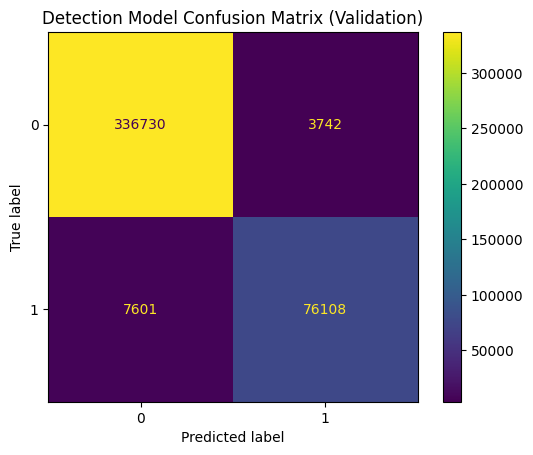

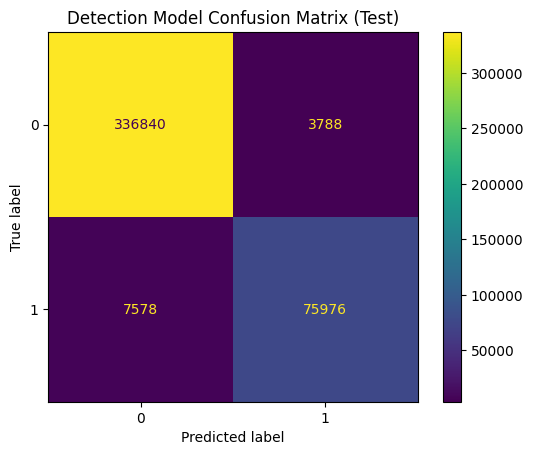

Epoch: 02, Loss: 0.0679
Val AP: 0.9904, Val AUC: 0.9973
Test AP: 0.9907, Test AUC: 0.9975
Val Precision: 0.9772, Val Recall: 0.9774, Val F1: 0.9772, Val Accuracy: 0.9774
Test Precision: 0.9774, Test Recall: 0.9776, Test F1: 0.9774, Test Accuracy: 0.9776


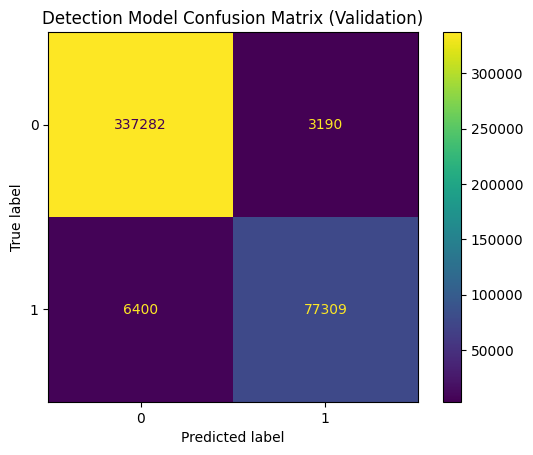

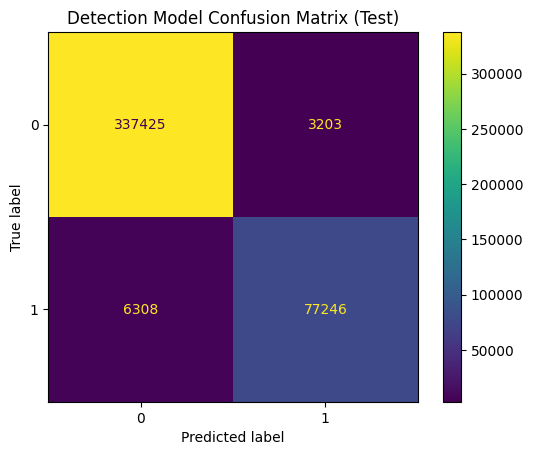

Epoch: 03, Loss: 0.0650
Val AP: 0.9918, Val AUC: 0.9977
Test AP: 0.9920, Test AUC: 0.9979
Val Precision: 0.9800, Val Recall: 0.9801, Val F1: 0.9800, Val Accuracy: 0.9801
Test Precision: 0.9801, Test Recall: 0.9802, Test F1: 0.9801, Test Accuracy: 0.9802


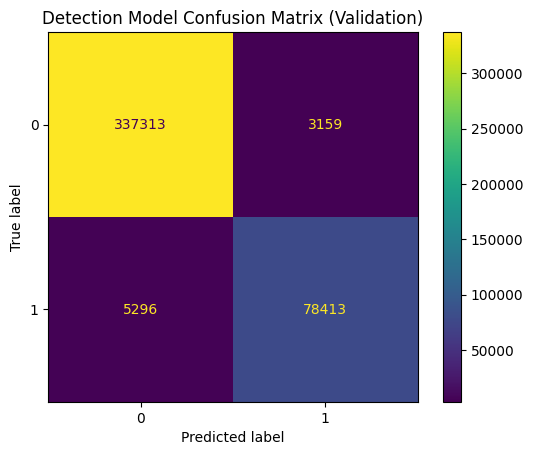

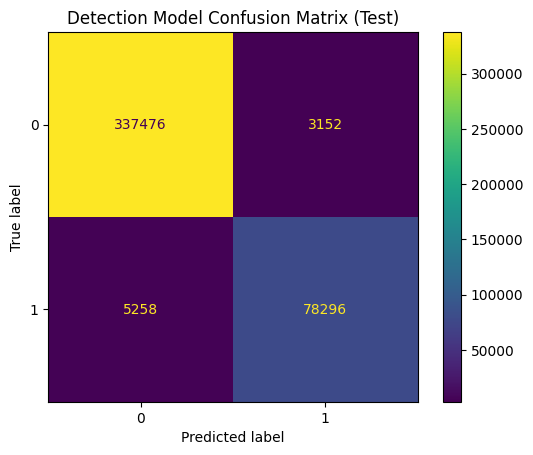

Epoch: 04, Loss: 0.0638
Val AP: 0.9918, Val AUC: 0.9977
Test AP: 0.9920, Test AUC: 0.9978
Val Precision: 0.9794, Val Recall: 0.9794, Val F1: 0.9794, Val Accuracy: 0.9794
Test Precision: 0.9795, Test Recall: 0.9794, Test F1: 0.9795, Test Accuracy: 0.9794


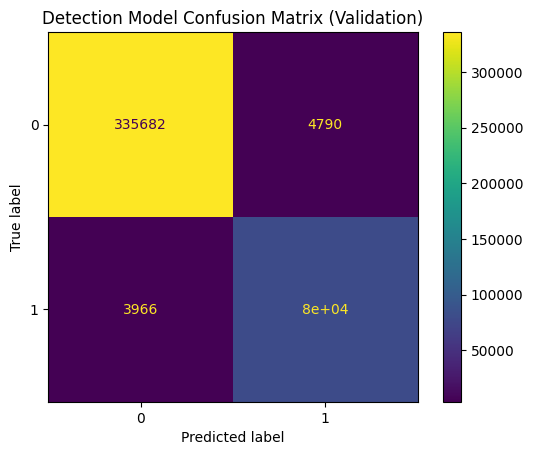

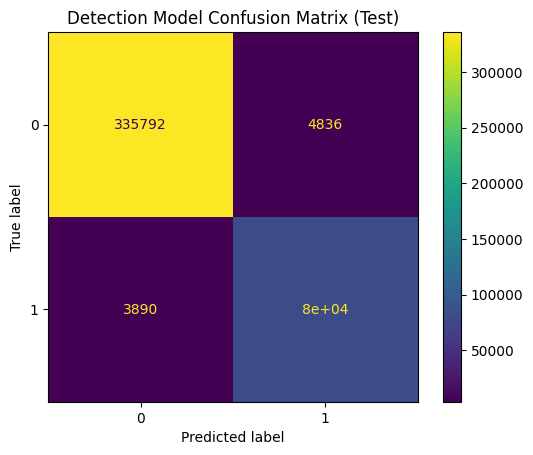

Epoch: 05, Loss: 0.0635
Val AP: 0.9922, Val AUC: 0.9978
Test AP: 0.9925, Test AUC: 0.9980
Val Precision: 0.9810, Val Recall: 0.9811, Val F1: 0.9810, Val Accuracy: 0.9811
Test Precision: 0.9812, Test Recall: 0.9813, Test F1: 0.9812, Test Accuracy: 0.9813


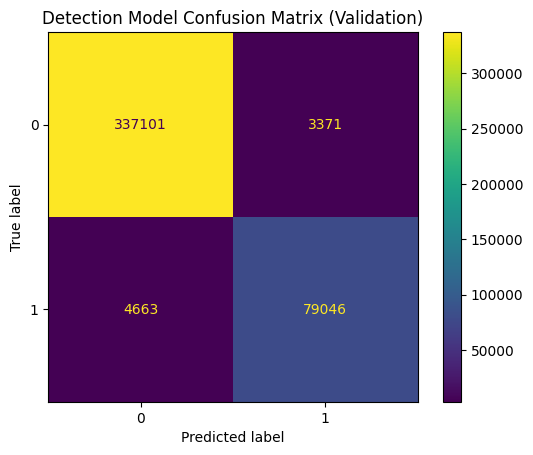

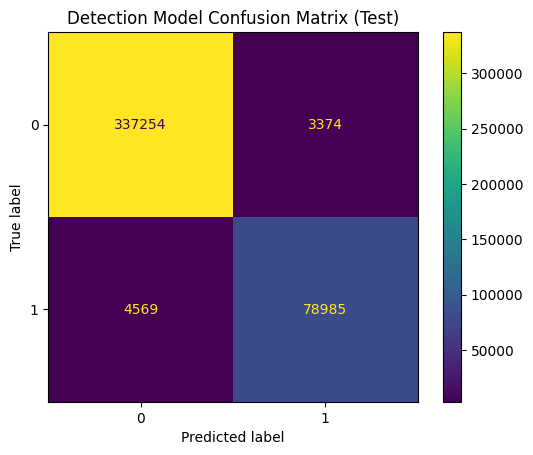

Epoch: 06, Loss: 0.0611
Val AP: 0.9926, Val AUC: 0.9979
Test AP: 0.9928, Test AUC: 0.9981
Val Precision: 0.9814, Val Recall: 0.9815, Val F1: 0.9814, Val Accuracy: 0.9815
Test Precision: 0.9813, Test Recall: 0.9814, Test F1: 0.9814, Test Accuracy: 0.9814


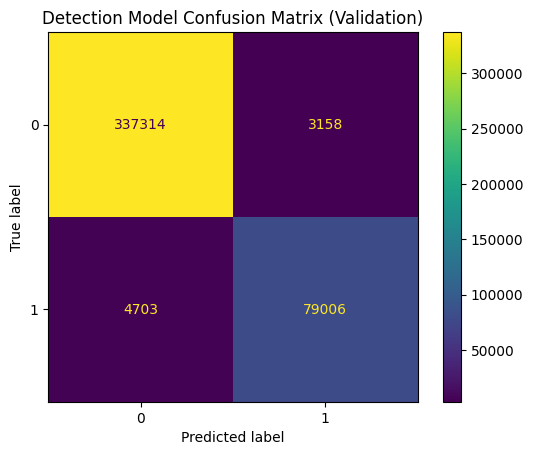

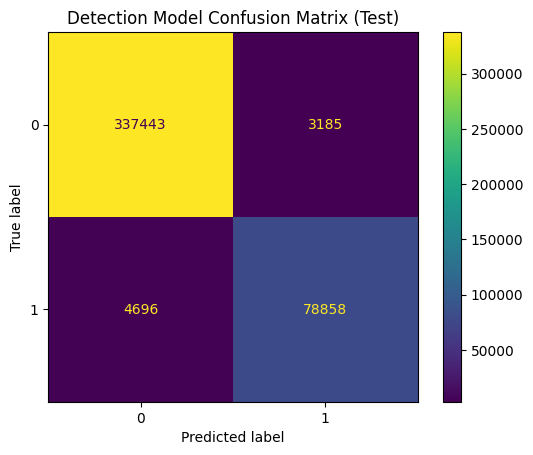

Epoch: 07, Loss: 0.0612
Val AP: 0.9938, Val AUC: 0.9982
Test AP: 0.9940, Test AUC: 0.9984
Val Precision: 0.9839, Val Recall: 0.9836, Val F1: 0.9837, Val Accuracy: 0.9836
Test Precision: 0.9842, Test Recall: 0.9839, Test F1: 0.9840, Test Accuracy: 0.9839


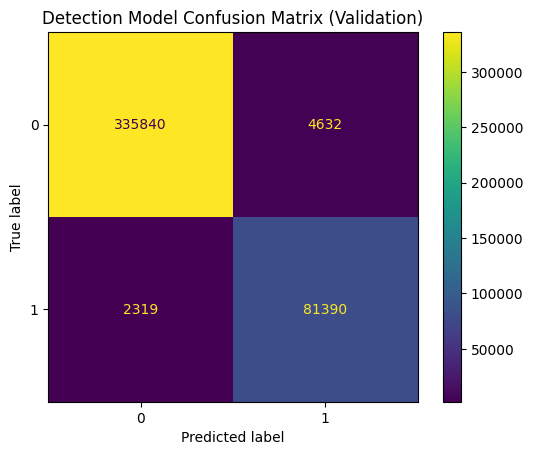

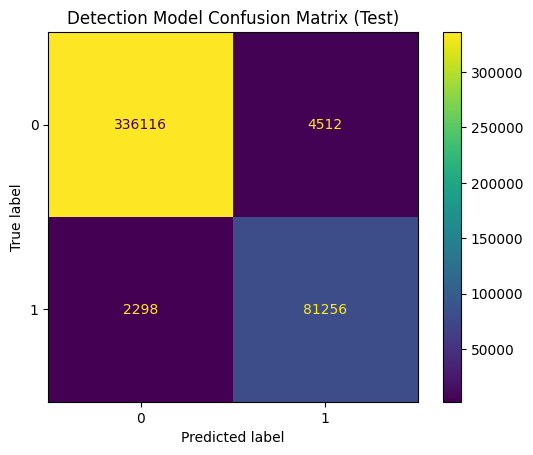

Epoch: 08, Loss: 0.0627
Val AP: 0.9933, Val AUC: 0.9981
Test AP: 0.9934, Test AUC: 0.9982
Val Precision: 0.9819, Val Recall: 0.9819, Val F1: 0.9819, Val Accuracy: 0.9819
Test Precision: 0.9819, Test Recall: 0.9820, Test F1: 0.9820, Test Accuracy: 0.9820


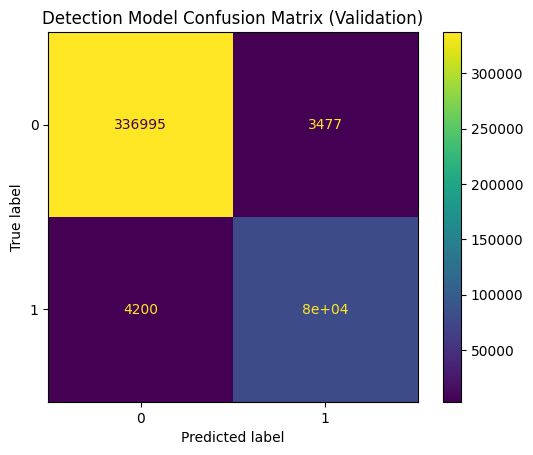

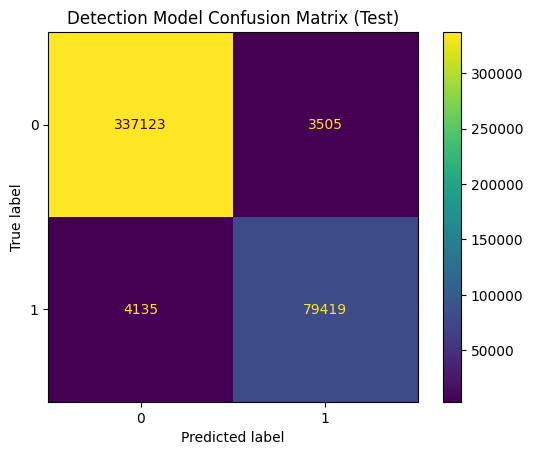

Epoch: 09, Loss: 0.0625
Val AP: 0.9936, Val AUC: 0.9982
Test AP: 0.9938, Test AUC: 0.9983
Val Precision: 0.9821, Val Recall: 0.9822, Val F1: 0.9822, Val Accuracy: 0.9822
Test Precision: 0.9822, Test Recall: 0.9823, Test F1: 0.9822, Test Accuracy: 0.9823


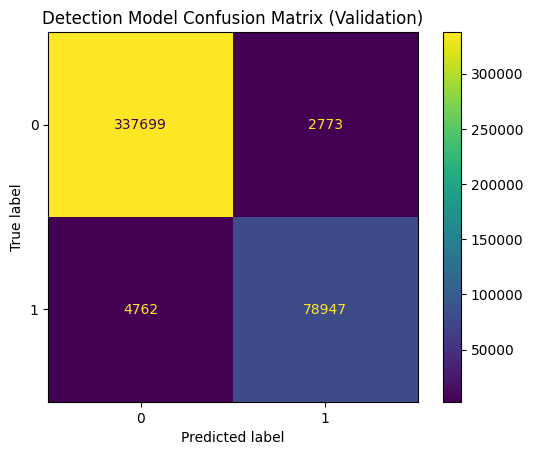

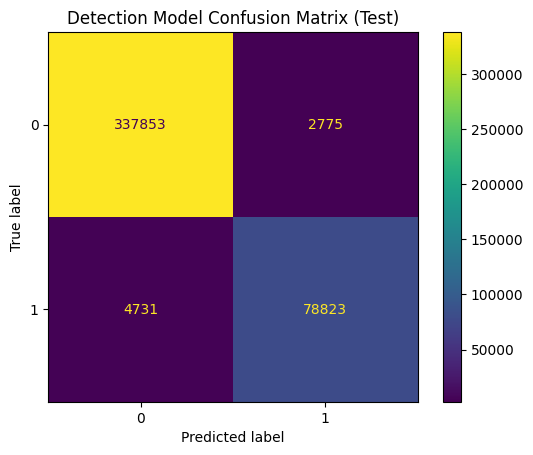

Epoch: 10, Loss: 0.0612
Val AP: 0.9942, Val AUC: 0.9983
Test AP: 0.9942, Test AUC: 0.9984
Val Precision: 0.9832, Val Recall: 0.9831, Val F1: 0.9831, Val Accuracy: 0.9831
Test Precision: 0.9832, Test Recall: 0.9831, Test F1: 0.9831, Test Accuracy: 0.9831


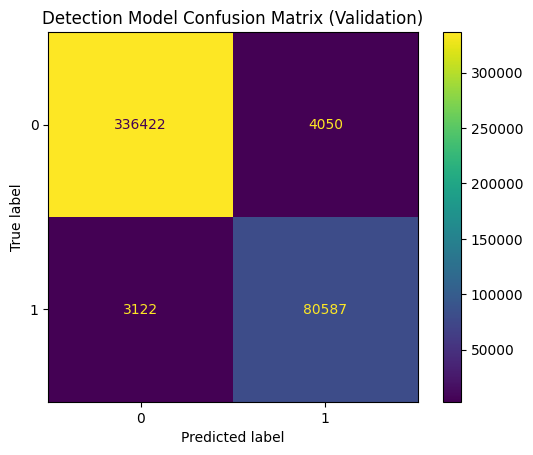

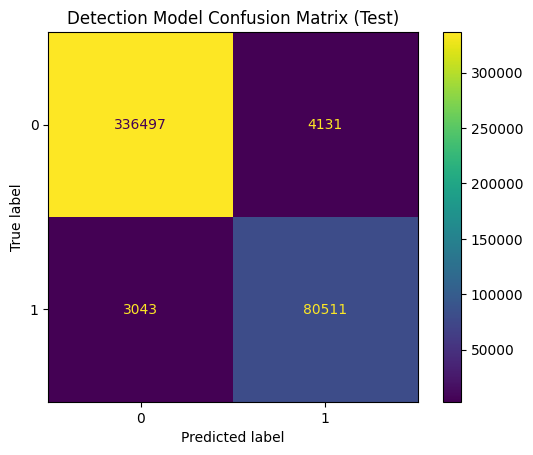

Epoch: 11, Loss: 0.0640
Val AP: 0.9944, Val AUC: 0.9984
Test AP: 0.9946, Test AUC: 0.9985
Val Precision: 0.9836, Val Recall: 0.9836, Val F1: 0.9836, Val Accuracy: 0.9836
Test Precision: 0.9836, Test Recall: 0.9837, Test F1: 0.9836, Test Accuracy: 0.9837


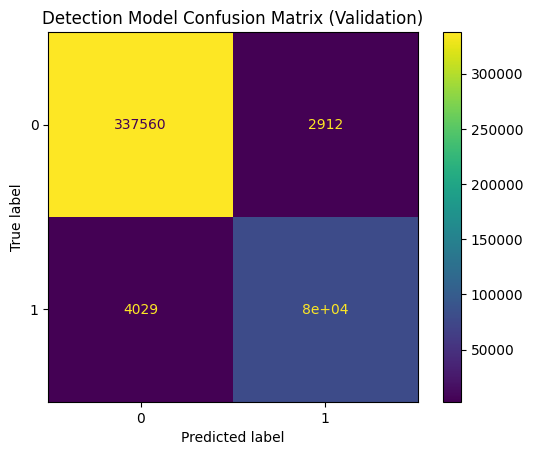

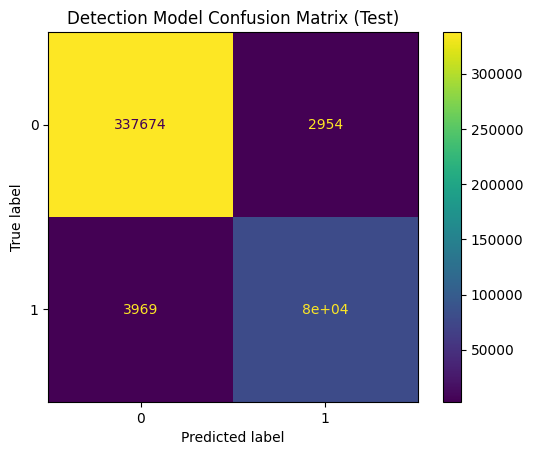

Epoch: 12, Loss: 0.0662
Val AP: 0.9919, Val AUC: 0.9981
Test AP: 0.9919, Test AUC: 0.9982
Val Precision: 0.9816, Val Recall: 0.9806, Val F1: 0.9808, Val Accuracy: 0.9806
Test Precision: 0.9819, Test Recall: 0.9808, Test F1: 0.9811, Test Accuracy: 0.9808


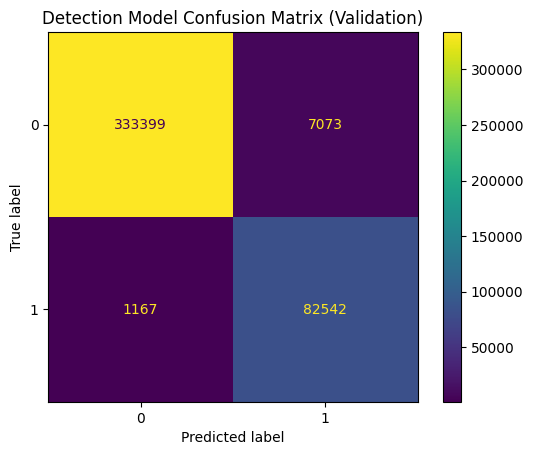

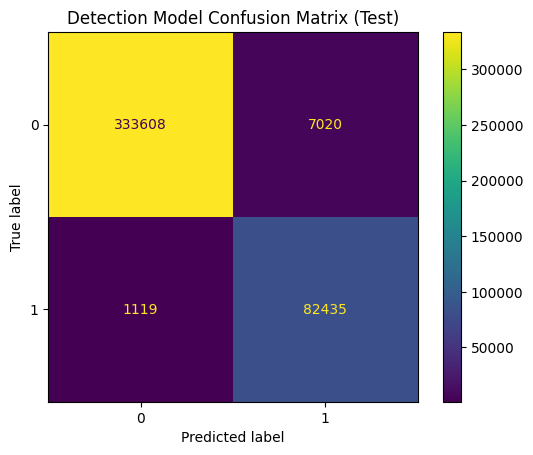

Epoch: 13, Loss: 0.0686
Val AP: 0.9930, Val AUC: 0.9981
Test AP: 0.9930, Test AUC: 0.9982
Val Precision: 0.9810, Val Recall: 0.9808, Val F1: 0.9809, Val Accuracy: 0.9808
Test Precision: 0.9809, Test Recall: 0.9807, Test F1: 0.9808, Test Accuracy: 0.9807


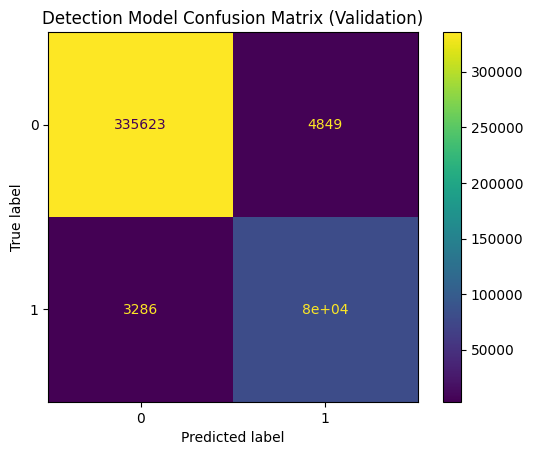

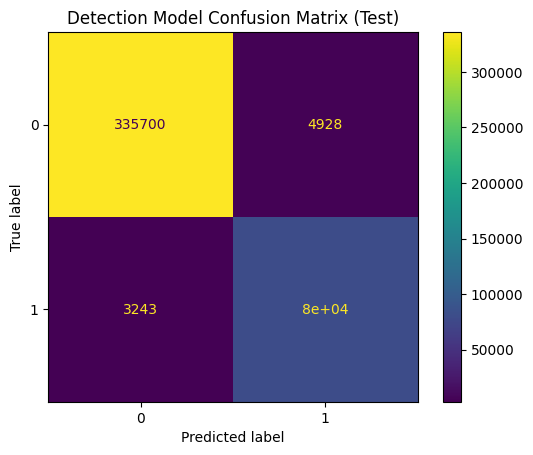

Epoch: 14, Loss: 0.0706
Val AP: 0.9912, Val AUC: 0.9980
Test AP: 0.9912, Test AUC: 0.9980
Val Precision: 0.9804, Val Recall: 0.9804, Val F1: 0.9804, Val Accuracy: 0.9804
Test Precision: 0.9803, Test Recall: 0.9803, Test F1: 0.9803, Test Accuracy: 0.9803


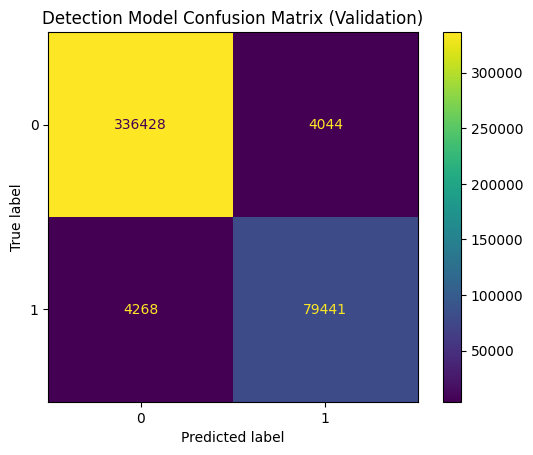

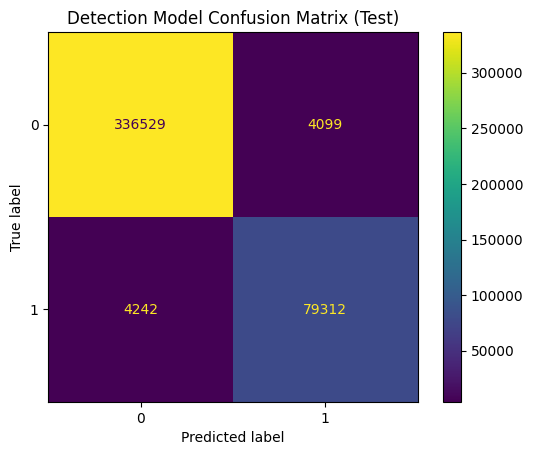

Epoch: 15, Loss: 0.0722
Val AP: 0.9933, Val AUC: 0.9981
Test AP: 0.9934, Test AUC: 0.9983
Val Precision: 0.9822, Val Recall: 0.9823, Val F1: 0.9823, Val Accuracy: 0.9823
Test Precision: 0.9824, Test Recall: 0.9824, Test F1: 0.9824, Test Accuracy: 0.9824


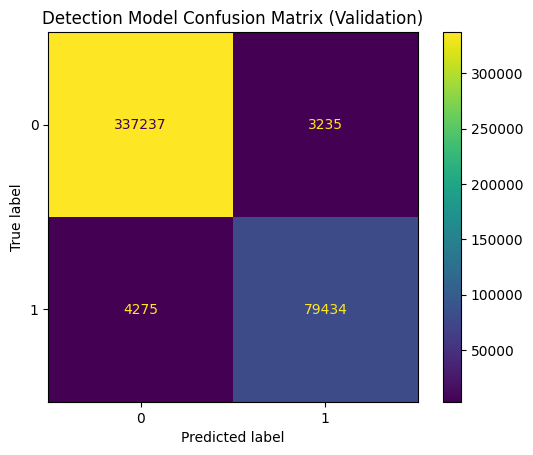

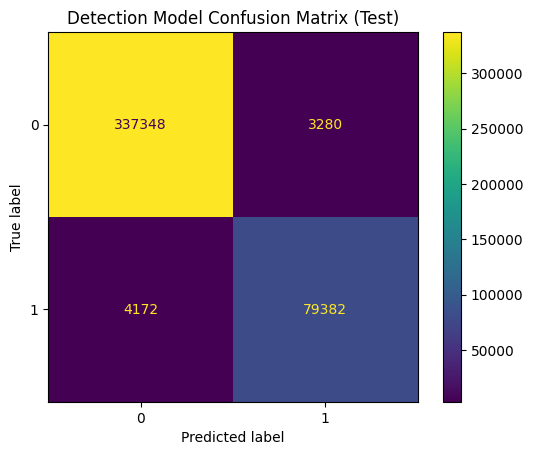

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 01, Train Loss: 0.1101, Val Loss: 0.0637, Test Loss: 0.0618
Val Precision: 0.9748, Val Recall: 0.9744, Val F1: 0.9740, Val Accuracy: 0.9744
Test Precision: 0.9751, Test Recall: 0.9746, Test F1: 0.9742, Test Accuracy: 0.9746


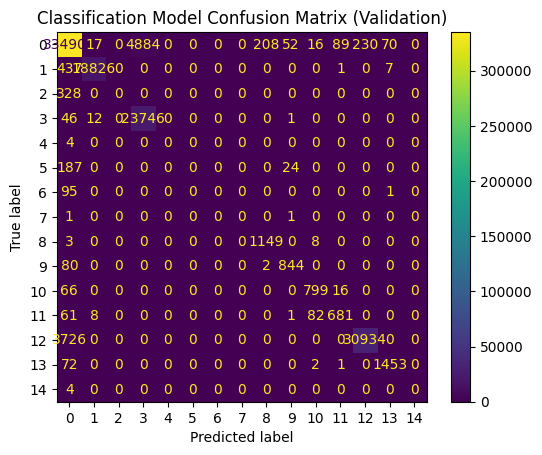

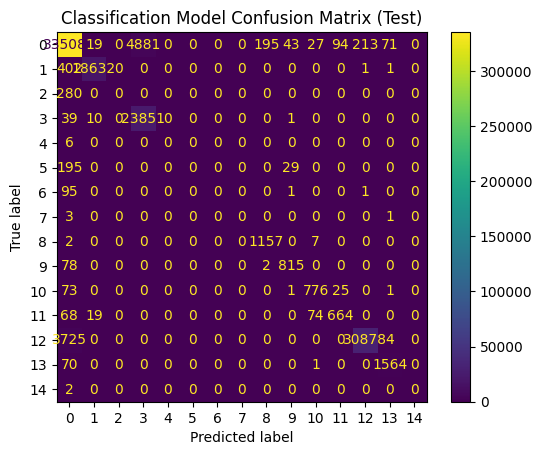

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 02, Train Loss: 0.0846, Val Loss: 0.0632, Test Loss: 0.0599
Val Precision: 0.9779, Val Recall: 0.9769, Val F1: 0.9767, Val Accuracy: 0.9769
Test Precision: 0.9784, Test Recall: 0.9774, Test F1: 0.9772, Test Accuracy: 0.9774


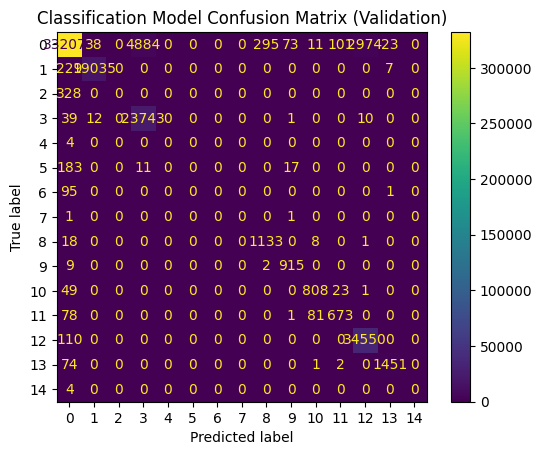

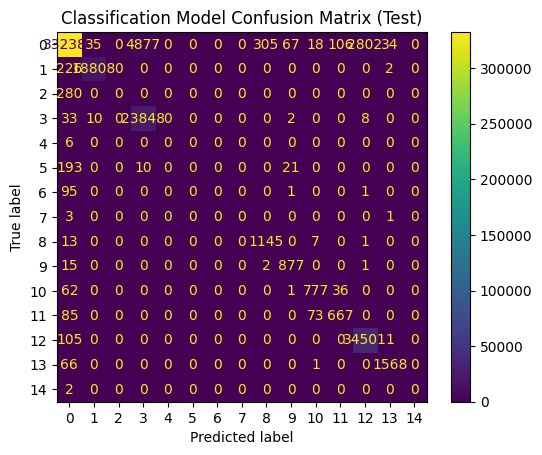

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 03, Train Loss: 0.0776, Val Loss: 0.0606, Test Loss: 0.0579
Val Precision: 0.9750, Val Recall: 0.9746, Val F1: 0.9741, Val Accuracy: 0.9746
Test Precision: 0.9752, Test Recall: 0.9746, Test F1: 0.9742, Test Accuracy: 0.9746


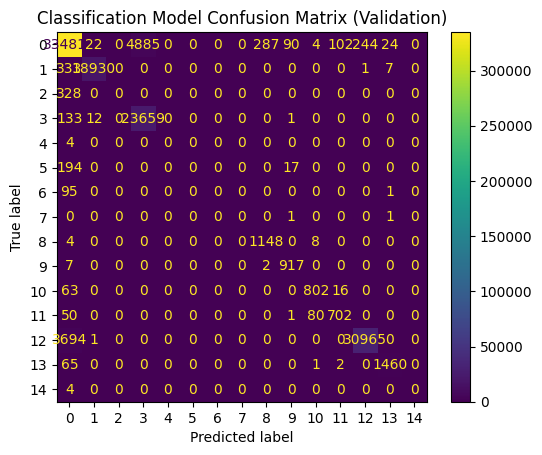

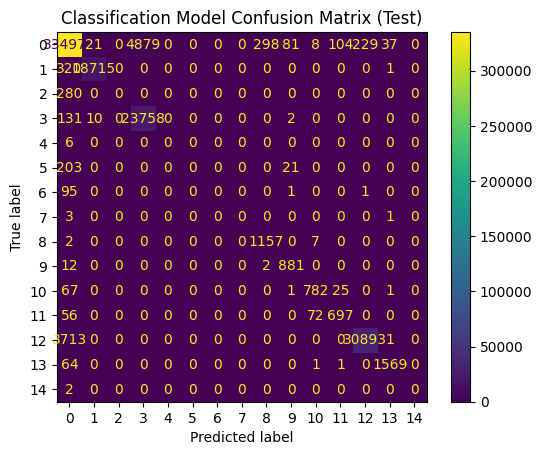

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 04, Train Loss: 0.0767, Val Loss: 0.0565, Test Loss: 0.0553
Val Precision: 0.9759, Val Recall: 0.9755, Val F1: 0.9750, Val Accuracy: 0.9755
Test Precision: 0.9761, Test Recall: 0.9756, Test F1: 0.9751, Test Accuracy: 0.9756


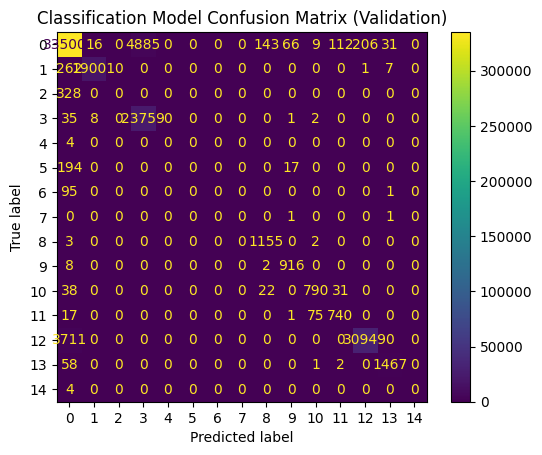

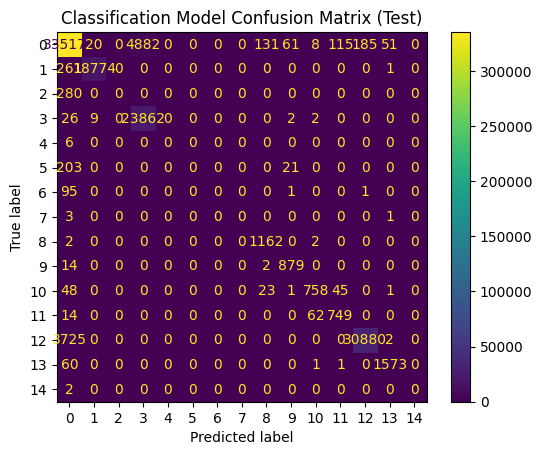

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 05, Train Loss: 0.0763, Val Loss: 0.0545, Test Loss: 0.0521
Val Precision: 0.9784, Val Recall: 0.9794, Val F1: 0.9786, Val Accuracy: 0.9794
Test Precision: 0.9787, Test Recall: 0.9796, Test F1: 0.9789, Test Accuracy: 0.9796


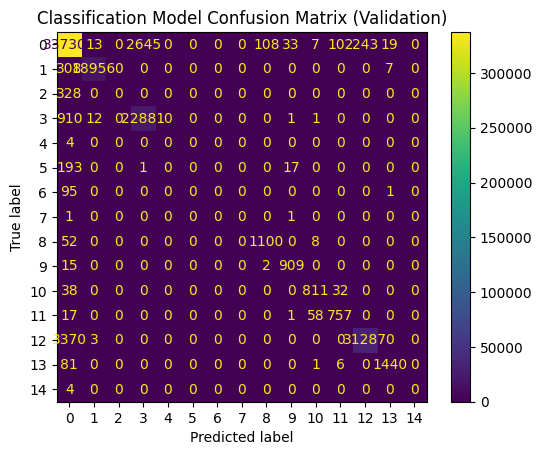

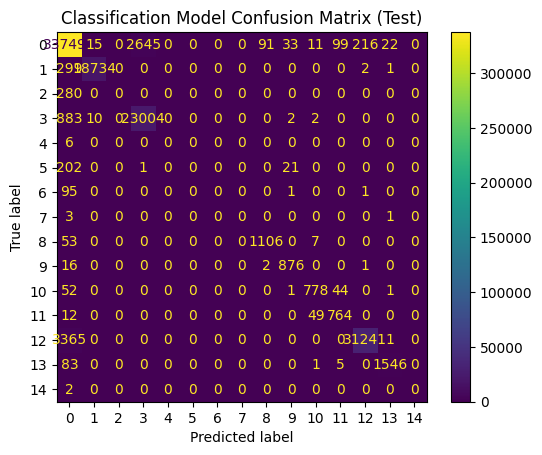

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 06, Train Loss: 0.0758, Val Loss: 0.0543, Test Loss: 0.0516
Val Precision: 0.9821, Val Recall: 0.9826, Val F1: 0.9821, Val Accuracy: 0.9826
Test Precision: 0.9826, Test Recall: 0.9831, Test F1: 0.9826, Test Accuracy: 0.9831


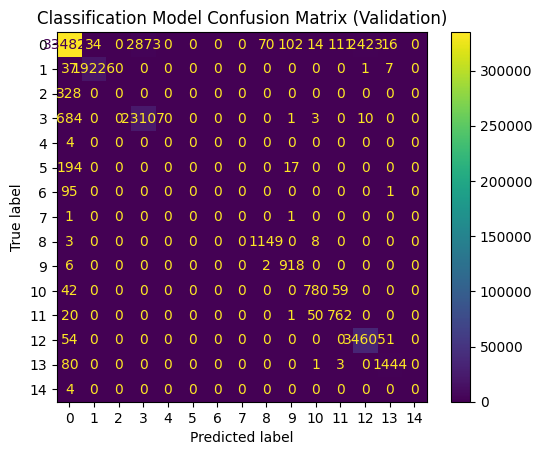

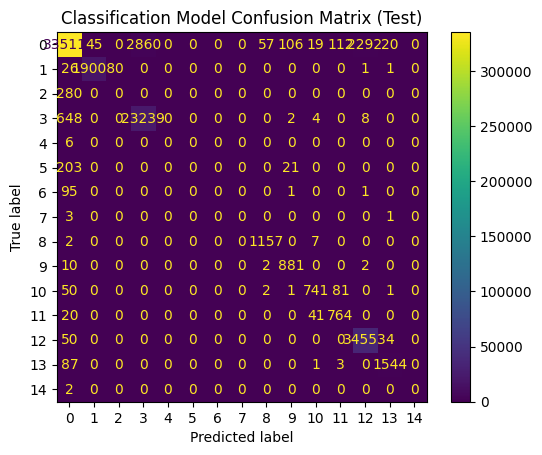

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 07, Train Loss: 0.0773, Val Loss: 0.0554, Test Loss: 0.0520
Val Precision: 0.9781, Val Recall: 0.9783, Val F1: 0.9778, Val Accuracy: 0.9783
Test Precision: 0.9782, Test Recall: 0.9784, Test F1: 0.9779, Test Accuracy: 0.9784


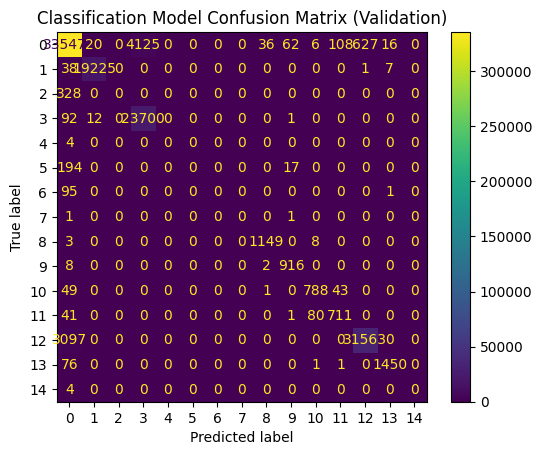

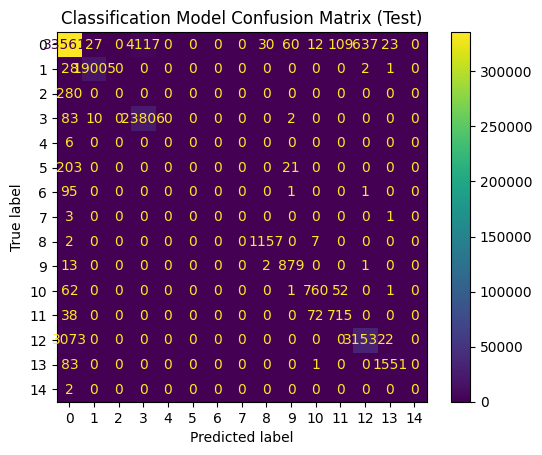

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 08, Train Loss: 0.0843, Val Loss: 0.0533, Test Loss: 0.0511
Val Precision: 0.9770, Val Recall: 0.9768, Val F1: 0.9764, Val Accuracy: 0.9768
Test Precision: 0.9773, Test Recall: 0.9770, Test F1: 0.9766, Test Accuracy: 0.9770


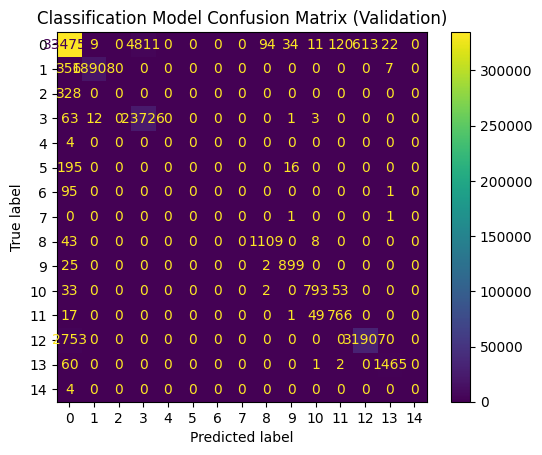

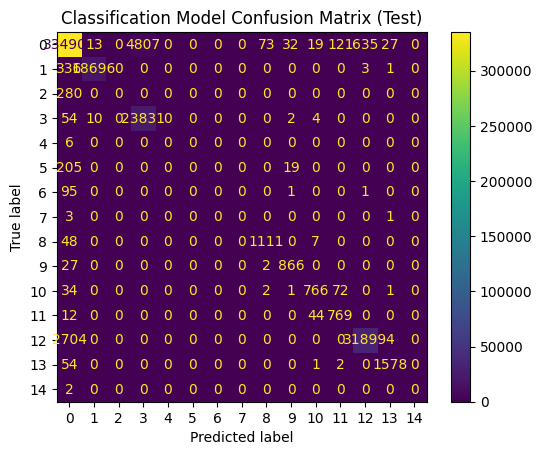

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 09, Train Loss: 0.0732, Val Loss: 0.0508, Test Loss: 0.0490
Val Precision: 0.9812, Val Recall: 0.9820, Val F1: 0.9813, Val Accuracy: 0.9820
Test Precision: 0.9813, Test Recall: 0.9820, Test F1: 0.9813, Test Accuracy: 0.9820


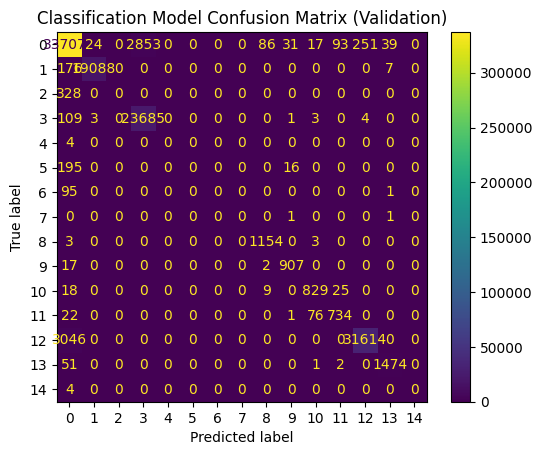

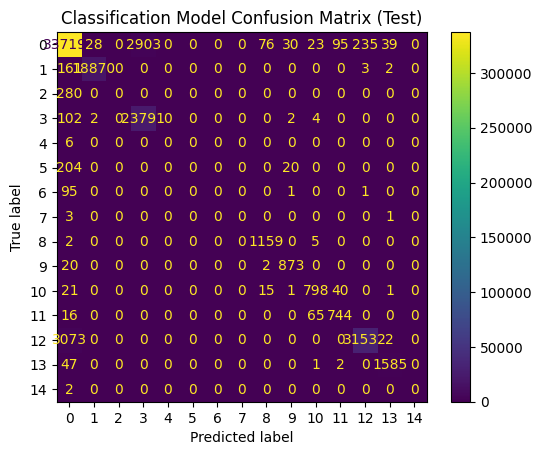

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 10, Train Loss: 0.0765, Val Loss: 0.0545, Test Loss: 0.0522
Val Precision: 0.9806, Val Recall: 0.9798, Val F1: 0.9796, Val Accuracy: 0.9798
Test Precision: 0.9807, Test Recall: 0.9799, Test F1: 0.9797, Test Accuracy: 0.9799


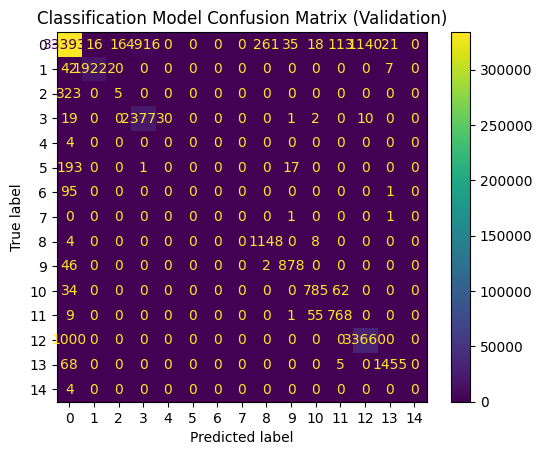

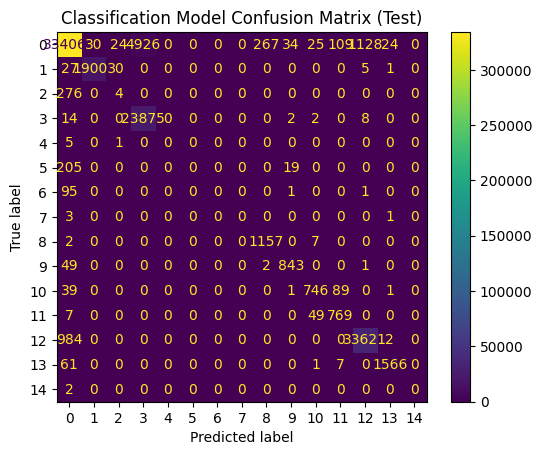

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 11, Train Loss: 0.0729, Val Loss: 0.0542, Test Loss: 0.0518
Val Precision: 0.9816, Val Recall: 0.9814, Val F1: 0.9810, Val Accuracy: 0.9814
Test Precision: 0.9823, Test Recall: 0.9822, Test F1: 0.9818, Test Accuracy: 0.9822


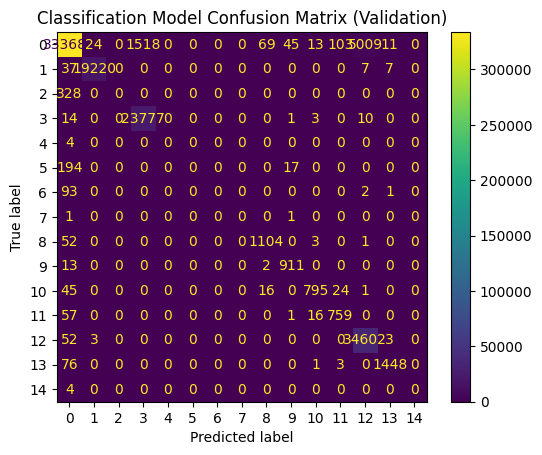

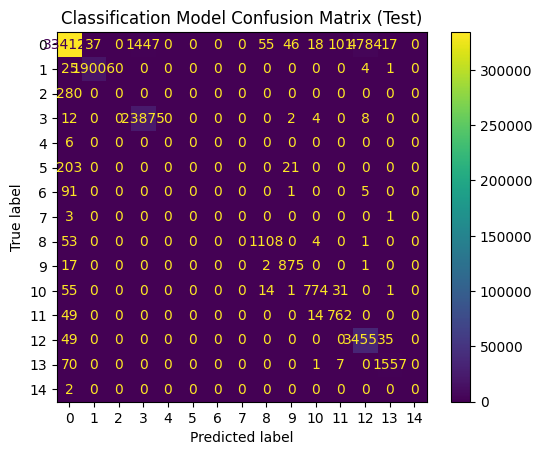

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 12, Train Loss: 0.0751, Val Loss: 0.0525, Test Loss: 0.0508
Val Precision: 0.9782, Val Recall: 0.9778, Val F1: 0.9774, Val Accuracy: 0.9778
Test Precision: 0.9785, Test Recall: 0.9780, Test F1: 0.9777, Test Accuracy: 0.9780


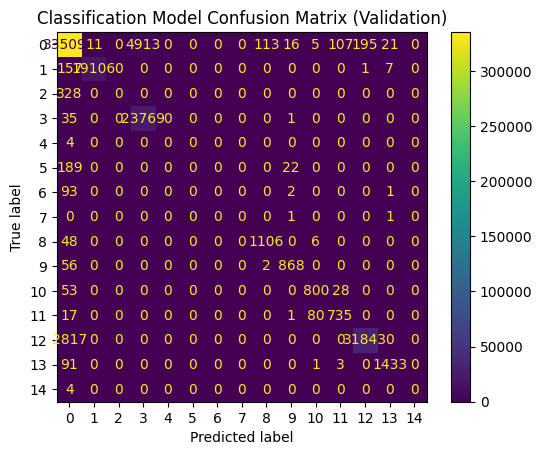

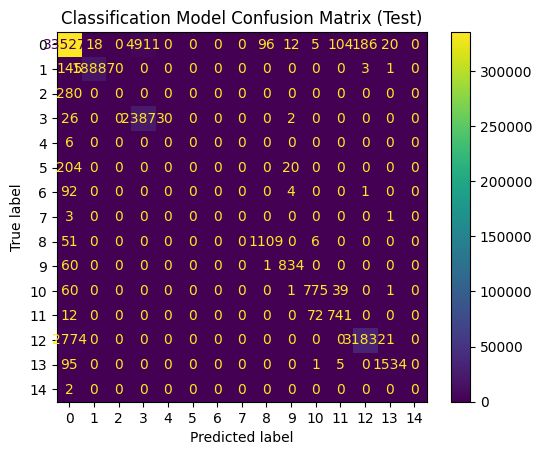

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 13, Train Loss: 0.0730, Val Loss: 0.0514, Test Loss: 0.0471
Val Precision: 0.9838, Val Recall: 0.9847, Val F1: 0.9841, Val Accuracy: 0.9847
Test Precision: 0.9842, Test Recall: 0.9850, Test F1: 0.9844, Test Accuracy: 0.9850


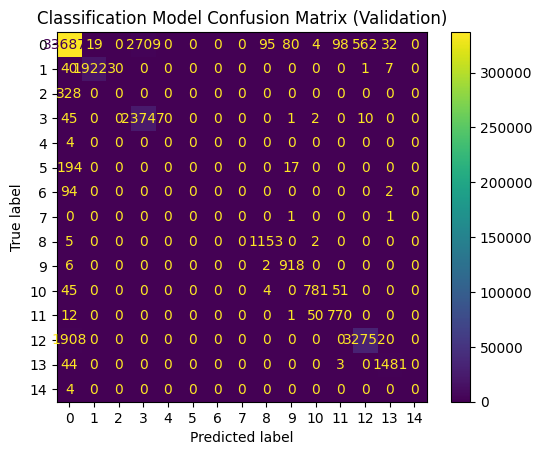

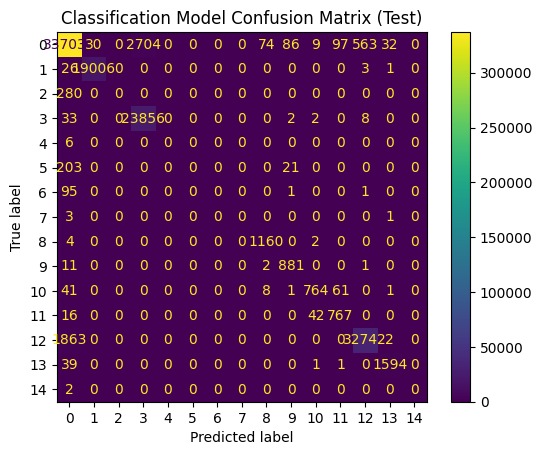

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 14, Train Loss: 0.0735, Val Loss: 0.0593, Test Loss: 0.0515
Val Precision: 0.9829, Val Recall: 0.9840, Val F1: 0.9833, Val Accuracy: 0.9840
Test Precision: 0.9832, Test Recall: 0.9842, Test F1: 0.9836, Test Accuracy: 0.9842


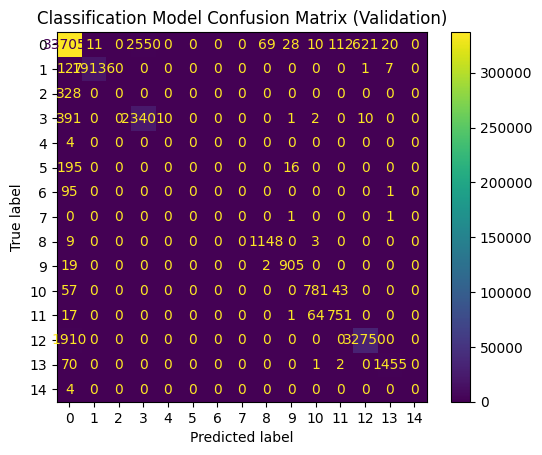

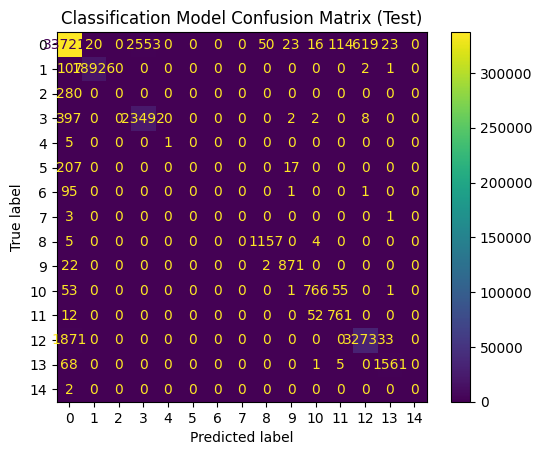

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 15, Train Loss: 0.0783, Val Loss: 0.0499, Test Loss: 0.0484
Val Precision: 0.9788, Val Recall: 0.9784, Val F1: 0.9781, Val Accuracy: 0.9784
Test Precision: 0.9791, Test Recall: 0.9786, Test F1: 0.9783, Test Accuracy: 0.9786


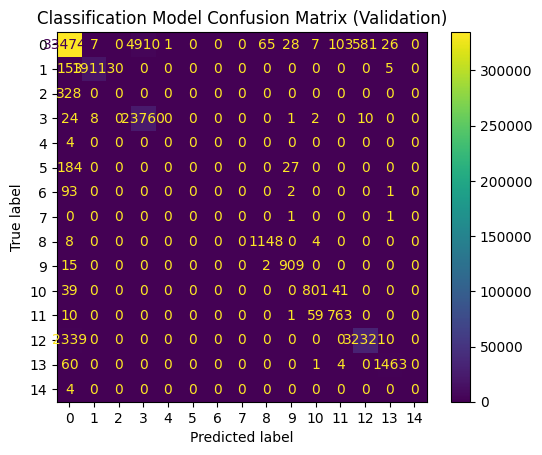

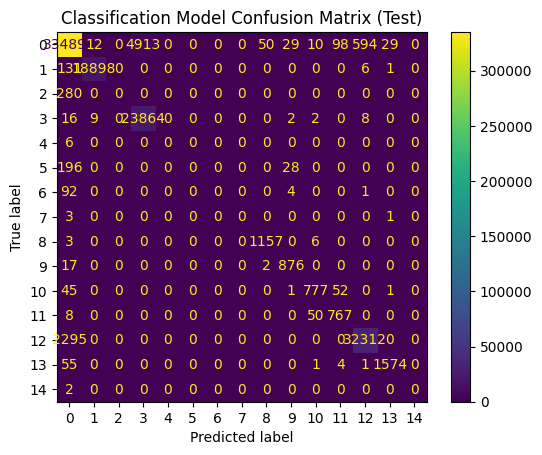

Classification Precision: 0.9664
Classification Recall: 0.2301
Classification F1: 0.3717
Classification Accuracy: 0.2301


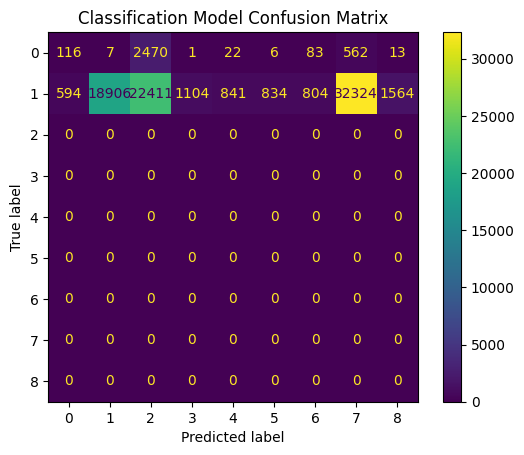

In [ ]:
# Multi-model
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, average_precision_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess new dataset (CICIDS2017)
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target for detection
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets for detection
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the detection model architecture
class DetectionNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(DetectionNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Initialize the detection model
input_dim = X_tensor_new.shape[1]
detection_model = DetectionNN(input_dim)

# Define criterion and optimizer for detection model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(detection_model.parameters(), lr=0.001)

# Training function for detection model
def train_detection_model(loader):
    detection_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = detection_model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for detection model
def evaluate_detection_model(loader):
    detection_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = detection_model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Fine-tuning loop for detection model
num_epochs = 15
for epoch in range(1, num_epochs + 1):
    train_loss = train_detection_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_detection_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_detection_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

    # Detection metrics
    val_pred = torch.round(val_outputs).numpy()
    test_pred = torch.round(test_outputs).numpy()

    val_precision = precision_score(val_labels, val_pred, average='weighted')
    val_recall = recall_score(val_labels, val_pred, average='weighted')
    val_f1 = f1_score(val_labels, val_pred, average='weighted')
    val_accuracy = accuracy_score(val_labels, val_pred)

    test_precision = precision_score(test_labels, test_pred, average='weighted')
    test_recall = recall_score(test_labels, test_pred, average='weighted')
    test_f1 = f1_score(test_labels, test_pred, average='weighted')
    test_accuracy = accuracy_score(test_labels, test_pred)

    print(f'Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}')
    print(f'Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}')

    # Confusion matrix for detection model
    conf_matrix_val = confusion_matrix(val_labels, val_pred)
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix_val).plot()
    plt.title('Detection Model Confusion Matrix (Validation)')
    plt.show()

    conf_matrix_test = confusion_matrix(test_labels, test_pred)
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test).plot()
    plt.title('Detection Model Confusion Matrix (Test)')
    plt.show()

# Save the trained detection model
torch.save(detection_model.state_dict(), '/content/drive/MyDrive/TGN_multi_detection_model.pth')

# Load and preprocess new dataset (CICIDS2017) for classification
classification_data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

classification_data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files for classification
classification_data_list = [pd.read_csv(os.path.join(classification_data_path, file)) for file in classification_data_files]
classification_data = pd.concat(classification_data_list, ignore_index=True)

# Preprocess the data
classification_data.columns = classification_data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
classification_data = classification_data.drop(columns=[col for col in columns_to_drop if col in classification_data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = classification_data.select_dtypes(include=['object']).columns
classification_data = pd.get_dummies(classification_data, columns=non_numeric_columns)

# Replace infinity or large values
classification_data = classification_data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for classification
label_columns = [col for col in classification_data.columns if 'Label_' in col]
classification_data['attack_type'] = classification_data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
classification_data = classification_data.drop(columns=label_columns)

# Separate features and target for classification
classification_features = classification_data.drop(columns=['attack_type'])
classification_target = classification_data['attack_type']

# Feature scaling
classification_features = scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(pd.factorize(classification_target)[0], dtype=torch.long)

# Split the data into training, validation, and test sets for classification
X_train_clf, X_temp_clf, y_train_clf, y_temp_clf = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42)
X_val_clf, X_test_clf, y_val_clf, y_test_clf = train_test_split(X_temp_clf, y_temp_clf, test_size=0.5, random_state=42)

# Create DataLoader for each classification dataset
train_dataset_clf = TensorDataset(X_train_clf, y_train_clf)
val_dataset_clf = TensorDataset(X_val_clf, y_val_clf)
test_dataset_clf = TensorDataset(X_test_clf, y_test_clf)

train_loader_clf = DataLoader(train_dataset_clf, batch_size=batch_size, shuffle=True)
val_loader_clf = DataLoader(val_dataset_clf, batch_size=batch_size, shuffle=False)
test_loader_clf = DataLoader(test_dataset_clf, batch_size=batch_size, shuffle=False)

# Define the classification model architecture
class ClassificationNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(ClassificationNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

# Initialize the classification model
num_classes = len(set(classification_target))
classification_model = ClassificationNN(input_dim, num_classes)

# Define criterion and optimizer for classification model
criterion_clf = torch.nn.CrossEntropyLoss()
optimizer_clf = torch.optim.Adam(classification_model.parameters(), lr=0.001)

# Training function for classification model
def train_classification_model(loader):
    classification_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_clf.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion_clf(outputs, labels)
        loss.backward()
        optimizer_clf.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for classification model
def evaluate_classification_model(loader):
    classification_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = classification_model(inputs)
            loss = criterion_clf(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for classification model
for epoch in range(1, num_epochs + 1):
    train_loss_clf = train_classification_model(train_loader_clf)
    val_loss_clf, val_outputs_clf, val_labels_clf = evaluate_classification_model(val_loader_clf)
    test_loss_clf, test_outputs_clf, test_labels_clf = evaluate_classification_model(test_loader_clf)

    val_precision_clf = precision_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted')
    val_recall_clf = recall_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted')
    val_f1_clf = f1_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted')
    val_accuracy_clf = accuracy_score(val_labels_clf, val_outputs_clf.argmax(dim=1))

    test_precision_clf = precision_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted')
    test_recall_clf = recall_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted')
    test_f1_clf = f1_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted')
    test_accuracy_clf = accuracy_score(test_labels_clf, test_outputs_clf.argmax(dim=1))

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss_clf:.4f}, Val Loss: {val_loss_clf:.4f}, Test Loss: {test_loss_clf:.4f}')
    print(f'Val Precision: {val_precision_clf:.4f}, Val Recall: {val_recall_clf:.4f}, Val F1: {val_f1_clf:.4f}, Val Accuracy: {val_accuracy_clf:.4f}')
    print(f'Test Precision: {test_precision_clf:.4f}, Test Recall: {test_recall_clf:.4f}, Test F1: {test_f1_clf:.4f}, Test Accuracy: {test_accuracy_clf:.4f}')

    # Confusion matrix for classification model
    conf_matrix_val = confusion_matrix(val_labels_clf, val_outputs_clf.argmax(dim=1))
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix_val).plot()
    plt.title('Classification Model Confusion Matrix (Validation)')
    plt.show()

    conf_matrix_test = confusion_matrix(test_labels_clf, test_outputs_clf.argmax(dim=1))
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test).plot()
    plt.title('Classification Model Confusion Matrix (Test)')
    plt.show()

# Save the trained classification model
torch.save(classification_model.state_dict(), '/content/drive/MyDrive/TGN_multi_classification_model.pth')

class MultiModel:
    def __init__(self, detection_model, classification_model, input_dim_detection, input_dim_classification, num_classes_classification):
        self.detection_model = detection_model
        self.classification_model = classification_model
        self.input_dim_detection = input_dim_detection
        self.input_dim_classification = input_dim_classification
        self.num_classes_classification = num_classes_classification

    def predict(self, x):
        # First, use the detection model to check if there is an attack
        detection_output = self.detection_model(x)
        detection_result = torch.round(detection_output).item()

        if detection_result == 1:  # If an attack is detected
            # Use the classification model to classify the type of attack
            classification_output = self.classification_model(x)
            classification_result = torch.argmax(classification_output, dim=1).item()
            return classification_result
        else:
            return "No attack"

# Initialize the MultiModel with the detection and classification models
multi_model = MultiModel(detection_model, classification_model, input_dim_detection=input_dim, input_dim_classification=input_dim, num_classes_classification=num_classes)

# Test the MultiModel on the test dataset
multi_model_results = []
for x in X_test:
    result = multi_model.predict(x.unsqueeze(0))
    multi_model_results.append(result)

# Convert the predictions and labels to numpy arrays for evaluation
attack_indices = [i for i, result in enumerate(multi_model_results) if result != "No attack"]
classification_outputs = np.array([multi_model_results[i] for i in attack_indices])
classification_labels = np.array([y_test[i].item() for i in attack_indices])

# Calculate classification metrics
if len(classification_outputs) > 0:
    classification_precision = precision_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_recall = recall_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_f1 = f1_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_accuracy = accuracy_score(classification_labels, classification_outputs)

    print(f'Classification Precision: {classification_precision:.4f}')
    print(f'Classification Recall: {classification_recall:.4f}')
    print(f'Classification F1: {classification_f1:.4f}')
    print(f'Classification Accuracy: {classification_accuracy:.4f}')

    # Confusion Matrix for classification model
    conf_matrix = confusion_matrix(classification_labels, classification_outputs)
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix).plot()
    plt.title('Classification Model Confusion Matrix')
    plt.show()
else:
    print("No attacks detected for classification evaluation.")


Epoch: 01, Loss: 0.0886
Val AP: 0.9891, Val AUC: 0.9967
Test AP: 0.9896, Test AUC: 0.9970
Val Precision: 0.9759, Val Recall: 0.9760, Val F1: 0.9759, Val Accuracy: 0.9760
Test Precision: 0.9764, Test Recall: 0.9765, Test F1: 0.9764, Test Accuracy: 0.9765
Epoch: 02, Loss: 0.0715
Val AP: 0.9902, Val AUC: 0.9972
Test AP: 0.9907, Test AUC: 0.9974
Val Precision: 0.9763, Val Recall: 0.9764, Val F1: 0.9763, Val Accuracy: 0.9764
Test Precision: 0.9767, Test Recall: 0.9768, Test F1: 0.9767, Test Accuracy: 0.9768
Epoch: 03, Loss: 0.0661
Val AP: 0.9916, Val AUC: 0.9976
Test AP: 0.9919, Test AUC: 0.9978
Val Precision: 0.9806, Val Recall: 0.9804, Val F1: 0.9805, Val Accuracy: 0.9804
Test Precision: 0.9811, Test Recall: 0.9809, Test F1: 0.9810, Test Accuracy: 0.9809
Epoch: 04, Loss: 0.0642
Val AP: 0.9920, Val AUC: 0.9978
Test AP: 0.9922, Test AUC: 0.9979
Val Precision: 0.9812, Val Recall: 0.9807, Val F1: 0.9808, Val Accuracy: 0.9807
Test Precision: 0.9815, Test Recall: 0.9810, Test F1: 0.9811, Test A

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 01, Train Loss: 0.1079, Val Loss: 0.0707, Test Loss: 0.0653
Val Precision: 0.9740, Val Recall: 0.9735, Val F1: 0.9731, Val Accuracy: 0.9735
Test Precision: 0.9741, Test Recall: 0.9736, Test F1: 0.9732, Test Accuracy: 0.9736


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 02, Train Loss: 0.0838, Val Loss: 0.0639, Test Loss: 0.0579
Val Precision: 0.9767, Val Recall: 0.9763, Val F1: 0.9759, Val Accuracy: 0.9763
Test Precision: 0.9770, Test Recall: 0.9766, Test F1: 0.9762, Test Accuracy: 0.9766


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 03, Train Loss: 0.0806, Val Loss: 0.0620, Test Loss: 0.0572
Val Precision: 0.9751, Val Recall: 0.9748, Val F1: 0.9743, Val Accuracy: 0.9748
Test Precision: 0.9753, Test Recall: 0.9750, Test F1: 0.9746, Test Accuracy: 0.9750


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 04, Train Loss: 0.0783, Val Loss: 0.0609, Test Loss: 0.0547
Val Precision: 0.9771, Val Recall: 0.9770, Val F1: 0.9766, Val Accuracy: 0.9770
Test Precision: 0.9774, Test Recall: 0.9772, Test F1: 0.9769, Test Accuracy: 0.9772


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 05, Train Loss: 0.0770, Val Loss: 0.0582, Test Loss: 0.0543
Val Precision: 0.9775, Val Recall: 0.9773, Val F1: 0.9769, Val Accuracy: 0.9773
Test Precision: 0.9779, Test Recall: 0.9775, Test F1: 0.9772, Test Accuracy: 0.9775


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 06, Train Loss: 0.0767, Val Loss: 0.0621, Test Loss: 0.0574
Val Precision: 0.9757, Val Recall: 0.9751, Val F1: 0.9747, Val Accuracy: 0.9751
Test Precision: 0.9760, Test Recall: 0.9754, Test F1: 0.9750, Test Accuracy: 0.9754


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 07, Train Loss: 0.0725, Val Loss: 0.0558, Test Loss: 0.0507
Val Precision: 0.9800, Val Recall: 0.9811, Val F1: 0.9803, Val Accuracy: 0.9811
Test Precision: 0.9803, Test Recall: 0.9813, Test F1: 0.9806, Test Accuracy: 0.9813


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 08, Train Loss: 0.0758, Val Loss: 0.0546, Test Loss: 0.0516
Val Precision: 0.9789, Val Recall: 0.9779, Val F1: 0.9777, Val Accuracy: 0.9779
Test Precision: 0.9796, Test Recall: 0.9785, Test F1: 0.9784, Test Accuracy: 0.9785


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 09, Train Loss: 0.0738, Val Loss: 0.0537, Test Loss: 0.0497
Val Precision: 0.9799, Val Recall: 0.9796, Val F1: 0.9793, Val Accuracy: 0.9796
Test Precision: 0.9803, Test Recall: 0.9799, Test F1: 0.9796, Test Accuracy: 0.9799


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 10, Train Loss: 0.0743, Val Loss: 0.0580, Test Loss: 0.0519
Val Precision: 0.9771, Val Recall: 0.9768, Val F1: 0.9764, Val Accuracy: 0.9768
Test Precision: 0.9774, Test Recall: 0.9771, Test F1: 0.9767, Test Accuracy: 0.9771


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 11, Train Loss: 0.0739, Val Loss: 0.0559, Test Loss: 0.0508
Val Precision: 0.9800, Val Recall: 0.9814, Val F1: 0.9806, Val Accuracy: 0.9814
Test Precision: 0.9803, Test Recall: 0.9816, Test F1: 0.9809, Test Accuracy: 0.9816


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 12, Train Loss: 0.0750, Val Loss: 0.0559, Test Loss: 0.0522
Val Precision: 0.9767, Val Recall: 0.9763, Val F1: 0.9758, Val Accuracy: 0.9763
Test Precision: 0.9769, Test Recall: 0.9764, Test F1: 0.9760, Test Accuracy: 0.9764


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 13, Train Loss: 0.0738, Val Loss: 0.0525, Test Loss: 0.0490
Val Precision: 0.9797, Val Recall: 0.9793, Val F1: 0.9790, Val Accuracy: 0.9793
Test Precision: 0.9798, Test Recall: 0.9793, Test F1: 0.9791, Test Accuracy: 0.9793


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 14, Train Loss: 0.0778, Val Loss: 0.0538, Test Loss: 0.0503
Val Precision: 0.9793, Val Recall: 0.9790, Val F1: 0.9787, Val Accuracy: 0.9790
Test Precision: 0.9794, Test Recall: 0.9791, Test F1: 0.9787, Test Accuracy: 0.9791


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch: 15, Train Loss: 0.0812, Val Loss: 0.0557, Test Loss: 0.0517
Val Precision: 0.9806, Val Recall: 0.9799, Val F1: 0.9797, Val Accuracy: 0.9799
Test Precision: 0.9810, Test Recall: 0.9803, Test F1: 0.9801, Test Accuracy: 0.9803
Classification Precision: 0.9710
Classification Recall: 0.2301
Classification F1: 0.3716
Classification Accuracy: 0.2301


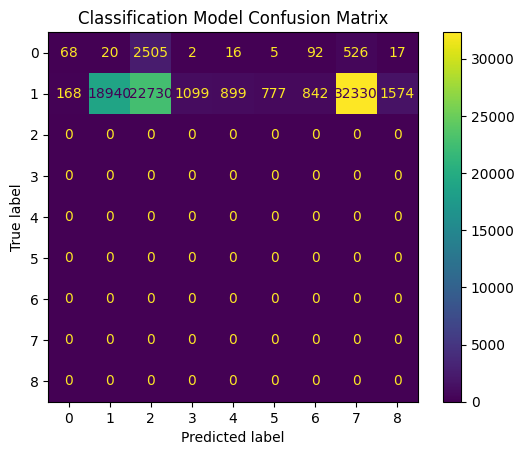

In [ ]:
# Multi-model
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, average_precision_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess new dataset (CICIDS2017)
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target for detection
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets for detection
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the detection model architecture
class DetectionNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(DetectionNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Initialize the detection model
input_dim = X_tensor_new.shape[1]
detection_model = DetectionNN(input_dim)

# Define criterion and optimizer for detection model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(detection_model.parameters(), lr=0.001)

# Training function for detection model
def train_detection_model(loader):
    detection_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = detection_model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for detection model
def evaluate_detection_model(loader):
    detection_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = detection_model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Fine-tuning loop for detection model
num_epochs = 15
for epoch in range(1, num_epochs + 1):
    train_loss = train_detection_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_detection_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_detection_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

    # Detection metrics
    val_pred = torch.round(val_outputs).numpy()
    test_pred = torch.round(test_outputs).numpy()

    val_precision = precision_score(val_labels, val_pred, average='weighted')
    val_recall = recall_score(val_labels, val_pred, average='weighted')
    val_f1 = f1_score(val_labels, val_pred, average='weighted')
    val_accuracy = accuracy_score(val_labels, val_pred)

    test_precision = precision_score(test_labels, test_pred, average='weighted')
    test_recall = recall_score(test_labels, test_pred, average='weighted')
    test_f1 = f1_score(test_labels, test_pred, average='weighted')
    test_accuracy = accuracy_score(test_labels, test_pred)

    print(f'Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}')
    print(f'Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Save the trained detection model
torch.save(detection_model.state_dict(), '/content/drive/MyDrive/TGN_multi_detection_model.pth')

# Load and preprocess new dataset (CICIDS2017) for classification
classification_data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

classification_data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files for classification
classification_data_list = [pd.read_csv(os.path.join(classification_data_path, file)) for file in classification_data_files]
classification_data = pd.concat(classification_data_list, ignore_index=True)

# Preprocess the data
classification_data.columns = classification_data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
classification_data = classification_data.drop(columns=[col for col in columns_to_drop if col in classification_data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = classification_data.select_dtypes(include=['object']).columns
classification_data = pd.get_dummies(classification_data, columns=non_numeric_columns)

# Replace infinity or large values
classification_data = classification_data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for classification
label_columns = [col for col in classification_data.columns if 'Label_' in col]
classification_data['attack_type'] = classification_data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
classification_data = classification_data.drop(columns=label_columns)

# Separate features and target for classification
classification_features = classification_data.drop(columns=['attack_type'])
classification_target = classification_data['attack_type']

# Feature scaling
classification_features = scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(pd.factorize(classification_target)[0], dtype=torch.long)

# Split the data into training, validation, and test sets for classification
X_train_clf, X_temp_clf, y_train_clf, y_temp_clf = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42)
X_val_clf, X_test_clf, y_val_clf, y_test_clf = train_test_split(X_temp_clf, y_temp_clf, test_size=0.5, random_state=42)

# Create DataLoader for each classification dataset
train_dataset_clf = TensorDataset(X_train_clf, y_train_clf)
val_dataset_clf = TensorDataset(X_val_clf, y_val_clf)
test_dataset_clf = TensorDataset(X_test_clf, y_test_clf)

train_loader_clf = DataLoader(train_dataset_clf, batch_size=batch_size, shuffle=True)
val_loader_clf = DataLoader(val_dataset_clf, batch_size=batch_size, shuffle=False)
test_loader_clf = DataLoader(test_dataset_clf, batch_size=batch_size, shuffle=False)

# Define the classification model architecture
class ClassificationNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(ClassificationNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

# Initialize the classification model
num_classes = len(set(classification_target))
classification_model = ClassificationNN(input_dim, num_classes)

# Define criterion and optimizer for classification model
criterion_clf = torch.nn.CrossEntropyLoss()
optimizer_clf = torch.optim.Adam(classification_model.parameters(), lr=0.001)

# Training function for classification model
def train_classification_model(loader):
    classification_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_clf.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion_clf(outputs, labels)
        loss.backward()
        optimizer_clf.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for classification model
def evaluate_classification_model(loader):
    classification_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = classification_model(inputs)
            loss = criterion_clf(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for classification model
for epoch in range(1, num_epochs + 1):
    train_loss_clf = train_classification_model(train_loader_clf)
    val_loss_clf, val_outputs_clf, val_labels_clf = evaluate_classification_model(val_loader_clf)
    test_loss_clf, test_outputs_clf, test_labels_clf = evaluate_classification_model(test_loader_clf)

    val_precision_clf = precision_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted')
    val_recall_clf = recall_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted')
    val_f1_clf = f1_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted')
    val_accuracy_clf = accuracy_score(val_labels_clf, val_outputs_clf.argmax(dim=1))

    test_precision_clf = precision_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted')
    test_recall_clf = recall_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted')
    test_f1_clf = f1_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted')
    test_accuracy_clf = accuracy_score(test_labels_clf, test_outputs_clf.argmax(dim=1))

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss_clf:.4f}, Val Loss: {val_loss_clf:.4f}, Test Loss: {test_loss_clf:.4f}')
    print(f'Val Precision: {val_precision_clf:.4f}, Val Recall: {val_recall_clf:.4f}, Val F1: {val_f1_clf:.4f}, Val Accuracy: {val_accuracy_clf:.4f}')
    print(f'Test Precision: {test_precision_clf:.4f}, Test Recall: {test_recall_clf:.4f}, Test F1: {test_f1_clf:.4f}, Test Accuracy: {test_accuracy_clf:.4f}')

# Save the trained classification model
torch.save(classification_model.state_dict(), '/content/drive/MyDrive/TGN_multi_classification_model.pth')

class MultiModel:
    def __init__(self, detection_model, classification_model, input_dim_detection, input_dim_classification, num_classes_classification):
        self.detection_model = detection_model
        self.classification_model = classification_model
        self.input_dim_detection = input_dim_detection
        self.input_dim_classification = input_dim_classification
        self.num_classes_classification = num_classes_classification

    def predict(self, x):
        # First, use the detection model to check if there is an attack
        detection_output = self.detection_model(x)
        detection_result = torch.round(detection_output).item()

        if detection_result == 1:  # If an attack is detected
            # Use the classification model to classify the type of attack
            classification_output = self.classification_model(x)
            classification_result = torch.argmax(classification_output, dim=1).item()
            return classification_result
        else:
            return "No attack"

# Initialize the MultiModel with the detection and classification models
multi_model = MultiModel(detection_model, classification_model, input_dim_detection=input_dim, input_dim_classification=input_dim, num_classes_classification=num_classes)

# Test the MultiModel on the test dataset
multi_model_results = []
true_labels = []
for x, y in zip(X_test, y_test):
    result = multi_model.predict(x.unsqueeze(0))
    multi_model_results.append(result)
    true_labels.append(y.item())

# Convert the predictions and labels to numpy arrays for evaluation
attack_indices = [i for i, result in enumerate(multi_model_results) if result != "No attack"]
classification_outputs = np.array([multi_model_results[i] for i in attack_indices])
classification_labels = np.array([true_labels[i] for i in attack_indices])

# Calculate classification metrics
if len(classification_outputs) > 0:
    classification_precision = precision_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_recall = recall_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_f1 = f1_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_accuracy = accuracy_score(classification_labels, classification_outputs)

    print(f'Classification Precision: {classification_precision:.4f}')
    print(f'Classification Recall: {classification_recall:.4f}')
    print(f'Classification F1: {classification_f1:.4f}')
    print(f'Classification Accuracy: {classification_accuracy:.4f}')

    # Confusion Matrix for classification model
    conf_matrix = confusion_matrix(classification_labels, classification_outputs)
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix).plot()
    plt.title('Classification Model Confusion Matrix')
    plt.show()
else:
    print("No attacks detected for classification evaluation.")


Epoch: 01, Loss: 0.0826
Val AP: 0.9884, Val AUC: 0.9967
Test AP: 0.9888, Test AUC: 0.9970
Val Precision: 0.9727, Val Recall: 0.9727, Val F1: 0.9727, Val Accuracy: 0.9727
Test Precision: 0.9730, Test Recall: 0.9730, Test F1: 0.9730, Test Accuracy: 0.9730
Epoch: 02, Loss: 0.0679
Val AP: 0.9903, Val AUC: 0.9973
Test AP: 0.9906, Test AUC: 0.9975
Val Precision: 0.9765, Val Recall: 0.9764, Val F1: 0.9765, Val Accuracy: 0.9764
Test Precision: 0.9769, Test Recall: 0.9767, Test F1: 0.9768, Test Accuracy: 0.9767
Epoch: 03, Loss: 0.0661
Val AP: 0.9904, Val AUC: 0.9973
Test AP: 0.9906, Test AUC: 0.9975
Val Precision: 0.9757, Val Recall: 0.9756, Val F1: 0.9757, Val Accuracy: 0.9756
Test Precision: 0.9761, Test Recall: 0.9760, Test F1: 0.9761, Test Accuracy: 0.9760
Epoch: 04, Loss: 0.0640
Val AP: 0.9913, Val AUC: 0.9976
Test AP: 0.9915, Test AUC: 0.9977
Val Precision: 0.9796, Val Recall: 0.9790, Val F1: 0.9792, Val Accuracy: 0.9790
Test Precision: 0.9800, Test Recall: 0.9794, Test F1: 0.9796, Test A

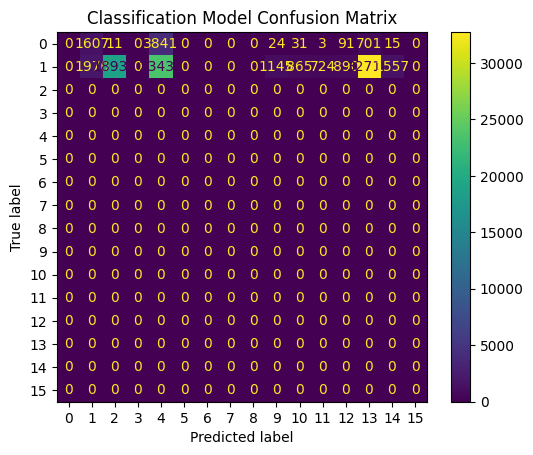

In [ ]:
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, average_precision_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess new dataset (CICIDS2017)
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target for detection
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets for detection
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the detection model architecture
class DetectionNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(DetectionNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Initialize the detection model
input_dim = X_tensor_new.shape[1]
detection_model = DetectionNN(input_dim)

# Define criterion and optimizer for detection model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(detection_model.parameters(), lr=0.001)

# Training function for detection model
def train_detection_model(loader):
    detection_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = detection_model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for detection model
def evaluate_detection_model(loader):
    detection_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = detection_model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Fine-tuning loop for detection model
num_epochs = 15
for epoch in range(1, num_epochs + 1):
    train_loss = train_detection_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_detection_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_detection_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

    # Detection metrics
    val_pred = torch.round(val_outputs).numpy()
    test_pred = torch.round(test_outputs).numpy()

    val_precision = precision_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_recall = recall_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_f1 = f1_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_accuracy = accuracy_score(val_labels, val_pred)

    test_precision = precision_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_recall = recall_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_accuracy = accuracy_score(test_labels, test_pred)

    print(f'Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}')
    print(f'Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Save the trained detection model
torch.save(detection_model.state_dict(), '/content/drive/MyDrive/TGN_multi_detection_model.pth')

# Load and preprocess new dataset (CICIDS2017) for classification
classification_data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

classification_data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files for classification
classification_data_list = [pd.read_csv(os.path.join(classification_data_path, file)) for file in classification_data_files]
classification_data = pd.concat(classification_data_list, ignore_index=True)

# Preprocess the data
classification_data.columns = classification_data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
classification_data = classification_data.drop(columns=[col for col in columns_to_drop if col in classification_data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = classification_data.select_dtypes(include=['object']).columns
classification_data = pd.get_dummies(classification_data, columns=non_numeric_columns)

# Replace infinity or large values
classification_data = classification_data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for classification
label_columns = [col for col in classification_data.columns if col.startswith('Label_')]
classification_data['attack_type'] = classification_data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
classification_data = classification_data.drop(columns=label_columns)

# Separate features and target for classification
classification_features = classification_data.drop(columns=['attack_type'])
classification_target = classification_data['attack_type']

# Feature scaling
classification_features = scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(pd.factorize(classification_target)[0], dtype=torch.long)

# Split the data into training, validation, and test sets for classification
X_train_clf, X_temp_clf, y_train_clf, y_temp_clf = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42)
X_val_clf, X_test_clf, y_val_clf, y_test_clf = train_test_split(X_temp_clf, y_temp_clf, test_size=0.5, random_state=42)

# Create DataLoader for each classification dataset
train_dataset_clf = TensorDataset(X_train_clf, y_train_clf)
val_dataset_clf = TensorDataset(X_val_clf, y_val_clf)
test_dataset_clf = TensorDataset(X_test_clf, y_test_clf)

train_loader_clf = DataLoader(train_dataset_clf, batch_size=batch_size, shuffle=True)
val_loader_clf = DataLoader(val_dataset_clf, batch_size=batch_size, shuffle=False)
test_loader_clf = DataLoader(test_dataset_clf, batch_size=batch_size, shuffle=False)

# Define the classification model architecture
class ClassificationNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(ClassificationNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

# Initialize the classification model
num_classes = len(set(classification_target))
classification_model = ClassificationNN(input_dim, num_classes)

# Define criterion and optimizer for classification model
criterion_clf = torch.nn.CrossEntropyLoss()
optimizer_clf = torch.optim.Adam(classification_model.parameters(), lr=0.001)

# Training function for classification model
def train_classification_model(loader):
    classification_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_clf.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion_clf(outputs, labels)
        loss.backward()
        optimizer_clf.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for classification model
def evaluate_classification_model(loader):
    classification_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = classification_model(inputs)
            loss = criterion_clf(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for classification model
for epoch in range(1, num_epochs + 1):
    train_loss_clf = train_classification_model(train_loader_clf)
    val_loss_clf, val_outputs_clf, val_labels_clf = evaluate_classification_model(val_loader_clf)
    test_loss_clf, test_outputs_clf, test_labels_clf = evaluate_classification_model(test_loader_clf)

    val_precision_clf = precision_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_recall_clf = recall_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_f1_clf = f1_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_accuracy_clf = accuracy_score(val_labels_clf, val_outputs_clf.argmax(dim=1))

    test_precision_clf = precision_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_recall_clf = recall_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_f1_clf = f1_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_accuracy_clf = accuracy_score(test_labels_clf, test_outputs_clf.argmax(dim=1))

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss_clf:.4f}, Val Loss: {val_loss_clf:.4f}, Test Loss: {test_loss_clf:.4f}')
    print(f'Val Precision: {val_precision_clf:.4f}, Val Recall: {val_recall_clf:.4f}, Val F1: {val_f1_clf:.4f}, Val Accuracy: {val_accuracy_clf:.4f}')
    print(f'Test Precision: {test_precision_clf:.4f}, Test Recall: {test_recall_clf:.4f}, Test F1: {test_f1_clf:.4f}, Test Accuracy: {test_accuracy_clf:.4f}')

# Save the trained classification model
torch.save(classification_model.state_dict(), '/content/drive/MyDrive/TGN_multi_classification_model.pth')

class MultiModel:
    def __init__(self, detection_model, classification_model, input_dim_detection, input_dim_classification, num_classes_classification):
        self.detection_model = detection_model
        self.classification_model = classification_model
        self.input_dim_detection = input_dim_detection
        self.input_dim_classification = input_dim_classification
        self.num_classes_classification = num_classes_classification

    def predict(self, x):
        # First, use the detection model to check if there is an attack
        detection_output = self.detection_model(x)
        detection_result = torch.round(detection_output).item()

        if detection_result == 1:  # If an attack is detected
            # Use the classification model to classify the type of attack
            classification_output = self.classification_model(x)
            classification_result = torch.argmax(classification_output, dim=1).item() + 1  # Classes start from 1
            return classification_result
        else:
            return 0  # No attack, represented as class 0

# Initialize the MultiModel with the detection and classification models
multi_model = MultiModel(detection_model, classification_model, input_dim_detection=input_dim, input_dim_classification=input_dim, num_classes_classification=num_classes)

# Evaluate the MultiModel on the test dataset
multi_model_results = []
true_labels = []
for x, y in zip(X_test, y_test):
    result = multi_model.predict(x.unsqueeze(0))
    multi_model_results.append(result)
    true_labels.append(y.item())

# Convert the predictions and labels to numpy arrays for evaluation
attack_indices = [i for i, result in enumerate(multi_model_results) if result != 0]
classification_outputs = np.array([multi_model_results[i] for i in attack_indices])
classification_labels = np.array([true_labels[i] for i in attack_indices])

# Calculate classification metrics
if len(classification_outputs) > 0:
    classification_precision = precision_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_recall = recall_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_f1 = f1_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_accuracy = accuracy_score(classification_labels, classification_outputs)

    print(f'Classification Precision: {classification_precision:.4f}')
    print(f'Classification Recall: {classification_recall:.4f}')
    print(f'Classification F1: {classification_f1:.4f}')
    print(f'Classification Accuracy: {classification_accuracy:.4f}')

    # Confusion Matrix for classification model
    conf_matrix = confusion_matrix(classification_labels, classification_outputs, labels=np.arange(0, num_classes+1))
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=np.arange(0, num_classes+1)).plot()
    plt.title('Classification Model Confusion Matrix')
    plt.show()
else:
    print("No attacks detected for classification evaluation.")


Epoch: 01, Loss: 0.0987
Val AP: 0.9876, Val AUC: 0.9959
Test AP: 0.9880, Test AUC: 0.9963
Val Precision: 0.9722, Val Recall: 0.9723, Val F1: 0.9723, Val Accuracy: 0.9723
Test Precision: 0.9724, Test Recall: 0.9725, Test F1: 0.9724, Test Accuracy: 0.9725
Epoch: 02, Loss: 0.0856
Val AP: 0.9884, Val AUC: 0.9963
Test AP: 0.9888, Test AUC: 0.9966
Val Precision: 0.9744, Val Recall: 0.9746, Val F1: 0.9745, Val Accuracy: 0.9746
Test Precision: 0.9745, Test Recall: 0.9747, Test F1: 0.9745, Test Accuracy: 0.9747
Epoch: 03, Loss: 0.0800
Val AP: 0.9904, Val AUC: 0.9969
Test AP: 0.9907, Test AUC: 0.9971
Val Precision: 0.9780, Val Recall: 0.9781, Val F1: 0.9781, Val Accuracy: 0.9781
Test Precision: 0.9782, Test Recall: 0.9783, Test F1: 0.9783, Test Accuracy: 0.9783
Epoch: 04, Loss: 0.0760
Val AP: 0.9912, Val AUC: 0.9971
Test AP: 0.9915, Test AUC: 0.9974
Val Precision: 0.9791, Val Recall: 0.9790, Val F1: 0.9791, Val Accuracy: 0.9790
Test Precision: 0.9793, Test Recall: 0.9793, Test F1: 0.9793, Test A

ValueError: The number of FixedLocator locations (10), usually from a call to set_ticks, does not match the number of labels (16).

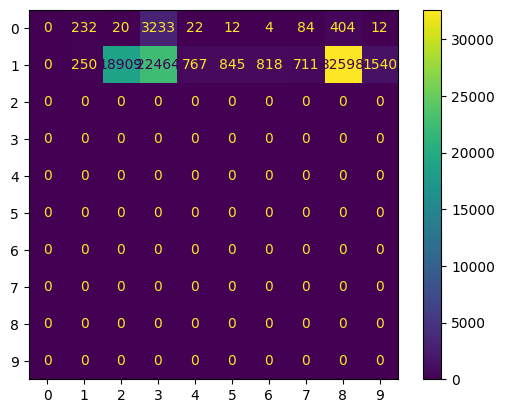

In [ ]:
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, average_precision_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import os

# Load and preprocess new dataset (CICIDS2017)
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)

# Preprocess the data
data.columns = data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if 'Label_' in col]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)
data = data.drop(columns=label_columns)

# Separate features and target for detection
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor_new = torch.tensor(features, dtype=torch.float32)
y_tensor_new = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets for detection
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor_new, y_tensor_new, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define the detection model architecture
class DetectionNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(DetectionNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Initialize the detection model
input_dim = X_tensor_new.shape[1]
detection_model = DetectionNN(input_dim)

# Define criterion and optimizer for detection model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(detection_model.parameters(), lr=0.001)

# Training function for detection model
def train_detection_model(loader):
    detection_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = detection_model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for detection model
def evaluate_detection_model(loader):
    detection_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = detection_model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Fine-tuning loop for detection model
num_epochs = 15
for epoch in range(1, num_epochs + 1):
    train_loss = train_detection_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_detection_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_detection_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    print(f'Epoch: {epoch:02d}, Loss: {train_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

    # Detection metrics
    val_pred = torch.round(val_outputs).numpy()
    test_pred = torch.round(test_outputs).numpy()

    val_precision = precision_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_recall = recall_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_f1 = f1_score(val_labels, val_pred, average='weighted', zero_division=0)
    val_accuracy = accuracy_score(val_labels, val_pred)

    test_precision = precision_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_recall = recall_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(test_labels, test_pred, average='weighted', zero_division=0)
    test_accuracy = accuracy_score(test_labels, test_pred)

    print(f'Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}, Val F1: {val_f1:.4f}, Val Accuracy: {val_accuracy:.4f}')
    print(f'Test Precision: {test_precision:.4f}, Test Recall: {test_recall:.4f}, Test F1: {test_f1:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Save the trained detection model
torch.save(detection_model.state_dict(), '/content/drive/MyDrive/TGN_multi_detection_model.pth')

# Load and preprocess new dataset (CICIDS2017) for classification
classification_data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

classification_data_path = '/content/drive/MyDrive/CICIDS2017/'

# Load and concatenate the data files for classification
classification_data_list = [pd.read_csv(os.path.join(classification_data_path, file)) for file in classification_data_files]
classification_data = pd.concat(classification_data_list, ignore_index=True)

# Preprocess the data
classification_data.columns = classification_data.columns.str.strip()  # Remove any leading/trailing whitespace

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
classification_data = classification_data.drop(columns=[col for col in columns_to_drop if col in classification_data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = classification_data.select_dtypes(include=['object']).columns
classification_data = pd.get_dummies(classification_data, columns=non_numeric_columns)

# Replace infinity or large values
classification_data = classification_data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for classification
label_columns = [col for col in classification_data.columns if col.startswith('Label_')]
classification_data['attack_type'] = classification_data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
classification_data = classification_data.drop(columns=label_columns)

# Separate features and target for classification
classification_features = classification_data.drop(columns=['attack_type'])
classification_target = classification_data['attack_type']

# Feature scaling
classification_features = scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(pd.factorize(classification_target)[0], dtype=torch.long)

# Split the data into training, validation, and test sets for classification
X_train_clf, X_temp_clf, y_train_clf, y_temp_clf = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42)
X_val_clf, X_test_clf, y_val_clf, y_test_clf = train_test_split(X_temp_clf, y_temp_clf, test_size=0.5, random_state=42)

# Create DataLoader for each classification dataset
train_dataset_clf = TensorDataset(X_train_clf, y_train_clf)
val_dataset_clf = TensorDataset(X_val_clf, y_val_clf)
test_dataset_clf = TensorDataset(X_test_clf, y_test_clf)

train_loader_clf = DataLoader(train_dataset_clf, batch_size=batch_size, shuffle=True)
val_loader_clf = DataLoader(val_dataset_clf, batch_size=batch_size, shuffle=False)
test_loader_clf = DataLoader(test_dataset_clf, batch_size=batch_size, shuffle=False)

# Define the classification model architecture
class ClassificationNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(ClassificationNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

# Initialize the classification model
num_classes = len(set(classification_target))
classification_model = ClassificationNN(input_dim, num_classes)

# Define criterion and optimizer for classification model
criterion_clf = torch.nn.CrossEntropyLoss()
optimizer_clf = torch.optim.Adam(classification_model.parameters(), lr=0.001)

# Training function for classification model
def train_classification_model(loader):
    classification_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_clf.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion_clf(outputs, labels)
        loss.backward()
        optimizer_clf.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for classification model
def evaluate_classification_model(loader):
    classification_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = classification_model(inputs)
            loss = criterion_clf(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for classification model
for epoch in range(1, num_epochs + 1):
    train_loss_clf = train_classification_model(train_loader_clf)
    val_loss_clf, val_outputs_clf, val_labels_clf = evaluate_classification_model(val_loader_clf)
    test_loss_clf, test_outputs_clf, test_labels_clf = evaluate_classification_model(test_loader_clf)

    val_precision_clf = precision_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_recall_clf = recall_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_f1_clf = f1_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_accuracy_clf = accuracy_score(val_labels_clf, val_outputs_clf.argmax(dim=1))

    test_precision_clf = precision_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_recall_clf = recall_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_f1_clf = f1_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_accuracy_clf = accuracy_score(test_labels_clf, test_outputs_clf.argmax(dim=1))

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss_clf:.4f}, Val Loss: {val_loss_clf:.4f}, Test Loss: {test_loss_clf:.4f}')
    print(f'Val Precision: {val_precision_clf:.4f}, Val Recall: {val_recall_clf:.4f}, Val F1: {val_f1_clf:.4f}, Val Accuracy: {val_accuracy_clf:.4f}')
    print(f'Test Precision: {test_precision_clf:.4f}, Test Recall: {test_recall_clf:.4f}, Test F1: {test_f1_clf:.4f}, Test Accuracy: {test_accuracy_clf:.4f}')

# Save the trained classification model
torch.save(classification_model.state_dict(), '/content/drive/MyDrive/TGN_multi_classification_model.pth')

class MultiModel:
    def __init__(self, detection_model, classification_model, input_dim_detection, input_dim_classification, num_classes_classification):
        self.detection_model = detection_model
        self.classification_model = classification_model
        self.input_dim_detection = input_dim_detection
        self.input_dim_classification = input_dim_classification
        self.num_classes_classification = num_classes_classification

    def predict(self, x):
        # First, use the detection model to check if there is an attack
        detection_output = self.detection_model(x)
        detection_result = torch.round(detection_output).item()

        if detection_result == 1:  # If an attack is detected
            # Use the classification model to classify the type of attack
            classification_output = self.classification_model(x)
            classification_result = torch.argmax(classification_output, dim=1).item()
            return classification_result + 1  # Adding 1 to avoid 0 index overlap with benign
        else:
            return 0  # No attack, represented as class 0

# Initialize the MultiModel with the detection and classification models
multi_model = MultiModel(detection_model, classification_model, input_dim_detection=input_dim, input_dim_classification=input_dim, num_classes_classification=num_classes)

# Evaluate the MultiModel on the test dataset
multi_model_results = []
true_labels = []
for x, y in zip(X_test, y_test):
    result = multi_model.predict(x.unsqueeze(0))
    multi_model_results.append(result)
    true_labels.append(y.item())

# Convert the predictions and labels to numpy arrays for evaluation
attack_indices = [i for i, result in enumerate(multi_model_results) if result != 0]
classification_outputs = np.array([multi_model_results[i] for i in attack_indices])
classification_labels = np.array([true_labels[i] for i in attack_indices])

# Calculate classification metrics
if len(classification_outputs) > 0:
    classification_precision = precision_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_recall = recall_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_f1 = f1_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_accuracy = accuracy_score(classification_labels, classification_outputs)

    print(f'Classification Precision: {classification_precision:.4f}')
    print(f'Classification Recall: {classification_recall:.4f}')
    print(f'Classification F1: {classification_f1:.4f}')
    print(f'Classification Accuracy: {classification_accuracy:.4f}')

    # Confusion Matrix for classification model
    conf_matrix = confusion_matrix(classification_labels, classification_outputs)
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=np.arange(0, num_classes + 1)).plot()
    plt.title('Classification Model Confusion Matrix')
    plt.show()
else:
    print("No attacks detected for classification evaluation.")


Epoch: 01, Train Loss: 0.0023, Val Loss: 0.0010, Test Loss: 0.0017
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 0.9999, Test AUC: 1.0000
Input dimension for classification model: 79
Epoch: 01, Train Loss: 0.1044, Val Loss: 0.0267, Test Loss: 0.0258
Val Precision: 0.9930, Val Recall: 0.9936, Val F1: 0.9931, Val Accuracy: 0.9936
Test Precision: 0.9932, Test Recall: 0.9936, Test F1: 0.9932, Test Accuracy: 0.9936
Classification Precision: 0.9999
Classification Recall: 0.0014
Classification F1: 0.0028
Classification Accuracy: 0.0014


ValueError: The number of FixedLocator locations (9), usually from a call to set_ticks, does not match the number of labels (15).

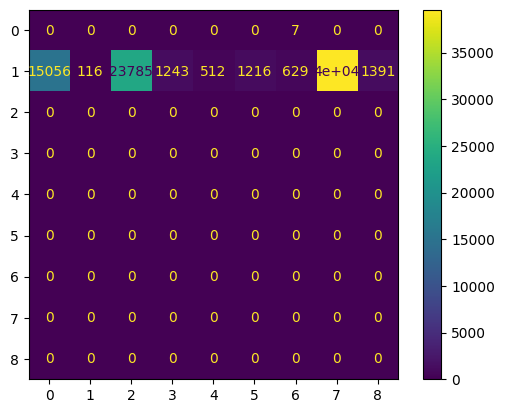

In [ ]:
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, average_precision_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the detection model architecture
class DetectionNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(DetectionNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Define the classification model architecture
class ClassificationNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(ClassificationNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Separate features and target for detection
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets for detection
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the detection model
input_dim = X_tensor.shape[1]
detection_model = DetectionNN(input_dim)

# Define criterion and optimizer for detection model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(detection_model.parameters(), lr=0.001)

# Training function for detection model
def train_detection_model(loader):
    detection_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = detection_model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for detection model
def evaluate_detection_model(loader):
    detection_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = detection_model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for detection model
num_epochs = 1
for epoch in range(1, num_epochs + 1):
    train_loss = train_detection_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_detection_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_detection_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

# Save the trained detection model
torch.save(detection_model.state_dict(), '/content/drive/MyDrive/TGN_multi_detection_model.pth')

# Use the detection model to filter out benign data for classification
detection_model.eval()
with torch.no_grad():
    detection_outputs = detection_model(torch.tensor(features, dtype=torch.float32)).squeeze()
    attack_indices = (detection_outputs >= 0.5).nonzero(as_tuple=True)[0]

# Use only the detected attacks for classification
classification_data = data.iloc[attack_indices].copy()

# Re-identify the label columns since they might be missing after filtering
label_columns = [col for col in classification_data.columns if col.startswith('Label_')]
classification_data['attack_type'] = classification_data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
classification_data = classification_data.drop(columns=label_columns)

# Separate features and target for classification
classification_features = classification_data.drop(columns=['attack_type'])
classification_target = classification_data['attack_type']

# Feature scaling
classification_features = scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(pd.factorize(classification_target)[0], dtype=torch.long)

# Verify input dimension for classification model
input_dim_classification = X_tensor_classification.shape[1]
print(f'Input dimension for classification model: {input_dim_classification}')

# Split the data into training, validation, and test sets for classification
X_train_clf, X_temp_clf, y_train_clf, y_temp_clf = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42)
X_val_clf, X_test_clf, y_val_clf, y_test_clf = train_test_split(X_temp_clf, y_temp_clf, test_size=0.5, random_state=42)

# Create DataLoader for each classification dataset
train_dataset_clf = TensorDataset(X_train_clf, y_train_clf)
val_dataset_clf = TensorDataset(X_val_clf, y_val_clf)
test_dataset_clf = TensorDataset(X_test_clf, y_test_clf)

train_loader_clf = DataLoader(train_dataset_clf, batch_size=batch_size, shuffle=True)
val_loader_clf = DataLoader(val_dataset_clf, batch_size=batch_size, shuffle=False)
test_loader_clf = DataLoader(test_dataset_clf, batch_size=batch_size, shuffle=False)

# Initialize the classification model with the correct input dimension
num_classes = len(set(classification_target))
classification_model = ClassificationNN(input_dim_classification, num_classes)

# Define criterion and optimizer for classification model
criterion_clf = torch.nn.CrossEntropyLoss()
optimizer_clf = torch.optim.Adam(classification_model.parameters(), lr=0.001)

# Training function for classification model
def train_classification_model(loader):
    classification_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_clf.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion_clf(outputs, labels)
        loss.backward()
        optimizer_clf.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for classification model
def evaluate_classification_model(loader):
    classification_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = classification_model(inputs)
            loss = criterion_clf(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for classification model
for epoch in range(1, num_epochs + 1):
    train_loss_clf = train_classification_model(train_loader_clf)
    val_loss_clf, val_outputs_clf, val_labels_clf = evaluate_classification_model(val_loader_clf)
    test_loss_clf, test_outputs_clf, test_labels_clf = evaluate_classification_model(test_loader_clf)

    val_precision_clf = precision_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_recall_clf = recall_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_f1_clf = f1_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_accuracy_clf = accuracy_score(val_labels_clf, val_outputs_clf.argmax(dim=1))

    test_precision_clf = precision_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_recall_clf = recall_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_f1_clf = f1_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_accuracy_clf = accuracy_score(test_labels_clf, test_outputs_clf.argmax(dim=1))

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss_clf:.4f}, Val Loss: {val_loss_clf:.4f}, Test Loss: {test_loss_clf:.4f}')
    print(f'Val Precision: {val_precision_clf:.4f}, Val Recall: {val_recall_clf:.4f}, Val F1: {val_f1_clf:.4f}, Val Accuracy: {val_accuracy_clf:.4f}')
    print(f'Test Precision: {test_precision_clf:.4f}, Test Recall: {test_recall_clf:.4f}, Test F1: {test_f1_clf:.4f}, Test Accuracy: {test_accuracy_clf:.4f}')

# Save the trained classification model
torch.save(classification_model.state_dict(), '/content/drive/MyDrive/TGN_multi_classification_model.pth')

class MultiModel:
    def __init__(self, detection_model, classification_model, input_dim_detection, input_dim_classification, num_classes_classification):
        self.detection_model = detection_model
        self.classification_model = classification_model
        self.input_dim_detection = input_dim_detection
        self.input_dim_classification = input_dim_classification
        self.num_classes_classification = num_classes_classification

    def predict(self, x):
        # First, use the detection model to check if there is an attack
        detection_output = self.detection_model(x)
        detection_result = torch.round(detection_output).item()

        if detection_result == 1:  # If an attack is detected
            # Ensure the input dimension is correct for the classification model
            if x.shape[1] != self.input_dim_classification:
                x = x[:, :self.input_dim_classification]
            # Use the classification model to classify the type of attack
            classification_output = self.classification_model(x)
            classification_result = torch.argmax(classification_output, dim=1).item()
            return classification_result
        else:
            return "No attack"

# Initialize the MultiModel with the detection and classification models
multi_model = MultiModel(detection_model, classification_model, input_dim_detection=input_dim, input_dim_classification=input_dim_classification, num_classes_classification=num_classes)

# Evaluate the MultiModel on the test dataset
multi_model_results = []
for x in X_test:
    x = x.unsqueeze(0)  # Ensure the input has the correct shape
    result = multi_model.predict(x)
    multi_model_results.append(result)

# Convert the predictions and labels to numpy arrays for evaluation
attack_indices = [i for i, result in enumerate(multi_model_results) if result != "No attack"]
classification_outputs = np.array([multi_model_results[i] for i in attack_indices])
classification_labels = np.array([y_test[i].item() for i in attack_indices])

# Calculate classification metrics
if len(classification_outputs) > 0:
    classification_precision = precision_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_recall = recall_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_f1 = f1_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_accuracy = accuracy_score(classification_labels, classification_outputs)

    print(f'Classification Precision: {classification_precision:.4f}')
    print(f'Classification Recall: {classification_recall:.4f}')
    print(f'Classification F1: {classification_f1:.4f}')
    print(f'Classification Accuracy: {classification_accuracy:.4f}')

    # Confusion Matrix for classification model
    conf_matrix = confusion_matrix(classification_labels, classification_outputs)
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=np.arange(num_classes)).plot()
    plt.title('Classification Model Confusion Matrix')
    plt.show()
else:
    print("No attacks detected for classification evaluation.")


Epoch: 01, Train Loss: 0.0023, Val Loss: 0.0010, Test Loss: 0.0017
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 0.9999, Test AUC: 1.0000
Epoch: 02, Train Loss: 0.0012, Val Loss: 0.0009, Test Loss: 0.0017
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 0.9999, Test AUC: 1.0000
Epoch: 03, Train Loss: 0.0011, Val Loss: 0.0007, Test Loss: 0.0010
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 04, Train Loss: 0.0002, Val Loss: 0.0000, Test Loss: 0.0000
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 05, Train Loss: 0.0005, Val Loss: 0.0000, Test Loss: 0.0000
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 06, Train Loss: 0.0006, Val Loss: 0.0000, Test Loss: 0.0000
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 07, Train Loss: 0.0004, Val Loss: 0.0000, Test Loss: 0.0000
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 08, Train Loss: 0.0004, Val Loss: 0.0000, Test Loss: 0.0000
Va

ValueError: The number of FixedLocator locations (9), usually from a call to set_ticks, does not match the number of labels (1).

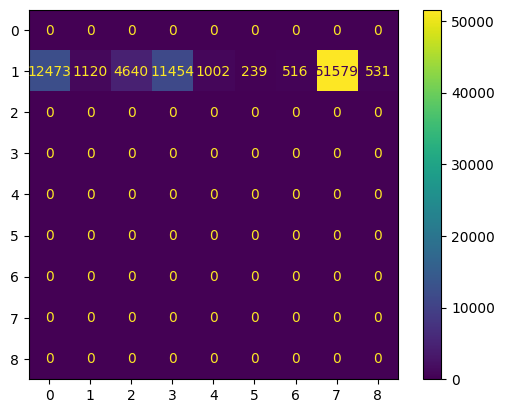

In [ ]:
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the detection model architecture
class DetectionNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(DetectionNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Define the classification model architecture
class ClassificationNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(ClassificationNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Separate features and target for detection
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets for detection
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the detection model
input_dim = X_tensor.shape[1]
detection_model = DetectionNN(input_dim)

# Define criterion and optimizer for detection model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(detection_model.parameters(), lr=0.001)

# Training function for detection model
def train_detection_model(loader):
    detection_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = detection_model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for detection model
def evaluate_detection_model(loader):
    detection_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = detection_model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for detection model
num_epochs = 15
for epoch in range(1, num_epochs + 1):
    train_loss = train_detection_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_detection_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_detection_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

# Save the trained detection model
torch.save(detection_model.state_dict(), '/content/drive/MyDrive/TGN_multi_detection_model.pth')

# Use the detection model to filter out benign data for classification
detection_model.eval()
with torch.no_grad():
    detection_outputs = detection_model(torch.tensor(features, dtype=torch.float32)).squeeze()
    attack_indices = (detection_outputs >= 0.5).nonzero(as_tuple=True)[0]

# Use only the detected attacks for classification
classification_data = data.iloc[attack_indices].copy()

# Re-identify the label columns since they might be missing after filtering
label_columns = [col for col in classification_data.columns if col.startswith('Label_')]
classification_data['attack_type'] = classification_data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
classification_data = classification_data.drop(columns=label_columns)

# Separate features and target for classification
classification_features = classification_data.drop(columns=['attack_type'])
classification_target = classification_data['attack_type']

# Feature scaling
classification_features = scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(pd.factorize(classification_target)[0], dtype=torch.long)

# Verify input dimension for classification model
input_dim_classification = X_tensor_classification.shape[1]
print(f'Input dimension for classification model: {input_dim_classification}')

# Split the data into training, validation, and test sets for classification
X_train_clf, X_temp_clf, y_train_clf, y_temp_clf = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42)
X_val_clf, X_test_clf, y_val_clf, y_test_clf = train_test_split(X_temp_clf, y_temp_clf, test_size=0.5, random_state=42)

# Create DataLoader for each classification dataset
train_dataset_clf = TensorDataset(X_train_clf, y_train_clf)
val_dataset_clf = TensorDataset(X_val_clf, y_val_clf)
test_dataset_clf = TensorDataset(X_test_clf, y_test_clf)

train_loader_clf = DataLoader(train_dataset_clf, batch_size=batch_size, shuffle=True)
val_loader_clf = DataLoader(val_dataset_clf, batch_size=batch_size, shuffle=False)
test_loader_clf = DataLoader(test_dataset_clf, batch_size=batch_size, shuffle=False)

# Initialize the classification model with the correct input dimension
num_classes = len(set(classification_target))
classification_model = ClassificationNN(input_dim_classification, num_classes)

# Define criterion and optimizer for classification model
criterion_clf = torch.nn.CrossEntropyLoss()
optimizer_clf = torch.optim.Adam(classification_model.parameters(), lr=0.001)

# Training function for classification model
def train_classification_model(loader):
    classification_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_clf.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion_clf(outputs, labels)
        loss.backward()
        optimizer_clf.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for classification model
def evaluate_classification_model(loader):
    classification_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = classification_model(inputs)
            loss = criterion_clf(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for classification model
for epoch in range(1, num_epochs + 1):
    train_loss_clf = train_classification_model(train_loader_clf)
    val_loss_clf, val_outputs_clf, val_labels_clf = evaluate_classification_model(val_loader_clf)
    test_loss_clf, test_outputs_clf, test_labels_clf = evaluate_classification_model(test_loader_clf)

    val_precision_clf = precision_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_recall_clf = recall_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_f1_clf = f1_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_accuracy_clf = accuracy_score(val_labels_clf, val_outputs_clf.argmax(dim=1))

    test_precision_clf = precision_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_recall_clf = recall_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_f1_clf = f1_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_accuracy_clf = accuracy_score(test_labels_clf, test_outputs_clf.argmax(dim=1))

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss_clf:.4f}, Val Loss: {val_loss_clf:.4f}, Test Loss: {test_loss_clf:.4f}')
    print(f'Val Precision: {val_precision_clf:.4f}, Val Recall: {val_recall_clf:.4f}, Val F1: {val_f1_clf:.4f}, Val Accuracy: {val_accuracy_clf:.4f}')
    print(f'Test Precision: {test_precision_clf:.4f}, Test Recall: {test_recall_clf:.4f}, Test F1: {test_f1_clf:.4f}, Test Accuracy: {test_accuracy_clf:.4f}')

# Save the trained classification model
torch.save(classification_model.state_dict(), '/content/drive/MyDrive/TGN_multi_classification_model.pth')

class MultiModel:
    def __init__(self, detection_model, classification_model, input_dim_detection, input_dim_classification, num_classes_classification):
        self.detection_model = detection_model
        self.classification_model = classification_model
        self.input_dim_detection = input_dim_detection
        self.input_dim_classification = input_dim_classification
        self.num_classes_classification = num_classes_classification

    def predict(self, x):
        # First, use the detection model to check if there is an attack
        detection_output = self.detection_model(x)
        detection_result = torch.round(detection_output).item()

        if detection_result == 1:  # If an attack is detected
            # Ensure the input dimension is correct for the classification model
            if x.shape[1] != self.input_dim_classification:
                x = x[:, :self.input_dim_classification]
            # Use the classification model to classify the type of attack
            classification_output = self.classification_model(x)
            classification_result = torch.argmax(classification_output, dim=1).item()
            return classification_result
        else:
            return -1  # Return -1 for "No attack"

# Initialize the MultiModel with the detection and classification models
multi_model = MultiModel(detection_model, classification_model, input_dim_detection=input_dim, input_dim_classification=input_dim_classification, num_classes_classification=num_classes)

# Evaluate the MultiModel on the test dataset
multi_model_results = []
for x in X_test:
    x = x.unsqueeze(0)  # Ensure the input has the correct shape
    result = multi_model.predict(x)
    multi_model_results.append(result)

# Convert the predictions and labels to numpy arrays for evaluation
attack_indices = [i for i, result in enumerate(multi_model_results) if result != -1]
classification_outputs = np.array([multi_model_results[i] for i in attack_indices])
classification_labels = np.array([y_test[i].item() for i in attack_indices])

# Correctly identify the number of unique classes
unique_labels = np.unique(classification_labels)
print(f'Unique labels: {unique_labels}')

# Calculate classification metrics
if len(classification_outputs) > 0:
    classification_precision = precision_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_recall = recall_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_f1 = f1_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_accuracy = accuracy_score(classification_labels, classification_outputs)

    print(f'Classification Precision: {classification_precision:.4f}')
    print(f'Classification Recall: {classification_recall:.4f}')
    print(f'Classification F1: {classification_f1:.4f}')
    print(f'Classification Accuracy: {classification_accuracy:.4f}')

    # Confusion Matrix for classification model
    conf_matrix = confusion_matrix(classification_labels, classification_outputs)
    display_labels = np.arange(len(unique_labels))
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
    plt.title('Classification Model Confusion Matrix')
    plt.show()
else:
    print("No attacks detected for classification evaluation.")


Epoch: 01, Train Loss: 0.0030, Val Loss: 0.0009, Test Loss: 0.0017
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 0.9999, Test AUC: 1.0000
Epoch: 02, Train Loss: 0.0014, Val Loss: 0.0009, Test Loss: 0.0017
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 0.9999, Test AUC: 1.0000
Epoch: 03, Train Loss: 0.0007, Val Loss: 0.0000, Test Loss: 0.0000
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 04, Train Loss: 0.0007, Val Loss: 0.0000, Test Loss: 0.0000
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 05, Train Loss: 0.0006, Val Loss: 0.0002, Test Loss: 0.0003
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 06, Train Loss: 0.0009, Val Loss: 0.0002, Test Loss: 0.0002
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 07, Train Loss: 0.0010, Val Loss: 0.0002, Test Loss: 0.0002
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 08, Train Loss: 0.0007, Val Loss: 0.0000, Test Loss: 0.0000
Va

ValueError: The number of FixedLocator locations (11), usually from a call to set_ticks, does not match the number of labels (2).

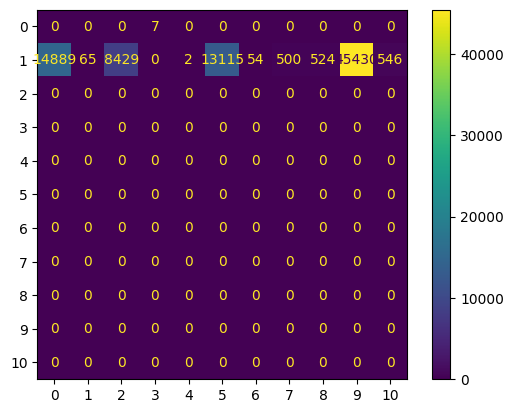

In [ ]:
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, average_precision_score, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the detection model architecture
class DetectionNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(DetectionNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Define the classification model architecture
class ClassificationNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(ClassificationNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Separate features and target for detection
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets for detection
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the detection model
input_dim = X_tensor.shape[1]
detection_model = DetectionNN(input_dim)

# Define criterion and optimizer for detection model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(detection_model.parameters(), lr=0.001)

# Training function for detection model
def train_detection_model(loader):
    detection_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = detection_model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for detection model
def evaluate_detection_model(loader):
    detection_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = detection_model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for detection model
num_epochs = 15
for epoch in range(1, num_epochs + 1):
    train_loss = train_detection_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_detection_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_detection_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

# Save the trained detection model
torch.save(detection_model.state_dict(), '/content/drive/MyDrive/TGN_multi_detection_model.pth')

# Use the detection model to filter out benign data for classification
detection_model.eval()
with torch.no_grad():
    detection_outputs = detection_model(torch.tensor(features, dtype=torch.float32)).squeeze()
    attack_indices = (detection_outputs >= 0.5).nonzero(as_tuple=True)[0]

# Use only the detected attacks for classification
classification_data = data.iloc[attack_indices].copy()

# Re-identify the label columns since they might be missing after filtering
label_columns = [col for col in classification_data.columns if col.startswith('Label_')]
classification_data['attack_type'] = classification_data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
classification_data = classification_data.drop(columns=label_columns)

# Separate features and target for classification
classification_features = classification_data.drop(columns=['attack_type'])
classification_target = classification_data['attack_type']

# Feature scaling
classification_features = scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(pd.factorize(classification_target)[0], dtype=torch.long)

# Verify input dimension for classification model
input_dim_classification = X_tensor_classification.shape[1]
print(f'Input dimension for classification model: {input_dim_classification}')

# Split the data into training, validation, and test sets for classification
X_train_clf, X_temp_clf, y_train_clf, y_temp_clf = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42)
X_val_clf, X_test_clf, y_val_clf, y_test_clf = train_test_split(X_temp_clf, y_temp_clf, test_size=0.5, random_state=42)

# Create DataLoader for each classification dataset
train_dataset_clf = TensorDataset(X_train_clf, y_train_clf)
val_dataset_clf = TensorDataset(X_val_clf, y_val_clf)
test_dataset_clf = TensorDataset(X_test_clf, y_test_clf)

train_loader_clf = DataLoader(train_dataset_clf, batch_size=batch_size, shuffle=True)
val_loader_clf = DataLoader(val_dataset_clf, batch_size=batch_size, shuffle=False)
test_loader_clf = DataLoader(test_dataset_clf, batch_size=batch_size, shuffle=False)

# Initialize the classification model with the correct input dimension
num_classes = len(set(classification_target))
classification_model = ClassificationNN(input_dim_classification, num_classes)

# Define criterion and optimizer for classification model
criterion_clf = torch.nn.CrossEntropyLoss()
optimizer_clf = torch.optim.Adam(classification_model.parameters(), lr=0.001)

# Training function for classification model
def train_classification_model(loader):
    classification_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_clf.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion_clf(outputs, labels)
        loss.backward()
        optimizer_clf.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for classification model
def evaluate_classification_model(loader):
    classification_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = classification_model(inputs)
            loss = criterion_clf(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for classification model
for epoch in range(1, num_epochs + 1):
    train_loss_clf = train_classification_model(train_loader_clf)
    val_loss_clf, val_outputs_clf, val_labels_clf = evaluate_classification_model(val_loader_clf)
    test_loss_clf, test_outputs_clf, test_labels_clf = evaluate_classification_model(test_loader_clf)

    val_precision_clf = precision_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_recall_clf = recall_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_f1_clf = f1_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_accuracy_clf = accuracy_score(val_labels_clf, val_outputs_clf.argmax(dim=1))

    test_precision_clf = precision_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_recall_clf = recall_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_f1_clf = f1_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_accuracy_clf = accuracy_score(test_labels_clf, test_outputs_clf.argmax(dim=1))

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss_clf:.4f}, Val Loss: {val_loss_clf:.4f}, Test Loss: {test_loss_clf:.4f}')
    print(f'Val Precision: {val_precision_clf:.4f}, Val Recall: {val_recall_clf:.4f}, Val F1: {val_f1_clf:.4f}, Val Accuracy: {val_accuracy_clf:.4f}')
    print(f'Test Precision: {test_precision_clf:.4f}, Test Recall: {test_recall_clf:.4f}, Test F1: {test_f1_clf:.4f}, Test Accuracy: {test_accuracy_clf:.4f}')

# Save the trained classification model
torch.save(classification_model.state_dict(), '/content/drive/MyDrive/TGN_multi_classification_model.pth')

class MultiModel:
    def __init__(self, detection_model, classification_model, input_dim_detection, input_dim_classification, num_classes_classification):
        self.detection_model = detection_model
        self.classification_model = classification_model
        self.input_dim_detection = input_dim_detection
        self.input_dim_classification = input_dim_classification
        self.num_classes_classification = num_classes_classification

    def predict(self, x):
        # First, use the detection model to check if there is an attack
        detection_output = self.detection_model(x)
        detection_result = torch.round(detection_output).item()

        if detection_result == 1:  # If an attack is detected
            # Ensure the input dimension is correct for the classification model
            if x.shape[1] != self.input_dim_classification:
                x = x[:, :self.input_dim_classification]
            # Use the classification model to classify the type of attack
            classification_output = self.classification_model(x)
            classification_result = torch.argmax(classification_output, dim=1).item()
            return classification_result
        else:
            return -1  # Return -1 for "No attack"

# Initialize the MultiModel with the detection and classification models
multi_model = MultiModel(detection_model, classification_model, input_dim_detection=input_dim, input_dim_classification=input_dim_classification, num_classes_classification=num_classes)

# Evaluate the MultiModel on the test dataset
multi_model_results = []
for x in X_test:
    x = x.unsqueeze(0)  # Ensure the input has the correct shape
    result = multi_model.predict(x)
    multi_model_results.append(result)

# Convert the predictions and labels to numpy arrays for evaluation
attack_indices = [i for i, result in enumerate(multi_model_results) if result != -1]
classification_outputs = np.array([multi_model_results[i] for i in attack_indices])
classification_labels = np.array([y_test[i].item() for i in attack_indices])

# Debugging information for unique labels
unique_labels = np.unique(classification_labels)
print(f'Unique labels: {unique_labels}')

# Calculate classification metrics
if len(classification_outputs) > 0:
    classification_precision = precision_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_recall = recall_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_f1 = f1_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_accuracy = accuracy_score(classification_labels, classification_outputs)

    print(f'Classification Precision: {classification_precision:.4f}')
    print(f'Classification Recall: {classification_recall:.4f}')
    print(f'Classification F1: {classification_f1:.4f}')
    print(f'Classification Accuracy: {classification_accuracy:.4f}')

    # Confusion Matrix for classification model
    conf_matrix = confusion_matrix(classification_labels, classification_outputs)
    display_labels = np.arange(len(unique_labels))
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
    plt.title('Classification Model Confusion Matrix')
    plt.show()
else:
    print("No attacks detected for classification evaluation.")

# Plot Confusion Matrix for validation set of classification model
val_pred_labels = val_outputs_clf.argmax(dim=1).numpy()
val_true_labels = val_labels_clf.numpy()
val_conf_matrix = confusion_matrix(val_true_labels, val_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix).plot()
plt.title('Validation Confusion Matrix for Classification Model')
plt.show()

# Plot Confusion Matrix for test set of classification model
test_pred_labels = test_outputs_clf.argmax(dim=1).numpy()
test_true_labels = test_labels_clf.numpy()
test_conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=test_conf_matrix).plot()
plt.title('Test Confusion Matrix for Classification Model')
plt.show()


Epoch: 01, Train Loss: 0.0022, Val Loss: 0.0009, Test Loss: 0.0017
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 0.9999, Test AUC: 1.0000
Input dimension for classification model: 79
Epoch: 01, Train Loss: 0.1021, Val Loss: 0.0264, Test Loss: 0.0251
Val Precision: 0.9931, Val Recall: 0.9934, Val F1: 0.9929, Val Accuracy: 0.9934
Test Precision: 0.9932, Test Recall: 0.9937, Test F1: 0.9932, Test Accuracy: 0.9937
Unique labels: [0. 1.]
Classification Precision: 0.9999
Classification Recall: 0.0000
Classification F1: 0.0000
Classification Accuracy: 0.0000


ValueError: The number of FixedLocator locations (8), usually from a call to set_ticks, does not match the number of labels (15).

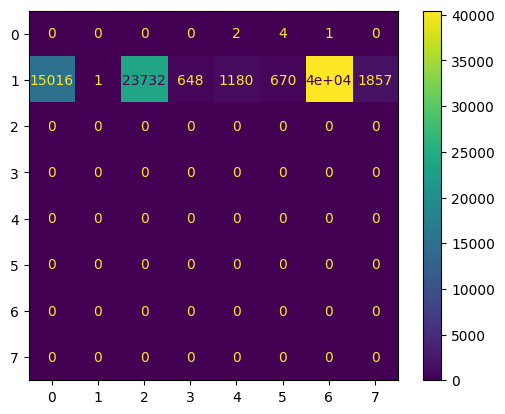

In [ ]:
import pandas as pd
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, average_precision_score, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the detection model architecture
class DetectionNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(DetectionNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Define the classification model architecture
class ClassificationNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(ClassificationNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Separate features and target for detection
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets for detection
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the detection model
input_dim = X_tensor.shape[1]
detection_model = DetectionNN(input_dim)

# Define criterion and optimizer for detection model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(detection_model.parameters(), lr=0.001)

# Training function for detection model
def train_detection_model(loader):
    detection_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = detection_model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for detection model
def evaluate_detection_model(loader):
    detection_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = detection_model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for detection model
num_epochs = 1
for epoch in range(1, num_epochs + 1):
    train_loss = train_detection_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_detection_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_detection_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

# Save the trained detection model
torch.save(detection_model.state_dict(), '/content/drive/MyDrive/TGN_multi_detection_model.pth')

# Use the detection model to filter out benign data for classification
detection_model.eval()
with torch.no_grad():
    detection_outputs = detection_model(torch.tensor(features, dtype=torch.float32)).squeeze()
    attack_indices = (detection_outputs >= 0.5).nonzero(as_tuple=True)[0]

# Use only the detected attacks for classification
classification_data = data.iloc[attack_indices].copy()

# Re-identify the label columns since they might be missing after filtering
label_columns = [col for col in classification_data.columns if col.startswith('Label_')]
classification_data['attack_type'] = classification_data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
classification_data = classification_data.drop(columns=label_columns)

# Separate features and target for classification
classification_features = classification_data.drop(columns=['attack_type'])
classification_target = classification_data['attack_type']

# Feature scaling
classification_features = scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(pd.factorize(classification_target)[0], dtype=torch.long)

# Verify input dimension for classification model
input_dim_classification = X_tensor_classification.shape[1]
print(f'Input dimension for classification model: {input_dim_classification}')

# Split the data into training, validation, and test sets for classification
X_train_clf, X_temp_clf, y_train_clf, y_temp_clf = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42)
X_val_clf, X_test_clf, y_val_clf, y_test_clf = train_test_split(X_temp_clf, y_temp_clf, test_size=0.5, random_state=42)

# Create DataLoader for each classification dataset
train_dataset_clf = TensorDataset(X_train_clf, y_train_clf)
val_dataset_clf = TensorDataset(X_val_clf, y_val_clf)
test_dataset_clf = TensorDataset(X_test_clf, y_test_clf)

train_loader_clf = DataLoader(train_dataset_clf, batch_size=batch_size, shuffle=True)
val_loader_clf = DataLoader(val_dataset_clf, batch_size=batch_size, shuffle=False)
test_loader_clf = DataLoader(test_dataset_clf, batch_size=batch_size, shuffle=False)

# Initialize the classification model with the correct input dimension
num_classes = len(set(classification_target))
classification_model = ClassificationNN(input_dim_classification, num_classes)

# Define criterion and optimizer for classification model
criterion_clf = torch.nn.CrossEntropyLoss()
optimizer_clf = torch.optim.Adam(classification_model.parameters(), lr=0.001)

# Training function for classification model
def train_classification_model(loader):
    classification_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_clf.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion_clf(outputs, labels)
        loss.backward()
        optimizer_clf.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for classification model
def evaluate_classification_model(loader):
    classification_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = classification_model(inputs)
            loss = criterion_clf(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for classification model
for epoch in range(1, num_epochs + 1):
    train_loss_clf = train_classification_model(train_loader_clf)
    val_loss_clf, val_outputs_clf, val_labels_clf = evaluate_classification_model(val_loader_clf)
    test_loss_clf, test_outputs_clf, test_labels_clf = evaluate_classification_model(test_loader_clf)

    val_precision_clf = precision_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_recall_clf = recall_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_f1_clf = f1_score(val_labels_clf, val_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    val_accuracy_clf = accuracy_score(val_labels_clf, val_outputs_clf.argmax(dim=1))

    test_precision_clf = precision_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_recall_clf = recall_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_f1_clf = f1_score(test_labels_clf, test_outputs_clf.argmax(dim=1), average='weighted', zero_division=0)
    test_accuracy_clf = accuracy_score(test_labels_clf, test_outputs_clf.argmax(dim=1))

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss_clf:.4f}, Val Loss: {val_loss_clf:.4f}, Test Loss: {test_loss_clf:.4f}')
    print(f'Val Precision: {val_precision_clf:.4f}, Val Recall: {val_recall_clf:.4f}, Val F1: {val_f1_clf:.4f}, Val Accuracy: {val_accuracy_clf:.4f}')
    print(f'Test Precision: {test_precision_clf:.4f}, Test Recall: {test_recall_clf:.4f}, Test F1: {test_f1_clf:.4f}, Test Accuracy: {test_accuracy_clf:.4f}')

# Save the trained classification model
torch.save(classification_model.state_dict(), '/content/drive/MyDrive/TGN_multi_classification_model.pth')

class MultiModel:
    def __init__(self, detection_model, classification_model, input_dim_detection, input_dim_classification, num_classes_classification):
        self.detection_model = detection_model
        self.classification_model = classification_model
        self.input_dim_detection = input_dim_detection
        self.input_dim_classification = input_dim_classification
        self.num_classes_classification = num_classes_classification

    def predict(self, x):
        # First, use the detection model to check if there is an attack
        detection_output = self.detection_model(x)
        detection_result = torch.round(detection_output).item()

        if detection_result == 1:  # If an attack is detected
            # Ensure the input dimension is correct for the classification model
            if x.shape[1] != self.input_dim_classification:
                x = x[:, :self.input_dim_classification]
            # Use the classification model to classify the type of attack
            classification_output = self.classification_model(x)
            classification_result = torch.argmax(classification_output, dim=1).item()
            return classification_result
        else:
            return -1  # Return -1 for "No attack"

# Initialize the MultiModel with the detection and classification models
multi_model = MultiModel(detection_model, classification_model, input_dim_detection=input_dim, input_dim_classification=input_dim_classification, num_classes_classification=num_classes)

# Evaluate the MultiModel on the test dataset
multi_model_results = []
for x in X_test:
    x = x.unsqueeze(0)  # Ensure the input has the correct shape
    result = multi_model.predict(x)
    multi_model_results.append(result)

# Convert the predictions and labels to numpy arrays for evaluation
attack_indices = [i for i, result in enumerate(multi_model_results) if result != -1]
classification_outputs = np.array([multi_model_results[i] for i in attack_indices])
classification_labels = np.array([y_test[i].item() for i in attack_indices])

# Debugging information for unique labels
unique_labels = np.unique(classification_labels)
print(f'Unique labels: {unique_labels}')

# Calculate classification metrics
if len(classification_outputs) > 0:
    classification_precision = precision_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_recall = recall_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_f1 = f1_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_accuracy = accuracy_score(classification_labels, classification_outputs)

    print(f'Classification Precision: {classification_precision:.4f}')
    print(f'Classification Recall: {classification_recall:.4f}')
    print(f'Classification F1: {classification_f1:.4f}')
    print(f'Classification Accuracy: {classification_accuracy:.4f}')

    # Confusion Matrix for classification model
    conf_matrix = confusion_matrix(classification_labels, classification_outputs)
    display_labels = np.arange(num_classes)
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
    plt.title('Classification Model Confusion Matrix')
    plt.show()
else:
    print("No attacks detected for classification evaluation.")

# Plot Confusion Matrix for validation set of classification model
val_pred_labels = val_outputs_clf.argmax(dim=1).numpy()
val_true_labels = val_labels_clf.numpy()
val_conf_matrix = confusion_matrix(val_true_labels, val_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix).plot()
plt.title('Validation Confusion Matrix for Classification Model')
plt.show()

# Plot Confusion Matrix for test set of classification model
test_pred_labels = test_outputs_clf.argmax(dim=1).numpy()
test_true_labels = test_labels_clf.numpy()
test_conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=test_conf_matrix).plot()
plt.title('Test Confusion Matrix for Classification Model')
plt.show()


In [ ]:
import pandas as pd
import torch
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, average_precision_score, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the detection model architecture
class DetectionNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(DetectionNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Define the classification model architecture
class ClassificationNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(ClassificationNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Separate features and target for detection
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets for detection
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42, stratify=y_tensor)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the detection model
input_dim = X_tensor.shape[1]
detection_model = DetectionNN(input_dim)

# Define criterion and optimizer for detection model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(detection_model.parameters(), lr=0.001)

# Training function for detection model
def train_detection_model(loader):
    detection_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = detection_model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for detection model
def evaluate_detection_model(loader):
    detection_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = detection_model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for detection model
num_epochs = 15
for epoch in range(1, num_epochs + 1):
    train_loss = train_detection_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_detection_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_detection_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

# Save the trained detection model
torch.save(detection_model.state_dict(), '/content/drive/MyDrive/TGN_multi_detection_model.pth')

# Use the detection model to filter out benign data for classification
detection_model.eval()
with torch.no_grad():
    detection_outputs = detection_model(X_tensor).squeeze()
    attack_indices = (detection_outputs >= 0.5).nonzero(as_tuple=True)[0]

# Use only the detected attacks for classification
classification_data = data.iloc[attack_indices].copy()

# Re-identify the label columns since they might be missing after filtering
label_columns = [col for col in classification_data.columns if col.startswith('Label_')]
classification_data['attack_type'] = classification_data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
classification_data = classification_data.drop(columns=label_columns)

# Separate features and target for classification
classification_features = classification_data.drop(columns=['attack_type'])
classification_target = classification_data['attack_type']

# Feature scaling
classification_features = scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(pd.factorize(classification_target)[0], dtype=torch.long)

# Verify input dimension for classification model
input_dim_classification = X_tensor_classification.shape[1]
print(f'Input dimension for classification model: {input_dim_classification}')

# Split the data into training, validation, and test sets for classification
X_train_clf, X_temp_clf, y_train_clf, y_temp_clf = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42, stratify=y_tensor_classification)
X_val_clf, X_test_clf, y_val_clf, y_test_clf = train_test_split(X_temp_clf, y_temp_clf, test_size=0.5, random_state=42, stratify=y_temp_clf)

# Create DataLoader for each classification dataset
train_dataset_clf = TensorDataset(X_train_clf, y_train_clf)
val_dataset_clf = TensorDataset(X_val_clf, y_val_clf)
test_dataset_clf = TensorDataset(X_test_clf, y_test_clf)

train_loader_clf = DataLoader(train_dataset_clf, batch_size=batch_size, shuffle=True)
val_loader_clf = DataLoader(val_dataset_clf, batch_size=batch_size, shuffle=False)
test_loader_clf = DataLoader(test_dataset_clf, batch_size=batch_size, shuffle=False)

# Initialize the classification model with the correct input dimension
num_classes = len(set(classification_target))
classification_model = ClassificationNN(input_dim_classification, num_classes)

# Define criterion and optimizer for classification model
criterion_clf = torch.nn.CrossEntropyLoss()
optimizer_clf = torch.optim.Adam(classification_model.parameters(), lr=0.001)

# Training function for classification model
def train_classification_model(loader):
    classification_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_clf.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion_clf(outputs, labels)
        loss.backward()
        optimizer_clf.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for classification model
def evaluate_classification_model(loader):
    classification_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = classification_model(inputs)
            loss = criterion_clf(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for classification model
for epoch in range(1, num_epochs + 1):
    train_loss_clf = train_classification_model(train_loader_clf)
    val_loss_clf, val_outputs_clf, val_labels_clf = evaluate_classification_model(val_loader_clf)
    test_loss_clf, test_outputs_clf, test_labels_clf = evaluate_classification_model(test_loader_clf)

    val_pred_labels = val_outputs_clf.argmax(dim=1).numpy()
    val_true_labels = val_labels_clf.numpy()
    test_pred_labels = test_outputs_clf.argmax(dim=1).numpy()
    test_true_labels = test_labels_clf.numpy()

    val_precision_clf = precision_score(val_true_labels, val_pred_labels, average='weighted', zero_division=0)
    val_recall_clf = recall_score(val_true_labels, val_pred_labels, average='weighted', zero_division=0)
    val_f1_clf = f1_score(val_true_labels, val_pred_labels, average='weighted', zero_division=0)
    val_accuracy_clf = accuracy_score(val_true_labels, val_pred_labels)

    test_precision_clf = precision_score(test_true_labels, test_pred_labels, average='weighted', zero_division=0)
    test_recall_clf = recall_score(test_true_labels, test_pred_labels, average='weighted', zero_division=0)
    test_f1_clf = f1_score(test_true_labels, test_pred_labels, average='weighted', zero_division=0)
    test_accuracy_clf = accuracy_score(test_true_labels, test_pred_labels)

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss_clf:.4f}, Val Loss: {val_loss_clf:.4f}, Test Loss: {test_loss_clf:.4f}')
    print(f'Val Precision: {val_precision_clf:.4f}, Val Recall: {val_recall_clf:.4f}, Val F1: {val_f1_clf:.4f}, Val Accuracy: {val_accuracy_clf:.4f}')
    print(f'Test Precision: {test_precision_clf:.4f}, Test Recall: {test_recall_clf:.4f}, Test F1: {test_f1_clf:.4f}, Test Accuracy: {test_accuracy_clf:.4f}')

# Save the trained classification model
torch.save(classification_model.state_dict(), '/content/drive/MyDrive/TGN_multi_classification_model.pth')

class MultiModel:
    def __init__(self, detection_model, classification_model, input_dim_detection, input_dim_classification, num_classes_classification):
        self.detection_model = detection_model
        self.classification_model = classification_model
        self.input_dim_detection = input_dim_detection
        self.input_dim_classification = input_dim_classification
        self.num_classes_classification = num_classes_classification

    def predict(self, x):
        # First, use the detection model to check if there is an attack
        detection_output = self.detection_model(x)
        detection_result = torch.round(detection_output).item()

        if detection_result == 1:  # If an attack is detected
            # Ensure the input dimension is correct for the classification model
            if x.shape[1] != self.input_dim_classification:
                x = x[:, :self.input_dim_classification]
            # Use the classification model to classify the type of attack
            classification_output = self.classification_model(x)
            classification_result = torch.argmax(classification_output, dim=1).item()
            return classification_result
        else:
            return -1  # Return -1 for "No attack"

# Initialize the MultiModel with the detection and classification models
multi_model = MultiModel(detection_model, classification_model, input_dim_detection=input_dim, input_dim_classification=input_dim_classification, num_classes_classification=num_classes)

# Evaluate the MultiModel on the test dataset
multi_model_results = []
for x in X_test:
    x = x.unsqueeze(0)  # Ensure the input has the correct shape
    result = multi_model.predict(x)
    multi_model_results.append(result)

# Convert the predictions and labels to numpy arrays for evaluation
attack_indices = [i for i, result in enumerate(multi_model_results) if result != -1]
classification_outputs = np.array([multi_model_results[i] for i in attack_indices])
classification_labels = np.array([y_test[i].item() for i in attack_indices])

# Debugging information for unique labels
unique_labels = np.unique(classification_labels)
print(f'Unique labels: {unique_labels}')

# Calculate classification metrics
if len(classification_outputs) > 0:
    classification_precision = precision_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_recall = recall_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_f1 = f1_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_accuracy = accuracy_score(classification_labels, classification_outputs)

    print(f'Classification Precision: {classification_precision:.4f}')
    print(f'Classification Recall: {classification_recall:.4f}')
    print(f'Classification F1: {classification_f1:.4f}')
    print(f'Classification Accuracy: {classification_accuracy:.4f}')

    # Confusion Matrix for classification model
    conf_matrix = confusion_matrix(classification_labels, classification_outputs)
    display_labels = np.arange(num_classes)
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
    plt.title('Classification Model Confusion Matrix')
    plt.show()
else:
    print("No attacks detected for classification evaluation.")

# Plot Confusion Matrix for validation set of classification model
val_pred_labels = val_outputs_clf.argmax(dim=1).numpy()
val_true_labels = val_labels_clf.numpy()
val_conf_matrix = confusion_matrix(val_true_labels, val_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix).plot()
plt.title('Validation Confusion Matrix for Classification Model')
plt.show()

# Plot Confusion Matrix for test set of classification model
test_pred_labels = test_outputs_clf.argmax(dim=1).numpy()
test_true_labels = test_labels_clf.numpy()
test_conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=test_conf_matrix).plot()
plt.title('Test Confusion Matrix for Classification Model')
plt.show()


Epoch: 01, Train Loss: 0.0013, Val Loss: 0.0000, Test Loss: 0.0000
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 02, Train Loss: 0.0004, Val Loss: 0.0000, Test Loss: 0.0000
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 03, Train Loss: 0.0005, Val Loss: 0.0000, Test Loss: 0.0002
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 04, Train Loss: 0.0003, Val Loss: 0.0000, Test Loss: 0.0000
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 05, Train Loss: 0.0003, Val Loss: 0.0000, Test Loss: 0.0000
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 06, Train Loss: 0.0003, Val Loss: 0.0000, Test Loss: 0.0000
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 07, Train Loss: 0.0008, Val Loss: 0.0000, Test Loss: 0.0000
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 1.0000, Test AUC: 1.0000
Epoch: 08, Train Loss: 0.0011, Val Loss: 0.0000, Test Loss: 0.0000
Va

KeyboardInterrupt: 

Epoch: 01, Train Loss: 0.0023, Val Loss: 0.0009, Test Loss: 0.0012
Val AP: 1.0000, Val AUC: 1.0000
Test AP: 0.9999, Test AUC: 1.0000
Input dimension for classification model: 79
Epoch: 01, Train Loss: 0.1052, Val Loss: 0.0269, Test Loss: 0.0238
Val Precision: 0.9935, Val Recall: 0.9940, Val F1: 0.9935, Val Accuracy: 0.9940
Test Precision: 0.9935, Test Recall: 0.9940, Test F1: 0.9935, Test Accuracy: 0.9940
Unique labels: [0. 1.]
Classification Precision: 0.9999
Classification Recall: 0.0017
Classification F1: 0.0034
Classification Accuracy: 0.0017


ValueError: The number of FixedLocator locations (9), usually from a call to set_ticks, does not match the number of labels (15).

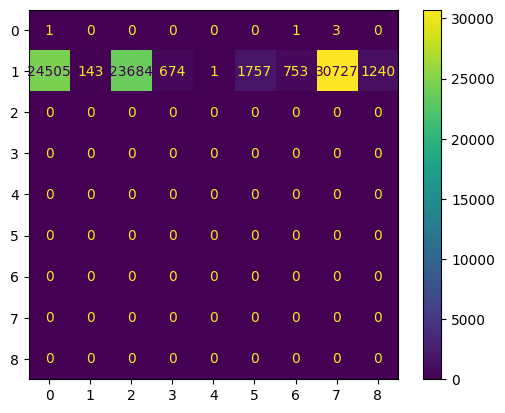

In [ ]:
import pandas as pd
import torch
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, average_precision_score, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the detection model architecture
class DetectionNN(torch.nn.Module):
    def __init__(self, input_dim):
        super(DetectionNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, 1)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Define the classification model architecture
class ClassificationNN(torch.nn.Module):
    def __init__(self, input_dim, num_classes):
        super(ClassificationNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 128)
        self.fc2 = torch.nn.Linear(128, 64)
        self.fc3 = torch.nn.Linear(64, num_classes)
        self.dropout = torch.nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Separate features and target for detection
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.values, dtype=torch.float32)

# Split the data into training, validation, and test sets for detection
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42, stratify=y_tensor)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the detection model
input_dim = X_tensor.shape[1]
detection_model = DetectionNN(input_dim)

# Define criterion and optimizer for detection model
criterion = torch.nn.BCELoss()
optimizer = torch.optim.Adam(detection_model.parameters(), lr=0.001)

# Training function for detection model
def train_detection_model(loader):
    detection_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer.zero_grad()
        outputs = detection_model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for detection model
def evaluate_detection_model(loader):
    detection_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = detection_model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for detection model
num_epochs = 1
for epoch in range(1, num_epochs + 1):
    train_loss = train_detection_model(train_loader)
    val_loss, val_outputs, val_labels = evaluate_detection_model(val_loader)
    test_loss, test_outputs, test_labels = evaluate_detection_model(test_loader)

    val_ap = average_precision_score(val_labels, val_outputs)
    val_auc = roc_auc_score(val_labels, val_outputs)
    test_ap = average_precision_score(test_labels, test_outputs)
    test_auc = roc_auc_score(test_labels, test_outputs)

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}')
    print(f'Val AP: {val_ap:.4f}, Val AUC: {val_auc:.4f}')
    print(f'Test AP: {test_ap:.4f}, Test AUC: {test_auc:.4f}')

# Save the trained detection model
torch.save(detection_model.state_dict(), '/content/drive/MyDrive/TGN_multi_detection_model.pth')

# Use the detection model to filter out benign data for classification
detection_model.eval()
with torch.no_grad():
    detection_outputs = detection_model(X_tensor).squeeze()
    attack_indices = (detection_outputs >= 0.5).nonzero(as_tuple=True)[0]

# Use only the detected attacks for classification
classification_data = data.iloc[attack_indices].copy()

# Re-identify the label columns since they might be missing after filtering
label_columns = [col for col in classification_data.columns if col.startswith('Label_')]
classification_data['attack_type'] = classification_data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
classification_data = classification_data.drop(columns=label_columns)

# Separate features and target for classification
classification_features = classification_data.drop(columns=['attack_type'])
classification_target = classification_data['attack_type']

# Feature scaling
classification_features = scaler.fit_transform(classification_features)

# Convert to PyTorch tensors
X_tensor_classification = torch.tensor(classification_features, dtype=torch.float32)
y_tensor_classification = torch.tensor(pd.factorize(classification_target)[0], dtype=torch.long)

# Verify input dimension for classification model
input_dim_classification = X_tensor_classification.shape[1]
print(f'Input dimension for classification model: {input_dim_classification}')

# Split the data into training, validation, and test sets for classification
X_train_clf, X_temp_clf, y_train_clf, y_temp_clf = train_test_split(X_tensor_classification, y_tensor_classification, test_size=0.3, random_state=42, stratify=y_tensor_classification)
X_val_clf, X_test_clf, y_val_clf, y_test_clf = train_test_split(X_temp_clf, y_temp_clf, test_size=0.5, random_state=42, stratify=y_temp_clf)

# Create DataLoader for each classification dataset
train_dataset_clf = TensorDataset(X_train_clf, y_train_clf)
val_dataset_clf = TensorDataset(X_val_clf, y_val_clf)
test_dataset_clf = TensorDataset(X_test_clf, y_test_clf)

train_loader_clf = DataLoader(train_dataset_clf, batch_size=batch_size, shuffle=True)
val_loader_clf = DataLoader(val_dataset_clf, batch_size=batch_size, shuffle=False)
test_loader_clf = DataLoader(test_dataset_clf, batch_size=batch_size, shuffle=False)

# Initialize the classification model with the correct input dimension
num_classes = len(set(classification_target))
classification_model = ClassificationNN(input_dim_classification, num_classes)

# Define criterion and optimizer for classification model
criterion_clf = torch.nn.CrossEntropyLoss()
optimizer_clf = torch.optim.Adam(classification_model.parameters(), lr=0.001)

# Training function for classification model
def train_classification_model(loader):
    classification_model.train()
    running_loss = 0.0
    for inputs, labels in loader:
        optimizer_clf.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion_clf(outputs, labels)
        loss.backward()
        optimizer_clf.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for classification model
def evaluate_classification_model(loader):
    classification_model.eval()
    running_loss = 0.0
    all_outputs = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = classification_model(inputs)
            loss = criterion_clf(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())
    all_outputs = torch.cat(all_outputs)
    all_labels = torch.cat(all_labels)
    return running_loss / len(loader.dataset), all_outputs, all_labels

# Training loop for classification model
for epoch in range(1, num_epochs + 1):
    train_loss_clf = train_classification_model(train_loader_clf)
    val_loss_clf, val_outputs_clf, val_labels_clf = evaluate_classification_model(val_loader_clf)
    test_loss_clf, test_outputs_clf, test_labels_clf = evaluate_classification_model(test_loader_clf)

    val_pred_labels = val_outputs_clf.argmax(dim=1).numpy()
    val_true_labels = val_labels_clf.numpy()
    test_pred_labels = test_outputs_clf.argmax(dim=1).numpy()
    test_true_labels = test_labels_clf.numpy()

    val_precision_clf = precision_score(val_true_labels, val_pred_labels, average='weighted', zero_division=0)
    val_recall_clf = recall_score(val_true_labels, val_pred_labels, average='weighted', zero_division=0)
    val_f1_clf = f1_score(val_true_labels, val_pred_labels, average='weighted', zero_division=0)
    val_accuracy_clf = accuracy_score(val_true_labels, val_pred_labels)

    test_precision_clf = precision_score(test_true_labels, test_pred_labels, average='weighted', zero_division=0)
    test_recall_clf = recall_score(test_true_labels, test_pred_labels, average='weighted', zero_division=0)
    test_f1_clf = f1_score(test_true_labels, test_pred_labels, average='weighted', zero_division=0)
    test_accuracy_clf = accuracy_score(test_true_labels, test_pred_labels)

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss_clf:.4f}, Val Loss: {val_loss_clf:.4f}, Test Loss: {test_loss_clf:.4f}')
    print(f'Val Precision: {val_precision_clf:.4f}, Val Recall: {val_recall_clf:.4f}, Val F1: {val_f1_clf:.4f}, Val Accuracy: {val_accuracy_clf:.4f}')
    print(f'Test Precision: {test_precision_clf:.4f}, Test Recall: {test_recall_clf:.4f}, Test F1: {test_f1_clf:.4f}, Test Accuracy: {test_accuracy_clf:.4f}')

# Save the trained classification model
torch.save(classification_model.state_dict(), '/content/drive/MyDrive/TGN_multi_classification_model.pth')

class MultiModel:
    def __init__(self, detection_model, classification_model, input_dim_detection, input_dim_classification, num_classes_classification):
        self.detection_model = detection_model
        self.classification_model = classification_model
        self.input_dim_detection = input_dim_detection
        self.input_dim_classification = input_dim_classification
        self.num_classes_classification = num_classes_classification

    def predict(self, x):
        # First, use the detection model to check if there is an attack
        detection_output = self.detection_model(x)
        detection_result = torch.round(detection_output).item()

        if detection_result == 1:  # If an attack is detected
            # Ensure the input dimension is correct for the classification model
            if x.shape[1] != self.input_dim_classification:
                x = x[:, :self.input_dim_classification]
            # Use the classification model to classify the type of attack
            classification_output = self.classification_model(x)
            classification_result = torch.argmax(classification_output, dim=1).item()
            return classification_result
        else:
            return -1  # Return -1 for "No attack"

# Initialize the MultiModel with the detection and classification models
multi_model = MultiModel(detection_model, classification_model, input_dim_detection=input_dim, input_dim_classification=input_dim_classification, num_classes_classification=num_classes)

# Evaluate the MultiModel on the test dataset
multi_model_results = []
multi_model_true_labels = []
for x, label in zip(X_test, y_test):
    x = x.unsqueeze(0)  # Ensure the input has the correct shape
    result = multi_model.predict(x)
    if result != -1:
        multi_model_results.append(result)
        multi_model_true_labels.append(label.item())

# Convert the predictions and labels to numpy arrays for evaluation
classification_outputs = np.array(multi_model_results)
classification_labels = np.array(multi_model_true_labels)

# Debugging information for unique labels
unique_labels = np.unique(classification_labels)
print(f'Unique labels: {unique_labels}')

# Calculate classification metrics
if len(classification_outputs) > 0:
    classification_precision = precision_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_recall = recall_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_f1 = f1_score(classification_labels, classification_outputs, average='weighted', zero_division=0)
    classification_accuracy = accuracy_score(classification_labels, classification_outputs)

    print(f'Classification Precision: {classification_precision:.4f}')
    print(f'Classification Recall: {classification_recall:.4f}')
    print(f'Classification F1: {classification_f1:.4f}')
    print(f'Classification Accuracy: {classification_accuracy:.4f}')

    # Confusion Matrix for classification model
    conf_matrix = confusion_matrix(classification_labels, classification_outputs)
    display_labels = np.arange(num_classes)
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
    plt.title('Classification Model Confusion Matrix')
    plt.show()
else:
    print("No attacks detected for classification evaluation.")

# Plot Confusion Matrix for validation set of classification model
val_pred_labels = val_outputs_clf.argmax(dim=1).numpy()
val_true_labels = val_labels_clf.numpy()
val_conf_matrix = confusion_matrix(val_true_labels, val_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix).plot()
plt.title('Validation Confusion Matrix for Classification Model')
plt.show()

# Plot Confusion Matrix for test set of classification model
test_pred_labels = test_outputs_clf.argmax(dim=1).numpy()
test_true_labels = test_labels_clf.numpy()
test_conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
ConfusionMatrixDisplay(confusion_matrix=test_conf_matrix).plot()
plt.title('Test Confusion Matrix for Classification Model')
plt.show()


Epoch: 01, Train Loss: 0.0065, Val Loss: 0.0000, Test Loss: 0.0003
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Epoch: 02, Train Loss: 0.0006, Val Loss: 0.0002, Test Loss: 0.0005
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Epoch: 03, Train Loss: 0.0003, Val Loss: 0.0000, Test Loss: 0.0000
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Unique labels in test true labels: [0 1]
Unique labels in test predicted labels: [0 1]


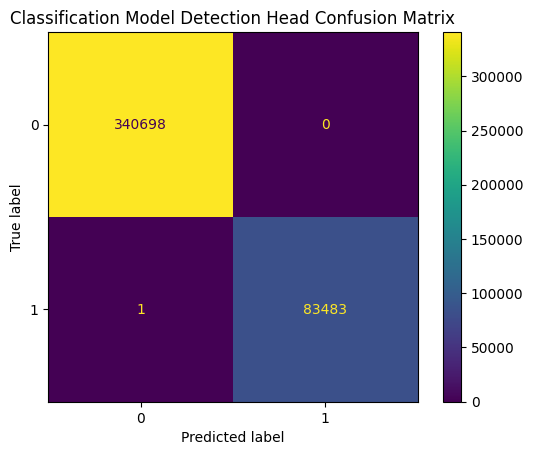

In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, average_precision_score, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the combined detection and classification model architecture
class CombinedNN(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(CombinedNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3_detection = nn.Linear(64, 1)  # Detection head
        self.fc3_classification = nn.Linear(64, num_classes)  # Classification head
        self.dropout = nn.Dropout(0.5)
        self.batch_norm1 = nn.BatchNorm1d(128)
        self.batch_norm2 = nn.BatchNorm1d(64)

    def forward(self, x):
        x = F.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        detection_output = torch.sigmoid(self.fc3_detection(x))
        classification_output = self.fc3_classification(x)  # Output layer without activation for classification
        return detection_output, classification_output

# Define the combined loss function
criterion_detection = nn.BCELoss()
criterion_classification = nn.CrossEntropyLoss()

def combined_loss(detection_output, classification_output, detection_labels, classification_labels):
    loss_detection = criterion_detection(detection_output.squeeze(), detection_labels)
    loss_classification = criterion_classification(classification_output, classification_labels)
    return loss_detection + loss_classification

# Training function for combined model
def train_combined_model(loader, model, optimizer):
    model.train()
    running_loss = 0.0
    for inputs, detection_labels, classification_labels in loader:
        optimizer.zero_grad()
        detection_output, classification_output = model(inputs)
        loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for combined model
def evaluate_combined_model(loader, model):
    model.eval()
    running_loss = 0.0
    all_detection_outputs = []
    all_classification_outputs = []
    all_detection_labels = []
    all_classification_labels = []
    with torch.no_grad():
        for inputs, detection_labels, classification_labels in loader:
            detection_output, classification_output = model(inputs)
            loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
            running_loss += loss.item() * inputs.size(0)
            all_detection_outputs.append(detection_output.cpu())
            all_classification_outputs.append(classification_output.cpu())
            all_detection_labels.append(detection_labels.cpu())
            all_classification_labels.append(classification_labels.cpu())
    all_detection_outputs = torch.cat(all_detection_outputs)
    all_classification_outputs = torch.cat(all_classification_outputs)
    all_detection_labels = torch.cat(all_detection_labels)
    all_classification_labels = torch.cat(all_classification_labels)
    return running_loss / len(loader.dataset), all_detection_outputs, all_classification_outputs, all_detection_labels, all_classification_labels

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['Label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Map attack names to numerical labels
attack_names = data['Label'].unique()
attack_name_to_label = {name: idx for idx, name in enumerate(attack_names)}
label_to_attack_name = {idx: name for name, idx in attack_name_to_label.items()}

# Separate features and target for detection
features = data.drop(columns=['Label'])
target = data['Label']

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_tensor = torch.tensor(target.map(attack_name_to_label).values, dtype=torch.float32)

# Split the data into training, validation, and test sets for detection
X_train, X_temp, y_train, y_temp = train_test_split(X_tensor, y_tensor, test_size=0.3, random_state=42, stratify=y_tensor)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Use the detection model to filter out benign data for classification
model = CombinedNN(input_dim=X_tensor.shape[1], num_classes=len(label_columns))

# Prepare the dataset and dataloader
class CombinedDataset(torch.utils.data.Dataset):
    def __init__(self, features, detection_labels, classification_labels):
        self.features = features
        self.detection_labels = detection_labels
        self.classification_labels = classification_labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.detection_labels[idx], self.classification_labels[idx]

# Convert classification labels to long type
y_train_classification = y_train.long()
y_val_classification = y_val.long()
y_test_classification = y_test.long()

# Create DataLoader for combined dataset
train_dataset_combined = CombinedDataset(X_train, y_train, y_train_classification)
val_dataset_combined = CombinedDataset(X_val, y_val, y_val_classification)
test_dataset_combined = CombinedDataset(X_test, y_test, y_test_classification)

train_loader_combined = DataLoader(train_dataset_combined, batch_size=batch_size, shuffle=True)
val_loader_combined = DataLoader(val_dataset_combined, batch_size=batch_size, shuffle=False)
test_loader_combined = DataLoader(test_dataset_combined, batch_size=batch_size, shuffle=False)

# Initialize the combined model with the correct input dimension
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 3
for epoch in range(1, num_epochs + 1):
    train_loss = train_combined_model(train_loader_combined, model, optimizer)
    val_loss, val_detection_outputs, val_classification_outputs, val_detection_labels, val_classification_labels = evaluate_combined_model(val_loader_combined, model)
    test_loss, test_detection_outputs, test_classification_outputs, test_detection_labels, test_classification_labels = evaluate_combined_model(test_loader_combined, model)

    # Calculate detection metrics
    val_detection_accuracy = accuracy_score(val_detection_labels, val_detection_outputs.round())
    test_detection_accuracy = accuracy_score(test_detection_labels, test_detection_outputs.round())

    # Calculate classification metrics
    val_classification_accuracy = accuracy_score(val_classification_labels, val_classification_outputs.argmax(dim=1))
    test_classification_accuracy = accuracy_score(test_classification_labels, test_classification_outputs.argmax(dim=1))

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}')
    print(f'Val Detection Accuracy: {val_detection_accuracy:.4f}, Test Detection Accuracy: {test_detection_accuracy:.4f}')
    print(f'Val Classification Accuracy: {val_classification_accuracy:.4f}, Test Classification Accuracy: {test_classification_accuracy:.4f}')

# Save the trained model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_combined_model.pth')

# Verify unique labels in the test data
test_true_labels = test_classification_labels.numpy()
test_pred_labels = test_classification_outputs.argmax(dim=1).numpy()
unique_true_labels = np.unique(test_true_labels)
unique_pred_labels = np.unique(test_pred_labels)
print(f'Unique labels in test true labels: {unique_true_labels}')
print(f'Unique labels in test predicted labels: {unique_pred_labels}')

# Confusion Matrix for classification model
conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
display_labels = [label_to_attack_name[idx] for idx in range(len(label_columns)) if idx in label_to_attack_name]
ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
plt.title('Classification Model Detection Head Confusion Matrix')
plt.show()


Epoch: 01, Train Loss: 0.0126, Val Loss: 0.0007, Test Loss: 0.0004
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Epoch: 02, Train Loss: 0.0024, Val Loss: 0.0002, Test Loss: 0.0001
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Epoch: 03, Train Loss: 0.0018, Val Loss: 0.0002, Test Loss: 0.0001
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Epoch: 04, Train Loss: 0.0012, Val Loss: 0.0001, Test Loss: 0.0001
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Epoch: 05, Train Loss: 0.0013, Val Loss: 0.0001, Test Loss: 0.0000
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classif

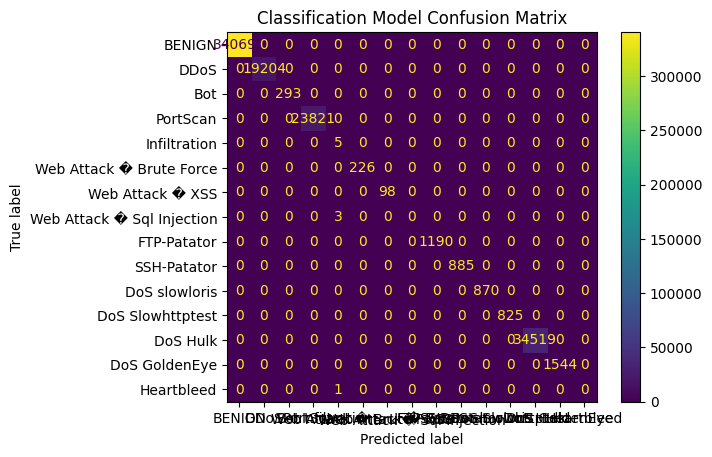

In [ ]:
# Multi-task FNN with detection head classification model
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, average_precision_score, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the combined detection and classification model architecture
class CombinedNN(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(CombinedNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3_detection = nn.Linear(64, 1)  # Detection head
        self.fc3_classification = nn.Linear(64, num_classes)  # Classification head
        self.dropout = nn.Dropout(0.5)
        self.batch_norm1 = nn.BatchNorm1d(128)
        self.batch_norm2 = nn.BatchNorm1d(64)

    def forward(self, x):
        x = F.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        detection_output = torch.sigmoid(self.fc3_detection(x))
        classification_output = self.fc3_classification(x)  # Output layer without activation for classification
        return detection_output, classification_output

# Define the combined loss function
criterion_detection = nn.BCELoss()
criterion_classification = nn.CrossEntropyLoss()

def combined_loss(detection_output, classification_output, detection_labels, classification_labels):
    loss_detection = criterion_detection(detection_output.squeeze(), detection_labels)
    loss_classification = criterion_classification(classification_output, classification_labels)
    return loss_detection + loss_classification

# Training function for combined model
def train_combined_model(loader, model, optimizer):
    model.train()
    running_loss = 0.0
    for inputs, detection_labels, classification_labels in loader:
        optimizer.zero_grad()
        detection_output, classification_output = model(inputs)
        loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for combined model
def evaluate_combined_model(loader, model):
    model.eval()
    running_loss = 0.0
    all_detection_outputs = []
    all_classification_outputs = []
    all_detection_labels = []
    all_classification_labels = []
    with torch.no_grad():
        for inputs, detection_labels, classification_labels in loader:
            detection_output, classification_output = model(inputs)
            loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
            running_loss += loss.item() * inputs.size(0)
            all_detection_outputs.append(detection_output.cpu())
            all_classification_outputs.append(classification_output.cpu())
            all_detection_labels.append(detection_labels.cpu())
            all_classification_labels.append(classification_labels.cpu())
    all_detection_outputs = torch.cat(all_detection_outputs)
    all_classification_outputs = torch.cat(all_classification_outputs)
    all_detection_labels = torch.cat(all_detection_labels)
    all_classification_labels = torch.cat(all_classification_labels)
    return running_loss / len(loader.dataset), all_detection_outputs, all_classification_outputs, all_detection_labels, all_classification_labels

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['detection_label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Map attack names to numerical labels
attack_names = data['Label'].unique()
attack_name_to_label = {name: idx for idx, name in enumerate(attack_names)}
label_to_attack_name = {idx: name for name, idx in attack_name_to_label.items()}

# Separate features and target for detection and classification
features = data.drop(columns=['Label', 'detection_label'])
detection_target = data['detection_label']
classification_target = data['Label'].map(attack_name_to_label)

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_detection_tensor = torch.tensor(detection_target.values, dtype=torch.float32)
y_classification_tensor = torch.tensor(classification_target.values, dtype=torch.long)

# Split the data into training, validation, and test sets for detection and classification
X_train, X_temp, y_train_detection, y_temp_detection, y_train_classification, y_temp_classification = train_test_split(
    X_tensor, y_detection_tensor, y_classification_tensor, test_size=0.3, random_state=42, stratify=y_classification_tensor
)
X_val, X_test, y_val_detection, y_test_detection, y_val_classification, y_test_classification = train_test_split(
    X_temp, y_temp_detection, y_temp_classification, test_size=0.5, random_state=42, stratify=y_temp_classification
)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train_detection)
val_dataset = TensorDataset(X_val, y_val_detection)
test_dataset = TensorDataset(X_test, y_test_detection)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Use the detection model to filter out benign data for classification
model = CombinedNN(input_dim=X_tensor.shape[1], num_classes=len(label_columns))

# Prepare the dataset and dataloader
class CombinedDataset(torch.utils.data.Dataset):
    def __init__(self, features, detection_labels, classification_labels):
        self.features = features
        self.detection_labels = detection_labels
        self.classification_labels = classification_labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.detection_labels[idx], self.classification_labels[idx]

# Create DataLoader for combined dataset
train_dataset_combined = CombinedDataset(X_train, y_train_detection, y_train_classification)
val_dataset_combined = CombinedDataset(X_val, y_val_detection, y_val_classification)
test_dataset_combined = CombinedDataset(X_test, y_test_detection, y_test_classification)

train_loader_combined = DataLoader(train_dataset_combined, batch_size=batch_size, shuffle=True)
val_loader_combined = DataLoader(val_dataset_combined, batch_size=batch_size, shuffle=False)
test_loader_combined = DataLoader(test_dataset_combined, batch_size=batch_size, shuffle=False)

# Initialize the combined model with the correct input dimension
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 25
for epoch in range(1, num_epochs + 1):
    train_loss = train_combined_model(train_loader_combined, model, optimizer)
    val_loss, val_detection_outputs, val_classification_outputs, val_detection_labels, val_classification_labels = evaluate_combined_model(val_loader_combined, model)
    test_loss, test_detection_outputs, test_classification_outputs, test_detection_labels, test_classification_labels = evaluate_combined_model(test_loader_combined, model)

    # Calculate detection metrics
    val_detection_accuracy = accuracy_score(val_detection_labels, val_detection_outputs.round())
    test_detection_accuracy = accuracy_score(test_detection_labels, test_detection_outputs.round())

    # Calculate classification metrics
    val_classification_accuracy = accuracy_score(val_classification_labels, val_classification_outputs.argmax(dim=1))
    test_classification_accuracy = accuracy_score(test_classification_labels, test_classification_outputs.argmax(dim=1))

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}')
    print(f'Val Detection Accuracy: {val_detection_accuracy:.4f}, Test Detection Accuracy: {test_detection_accuracy:.4f}')
    print(f'Val Classification Accuracy: {val_classification_accuracy:.4f}, Test Classification Accuracy: {test_classification_accuracy:.4f}')

# Save the trained model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_combined_model.pth')

# Verify unique labels in the test data
test_true_labels = test_classification_labels.numpy()
test_pred_labels = test_classification_outputs.argmax(dim=1).numpy()
unique_true_labels = np.unique(test_true_labels)
unique_pred_labels = np.unique(test_pred_labels)
print(f'Unique labels in test true labels: {unique_true_labels}')
print(f'Unique labels in test predicted labels: {unique_pred_labels}')

# Confusion Matrix for classification model
conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
display_labels = [label_to_attack_name[idx] for idx in range(len(label_columns)) if idx in label_to_attack_name]
ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
plt.title('Classification Model Confusion Matrix')
plt.show()


Epoch: 01, Train Loss: 0.0129, Val Loss: 0.0007, Test Loss: 0.0008
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Epoch: 02, Train Loss: 0.0026, Val Loss: 0.0006, Test Loss: 0.0005
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Epoch: 03, Train Loss: 0.0024, Val Loss: 0.0017, Test Loss: 0.0017
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Epoch: 04, Train Loss: 0.0023, Val Loss: 0.0003, Test Loss: 0.0002
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Epoch: 05, Train Loss: 0.0022, Val Loss: 0.0004, Test Loss: 0.0003
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Classification Accuracy: 1.0000, Test Classif

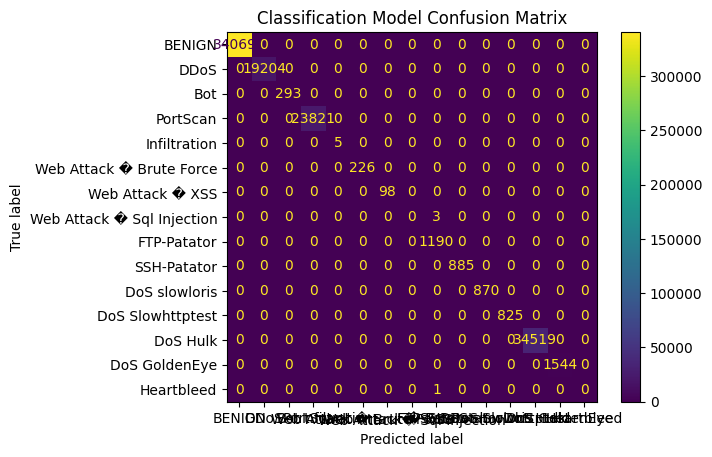

In [ ]:
# Ensure no data leakage, add regularization, verify data split, check for overfitting
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the combined detection and classification model architecture
class CombinedNN(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(CombinedNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3_detection = nn.Linear(64, 1)  # Detection head
        self.fc3_classification = nn.Linear(64, num_classes)  # Classification head
        self.dropout = nn.Dropout(0.5)
        self.batch_norm1 = nn.BatchNorm1d(128)
        self.batch_norm2 = nn.BatchNorm1d(64)

    def forward(self, x):
        x = F.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        detection_output = torch.sigmoid(self.fc3_detection(x))
        classification_output = self.fc3_classification(x)  # Output layer without activation for classification
        return detection_output, classification_output

# Define the combined loss function
criterion_detection = nn.BCELoss()
criterion_classification = nn.CrossEntropyLoss()

def combined_loss(detection_output, classification_output, detection_labels, classification_labels):
    loss_detection = criterion_detection(detection_output.squeeze(), detection_labels)
    loss_classification = criterion_classification(classification_output, classification_labels)
    return loss_detection + loss_classification

# Training function for combined model
def train_combined_model(loader, model, optimizer):
    model.train()
    running_loss = 0.0
    for inputs, detection_labels, classification_labels in loader:
        optimizer.zero_grad()
        detection_output, classification_output = model(inputs)
        loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for combined model
def evaluate_combined_model(loader, model):
    model.eval()
    running_loss = 0.0
    all_detection_outputs = []
    all_classification_outputs = []
    all_detection_labels = []
    all_classification_labels = []
    with torch.no_grad():
        for inputs, detection_labels, classification_labels in loader:
            detection_output, classification_output = model(inputs)
            loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
            running_loss += loss.item() * inputs.size(0)
            all_detection_outputs.append(detection_output.cpu())
            all_classification_outputs.append(classification_output.cpu())
            all_detection_labels.append(detection_labels.cpu())
            all_classification_labels.append(classification_labels.cpu())
    all_detection_outputs = torch.cat(all_detection_outputs)
    all_classification_outputs = torch.cat(all_classification_outputs)
    all_detection_labels = torch.cat(all_detection_labels)
    all_classification_labels = torch.cat(all_classification_labels)
    return running_loss / len(loader.dataset), all_detection_outputs, all_classification_outputs, all_detection_labels, all_classification_labels

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['detection_label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Map attack names to numerical labels
attack_names = data['Label'].unique()
attack_name_to_label = {name: idx for idx, name in enumerate(attack_names)}
label_to_attack_name = {idx: name for name, idx in attack_name_to_label.items()}

# Separate features and target for detection and classification
features = data.drop(columns=['Label', 'detection_label'])
detection_target = data['detection_label']
classification_target = data['Label'].map(attack_name_to_label)

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_detection_tensor = torch.tensor(detection_target.values, dtype=torch.float32)
y_classification_tensor = torch.tensor(classification_target.values, dtype=torch.long)

# Split the data into training, validation, and test sets for detection and classification
X_train, X_temp, y_train_detection, y_temp_detection, y_train_classification, y_temp_classification = train_test_split(
    X_tensor, y_detection_tensor, y_classification_tensor, test_size=0.3, random_state=42, stratify=y_classification_tensor
)
X_val, X_test, y_val_detection, y_test_detection, y_val_classification, y_test_classification = train_test_split(
    X_temp, y_temp_detection, y_temp_classification, test_size=0.5, random_state=42, stratify=y_temp_classification
)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train_detection)
val_dataset = TensorDataset(X_val, y_val_detection)
test_dataset = TensorDataset(X_test, y_test_detection)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Use the detection model to filter out benign data for classification
model = CombinedNN(input_dim=X_tensor.shape[1], num_classes=len(label_columns))

# Prepare the dataset and dataloader
class CombinedDataset(torch.utils.data.Dataset):
    def __init__(self, features, detection_labels, classification_labels):
        self.features = features
        self.detection_labels = detection_labels
        self.classification_labels = classification_labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.detection_labels[idx], self.classification_labels[idx]

# Create DataLoader for combined dataset
train_dataset_combined = CombinedDataset(X_train, y_train_detection, y_train_classification)
val_dataset_combined = CombinedDataset(X_val, y_val_detection, y_val_classification)
test_dataset_combined = CombinedDataset(X_test, y_test_detection, y_test_classification)

train_loader_combined = DataLoader(train_dataset_combined, batch_size=batch_size, shuffle=True)
val_loader_combined = DataLoader(val_dataset_combined, batch_size=batch_size, shuffle=False)
test_loader_combined = DataLoader(test_dataset_combined, batch_size=batch_size, shuffle=False)

# Initialize the combined model with the correct input dimension
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

# Training loop
num_epochs = 30
for epoch in range(1, num_epochs + 1):
    train_loss = train_combined_model(train_loader_combined, model, optimizer)
    val_loss, val_detection_outputs, val_classification_outputs, val_detection_labels, val_classification_labels = evaluate_combined_model(val_loader_combined, model)
    test_loss, test_detection_outputs, test_classification_outputs, test_detection_labels, test_classification_labels = evaluate_combined_model(test_loader_combined, model)

    # Calculate detection metrics
    val_detection_accuracy = accuracy_score(val_detection_labels, val_detection_outputs.round())
    test_detection_accuracy = accuracy_score(test_detection_labels, test_detection_outputs.round())

    # Calculate classification metrics
    val_classification_accuracy = accuracy_score(val_classification_labels, val_classification_outputs.argmax(dim=1))
    test_classification_accuracy = accuracy_score(test_classification_labels, test_classification_outputs.argmax(dim=1))

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}')
    print(f'Val Detection Accuracy: {val_detection_accuracy:.4f}, Test Detection Accuracy: {test_detection_accuracy:.4f}')
    print(f'Val Classification Accuracy: {val_classification_accuracy:.4f}, Test Classification Accuracy: {test_classification_accuracy:.4f}')

# Save the trained model
torch.save(model.state_dict(), '/content/drive/MyDrive/FNN_combined_model.pth')

# Verify unique labels in the test data
test_true_labels = test_classification_labels.numpy()
test_pred_labels = test_classification_outputs.argmax(dim=1).numpy()
unique_true_labels = np.unique(test_true_labels)
unique_pred_labels = np.unique(test_pred_labels)
print(f'Unique labels in test true labels: {unique_true_labels}')
print(f'Unique labels in test predicted labels: {unique_pred_labels}')

# Confusion Matrix for classification model
conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
display_labels = [label_to_attack_name[idx] for idx in range(len(label_columns)) if idx in label_to_attack_name]
ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
plt.title('Classification Model Confusion Matrix')
plt.show()


Epoch: 01, Train Loss: 0.0138, Val Loss: 0.0006, Test Loss: 0.0003
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Detection Precision: 1.0000, Test Detection Precision: 1.0000
Val Detection Recall: 1.0000, Test Detection Recall: 1.0000
Val Detection F1: 1.0000, Test Detection F1: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Val Classification Precision: 0.9999, Test Classification Precision: 1.0000
Val Classification Recall: 1.0000, Test Classification Recall: 1.0000
Val Classification F1: 1.0000, Test Classification F1: 1.0000
Epoch: 02, Train Loss: 0.0026, Val Loss: 0.0009, Test Loss: 0.0007
Val Detection Accuracy: 1.0000, Test Detection Accuracy: 1.0000
Val Detection Precision: 1.0000, Test Detection Precision: 1.0000
Val Detection Recall: 0.9999, Test Detection Recall: 0.9999
Val Detection F1: 1.0000, Test Detection F1: 1.0000
Val Classification Accuracy: 1.0000, Test Classification Accuracy: 1.0000
Val Classification Precisi

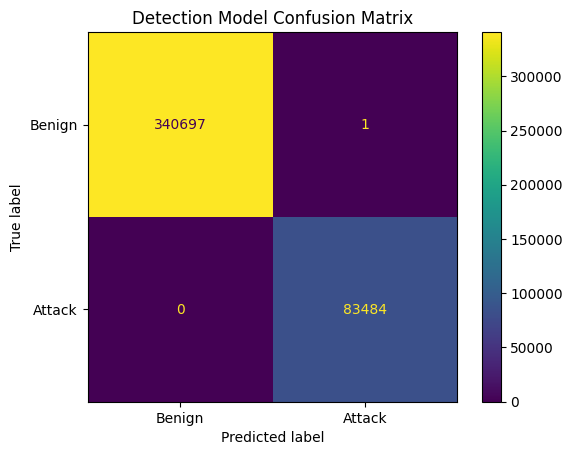

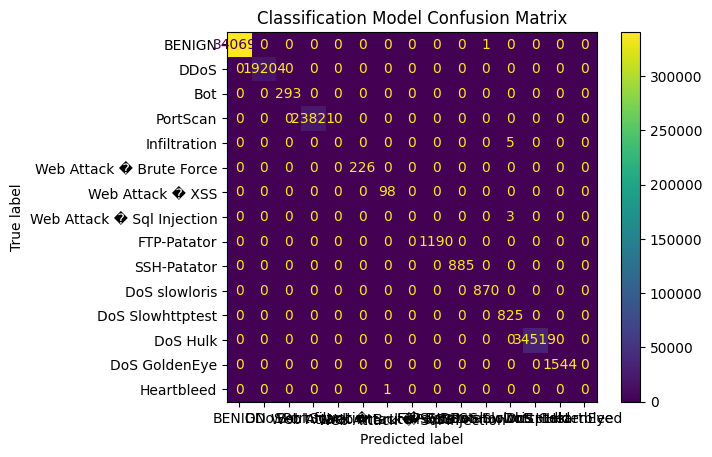

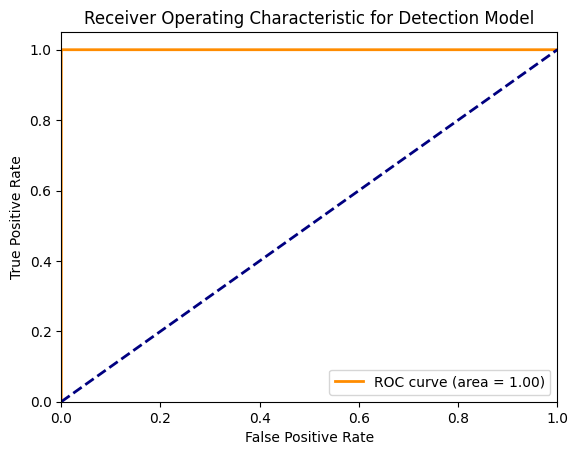

In [ ]:
# Ensure no data leakage, add regularization, verify data split, check for overfitting
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the combined detection and classification model architecture
class CombinedNN(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(CombinedNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3_detection = nn.Linear(64, 1)  # Detection head
        self.fc3_classification = nn.Linear(64, num_classes)  # Classification head
        self.dropout = nn.Dropout(0.5)
        self.batch_norm1 = nn.BatchNorm1d(128)
        self.batch_norm2 = nn.BatchNorm1d(64)

    def forward(self, x):
        x = F.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        detection_output = torch.sigmoid(self.fc3_detection(x))
        classification_output = self.fc3_classification(x)  # Output layer without activation for classification
        return detection_output, classification_output

# Define the combined loss function
criterion_detection = nn.BCELoss()
criterion_classification = nn.CrossEntropyLoss()

def combined_loss(detection_output, classification_output, detection_labels, classification_labels):
    loss_detection = criterion_detection(detection_output.squeeze(), detection_labels)
    loss_classification = criterion_classification(classification_output, classification_labels)
    return loss_detection + loss_classification

# Training function for combined model
def train_combined_model(loader, model, optimizer):
    model.train()
    running_loss = 0.0
    for inputs, detection_labels, classification_labels in loader:
        optimizer.zero_grad()
        detection_output, classification_output = model(inputs)
        loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for combined model
def evaluate_combined_model(loader, model):
    model.eval()
    running_loss = 0.0
    all_detection_outputs = []
    all_classification_outputs = []
    all_detection_labels = []
    all_classification_labels = []
    with torch.no_grad():
        for inputs, detection_labels, classification_labels in loader:
            detection_output, classification_output = model(inputs)
            loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
            running_loss += loss.item() * inputs.size(0)
            all_detection_outputs.append(detection_output.cpu())
            all_classification_outputs.append(classification_output.cpu())
            all_detection_labels.append(detection_labels.cpu())
            all_classification_labels.append(classification_labels.cpu())
    all_detection_outputs = torch.cat(all_detection_outputs)
    all_classification_outputs = torch.cat(all_classification_outputs)
    all_detection_labels = torch.cat(all_detection_labels)
    all_classification_labels = torch.cat(all_classification_labels)
    return running_loss / len(loader.dataset), all_detection_outputs, all_classification_outputs, all_detection_labels, all_classification_labels

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['detection_label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Map attack names to numerical labels
attack_names = data['Label'].unique()
attack_name_to_label = {name: idx for idx, name in enumerate(attack_names)}
label_to_attack_name = {idx: name for name, idx in attack_name_to_label.items()}

# Separate features and target for detection and classification
features = data.drop(columns=['Label', 'detection_label'])
detection_target = data['detection_label']
classification_target = data['Label'].map(attack_name_to_label)

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_detection_tensor = torch.tensor(detection_target.values, dtype=torch.float32)
y_classification_tensor = torch.tensor(classification_target.values, dtype=torch.long)

# Split the data into training, validation, and test sets for detection and classification
X_train, X_temp, y_train_detection, y_temp_detection, y_train_classification, y_temp_classification = train_test_split(
    X_tensor, y_detection_tensor, y_classification_tensor, test_size=0.3, random_state=42, stratify=y_classification_tensor
)
X_val, X_test, y_val_detection, y_test_detection, y_val_classification, y_test_classification = train_test_split(
    X_temp, y_temp_detection, y_temp_classification, test_size=0.5, random_state=42, stratify=y_temp_classification
)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train_detection)
val_dataset = TensorDataset(X_val, y_val_detection)
test_dataset = TensorDataset(X_test, y_test_detection)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Use the detection model to filter out benign data for classification
model = CombinedNN(input_dim=X_tensor.shape[1], num_classes=len(label_columns))

# Prepare the dataset and dataloader
class CombinedDataset(torch.utils.data.Dataset):
    def __init__(self, features, detection_labels, classification_labels):
        self.features = features
        self.detection_labels = detection_labels
        self.classification_labels = classification_labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.detection_labels[idx], self.classification_labels[idx]

# Create DataLoader for combined dataset
train_dataset_combined = CombinedDataset(X_train, y_train_detection, y_train_classification)
val_dataset_combined = CombinedDataset(X_val, y_val_detection, y_val_classification)
test_dataset_combined = CombinedDataset(X_test, y_test_detection, y_test_classification)

train_loader_combined = DataLoader(train_dataset_combined, batch_size=batch_size, shuffle=True)
val_loader_combined = DataLoader(val_dataset_combined, batch_size=batch_size, shuffle=False)
test_loader_combined = DataLoader(test_dataset_combined, batch_size=batch_size, shuffle=False)

# Initialize the combined model with the correct input dimension
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

# Training loop
num_epochs = 30
for epoch in range(1, num_epochs + 1):
    train_loss = train_combined_model(train_loader_combined, model, optimizer)
    val_loss, val_detection_outputs, val_classification_outputs, val_detection_labels, val_classification_labels = evaluate_combined_model(val_loader_combined, model)
    test_loss, test_detection_outputs, test_classification_outputs, test_detection_labels, test_classification_labels = evaluate_combined_model(test_loader_combined, model)

    # Calculate detection metrics
    val_detection_accuracy = accuracy_score(val_detection_labels, val_detection_outputs.round())
    test_detection_accuracy = accuracy_score(test_detection_labels, test_detection_outputs.round())
    val_detection_precision = precision_score(val_detection_labels, val_detection_outputs.round())
    test_detection_precision = precision_score(test_detection_labels, test_detection_outputs.round())
    val_detection_recall = recall_score(val_detection_labels, val_detection_outputs.round())
    test_detection_recall = recall_score(test_detection_labels, test_detection_outputs.round())
    val_detection_f1 = f1_score(val_detection_labels, val_detection_outputs.round())
    test_detection_f1 = f1_score(test_detection_labels, test_detection_outputs.round())

    # Calculate classification metrics
    val_classification_accuracy = accuracy_score(val_classification_labels, val_classification_outputs.argmax(dim=1))
    test_classification_accuracy = accuracy_score(test_classification_labels, test_classification_outputs.argmax(dim=1))
    val_classification_precision = precision_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_precision = precision_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    val_classification_recall = recall_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_recall = recall_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    val_classification_f1 = f1_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_f1 = f1_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}')
    print(f'Val Detection Accuracy: {val_detection_accuracy:.4f}, Test Detection Accuracy: {test_detection_accuracy:.4f}')
    print(f'Val Detection Precision: {val_detection_precision:.4f}, Test Detection Precision: {test_detection_precision:.4f}')
    print(f'Val Detection Recall: {val_detection_recall:.4f}, Test Detection Recall: {test_detection_recall:.4f}')
    print(f'Val Detection F1: {val_detection_f1:.4f}, Test Detection F1: {test_detection_f1:.4f}')
    print(f'Val Classification Accuracy: {val_classification_accuracy:.4f}, Test Classification Accuracy: {test_classification_accuracy:.4f}')
    print(f'Val Classification Precision: {val_classification_precision:.4f}, Test Classification Precision: {test_classification_precision:.4f}')
    print(f'Val Classification Recall: {val_classification_recall:.4f}, Test Classification Recall: {test_classification_recall:.4f}')
    print(f'Val Classification F1: {val_classification_f1:.4f}, Test Classification F1: {test_classification_f1:.4f}')

# Save the trained model
torch.save(model.state_dict(), '/content/drive/MyDrive/FNN_combined_model.pth')

# Verify unique labels in the test data
test_true_labels = test_classification_labels.numpy()
test_pred_labels = test_classification_outputs.argmax(dim=1).numpy()
unique_true_labels = np.unique(test_true_labels)
unique_pred_labels = np.unique(test_pred_labels)
print(f'Unique labels in test true labels: {unique_true_labels}')
print(f'Unique labels in test predicted labels: {unique_pred_labels}')

# Calculate confusion matrix for detection component
detection_conf_matrix = confusion_matrix(test_detection_labels.numpy(), test_detection_outputs.round().numpy())
ConfusionMatrixDisplay(confusion_matrix=detection_conf_matrix, display_labels=['Benign', 'Attack']).plot()
plt.title('Detection Model Confusion Matrix')
plt.show()

# Confusion Matrix for classification model
conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
display_labels = [label_to_attack_name[idx] for idx in range(len(label_columns)) if idx in label_to_attack_name]
ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
plt.title('Classification Model Confusion Matrix')
plt.show()

# ROC Curve for detection model
fpr, tpr, _ = roc_curve(test_detection_labels, test_detection_outputs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Detection Model')
plt.legend(loc="lower right")
plt.show()


In [ ]:
#K-fold cross validation added
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the combined detection and classification model architecture
class CombinedNN(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(CombinedNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3_detection = nn.Linear(64, 1)  # Detection head
        self.fc3_classification = nn.Linear(64, num_classes)  # Classification head
        self.dropout = nn.Dropout(0.5)
        self.batch_norm1 = nn.BatchNorm1d(128)
        self.batch_norm2 = nn.BatchNorm1d(64)

    def forward(self, x):
        x = F.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        detection_output = torch.sigmoid(self.fc3_detection(x))
        classification_output = self.fc3_classification(x)  # Output layer without activation for classification
        return detection_output, classification_output

# Define the combined loss function
criterion_detection = nn.BCELoss()
criterion_classification = nn.CrossEntropyLoss()

def combined_loss(detection_output, classification_output, detection_labels, classification_labels):
    loss_detection = criterion_detection(detection_output.squeeze(), detection_labels)
    loss_classification = criterion_classification(classification_output, classification_labels)
    return loss_detection + loss_classification

# Training function for combined model
def train_combined_model(loader, model, optimizer):
    model.train()
    running_loss = 0.0
    for inputs, detection_labels, classification_labels in loader:
        optimizer.zero_grad()
        detection_output, classification_output = model(inputs)
        loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for combined model
def evaluate_combined_model(loader, model):
    model.eval()
    running_loss = 0.0
    all_detection_outputs = []
    all_classification_outputs = []
    all_detection_labels = []
    all_classification_labels = []
    with torch.no_grad():
        for inputs, detection_labels, classification_labels in loader:
            detection_output, classification_output = model(inputs)
            loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
            running_loss += loss.item() * inputs.size(0)
            all_detection_outputs.append(detection_output.cpu())
            all_classification_outputs.append(classification_output.cpu())
            all_detection_labels.append(detection_labels.cpu())
            all_classification_labels.append(classification_labels.cpu())
    all_detection_outputs = torch.cat(all_detection_outputs)
    all_classification_outputs = torch.cat(all_classification_outputs)
    all_detection_labels = torch.cat(all_detection_labels)
    all_classification_labels = torch.cat(all_classification_labels)
    return running_loss / len(loader.dataset), all_detection_outputs, all_classification_outputs, all_detection_labels, all_classification_labels

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['detection_label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Map attack names to numerical labels
attack_names = data['Label'].unique()
attack_name_to_label = {name: idx for idx, name in enumerate(attack_names)}
label_to_attack_name = {idx: name for name, idx in attack_name_to_label.items()}

# Separate features and target for detection and classification
features = data.drop(columns=['Label', 'detection_label'])
detection_target = data['detection_label']
classification_target = data['Label'].map(attack_name_to_label)

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_detection_tensor = torch.tensor(detection_target.values, dtype=torch.float32)
y_classification_tensor = torch.tensor(classification_target.values, dtype=torch.long)

# Prepare the dataset and dataloader
class CombinedDataset(torch.utils.data.Dataset):
    def __init__(self, features, detection_labels, classification_labels):
        self.features = features
        self.detection_labels = detection_labels
        self.classification_labels = classification_labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.detection_labels[idx], self.classification_labels[idx]

# Initialize k-fold cross-validation
k_folds = 5
kf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=42)

fold_results = {
    'train_loss': [],
    'val_loss': [],
    'test_loss': [],
    'val_detection_accuracy': [],
    'test_detection_accuracy': [],
    'val_classification_accuracy': [],
    'test_classification_accuracy': [],
    'val_detection_precision': [],
    'test_detection_precision': [],
    'val_detection_recall': [],
    'test_detection_recall': [],
    'val_detection_f1': [],
    'test_detection_f1': [],
    'val_classification_precision': [],
    'test_classification_precision': [],
    'val_classification_recall': [],
    'test_classification_recall': [],
    'val_classification_f1': [],
    'test_classification_f1': []
}

# Training and evaluation across k-folds
num_epochs = 10

# Define batch size
batch_size = 64

for fold, (train_idx, test_idx) in enumerate(kf.split(X_tensor, y_classification_tensor)):
    print(f'FOLD {fold + 1}')
    print('--------------------------------')

    # Split data into training and validation sets for the current fold
    X_train, X_val = X_tensor[train_idx], X_tensor[test_idx]
    y_train_detection, y_val_detection = y_detection_tensor[train_idx], y_detection_tensor[test_idx]
    y_train_classification, y_val_classification = y_classification_tensor[train_idx], y_classification_tensor[test_idx]

    # Create DataLoader for combined dataset
    train_dataset_combined = CombinedDataset(X_train, y_train_detection, y_train_classification)
    val_dataset_combined = CombinedDataset(X_val, y_val_detection, y_val_classification)

    train_loader_combined = DataLoader(train_dataset_combined, batch_size=batch_size, shuffle=True)
    val_loader_combined = DataLoader(val_dataset_combined, batch_size=batch_size, shuffle=False)

    # Initialize the combined model with the correct input dimension
    model = CombinedNN(input_dim=X_tensor.shape[1], num_classes=len(label_columns))
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

    for epoch in range(1, num_epochs + 1):
        train_loss = train_combined_model(train_loader_combined, model, optimizer)
        val_loss, val_detection_outputs, val_classification_outputs, val_detection_labels, val_classification_labels = evaluate_combined_model(val_loader_combined, model)

        # Calculate detection metrics
        val_detection_accuracy = accuracy_score(val_detection_labels, val_detection_outputs.round())
        val_detection_precision = precision_score(val_detection_labels, val_detection_outputs.round())
        val_detection_recall = recall_score(val_detection_labels, val_detection_outputs.round())
        val_detection_f1 = f1_score(val_detection_labels, val_detection_outputs.round())

        # Calculate classification metrics
        val_classification_accuracy = accuracy_score(val_classification_labels, val_classification_outputs.argmax(dim=1))
        val_classification_precision = precision_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
        val_classification_recall = recall_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
        val_classification_f1 = f1_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)

        print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
        print(f'Val Detection Accuracy: {val_detection_accuracy:.4f}, Val Detection Precision: {val_detection_precision:.4f}, Val Detection Recall: {val_detection_recall:.4f}, Val Detection F1: {val_detection_f1:.4f}')
        print(f'Val Classification Accuracy: {val_classification_accuracy:.4f}, Val Classification Precision: {val_classification_precision:.4f}, Val Classification Recall: {val_classification_recall:.4f}, Val Classification F1: {val_classification_f1:.4f}')

    # Evaluate on the test set for the current fold
    test_loss, test_detection_outputs, test_classification_outputs, test_detection_labels, test_classification_labels = evaluate_combined_model(val_loader_combined, model)

    # Calculate test metrics
    test_detection_accuracy = accuracy_score(test_detection_labels, test_detection_outputs.round())
    test_detection_precision = precision_score(test_detection_labels, test_detection_outputs.round())
    test_detection_recall = recall_score(test_detection_labels, test_detection_outputs.round())
    test_detection_f1 = f1_score(test_detection_labels, test_detection_outputs.round())

    test_classification_accuracy = accuracy_score(test_classification_labels, test_classification_outputs.argmax(dim=1))
    test_classification_precision = precision_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_recall = recall_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_f1 = f1_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)

    # Save fold results
    fold_results['train_loss'].append(train_loss)
    fold_results['val_loss'].append(val_loss)
    fold_results['test_loss'].append(test_loss)
    fold_results['val_detection_accuracy'].append(val_detection_accuracy)
    fold_results['test_detection_accuracy'].append(test_detection_accuracy)
    fold_results['val_classification_accuracy'].append(val_classification_accuracy)
    fold_results['test_classification_accuracy'].append(test_classification_accuracy)
    fold_results['val_detection_precision'].append(val_detection_precision)
    fold_results['test_detection_precision'].append(test_detection_precision)
    fold_results['val_detection_recall'].append(val_detection_recall)
    fold_results['test_detection_recall'].append(test_detection_recall)
    fold_results['val_detection_f1'].append(val_detection_f1)
    fold_results['test_detection_f1'].append(test_detection_f1)
    fold_results['val_classification_precision'].append(val_classification_precision)
    fold_results['test_classification_precision'].append(test_classification_precision)
    fold_results['val_classification_recall'].append(val_classification_recall)
    fold_results['test_classification_recall'].append(test_classification_recall)
    fold_results['val_classification_f1'].append(val_classification_f1)
    fold_results['test_classification_f1'].append(test_classification_f1)

# Print average metrics across all folds
print('--------------------------------')
print('Average metrics across all folds:')
print(f'Train Loss: {np.mean(fold_results["train_loss"]):.4f} ± {np.std(fold_results["train_loss"]):.4f}')
print(f'Val Loss: {np.mean(fold_results["val_loss"]):.4f} ± {np.std(fold_results["val_loss"]):.4f}')
print(f'Test Loss: {np.mean(fold_results["test_loss"]):.4f} ± {np.std(fold_results["test_loss"]):.4f}')
print(f'Val Detection Accuracy: {np.mean(fold_results["val_detection_accuracy"]):.4f} ± {np.std(fold_results["val_detection_accuracy"]):.4f}')
print(f'Test Detection Accuracy: {np.mean(fold_results["test_detection_accuracy"]):.4f} ± {np.std(fold_results["test_detection_accuracy"]):.4f}')
print(f'Val Classification Accuracy: {np.mean(fold_results["val_classification_accuracy"]):.4f} ± {np.std(fold_results["val_classification_accuracy"]):.4f}')
print(f'Test Classification Accuracy: {np.mean(fold_results["test_classification_accuracy"]):.4f} ± {np.std(fold_results["test_classification_accuracy"]):.4f}')
print(f'Val Detection Precision: {np.mean(fold_results["val_detection_precision"]):.4f} ± {np.std(fold_results["val_detection_precision"]):.4f}')
print(f'Test Detection Precision: {np.mean(fold_results["test_detection_precision"]):.4f} ± {np.std(fold_results["test_detection_precision"]):.4f}')
print(f'Val Detection Recall: {np.mean(fold_results["val_detection_recall"]):.4f} ± {np.std(fold_results["val_detection_recall"]):.4f}')
print(f'Test Detection Recall: {np.mean(fold_results["test_detection_recall"]):.4f} ± {np.std(fold_results["test_detection_recall"]):.4f}')
print(f'Val Detection F1: {np.mean(fold_results["val_detection_f1"]):.4f} ± {np.std(fold_results["val_detection_f1"]):.4f}')
print(f'Test Detection F1: {np.mean(fold_results["test_detection_f1"]):.4f} ± {np.std(fold_results["test_detection_f1"]):.4f}')
print(f'Val Classification Precision: {np.mean(fold_results["val_classification_precision"]):.4f} ± {np.std(fold_results["val_classification_precision"]):.4f}')
print(f'Test Classification Precision: {np.mean(fold_results["test_classification_precision"]):.4f} ± {np.std(fold_results["test_classification_precision"]):.4f}')
print(f'Val Classification Recall: {np.mean(fold_results["val_classification_recall"]):.4f} ± {np.std(fold_results["val_classification_recall"]):.4f}')
print(f'Test Classification Recall: {np.mean(fold_results["test_classification_recall"]):.4f} ± {np.std(fold_results["test_classification_recall"]):.4f}')
print(f'Val Classification F1: {np.mean(fold_results["val_classification_f1"]):.4f} ± {np.std(fold_results["val_classification_f1"]):.4f}')
print(f'Test Classification F1: {np.mean(fold_results["test_classification_f1"]):.4f} ± {np.std(fold_results["test_classification_f1"]):.4f}')


FOLD 1
--------------------------------
Epoch: 01, Train Loss: 0.0118, Val Loss: 0.0012
Val Detection Accuracy: 1.0000, Val Detection Precision: 1.0000, Val Detection Recall: 0.9999, Val Detection F1: 1.0000
Val Classification Accuracy: 1.0000, Val Classification Precision: 0.9999, Val Classification Recall: 1.0000, Val Classification F1: 1.0000
Epoch: 02, Train Loss: 0.0024, Val Loss: 0.0025
Val Detection Accuracy: 1.0000, Val Detection Precision: 0.9999, Val Detection Recall: 1.0000, Val Detection F1: 0.9999
Val Classification Accuracy: 1.0000, Val Classification Precision: 0.9999, Val Classification Recall: 1.0000, Val Classification F1: 0.9999
Epoch: 03, Train Loss: 0.0023, Val Loss: 0.0005
Val Detection Accuracy: 1.0000, Val Detection Precision: 1.0000, Val Detection Recall: 1.0000, Val Detection F1: 1.0000
Val Classification Accuracy: 1.0000, Val Classification Precision: 0.9999, Val Classification Recall: 1.0000, Val Classification F1: 1.0000
Epoch: 04, Train Loss: 0.0022, Val L

FOLD 1
--------------------------------
Epoch: 01, Train Loss: 0.0118, Val Loss: 0.0005
Val Detection Accuracy: 1.0000, Val Detection Precision: 1.0000, Val Detection Recall: 1.0000, Val Detection F1: 1.0000
Val Classification Accuracy: 1.0000, Val Classification Precision: 0.9999, Val Classification Recall: 1.0000, Val Classification F1: 1.0000
Epoch: 02, Train Loss: 0.0024, Val Loss: 0.0002
Val Detection Accuracy: 1.0000, Val Detection Precision: 1.0000, Val Detection Recall: 1.0000, Val Detection F1: 1.0000
Val Classification Accuracy: 1.0000, Val Classification Precision: 1.0000, Val Classification Recall: 1.0000, Val Classification F1: 1.0000
Epoch: 03, Train Loss: 0.0025, Val Loss: 0.0004
Val Detection Accuracy: 1.0000, Val Detection Precision: 1.0000, Val Detection Recall: 1.0000, Val Detection F1: 1.0000
Val Classification Accuracy: 1.0000, Val Classification Precision: 1.0000, Val Classification Recall: 1.0000, Val Classification F1: 1.0000
Epoch: 04, Train Loss: 0.0024, Val L

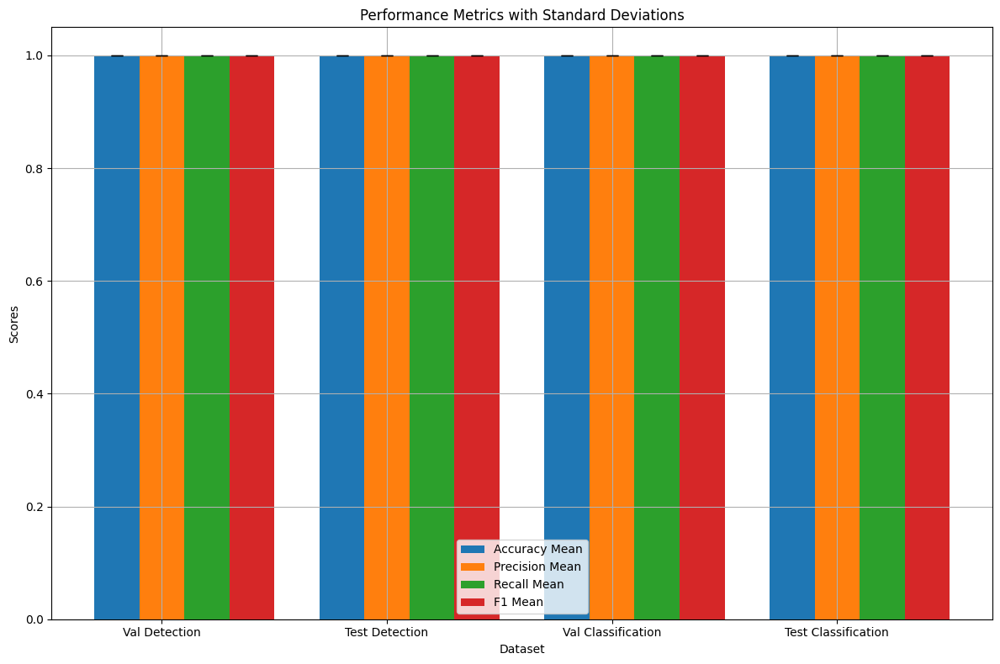

In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the combined detection and classification model architecture
class CombinedNN(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(CombinedNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3_detection = nn.Linear(64, 1)  # Detection head
        self.fc3_classification = nn.Linear(64, num_classes)  # Classification head
        self.dropout = nn.Dropout(0.5)
        self.batch_norm1 = nn.BatchNorm1d(128)
        self.batch_norm2 = nn.BatchNorm1d(64)

    def forward(self, x):
        x = F.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        detection_output = torch.sigmoid(self.fc3_detection(x))
        classification_output = self.fc3_classification(x)  # Output layer without activation for classification
        return detection_output, classification_output

# Define the combined loss function
criterion_detection = nn.BCELoss()
criterion_classification = nn.CrossEntropyLoss()

def combined_loss(detection_output, classification_output, detection_labels, classification_labels):
    loss_detection = criterion_detection(detection_output.squeeze(), detection_labels)
    loss_classification = criterion_classification(classification_output, classification_labels)
    return loss_detection + loss_classification

# Training function for combined model
def train_combined_model(loader, model, optimizer):
    model.train()
    running_loss = 0.0
    for inputs, detection_labels, classification_labels in loader:
        optimizer.zero_grad()
        detection_output, classification_output = model(inputs)
        loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for combined model
def evaluate_combined_model(loader, model):
    model.eval()
    running_loss = 0.0
    all_detection_outputs = []
    all_classification_outputs = []
    all_detection_labels = []
    all_classification_labels = []
    with torch.no_grad():
        for inputs, detection_labels, classification_labels in loader:
            detection_output, classification_output = model(inputs)
            loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
            running_loss += loss.item() * inputs.size(0)
            all_detection_outputs.append(detection_output.cpu())
            all_classification_outputs.append(classification_output.cpu())
            all_detection_labels.append(detection_labels.cpu())
            all_classification_labels.append(classification_labels.cpu())
    all_detection_outputs = torch.cat(all_detection_outputs)
    all_classification_outputs = torch.cat(all_classification_outputs)
    all_detection_labels = torch.cat(all_detection_labels)
    all_classification_labels = torch.cat(all_classification_labels)
    return running_loss / len(loader.dataset), all_detection_outputs, all_classification_outputs, all_detection_labels, all_classification_labels

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['detection_label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Map attack names to numerical labels
attack_names = data['Label'].unique()
attack_name_to_label = {name: idx for idx, name in enumerate(attack_names)}
label_to_attack_name = {idx: name for name, idx in attack_name_to_label.items()}

# Separate features and target for detection and classification
features = data.drop(columns=['Label', 'detection_label'])
detection_target = data['detection_label']
classification_target = data['Label'].map(attack_name_to_label)

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_detection_tensor = torch.tensor(detection_target.values, dtype=torch.float32)
y_classification_tensor = torch.tensor(classification_target.values, dtype=torch.long)

# Prepare the dataset and dataloader
class CombinedDataset(torch.utils.data.Dataset):
    def __init__(self, features, detection_labels, classification_labels):
        self.features = features
        self.detection_labels = detection_labels
        self.classification_labels = classification_labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.detection_labels[idx], self.classification_labels[idx]

# Initialize k-fold cross-validation
k_folds = 5
kf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=42)

fold_results = {
    'train_loss': [],
    'val_loss': [],
    'test_loss': [],
    'val_detection_accuracy': [],
    'test_detection_accuracy': [],
    'val_classification_accuracy': [],
    'test_classification_accuracy': [],
    'val_detection_precision': [],
    'test_detection_precision': [],
    'val_detection_recall': [],
    'test_detection_recall': [],
    'val_detection_f1': [],
    'test_detection_f1': [],
    'val_classification_precision': [],
    'test_classification_precision': [],
    'val_classification_recall': [],
    'test_classification_recall': [],
    'val_classification_f1': [],
    'test_classification_f1': []
}

# Define batch size
batch_size = 64

# Training and evaluation across k-folds
num_epochs = 10

for fold, (train_idx, test_idx) in enumerate(kf.split(X_tensor, y_classification_tensor)):
    print(f'FOLD {fold + 1}')
    print('--------------------------------')

    # Split data into training and validation sets for the current fold
    X_train, X_val = X_tensor[train_idx], X_tensor[test_idx]
    y_train_detection, y_val_detection = y_detection_tensor[train_idx], y_detection_tensor[test_idx]
    y_train_classification, y_val_classification = y_classification_tensor[train_idx], y_classification_tensor[test_idx]

    # Create DataLoader for combined dataset
    train_dataset_combined = CombinedDataset(X_train, y_train_detection, y_train_classification)
    val_dataset_combined = CombinedDataset(X_val, y_val_detection, y_val_classification)

    train_loader_combined = DataLoader(train_dataset_combined, batch_size=batch_size, shuffle=True)
    val_loader_combined = DataLoader(val_dataset_combined, batch_size=batch_size, shuffle=False)

    # Ensure test set creation for each fold
    X_test, y_test_detection, y_test_classification = X_val, y_val_detection, y_val_classification
    test_dataset_combined = CombinedDataset(X_test, y_test_detection, y_test_classification)
    test_loader_combined = DataLoader(test_dataset_combined, batch_size=batch_size, shuffle=False)

    # Initialize the combined model with the correct input dimension
    model = CombinedNN(input_dim=X_tensor.shape[1], num_classes=len(label_columns))
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

    # Training loop
    for epoch in range(1, num_epochs + 1):
        train_loss = train_combined_model(train_loader_combined, model, optimizer)
        val_loss, val_detection_outputs, val_classification_outputs, val_detection_labels, val_classification_labels = evaluate_combined_model(val_loader_combined, model)

        # Calculate detection metrics
        val_detection_accuracy = accuracy_score(val_detection_labels, val_detection_outputs.round())
        val_detection_precision = precision_score(val_detection_labels, val_detection_outputs.round())
        val_detection_recall = recall_score(val_detection_labels, val_detection_outputs.round())
        val_detection_f1 = f1_score(val_detection_labels, val_detection_outputs.round())

        # Calculate classification metrics
        val_classification_accuracy = accuracy_score(val_classification_labels, val_classification_outputs.argmax(dim=1))
        val_classification_precision = precision_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
        val_classification_recall = recall_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
        val_classification_f1 = f1_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)

        print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
        print(f'Val Detection Accuracy: {val_detection_accuracy:.4f}, Val Detection Precision: {val_detection_precision:.4f}, Val Detection Recall: {val_detection_recall:.4f}, Val Detection F1: {val_detection_f1:.4f}')
        print(f'Val Classification Accuracy: {val_classification_accuracy:.4f}, Val Classification Precision: {val_classification_precision:.4f}, Val Classification Recall: {val_classification_recall:.4f}, Val Classification F1: {val_classification_f1:.4f}')

    # Evaluate on the test set for the current fold
    test_loss, test_detection_outputs, test_classification_outputs, test_detection_labels, test_classification_labels = evaluate_combined_model(test_loader_combined, model)

    # Calculate test metrics
    test_detection_accuracy = accuracy_score(test_detection_labels, test_detection_outputs.round())
    test_detection_precision = precision_score(test_detection_labels, test_detection_outputs.round())
    test_detection_recall = recall_score(test_detection_labels, test_detection_outputs.round())
    test_detection_f1 = f1_score(test_detection_labels, test_detection_outputs.round())

    test_classification_accuracy = accuracy_score(test_classification_labels, test_classification_outputs.argmax(dim=1))
    test_classification_precision = precision_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_recall = recall_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_f1 = f1_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)

    # Save fold results
    fold_results['train_loss'].append(train_loss)
    fold_results['val_loss'].append(val_loss)
    fold_results['test_loss'].append(test_loss)
    fold_results['val_detection_accuracy'].append(val_detection_accuracy)
    fold_results['test_detection_accuracy'].append(test_detection_accuracy)
    fold_results['val_classification_accuracy'].append(val_classification_accuracy)
    fold_results['test_classification_accuracy'].append(test_classification_accuracy)
    fold_results['val_detection_precision'].append(val_detection_precision)
    fold_results['test_detection_precision'].append(test_detection_precision)
    fold_results['val_detection_recall'].append(val_detection_recall)
    fold_results['test_detection_recall'].append(test_detection_recall)
    fold_results['val_detection_f1'].append(val_detection_f1)
    fold_results['test_detection_f1'].append(test_detection_f1)
    fold_results['val_classification_precision'].append(val_classification_precision)
    fold_results['test_classification_precision'].append(test_classification_precision)
    fold_results['val_classification_recall'].append(val_classification_recall)
    fold_results['test_classification_recall'].append(test_classification_recall)
    fold_results['val_classification_f1'].append(val_classification_f1)
    fold_results['test_classification_f1'].append(test_classification_f1)

# Print average metrics across all folds
print('--------------------------------')
print('Average metrics across all folds:')
print(f'Train Loss: {np.mean(fold_results["train_loss"]):.4f} ± {np.std(fold_results["train_loss"]):.4f}')
print(f'Val Loss: {np.mean(fold_results["val_loss"]):.4f} ± {np.std(fold_results["val_loss"]):.4f}')
print(f'Test Loss: {np.mean(fold_results["test_loss"]):.4f} ± {np.std(fold_results["test_loss"]):.4f}')
print(f'Val Detection Accuracy: {np.mean(fold_results["val_detection_accuracy"]):.4f} ± {np.std(fold_results["val_detection_accuracy"]):.4f}')
print(f'Test Detection Accuracy: {np.mean(fold_results["test_detection_accuracy"]):.4f} ± {np.std(fold_results["test_detection_accuracy"]):.4f}')
print(f'Val Classification Accuracy: {np.mean(fold_results["val_classification_accuracy"]):.4f} ± {np.std(fold_results["val_classification_accuracy"]):.4f}')
print(f'Test Classification Accuracy: {np.mean(fold_results["test_classification_accuracy"]):.4f} ± {np.std(fold_results["test_classification_accuracy"]):.4f}')
print(f'Val Detection Precision: {np.mean(fold_results["val_detection_precision"]):.4f} ± {np.std(fold_results["val_detection_precision"]):.4f}')
print(f'Test Detection Precision: {np.mean(fold_results["test_detection_precision"]):.4f} ± {np.std(fold_results["test_detection_precision"]):.4f}')
print(f'Val Detection Recall: {np.mean(fold_results["val_detection_recall"]):.4f} ± {np.std(fold_results["val_detection_recall"]):.4f}')
print(f'Test Detection Recall: {np.mean(fold_results["test_detection_recall"]):.4f} ± {np.std(fold_results["test_detection_recall"]):.4f}')
print(f'Val Detection F1: {np.mean(fold_results["val_detection_f1"]):.4f} ± {np.std(fold_results["val_detection_f1"]):.4f}')
print(f'Test Detection F1: {np.mean(fold_results["test_detection_f1"]):.4f} ± {np.std(fold_results["test_detection_f1"]):.4f}')
print(f'Val Classification Precision: {np.mean(fold_results["val_classification_precision"]):.4f} ± {np.std(fold_results["val_classification_precision"]):.4f}')
print(f'Test Classification Precision: {np.mean(fold_results["test_classification_precision"]):.4f} ± {np.std(fold_results["test_classification_precision"]):.4f}')
print(f'Val Classification Recall: {np.mean(fold_results["val_classification_recall"]):.4f} ± {np.std(fold_results["val_classification_recall"]):.4f}')
print(f'Test Classification Recall: {np.mean(fold_results["test_classification_recall"]):.4f} ± {np.std(fold_results["test_classification_recall"]):.4f}')
print(f'Val Classification F1: {np.mean(fold_results["val_classification_f1"]):.4f} ± {np.std(fold_results["val_classification_f1"]):.4f}')
print(f'Test Classification F1: {np.mean(fold_results["test_classification_f1"]):.4f} ± {np.std(fold_results["test_classification_f1"]):.4f}')

import matplotlib.pyplot as plt

# Calculate means and standard deviations
metrics = ['accuracy', 'precision', 'recall', 'f1']
datasets = ['val_detection', 'test_detection', 'val_classification', 'test_classification']
mean_std = {metric: {dataset: (np.mean(fold_results[f'{dataset}_{metric}']), np.std(fold_results[f'{dataset}_{metric}'])) for dataset in datasets} for metric in metrics}

# Prepare data for plotting
labels = ['Val Detection', 'Test Detection', 'Val Classification', 'Test Classification']
x = np.arange(len(labels))
width = 0.2

fig, ax = plt.subplots(figsize=(12, 8))

# Plot bars for each metric
for i, metric in enumerate(metrics):
    means = [mean_std[metric][dataset][0] for dataset in datasets]
    stds = [mean_std[metric][dataset][1] for dataset in datasets]
    ax.bar(x + i*width, means, width, label=f'{metric.capitalize()} Mean', yerr=stds, capsize=5)

# Add some text for labels, title, and custom x-axis tick labels, etc.
ax.set_xlabel('Dataset')
ax.set_ylabel('Scores')
ax.set_title('Performance Metrics with Standard Deviations')
ax.set_xticks(x + width)
ax.set_xticklabels(labels)
ax.legend()

# Add grid for better readability
ax.grid(True)

# Show plot
plt.tight_layout()
plt.show()


# Updated Multi-Class Classification Model to confirm results, moving transformations into K-Fold loop

FOLD 1
--------------------------------
Epoch: 01, Train Loss: 0.0125, Val Loss: 0.0005
Val Detection Accuracy: 1.0000, Val Detection Precision: 1.0000, Val Detection Recall: 1.0000, Val Detection F1: 1.0000
Val Classification Accuracy: 1.0000, Val Classification Precision: 0.9999, Val Classification Recall: 1.0000, Val Classification F1: 1.0000
Epoch: 02, Train Loss: 0.0030, Val Loss: 0.0006
Val Detection Accuracy: 1.0000, Val Detection Precision: 1.0000, Val Detection Recall: 1.0000, Val Detection F1: 1.0000
Val Classification Accuracy: 1.0000, Val Classification Precision: 0.9999, Val Classification Recall: 1.0000, Val Classification F1: 1.0000
Epoch: 03, Train Loss: 0.0024, Val Loss: 0.0005
Val Detection Accuracy: 1.0000, Val Detection Precision: 1.0000, Val Detection Recall: 1.0000, Val Detection F1: 1.0000
Val Classification Accuracy: 1.0000, Val Classification Precision: 0.9999, Val Classification Recall: 1.0000, Val Classification F1: 1.0000
Epoch: 04, Train Loss: 0.0024, Val L

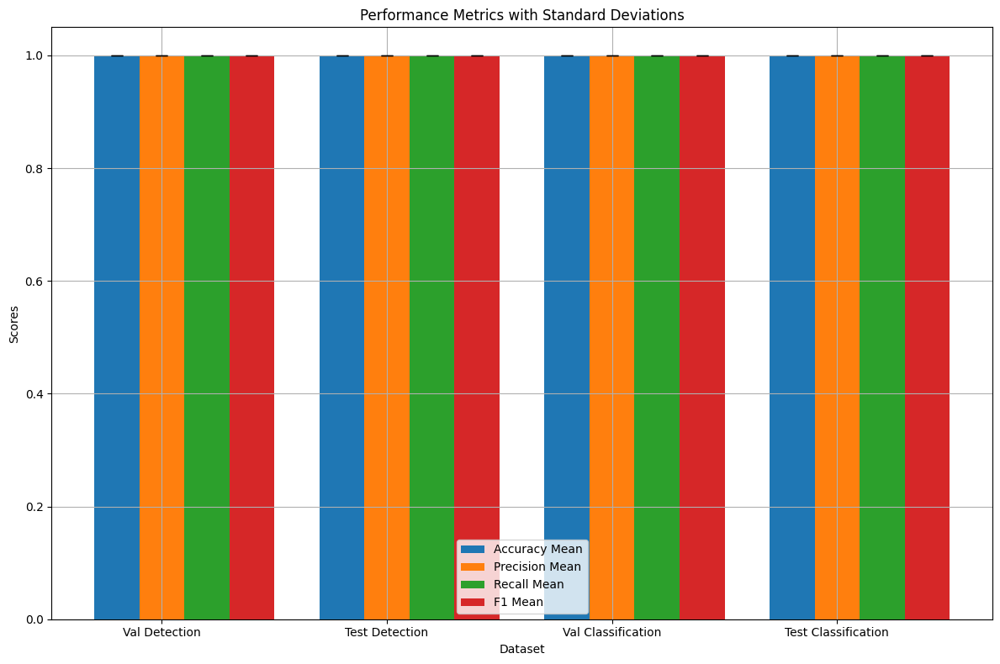

In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the combined detection and classification model architecture
class CombinedNN(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(CombinedNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3_detection = nn.Linear(64, 1)  # Detection head
        self.fc3_classification = nn.Linear(64, num_classes)  # Classification head
        self.dropout = nn.Dropout(0.5)
        self.batch_norm1 = nn.BatchNorm1d(128)
        self.batch_norm2 = nn.BatchNorm1d(64)

    def forward(self, x):
        x = F.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        detection_output = torch.sigmoid(self.fc3_detection(x))
        classification_output = self.fc3_classification(x)  # Output layer without activation for classification
        return detection_output, classification_output

# Define the combined loss function
criterion_detection = nn.BCELoss()
criterion_classification = nn.CrossEntropyLoss()

def combined_loss(detection_output, classification_output, detection_labels, classification_labels):
    loss_detection = criterion_detection(detection_output.squeeze(), detection_labels)
    loss_classification = criterion_classification(classification_output, classification_labels)
    return loss_detection + loss_classification

# Training function for combined model
def train_combined_model(loader, model, optimizer):
    model.train()
    running_loss = 0.0
    for inputs, detection_labels, classification_labels in loader:
        optimizer.zero_grad()
        detection_output, classification_output = model(inputs)
        loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for combined model
def evaluate_combined_model(loader, model):
    model.eval()
    running_loss = 0.0
    all_detection_outputs = []
    all_classification_outputs = []
    all_detection_labels = []
    all_classification_labels = []
    with torch.no_grad():
        for inputs, detection_labels, classification_labels in loader:
            detection_output, classification_output = model(inputs)
            loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
            running_loss += loss.item() * inputs.size(0)
            all_detection_outputs.append(detection_output.cpu())
            all_classification_outputs.append(classification_output.cpu())
            all_detection_labels.append(detection_labels.cpu())
            all_classification_labels.append(classification_labels.cpu())
    all_detection_outputs = torch.cat(all_detection_outputs)
    all_classification_outputs = torch.cat(all_classification_outputs)
    all_detection_labels = torch.cat(all_detection_labels)
    all_classification_labels = torch.cat(all_classification_labels)
    return running_loss / len(loader.dataset), all_detection_outputs, all_classification_outputs, all_detection_labels, all_classification_labels

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()


# Prepare the dataset and dataloader
class CombinedDataset(torch.utils.data.Dataset):
    def __init__(self, features, detection_labels, classification_labels):
        self.features = features
        self.detection_labels = detection_labels
        self.classification_labels = classification_labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.detection_labels[idx], self.classification_labels[idx]

# Initialize k-fold cross-validation
k_folds = 5
kf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=42)

fold_results = {
    'train_loss': [],
    'val_loss': [],
    'test_loss': [],
    'val_detection_accuracy': [],
    'test_detection_accuracy': [],
    'val_classification_accuracy': [],
    'test_classification_accuracy': [],
    'val_detection_precision': [],
    'test_detection_precision': [],
    'val_detection_recall': [],
    'test_detection_recall': [],
    'val_detection_f1': [],
    'test_detection_f1': [],
    'val_classification_precision': [],
    'test_classification_precision': [],
    'val_classification_recall': [],
    'test_classification_recall': [],
    'val_classification_f1': [],
    'test_classification_f1': []
}

# Define batch size
batch_size = 64

# Training and evaluation across k-folds
num_epochs = 10

for fold, (train_idx, test_idx) in enumerate(kf.split(data, data['Label'])):
    print(f'FOLD {fold + 1}')
    print('--------------------------------')

    # Subset raw data into training and validation sets
    train_df = data.iloc[train_idx].copy()
    val_df = data.iloc[test_idx].copy()

    # Drop non-numeric columns
    drop_cols = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
    train_df.drop(columns=[col for col in drop_cols if col in train_df.columns], inplace=True, errors='ignore')
    val_df.drop(columns=[col for col in drop_cols if col in val_df.columns], inplace=True, errors='ignore')

    # One-hot encoding (fit on train only)
    train_df = pd.get_dummies(train_df)
    val_df = pd.get_dummies(val_df)

    # Align columns (ensure both sets have same feature dimensions)
    train_df, val_df = train_df.align(val_df, join='left', axis=1, fill_value=0)

    # Replace NaN and infinities
    train_df = train_df.replace([np.inf, -np.inf], np.nan).dropna()
    val_df = val_df.replace([np.inf, -np.inf], np.nan).dropna()

    # Rebuild targets after aligning
    label_columns = [col for col in train_df.columns if col.startswith('Label_')]
    train_df['Label'] = train_df[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
    val_df['Label'] = val_df[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])

    train_df['detection_label'] = train_df['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)
    val_df['detection_label'] = val_df['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

    # Build mapping from training set only
    attack_names = train_df['Label'].unique()
    attack_name_to_label = {name: idx for idx, name in enumerate(attack_names)}
    train_df['classification_label'] = train_df['Label'].map(attack_name_to_label)
    val_df['classification_label'] = val_df['Label'].map(lambda x: attack_name_to_label.get(x, -1))

    # Drop rows with unknown labels (if any)
    val_df = val_df[val_df['classification_label'] != -1]

    # Drop target columns from features
    features_to_drop = ['Label', 'detection_label', 'classification_label']
    X_train = train_df.drop(columns=features_to_drop)
    X_val = val_df.drop(columns=features_to_drop)

    # Feature scaling
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)

    # Convert to tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    y_train_detection_tensor = torch.tensor(train_df['detection_label'].values, dtype=torch.float32)
    y_train_classification_tensor = torch.tensor(train_df['classification_label'].values, dtype=torch.long)

    X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
    y_val_detection_tensor = torch.tensor(val_df['detection_label'].values, dtype=torch.float32)
    y_val_classification_tensor = torch.tensor(val_df['classification_label'].values, dtype=torch.long)

    # Create DataLoader for combined dataset
    train_dataset_combined = CombinedDataset(X_train_tensor, y_train_detection_tensor, y_train_classification_tensor)
    val_dataset_combined = CombinedDataset(X_val_tensor, y_val_detection_tensor, y_val_classification_tensor)
    train_loader_combined = DataLoader(train_dataset_combined, batch_size=batch_size, shuffle=True)
    val_loader_combined = DataLoader(val_dataset_combined, batch_size=batch_size, shuffle=False)

    # Ensure test set creation for each fold
    X_test, y_test_detection, y_test_classification = X_val_tensor, y_val_detection_tensor, y_val_classification_tensor
    test_dataset_combined = CombinedDataset(X_test, y_test_detection, y_test_classification)
    test_loader_combined = DataLoader(test_dataset_combined, batch_size=batch_size, shuffle=False)

    # Initialize the combined model with the correct input dimension
    model = CombinedNN(input_dim=X_train_tensor.shape[1], num_classes=len(label_columns))
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

    # Training loop
    for epoch in range(1, num_epochs + 1):
        train_loss = train_combined_model(train_loader_combined, model, optimizer)
        val_loss, val_detection_outputs, val_classification_outputs, val_detection_labels, val_classification_labels = evaluate_combined_model(val_loader_combined, model)

        # Calculate detection metrics
        val_detection_accuracy = accuracy_score(val_detection_labels, val_detection_outputs.round())
        val_detection_precision = precision_score(val_detection_labels, val_detection_outputs.round())
        val_detection_recall = recall_score(val_detection_labels, val_detection_outputs.round())
        val_detection_f1 = f1_score(val_detection_labels, val_detection_outputs.round())

        # Calculate classification metrics
        val_classification_accuracy = accuracy_score(val_classification_labels, val_classification_outputs.argmax(dim=1))
        val_classification_precision = precision_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
        val_classification_recall = recall_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
        val_classification_f1 = f1_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)

        print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
        print(f'Val Detection Accuracy: {val_detection_accuracy:.4f}, Val Detection Precision: {val_detection_precision:.4f}, Val Detection Recall: {val_detection_recall:.4f}, Val Detection F1: {val_detection_f1:.4f}')
        print(f'Val Classification Accuracy: {val_classification_accuracy:.4f}, Val Classification Precision: {val_classification_precision:.4f}, Val Classification Recall: {val_classification_recall:.4f}, Val Classification F1: {val_classification_f1:.4f}')

    # Evaluate on the test set for the current fold
    test_loss, test_detection_outputs, test_classification_outputs, test_detection_labels, test_classification_labels = evaluate_combined_model(test_loader_combined, model)

    # Calculate test metrics
    test_detection_accuracy = accuracy_score(test_detection_labels, test_detection_outputs.round())
    test_detection_precision = precision_score(test_detection_labels, test_detection_outputs.round())
    test_detection_recall = recall_score(test_detection_labels, test_detection_outputs.round())
    test_detection_f1 = f1_score(test_detection_labels, test_detection_outputs.round())

    test_classification_accuracy = accuracy_score(test_classification_labels, test_classification_outputs.argmax(dim=1))
    test_classification_precision = precision_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_recall = recall_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_f1 = f1_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)

    # Save fold results
    fold_results['train_loss'].append(train_loss)
    fold_results['val_loss'].append(val_loss)
    fold_results['test_loss'].append(test_loss)
    fold_results['val_detection_accuracy'].append(val_detection_accuracy)
    fold_results['test_detection_accuracy'].append(test_detection_accuracy)
    fold_results['val_classification_accuracy'].append(val_classification_accuracy)
    fold_results['test_classification_accuracy'].append(test_classification_accuracy)
    fold_results['val_detection_precision'].append(val_detection_precision)
    fold_results['test_detection_precision'].append(test_detection_precision)
    fold_results['val_detection_recall'].append(val_detection_recall)
    fold_results['test_detection_recall'].append(test_detection_recall)
    fold_results['val_detection_f1'].append(val_detection_f1)
    fold_results['test_detection_f1'].append(test_detection_f1)
    fold_results['val_classification_precision'].append(val_classification_precision)
    fold_results['test_classification_precision'].append(test_classification_precision)
    fold_results['val_classification_recall'].append(val_classification_recall)
    fold_results['test_classification_recall'].append(test_classification_recall)
    fold_results['val_classification_f1'].append(val_classification_f1)
    fold_results['test_classification_f1'].append(test_classification_f1)

# Print average metrics across all folds
print('--------------------------------')
print('Average metrics across all folds:')
print(f'Train Loss: {np.mean(fold_results["train_loss"]):.4f} ± {np.std(fold_results["train_loss"]):.4f}')
print(f'Val Loss: {np.mean(fold_results["val_loss"]):.4f} ± {np.std(fold_results["val_loss"]):.4f}')
print(f'Test Loss: {np.mean(fold_results["test_loss"]):.4f} ± {np.std(fold_results["test_loss"]):.4f}')
print(f'Val Detection Accuracy: {np.mean(fold_results["val_detection_accuracy"]):.4f} ± {np.std(fold_results["val_detection_accuracy"]):.4f}')
print(f'Test Detection Accuracy: {np.mean(fold_results["test_detection_accuracy"]):.4f} ± {np.std(fold_results["test_detection_accuracy"]):.4f}')
print(f'Val Classification Accuracy: {np.mean(fold_results["val_classification_accuracy"]):.4f} ± {np.std(fold_results["val_classification_accuracy"]):.4f}')
print(f'Test Classification Accuracy: {np.mean(fold_results["test_classification_accuracy"]):.4f} ± {np.std(fold_results["test_classification_accuracy"]):.4f}')
print(f'Val Detection Precision: {np.mean(fold_results["val_detection_precision"]):.4f} ± {np.std(fold_results["val_detection_precision"]):.4f}')
print(f'Test Detection Precision: {np.mean(fold_results["test_detection_precision"]):.4f} ± {np.std(fold_results["test_detection_precision"]):.4f}')
print(f'Val Detection Recall: {np.mean(fold_results["val_detection_recall"]):.4f} ± {np.std(fold_results["val_detection_recall"]):.4f}')
print(f'Test Detection Recall: {np.mean(fold_results["test_detection_recall"]):.4f} ± {np.std(fold_results["test_detection_recall"]):.4f}')
print(f'Val Detection F1: {np.mean(fold_results["val_detection_f1"]):.4f} ± {np.std(fold_results["val_detection_f1"]):.4f}')
print(f'Test Detection F1: {np.mean(fold_results["test_detection_f1"]):.4f} ± {np.std(fold_results["test_detection_f1"]):.4f}')
print(f'Val Classification Precision: {np.mean(fold_results["val_classification_precision"]):.4f} ± {np.std(fold_results["val_classification_precision"]):.4f}')
print(f'Test Classification Precision: {np.mean(fold_results["test_classification_precision"]):.4f} ± {np.std(fold_results["test_classification_precision"]):.4f}')
print(f'Val Classification Recall: {np.mean(fold_results["val_classification_recall"]):.4f} ± {np.std(fold_results["val_classification_recall"]):.4f}')
print(f'Test Classification Recall: {np.mean(fold_results["test_classification_recall"]):.4f} ± {np.std(fold_results["test_classification_recall"]):.4f}')
print(f'Val Classification F1: {np.mean(fold_results["val_classification_f1"]):.4f} ± {np.std(fold_results["val_classification_f1"]):.4f}')
print(f'Test Classification F1: {np.mean(fold_results["test_classification_f1"]):.4f} ± {np.std(fold_results["test_classification_f1"]):.4f}')

import matplotlib.pyplot as plt

# Calculate means and standard deviations
metrics = ['accuracy', 'precision', 'recall', 'f1']
datasets = ['val_detection', 'test_detection', 'val_classification', 'test_classification']
mean_std = {metric: {dataset: (np.mean(fold_results[f'{dataset}_{metric}']), np.std(fold_results[f'{dataset}_{metric}'])) for dataset in datasets} for metric in metrics}

# Prepare data for plotting
labels = ['Val Detection', 'Test Detection', 'Val Classification', 'Test Classification']
x = np.arange(len(labels))
width = 0.2

fig, ax = plt.subplots(figsize=(12, 8))

# Plot bars for each metric
for i, metric in enumerate(metrics):
    means = [mean_std[metric][dataset][0] for dataset in datasets]
    stds = [mean_std[metric][dataset][1] for dataset in datasets]
    ax.bar(x + i*width, means, width, label=f'{metric.capitalize()} Mean', yerr=stds, capsize=5)

# Add some text for labels, title, and custom x-axis tick labels, etc.
ax.set_xlabel('Dataset')
ax.set_ylabel('Scores')
ax.set_title('Performance Metrics with Standard Deviations')
ax.set_xticks(x + width)
ax.set_xticklabels(labels)
ax.legend()

# Add grid for better readability
ax.grid(True)

# Show plot
plt.tight_layout()
plt.show()


# Multi-Classification FNN-QNN Model with K-Fold

FOLD 1
--------------------------------
Epoch: 01, Train Loss: 0.0203, Val Loss: 0.0031
Val Detection Accuracy: 0.9997, Val Detection Precision: 0.9993, Val Detection Recall: 0.9994, Val Detection F1: 0.9993
Val Classification Accuracy: 0.9996, Val Classification Precision: 0.9995, Val Classification Recall: 0.9996, Val Classification F1: 0.9994
Epoch: 02, Train Loss: 0.0117, Val Loss: 0.0027
Val Detection Accuracy: 0.9997, Val Detection Precision: 0.9989, Val Detection Recall: 0.9998, Val Detection F1: 0.9994
Val Classification Accuracy: 0.9994, Val Classification Precision: 0.9993, Val Classification Recall: 0.9994, Val Classification F1: 0.9993
Epoch: 03, Train Loss: 0.0112, Val Loss: 0.0015
Val Detection Accuracy: 0.9999, Val Detection Precision: 0.9999, Val Detection Recall: 0.9996, Val Detection F1: 0.9998
Val Classification Accuracy: 0.9999, Val Classification Precision: 0.9999, Val Classification Recall: 0.9999, Val Classification F1: 0.9999
Epoch: 04, Train Loss: 0.0106, Val L

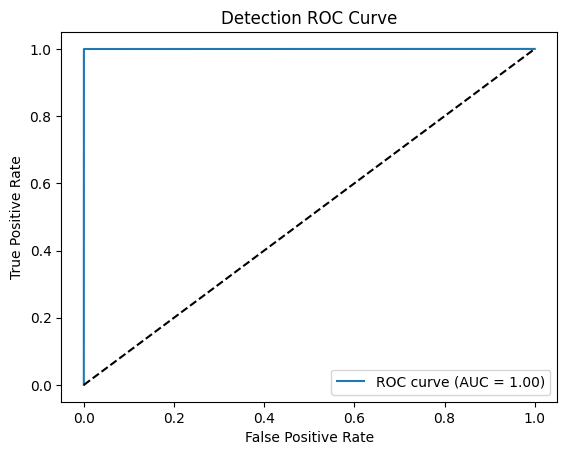

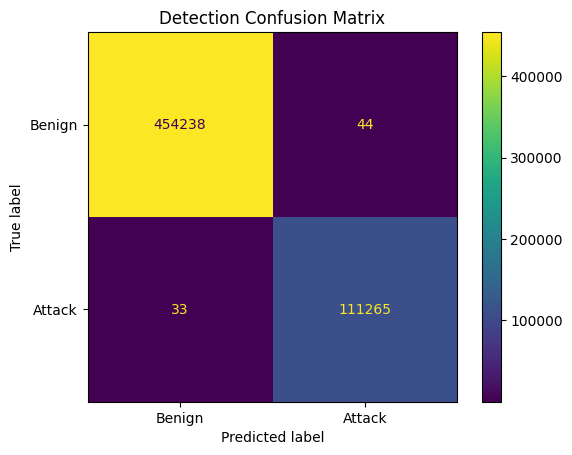

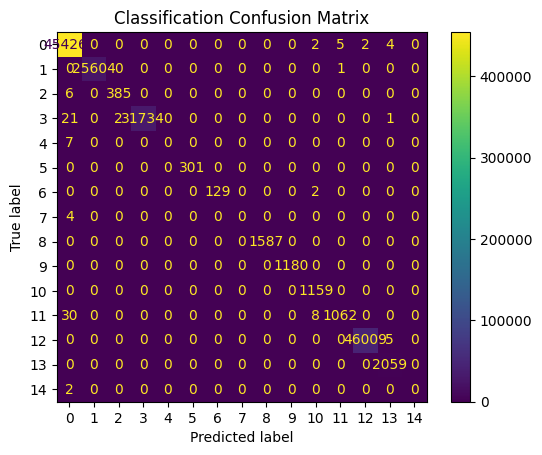

In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
import os

# Quantum-enhanced layer using sine activation
class QuantumLayer(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(QuantumLayer, self).__init__()
        self.linear = nn.Linear(input_dim, output_dim)

    def forward(self, x):
        return torch.sin(self.linear(x))

# Updated CombinedNN to use quantum-inspired layers
class QuantumCombinedNN(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(QuantumCombinedNN, self).__init__()
        self.q1 = QuantumLayer(input_dim, 128)
        self.q2 = QuantumLayer(128, 64)
        self.fc_detection = nn.Linear(64, 1)
        self.fc_classification = nn.Linear(64, num_classes)
        self.dropout = nn.Dropout(0.5)
        self.batch_norm1 = nn.BatchNorm1d(128)
        self.batch_norm2 = nn.BatchNorm1d(64)

    def forward(self, x):
        x = F.relu(self.batch_norm1(self.q1(x)))
        x = self.dropout(x)
        x = F.relu(self.batch_norm2(self.q2(x)))
        x = self.dropout(x)
        detection_output = torch.sigmoid(self.fc_detection(x))
        classification_output = self.fc_classification(x)
        return detection_output, classification_output

# Define the combined loss function
criterion_detection = nn.BCELoss()
criterion_classification = nn.CrossEntropyLoss()

def combined_loss(detection_output, classification_output, detection_labels, classification_labels):
    loss_detection = criterion_detection(detection_output.squeeze(), detection_labels)
    loss_classification = criterion_classification(classification_output, classification_labels)
    return loss_detection + loss_classification

# Training function for combined model
def train_combined_model(loader, model, optimizer):
    model.train()
    running_loss = 0.0
    for inputs, detection_labels, classification_labels in loader:
        optimizer.zero_grad()
        detection_output, classification_output = model(inputs)
        loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for combined model
def evaluate_combined_model(loader, model):
    model.eval()
    running_loss = 0.0
    all_detection_outputs = []
    all_classification_outputs = []
    all_detection_labels = []
    all_classification_labels = []
    with torch.no_grad():
        for inputs, detection_labels, classification_labels in loader:
            detection_output, classification_output = model(inputs)
            loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
            running_loss += loss.item() * inputs.size(0)
            all_detection_outputs.append(detection_output.cpu())
            all_classification_outputs.append(classification_output.cpu())
            all_detection_labels.append(detection_labels.cpu())
            all_classification_labels.append(classification_labels.cpu())
    all_detection_outputs = torch.cat(all_detection_outputs)
    all_classification_outputs = torch.cat(all_classification_outputs)
    all_detection_labels = torch.cat(all_detection_labels)
    all_classification_labels = torch.cat(all_classification_labels)
    return running_loss / len(loader.dataset), all_detection_outputs, all_classification_outputs, all_detection_labels, all_classification_labels

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()


# Prepare the dataset and dataloader
class CombinedDataset(torch.utils.data.Dataset):
    def __init__(self, features, detection_labels, classification_labels):
        self.features = features
        self.detection_labels = detection_labels
        self.classification_labels = classification_labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.detection_labels[idx], self.classification_labels[idx]

# Initialize k-fold cross-validation
k_folds = 5
kf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=42)

fold_results = {
    'train_loss': [],
    'val_loss': [],
    'test_loss': [],
    'val_detection_accuracy': [],
    'test_detection_accuracy': [],
    'val_classification_accuracy': [],
    'test_classification_accuracy': [],
    'val_detection_precision': [],
    'test_detection_precision': [],
    'val_detection_recall': [],
    'test_detection_recall': [],
    'val_detection_f1': [],
    'test_detection_f1': [],
    'val_classification_precision': [],
    'test_classification_precision': [],
    'val_classification_recall': [],
    'test_classification_recall': [],
    'val_classification_f1': [],
    'test_classification_f1': []
}

# Define batch size
batch_size = 64

# Training and evaluation across k-folds
num_epochs = 10

for fold, (train_idx, test_idx) in enumerate(kf.split(data, data['Label'])):
    print(f'FOLD {fold + 1}')
    print('--------------------------------')

    # Subset raw data into training and validation sets
    train_df = data.iloc[train_idx].copy()
    val_df = data.iloc[test_idx].copy()

    # Drop non-numeric columns
    drop_cols = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
    train_df.drop(columns=[col for col in drop_cols if col in train_df.columns], inplace=True, errors='ignore')
    val_df.drop(columns=[col for col in drop_cols if col in val_df.columns], inplace=True, errors='ignore')

    # One-hot encoding (fit on train only)
    train_df = pd.get_dummies(train_df)
    val_df = pd.get_dummies(val_df)

    # Align columns (ensure both sets have same feature dimensions)
    train_df, val_df = train_df.align(val_df, join='left', axis=1, fill_value=0)

    # Replace NaN and infinities
    train_df = train_df.replace([np.inf, -np.inf], np.nan).dropna()
    val_df = val_df.replace([np.inf, -np.inf], np.nan).dropna()

    # Rebuild targets after aligning
    label_columns = [col for col in train_df.columns if col.startswith('Label_')]
    train_df['Label'] = train_df[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
    val_df['Label'] = val_df[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])

    train_df['detection_label'] = train_df['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)
    val_df['detection_label'] = val_df['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

    # Build mapping from training set only
    attack_names = train_df['Label'].unique()
    attack_name_to_label = {name: idx for idx, name in enumerate(attack_names)}
    train_df['classification_label'] = train_df['Label'].map(attack_name_to_label)
    val_df['classification_label'] = val_df['Label'].map(lambda x: attack_name_to_label.get(x, -1))

    # Drop rows with unknown labels (if any)
    val_df = val_df[val_df['classification_label'] != -1]

    # Drop target columns from features
    features_to_drop = ['Label', 'detection_label', 'classification_label']
    X_train = train_df.drop(columns=features_to_drop)
    X_val = val_df.drop(columns=features_to_drop)

    # Feature scaling
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)

    # Convert to tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    y_train_detection_tensor = torch.tensor(train_df['detection_label'].values, dtype=torch.float32)
    y_train_classification_tensor = torch.tensor(train_df['classification_label'].values, dtype=torch.long)

    X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
    y_val_detection_tensor = torch.tensor(val_df['detection_label'].values, dtype=torch.float32)
    y_val_classification_tensor = torch.tensor(val_df['classification_label'].values, dtype=torch.long)

    # Create DataLoader for combined dataset
    train_dataset_combined = CombinedDataset(X_train_tensor, y_train_detection_tensor, y_train_classification_tensor)
    val_dataset_combined = CombinedDataset(X_val_tensor, y_val_detection_tensor, y_val_classification_tensor)
    train_loader_combined = DataLoader(train_dataset_combined, batch_size=batch_size, shuffle=True)
    val_loader_combined = DataLoader(val_dataset_combined, batch_size=batch_size, shuffle=False)

    # Ensure test set creation for each fold
    X_test, y_test_detection, y_test_classification = X_val_tensor, y_val_detection_tensor, y_val_classification_tensor
    test_dataset_combined = CombinedDataset(X_test, y_test_detection, y_test_classification)
    test_loader_combined = DataLoader(test_dataset_combined, batch_size=batch_size, shuffle=False)

    # Initialize the combined model with the correct input dimension
    model = QuantumCombinedNN(input_dim=X_train_tensor.shape[1], num_classes=len(label_columns))
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

    # Training loop
    for epoch in range(1, num_epochs + 1):
        train_loss = train_combined_model(train_loader_combined, model, optimizer)
        val_loss, val_detection_outputs, val_classification_outputs, val_detection_labels, val_classification_labels = evaluate_combined_model(val_loader_combined, model)

        # Calculate detection metrics
        val_detection_accuracy = accuracy_score(val_detection_labels, val_detection_outputs.round())
        val_detection_precision = precision_score(val_detection_labels, val_detection_outputs.round())
        val_detection_recall = recall_score(val_detection_labels, val_detection_outputs.round())
        val_detection_f1 = f1_score(val_detection_labels, val_detection_outputs.round())

        # Calculate classification metrics
        val_classification_accuracy = accuracy_score(val_classification_labels, val_classification_outputs.argmax(dim=1))
        val_classification_precision = precision_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
        val_classification_recall = recall_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
        val_classification_f1 = f1_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)

        print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
        print(f'Val Detection Accuracy: {val_detection_accuracy:.4f}, Val Detection Precision: {val_detection_precision:.4f}, Val Detection Recall: {val_detection_recall:.4f}, Val Detection F1: {val_detection_f1:.4f}')
        print(f'Val Classification Accuracy: {val_classification_accuracy:.4f}, Val Classification Precision: {val_classification_precision:.4f}, Val Classification Recall: {val_classification_recall:.4f}, Val Classification F1: {val_classification_f1:.4f}')

    # Evaluate on the test set for the current fold
    test_loss, test_detection_outputs, test_classification_outputs, test_detection_labels, test_classification_labels = evaluate_combined_model(test_loader_combined, model)

    # Store final fold's predictions and labels for confusion matrix visualization
    if fold == k_folds - 1:
        final_test_detection_labels = test_detection_labels.clone().detach().cpu()
        final_test_detection_outputs = test_detection_outputs.clone().detach().cpu()
        final_test_classification_labels = test_classification_labels.clone().detach().cpu()
        final_test_classification_outputs = test_classification_outputs.clone().detach().cpu()

    # Calculate test metrics
    test_detection_accuracy = accuracy_score(test_detection_labels, test_detection_outputs.round())
    test_detection_precision = precision_score(test_detection_labels, test_detection_outputs.round())
    test_detection_recall = recall_score(test_detection_labels, test_detection_outputs.round())
    test_detection_f1 = f1_score(test_detection_labels, test_detection_outputs.round())

    test_classification_accuracy = accuracy_score(test_classification_labels, test_classification_outputs.argmax(dim=1))
    test_classification_precision = precision_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_recall = recall_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_f1 = f1_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)

    # Save fold results
    fold_results['train_loss'].append(train_loss)
    fold_results['val_loss'].append(val_loss)
    fold_results['test_loss'].append(test_loss)
    fold_results['val_detection_accuracy'].append(val_detection_accuracy)
    fold_results['test_detection_accuracy'].append(test_detection_accuracy)
    fold_results['val_classification_accuracy'].append(val_classification_accuracy)
    fold_results['test_classification_accuracy'].append(test_classification_accuracy)
    fold_results['val_detection_precision'].append(val_detection_precision)
    fold_results['test_detection_precision'].append(test_detection_precision)
    fold_results['val_detection_recall'].append(val_detection_recall)
    fold_results['test_detection_recall'].append(test_detection_recall)
    fold_results['val_detection_f1'].append(val_detection_f1)
    fold_results['test_detection_f1'].append(test_detection_f1)
    fold_results['val_classification_precision'].append(val_classification_precision)
    fold_results['test_classification_precision'].append(test_classification_precision)
    fold_results['val_classification_recall'].append(val_classification_recall)
    fold_results['test_classification_recall'].append(test_classification_recall)
    fold_results['val_classification_f1'].append(val_classification_f1)
    fold_results['test_classification_f1'].append(test_classification_f1)

# Print average metrics across all folds
print('--------------------------------')
print('Average metrics across all folds:')
print(f'Train Loss: {np.mean(fold_results["train_loss"]):.4f} ± {np.std(fold_results["train_loss"]):.4f}')
print(f'Val Loss: {np.mean(fold_results["val_loss"]):.4f} ± {np.std(fold_results["val_loss"]):.4f}')
print(f'Test Loss: {np.mean(fold_results["test_loss"]):.4f} ± {np.std(fold_results["test_loss"]):.4f}')
print(f'Val Detection Accuracy: {np.mean(fold_results["val_detection_accuracy"]):.4f} ± {np.std(fold_results["val_detection_accuracy"]):.4f}')
print(f'Test Detection Accuracy: {np.mean(fold_results["test_detection_accuracy"]):.4f} ± {np.std(fold_results["test_detection_accuracy"]):.4f}')
print(f'Val Classification Accuracy: {np.mean(fold_results["val_classification_accuracy"]):.4f} ± {np.std(fold_results["val_classification_accuracy"]):.4f}')
print(f'Test Classification Accuracy: {np.mean(fold_results["test_classification_accuracy"]):.4f} ± {np.std(fold_results["test_classification_accuracy"]):.4f}')
print(f'Val Detection Precision: {np.mean(fold_results["val_detection_precision"]):.4f} ± {np.std(fold_results["val_detection_precision"]):.4f}')
print(f'Test Detection Precision: {np.mean(fold_results["test_detection_precision"]):.4f} ± {np.std(fold_results["test_detection_precision"]):.4f}')
print(f'Val Detection Recall: {np.mean(fold_results["val_detection_recall"]):.4f} ± {np.std(fold_results["val_detection_recall"]):.4f}')
print(f'Test Detection Recall: {np.mean(fold_results["test_detection_recall"]):.4f} ± {np.std(fold_results["test_detection_recall"]):.4f}')
print(f'Val Detection F1: {np.mean(fold_results["val_detection_f1"]):.4f} ± {np.std(fold_results["val_detection_f1"]):.4f}')
print(f'Test Detection F1: {np.mean(fold_results["test_detection_f1"]):.4f} ± {np.std(fold_results["test_detection_f1"]):.4f}')
print(f'Val Classification Precision: {np.mean(fold_results["val_classification_precision"]):.4f} ± {np.std(fold_results["val_classification_precision"]):.4f}')
print(f'Test Classification Precision: {np.mean(fold_results["test_classification_precision"]):.4f} ± {np.std(fold_results["test_classification_precision"]):.4f}')
print(f'Val Classification Recall: {np.mean(fold_results["val_classification_recall"]):.4f} ± {np.std(fold_results["val_classification_recall"]):.4f}')
print(f'Test Classification Recall: {np.mean(fold_results["test_classification_recall"]):.4f} ± {np.std(fold_results["test_classification_recall"]):.4f}')
print(f'Val Classification F1: {np.mean(fold_results["val_classification_f1"]):.4f} ± {np.std(fold_results["val_classification_f1"]):.4f}')
print(f'Test Classification F1: {np.mean(fold_results["test_classification_f1"]):.4f} ± {np.std(fold_results["test_classification_f1"]):.4f}')


fpr, tpr, _ = roc_curve(test_detection_labels, test_detection_outputs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Detection ROC Curve')
plt.legend()
plt.show()

# After the final fold evaluation, add the following visualizations:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_predictions(final_test_detection_labels, final_test_detection_outputs.round(), display_labels=['Benign', 'Attack'])
plt.title('Detection Confusion Matrix')
plt.show()

ConfusionMatrixDisplay.from_predictions(final_test_classification_labels, final_test_classification_outputs.argmax(dim=1))
plt.title('Classification Confusion Matrix')
plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

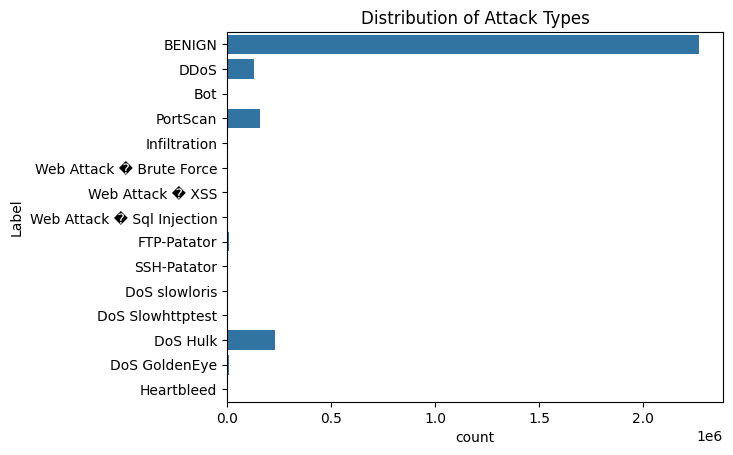

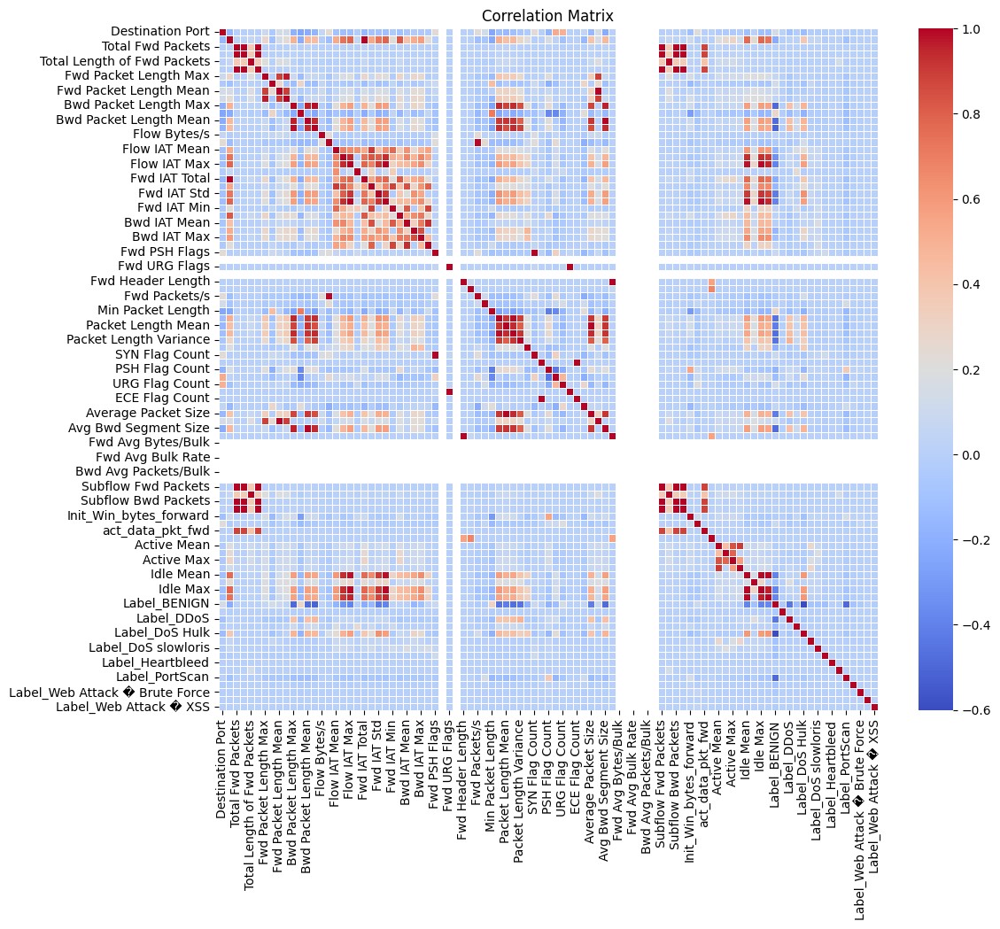

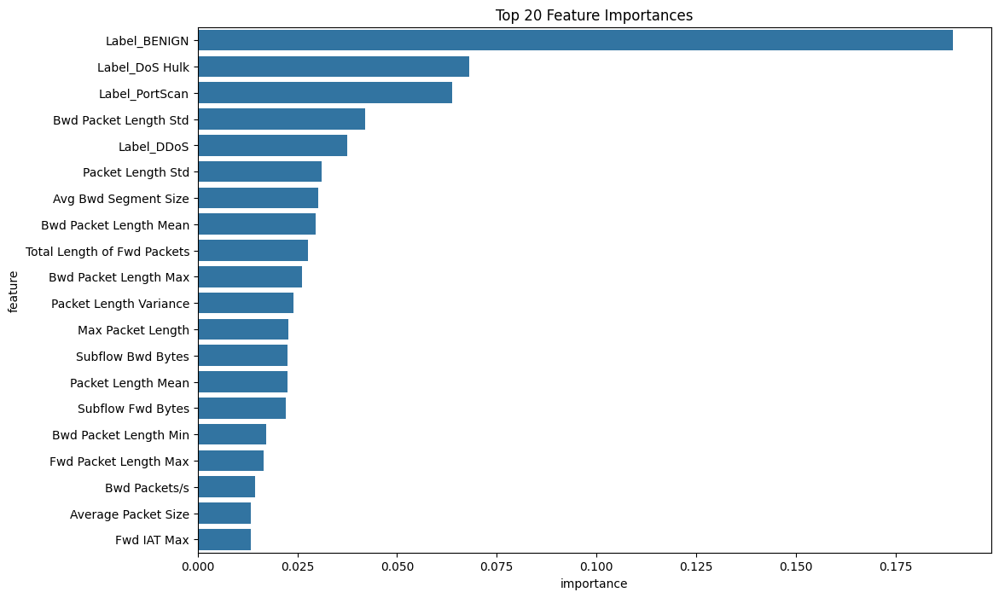

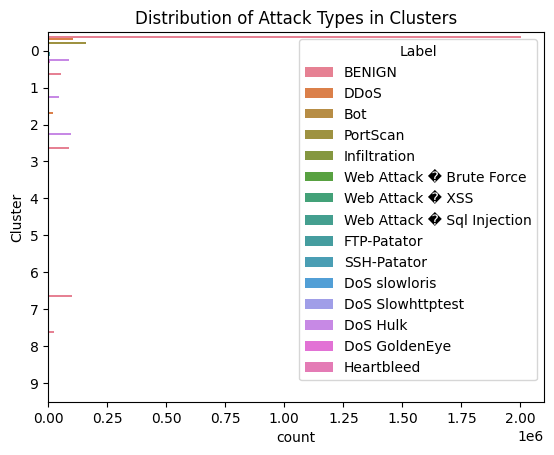

In [ ]:
# Exploring the CICIDS2017 dataset
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['detection_label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Drop any remaining non-numeric columns and target columns before calculating the correlation matrix
numeric_data = data.drop(columns=['Label', 'detection_label'])

# Exploratory Data Analysis
sns.countplot(y='Label', data=data)
plt.title('Distribution of Attack Types')
plt.show()

# Correlation Matrix
corr_matrix = numeric_data.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


from sklearn.ensemble import RandomForestClassifier

# Prepare the data
features = numeric_data
target = data['Label'].map({name: idx for idx, name in enumerate(data['Label'].unique())})

# Train a Random Forest model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(features, target)

# Get feature importances
importances = rf.feature_importances_
feature_names = features.columns
feature_importance_df = pd.DataFrame({'feature': feature_names, 'importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=feature_importance_df.head(20))
plt.title('Top 20 Feature Importances')
plt.show()


from sklearn.cluster import KMeans

# Perform clustering with explicit n_init value
kmeans = KMeans(n_clusters=10, random_state=42, n_init=10)
clusters = kmeans.fit_predict(features)

# Add cluster labels to the data
data['Cluster'] = clusters

# Analyze the clusters
sns.countplot(y='Cluster', data=data, hue='Label')
plt.title('Distribution of Attack Types in Clusters')
plt.show()


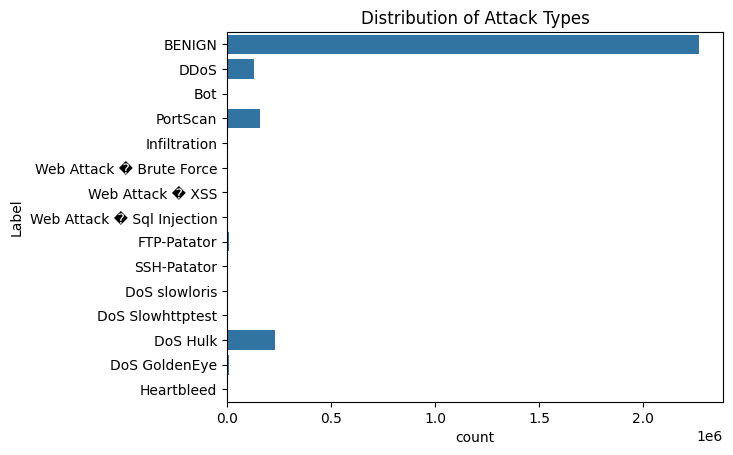

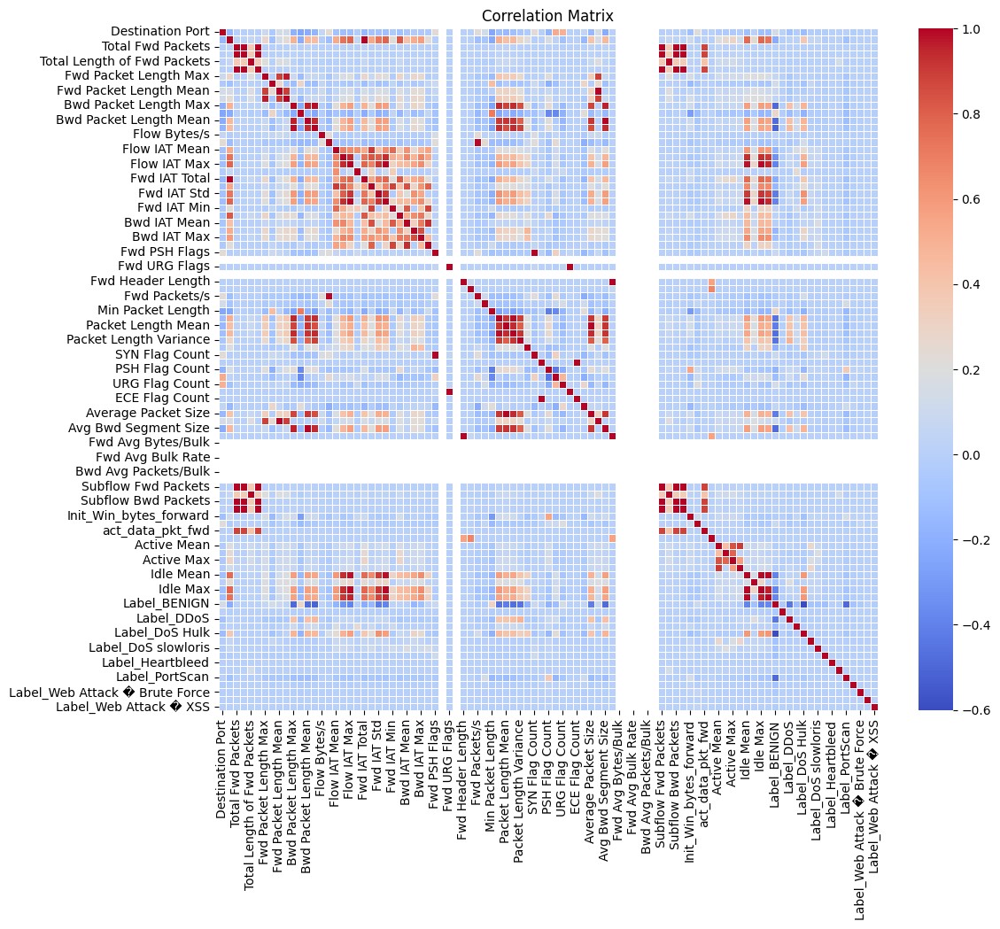

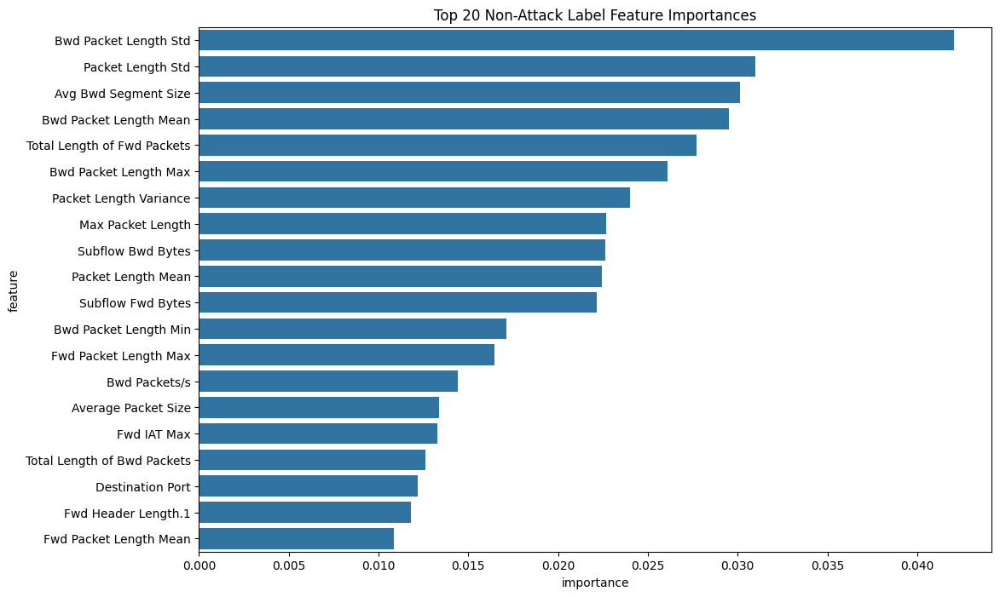

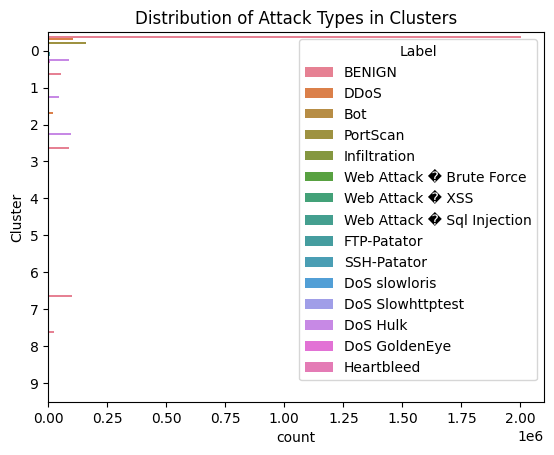

In [ ]:
# Exploring the CICIDS2017 dataset
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['detection_label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Drop any remaining non-numeric columns and target columns before calculating the correlation matrix
numeric_data = data.drop(columns=['Label', 'detection_label'])

# Exploratory Data Analysis
sns.countplot(y='Label', data=data)
plt.title('Distribution of Attack Types')
plt.show()

# Correlation Matrix
corr_matrix = numeric_data.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

from sklearn.ensemble import RandomForestClassifier

# Prepare the data
features = numeric_data
target = data['Label'].map({name: idx for idx, name in enumerate(data['Label'].unique())})

# Train a Random Forest model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(features, target)

# Get feature importances and exclude attack label features
importances = rf.feature_importances_
feature_names = features.columns
feature_importance_df = pd.DataFrame({'feature': feature_names, 'importance': importances})

# Exclude attack label features
non_label_features = [f for f in feature_importance_df['feature'] if not f.startswith('Label_')]
non_label_importance_df = feature_importance_df[feature_importance_df['feature'].isin(non_label_features)]
non_label_importance_df = non_label_importance_df.sort_values(by='importance', ascending=False)

# Plot top 20 non-attack label features
plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=non_label_importance_df.head(20))
plt.title('Top 20 Non-Attack Label Feature Importances')
plt.show()

from sklearn.cluster import KMeans

# Perform clustering with explicit n_init value
kmeans = KMeans(n_clusters=10, random_state=42, n_init=10)
clusters = kmeans.fit_predict(features)

# Add cluster labels to the data
data['Cluster'] = clusters

# Analyze the clusters
sns.countplot(y='Cluster', data=data, hue='Label')
plt.title('Distribution of Attack Types in Clusters')
plt.show()


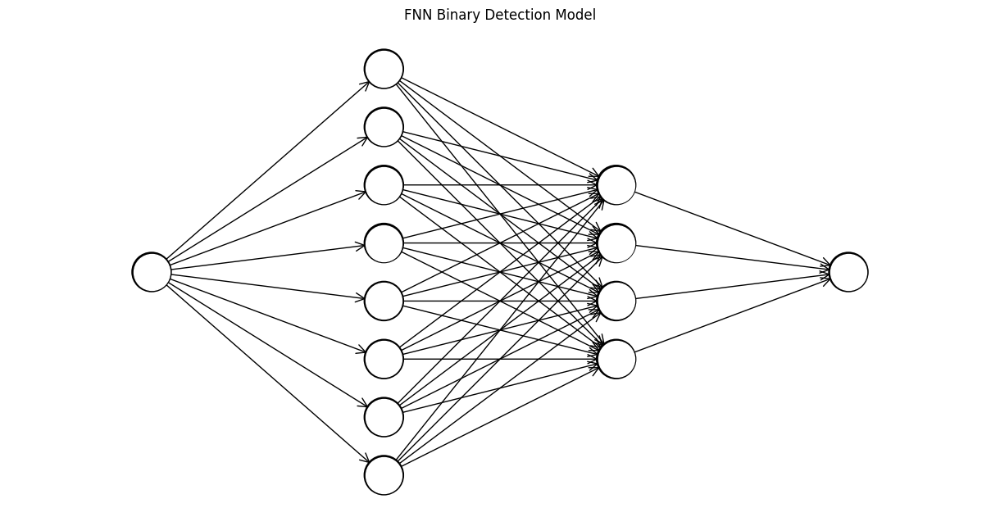

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Create a directed graph
G = nx.DiGraph()

# Add nodes
G.add_node('Start')
for i in range(1, 9):
    G.add_node(f'Layer1_Node{i}')
for i in range(1, 5):
    G.add_node(f'Layer2_Node{i}')
G.add_node('End')

# Add edges from the single node to the 8 nodes
for i in range(1, 9):
    G.add_edge('Start', f'Layer1_Node{i}')

# Add edges from the 8 nodes to the 4 nodes
for i in range(1, 5):
    for j in range(1, 9):
        G.add_edge(f'Layer1_Node{j}', f'Layer2_Node{i}')

# Add edges from the 4 nodes to the single end node
for i in range(1, 5):
    G.add_edge(f'Layer2_Node{i}', 'End')

# Set positions for all nodes
pos = {
    'Start': (0, 0),
    'End': (12, 0),  # Increased x-coordinate for the End node
}
for i in range(1, 9):
    pos[f'Layer1_Node{i}'] = (4, i - 4.5)  # Increased x-coordinate for the first layer nodes
for i in range(1, 5):
    pos[f'Layer2_Node{i}'] = (8, i - 2.5)  # Increased x-coordinate for the second layer nodes

# Draw the graph
plt.figure(figsize=(12, 6))
nx.draw(G, pos, with_labels=False, node_color='white', edge_color='black', node_size=1000, arrows=True, arrowstyle='->', arrowsize=20)

# Draw nodes as white circles with black edges
ax = plt.gca()
for node, (x, y) in pos.items():
    circle = plt.Circle((x, y), 0.3, color='white', ec='black', lw=5)  # lw is line width for the edge
    ax.add_patch(circle)

plt.title("FNN Binary Detection Model")
plt.axis('equal')
plt.show()


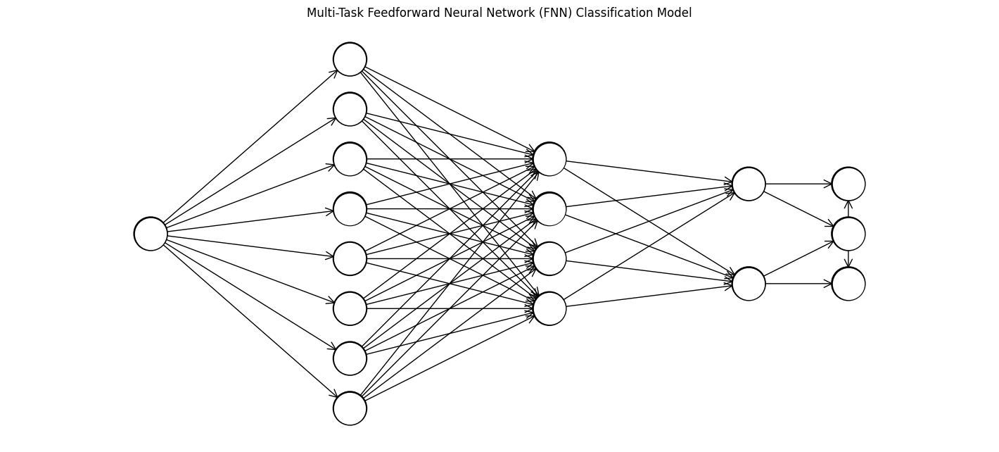

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Create a directed graph
G = nx.DiGraph()

# Add nodes
G.add_node('Start')
for i in range(1, 9):
    G.add_node(f'Layer1_Node{i}')
for i in range(1, 5):
    G.add_node(f'Layer2_Node{i}')
G.add_node('End1')
G.add_node('End2')
G.add_node('Final1')
G.add_node('Final2')
G.add_node('Final3')

# Add edges from the single node to the 8 nodes
for i in range(1, 9):
    G.add_edge('Start', f'Layer1_Node{i}')

# Add edges from the 8 nodes to the 4 nodes
for i in range(1, 5):
    for j in range(1, 9):
        G.add_edge(f'Layer1_Node{j}', f'Layer2_Node{i}')

# Add edges from the 4 nodes to the 2 end nodes
for i in range(1, 5):
    G.add_edge(f'Layer2_Node{i}', 'End1')
    G.add_edge(f'Layer2_Node{i}', 'End2')

# Add edges from the 2 end nodes to the final 3 nodes
G.add_edge('End1', 'Final1')
G.add_edge('End1', 'Final2')
G.add_edge('End2', 'Final2')
G.add_edge('End2', 'Final3')

# Add additional edges to connect the middle node to the ones above and below
G.add_edge('Final2', 'Final1')
G.add_edge('Final2', 'Final3')

# Set positions for all nodes
pos = {
    'Start': (0, 0),
    'End1': (12, -1),  # Position for End1 node
    'End2': (12, 1),   # Position for End2 node
    'Final1': (14, -1),  # Position for Final1 node
    'Final2': (14, 0),   # Position for Final2 node
    'Final3': (14, 1),   # Position for Final3 node
}
for i in range(1, 9):
    pos[f'Layer1_Node{i}'] = (4, i - 4.5)  # Increased x-coordinate for the first layer nodes
for i in range(1, 5):
    pos[f'Layer2_Node{i}'] = (8, i - 2.5)  # Increased x-coordinate for the second layer nodes

# Draw the graph
plt.figure(figsize=(14, 6))
nx.draw(G, pos, with_labels=False, node_color='white', edge_color='black', node_size=1000, arrows=True, arrowstyle='->', arrowsize=20)

# Draw nodes as white circles with black edges
ax = plt.gca()
for node, (x, y) in pos.items():
    circle = plt.Circle((x, y), 0.3, color='white', ec='black', lw=5)  # lw is line width for the edge
    ax.add_patch(circle)

plt.title("Multi-Task Feedforward Neural Network (FNN) Classification Model")
plt.axis('equal')
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import os

# Load the dataset
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Print columns to debug and check if 'Timestamp' exists
print("Columns in the dataset:", data.columns)

# Check if 'Timestamp' exists and convert to datetime, else handle appropriately
if 'Timestamp' in data.columns:
    data['Timestamp'] = pd.to_datetime(data['Timestamp'])
    data = data.sort_values(by='Timestamp')
else:
    raise KeyError("'Timestamp' column not found in the dataset")

# Extract relevant features
features = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Destination Port', 'Protocol', 'Timestamp', 'Label']
data = data[features]

# Group by Flow ID or a combination of IPs and Ports to identify sessions
data['Session'] = data.groupby(['Source IP', 'Source Port', 'Destination IP', 'Destination Port']).ngroup()

# Identify stages of attack based on the labels and temporal sequence
attack_sequences = data[data['Label'] != 'BENIGN']

# Create a directed graph to visualize the chain of attack
G = nx.DiGraph()

# Add nodes and edges based on the sequence of attacks
for session, group in attack_sequences.groupby('Session'):
    sorted_group = group.sort_values(by='Timestamp')
    previous_event = None
    for _, row in sorted_group.iterrows():
        event = f"{row['Timestamp']} - {row['Label']}"
        G.add_node(event)
        if previous_event:
            G.add_edge(previous_event, event)
        previous_event = event

# Draw the graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, k=0.5)
nx.draw(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=3000, font_size=10, font_weight='bold')
plt.title('Chain of Attack Visualization')
plt.show()

Columns in the dataset: Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Cou

KeyError: "'Timestamp' column not found in the dataset"

In [ ]:
import pandas as pd
import networkx as nx
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.data import Data
from torch_geometric.nn import TGN, TransformerConv
from sklearn.model_selection import train_test_split
import numpy as np

# Load the CICIDS2017 dataset
data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()
# Preprocess data
if 'Timestamp' in data.columns:
    data['Timestamp'] = pd.to_datetime(data['Timestamp'])
    data = data.sort_values(by='Timestamp')
else:
    raise KeyError("'Timestamp' column not found in the dataset")

# Extract relevant features
features = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Destination Port', 'Protocol', 'Timestamp', 'Label']
data = data[features]

# Group by Flow ID or a combination of IPs and Ports to identify sessions
data['Session'] = data.groupby(['Source IP', 'Source Port', 'Destination IP', 'Destination Port']).ngroup()

# Convert to graph data suitable for TGN
nodes = list(set(data['Source IP']).union(set(data['Destination IP'])))
node_mapping = {node: i for i, node in enumerate(nodes)}
data['Source ID'] = data['Source IP'].map(node_mapping)
data['Destination ID'] = data['Destination IP'].map(node_mapping)

# Create edge index and features
edge_index = torch.tensor(data[['Source ID', 'Destination ID']].values.T, dtype=torch.long)
edge_attr = torch.tensor(data[['Source Port', 'Destination Port', 'Protocol']].values, dtype=torch.float)

# Node features (e.g., could be IP address embeddings or one-hot encoding of roles)
num_nodes = len(nodes)
node_features = torch.eye(num_nodes)

# Labels
labels = data['Label'].astype('category').cat.codes.values
y = torch.tensor(labels, dtype=torch.long)

# Timestamps
timestamps = torch.tensor(data['Timestamp'].values.astype(np.int64) // 10 ** 9, dtype=torch.long)

# Create PyTorch Geometric data object
graph_data = Data(x=node_features, edge_index=edge_index, edge_attr=edge_attr, y=y, t=timestamps)

class TGNZeroShot(TGN):
    def __init__(self, in_channels, out_channels, num_nodes, embedding_dim):
        super(TGNZeroShot, self).__init__(in_channels, out_channels, num_nodes)
        self.fc = nn.Linear(out_channels, embedding_dim)

    def forward(self, x, edge_index, edge_attr, t):
        out = super(TGNZeroShot, self).forward(x, edge_index, edge_attr, t)
        return self.fc(out)

# Initialize model, loss function, and optimizer
embedding_dim = 300  # For example, if using GloVe 300-dimensional embeddings
model = TGNZeroShot(in_channels=node_features.shape[1], out_channels=128, num_nodes=num_nodes, embedding_dim=embedding_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train-test split
train_mask, test_mask = train_test_split(range(len(graph_data.y)), test_size=0.2, random_state=42)

# Training loop
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    outputs = model(graph_data.x, graph_data.edge_index, graph_data.edge_attr, graph_data.t)
    loss = criterion(outputs[train_mask], graph_data.y[train_mask])
    loss.backward()
    optimizer.step()

    # Validation
    model.eval()
    with torch.no_grad():
        val_outputs = model(graph_data.x, graph_data.edge_index, graph_data.edge_attr, graph_data.t)
        val_loss = criterion(val_outputs[test_mask], graph_data.y[test_mask])

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}')

# For zero-shot prediction
def zero_shot_predict(model, graph_data, class_embeddings, test_mask):
    model.eval()
    with torch.no_grad():
        outputs = model(graph_data.x, graph_data.edge_index, graph_data.edge_attr, graph_data.t)
    predictions = []
    for output in outputs[test_mask]:
        distances = {label: torch.norm(output - torch.tensor(embedding, dtype=torch.float32)).item() for label, embedding in class_embeddings.items()}
        predicted_class = min(distances, key=distances.get)
        predictions.append(predicted_class)
    return predictions

# Example zero-shot prediction
class_embeddings = {label: embedding_model[label] for label in set(data['Label']) if label in embedding_model}
predicted_classes = zero_shot_predict(model, graph_data, class_embeddings, test_mask)
print(predicted_classes)


ImportError: cannot import name 'TGN' from 'torch_geometric.nn' (/content/pytorch_geometric/torch_geometric/nn/__init__.py)

In [ ]:
import pandas as pd
import torch
from torch_geometric.data import Data
from torch_geometric.utils import from_networkx
import numpy as np
import networkx as nx
import os

# Load the CICIDS2017 dataset
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Preprocess data
if 'Timestamp' in data.columns:
    data['Timestamp'] = pd.to_datetime(data['Timestamp'])
    data = data.sort_values(by='Timestamp')
else:
    raise KeyError("'Timestamp' column not found in the dataset")

# Extract relevant features
features = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Destination Port', 'Protocol', 'Timestamp', 'Label']
data = data[features]

# Group by Flow ID or a combination of IPs and Ports to identify sessions
data['Session'] = data.groupby(['Source IP', 'Source Port', 'Destination IP', 'Destination Port']).ngroup()

# Convert to graph data suitable for TGN
nodes = list(set(data['Source IP']).union(set(data['Destination IP'])))
node_mapping = {node: i for i, node in enumerate(nodes)}
data['Source ID'] = data['Source IP'].map(node_mapping)
data['Destination ID'] = data['Destination IP'].map(node_mapping)

# Create edge index and features
edge_index = torch.tensor(data[['Source ID', 'Destination ID']].values.T, dtype=torch.long)
edge_attr = torch.tensor(data[['Source Port', 'Destination Port', 'Protocol']].values, dtype=torch.float)

# Node features (e.g., could be IP address embeddings or one-hot encoding of roles)
num_nodes = len(nodes)
node_features = torch.eye(num_nodes)

# Labels
labels = data['Label'].astype('category').cat.codes.values
y = torch.tensor(labels, dtype=torch.long)

# Timestamps
timestamps = torch.tensor(data['Timestamp'].values.astype(np.int64) // 10 ** 9, dtype=torch.long)

# Create PyTorch Geometric data object
graph_data = Data(x=node_features, edge_index=edge_index, edge_attr=edge_attr, y=y, t=timestamps)

import torch
import torch.nn as nn
from torch_geometric.nn import TransformerConv

class SimpleTGN(nn.Module):
    def __init__(self, in_channels, out_channels, num_nodes, embedding_dim):
        super(SimpleTGN, self).__init__()
        self.conv1 = TransformerConv(in_channels, out_channels, edge_dim=3)
        self.fc = nn.Linear(out_channels, embedding_dim)

    def forward(self, x, edge_index, edge_attr):
        x = self.conv1(x, edge_index, edge_attr)
        return self.fc(x)

# Initialize model, loss function, and optimizer
embedding_dim = 300  # For example, if using GloVe 300-dimensional embeddings
model = SimpleTGN(in_channels=node_features.shape[1], out_channels=128, num_nodes=num_nodes, embedding_dim=embedding_dim)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
import torch
import torch.nn as nn
from torch_geometric.nn import TransformerConv

class SimpleTGN(nn.Module):
    def __init__(self, in_channels, out_channels, num_nodes, embedding_dim):
        super(SimpleTGN, self).__init__()
        self.conv1 = TransformerConv(in_channels, out_channels, edge_dim=3)
        self.fc = nn.Linear(out_channels, embedding_dim)

    def forward(self, x, edge_index, edge_attr):
        x = self.conv1(x, edge_index, edge_attr)
        return self.fc(x)

# Initialize model, loss function, and optimizer
embedding_dim = 300  # For example, if using GloVe 300-dimensional embeddings
model = SimpleTGN(in_channels=node_features.shape[1], out_channels=128, num_nodes=num_nodes, embedding_dim=embedding_dim)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

from sklearn.model_selection import train_test_split

# Train-test split
train_mask, test_mask = train_test_split(range(len(graph_data.y)), test_size=0.2, random_state=42)

# Training loop
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    outputs = model(graph_data.x, graph_data.edge_index, graph_data.edge_attr)
    loss = criterion(outputs[train_mask], graph_data.y[train_mask])
    loss.backward()
    optimizer.step()

    # Validation
    model.eval()
    with torch.no_grad():
        val_outputs = model(graph_data.x, graph_data.edge_index, graph_data.edge_attr)
        val_loss = criterion(val_outputs[test_mask], graph_data.y[test_mask])

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}')

# For zero-shot prediction
def zero_shot_predict(model, graph_data, class_embeddings, test_mask):
    model.eval()
    with torch.no_grad():
        outputs = model(graph_data.x, graph_data.edge_index, graph_data.edge_attr)
    predictions = []
    for output in outputs[test_mask]:
        distances = {label: torch.norm(output - torch.tensor(embedding, dtype=torch.float32)).item() for label, embedding in class_embeddings.items()}
        predicted_class = min(distances, key=distances.get)
        predictions.append(predicted_class)
    return predictions

# Example zero-shot prediction
class_embeddings = {label: embedding_model[label] for label in set(data['Label']) if label in embedding_model}
predicted_classes = zero_shot_predict(model, graph_data, class_embeddings, test_mask)
print(predicted_classes)


KeyError: "'Timestamp' column not found in the dataset"

In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
import os
from torch_geometric.data import Data
from torch_geometric.utils import from_networkx
import networkx as nx

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Drop non-numeric columns
columns_to_drop = ['Flow ID', 'Source IP', 'Source Port', 'Destination IP', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['detection_label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Map attack names to numerical labels
attack_names = data['Label'].unique()
attack_name_to_label = {name: idx for idx, name in enumerate(attack_names)}
label_to_attack_name = {idx: name for name, idx in attack_name_to_label.items()}

# Separate features and target for detection and classification
features = data.drop(columns=['Label', 'detection_label'])
detection_target = data['detection_label']
classification_target = data['Label'].map(attack_name_to_label)

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_detection_tensor = torch.tensor(detection_target.values, dtype=torch.float32)
y_classification_tensor = torch.tensor(classification_target.values, dtype=torch.long)

# Split the data into training, validation, and test sets for detection and classification
X_train, X_temp, y_train_detection, y_temp_detection, y_train_classification, y_temp_classification = train_test_split(
    X_tensor, y_detection_tensor, y_classification_tensor, test_size=0.3, random_state=42, stratify=y_classification_tensor
)
X_val, X_test, y_val_detection, y_test_detection, y_val_classification, y_test_classification = train_test_split(
    X_temp, y_temp_detection, y_temp_classification, test_size=0.5, random_state=42, stratify=y_temp_classification
)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train_detection)
val_dataset = TensorDataset(X_val, y_val_detection)
test_dataset = TensorDataset(X_test, y_test_detection)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

from torch_geometric.nn import TransformerConv

class TGN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(TGN, self).__init__()
        self.conv1 = TransformerConv(input_dim, 64, heads=1)
        self.conv2 = TransformerConv(64, 128, heads=1)
        self.fc = nn.Linear(128, output_dim)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        x = F.relu(self.conv2(x, edge_index))
        x = self.fc(x)
        return x

class CombinedNN(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(CombinedNN, self).__init__()
        self.tgn = TGN(input_dim, 64)
        self.fc1 = nn.Linear(64, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3_detection = nn.Linear(64, 1)  # Detection head
        self.fc3_classification = nn.Linear(64, num_classes)  # Classification head
        self.dropout = nn.Dropout(0.5)
        self.batch_norm1 = nn.BatchNorm1d(128)
        self.batch_norm2 = nn.BatchNorm1d(64)

    def forward(self, x, edge_index):
        x = self.tgn(x, edge_index)
        x = F.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        detection_output = torch.sigmoid(self.fc3_detection(x))
        classification_output = self.fc3_classification(x)  # Output layer without activation for classification
        return detection_output, classification_output

# Define the combined loss function
criterion_detection = nn.BCELoss()
criterion_classification = nn.CrossEntropyLoss()

def combined_loss(detection_output, classification_output, detection_labels, classification_labels):
    loss_detection = criterion_detection(detection_output.squeeze(), detection_labels)
    loss_classification = criterion_classification(classification_output, classification_labels)
    return loss_detection + loss_classification

# Training function for combined model
def train_combined_model(loader, model, optimizer, edge_index):
    model.train()
    running_loss = 0.0
    for inputs, detection_labels, classification_labels in loader:
        optimizer.zero_grad()
        detection_output, classification_output = model(inputs, edge_index)
        loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for combined model
def evaluate_combined_model(loader, model, edge_index):
    model.eval()
    running_loss = 0.0
    all_detection_outputs = []
    all_classification_outputs = []
    all_detection_labels = []
    all_classification_labels = []
    with torch.no_grad():
        for inputs, detection_labels, classification_labels in loader:
            detection_output, classification_output = model(inputs, edge_index)
            loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
            running_loss += loss.item() * inputs.size(0)
            all_detection_outputs.append(detection_output.cpu())
            all_classification_outputs.append(classification_output.cpu())
            all_detection_labels.append(detection_labels.cpu())
            all_classification_labels.append(classification_labels.cpu())
    all_detection_outputs = torch.cat(all_detection_outputs)
    all_classification_outputs = torch.cat(all_classification_outputs)
    all_detection_labels = torch.cat(all_detection_labels)
    all_classification_labels = torch.cat(all_classification_labels)
    return running_loss / len(loader.dataset), all_detection_outputs, all_classification_outputs, all_detection_labels, all_classification_labels

# Create the edge_index tensor
edge_index = torch.tensor(data[['Source ID', 'Destination ID']].values.T, dtype=torch.long)

# Use the detection model to filter out benign data for classification
model = CombinedNN(input_dim=X_tensor.shape[1], num_classes=len(label_columns))

# Prepare the dataset and dataloader
class CombinedDataset(torch.utils.data.Dataset):
    def __init__(self, features, detection_labels, classification_labels):
        self.features = features
        self.detection_labels = detection_labels
        self.classification_labels = classification_labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.detection_labels[idx], self.classification_labels[idx]

# Create DataLoader for combined dataset
train_dataset_combined = CombinedDataset(X_train, y_train_detection, y_train_classification)
val_dataset_combined = CombinedDataset(X_val, y_val_detection, y_val_classification)
test_dataset_combined = CombinedDataset(X_test, y_test_detection, y_test_classification)

train_loader_combined = DataLoader(train_dataset_combined, batch_size=batch_size, shuffle=True)
val_loader_combined = DataLoader(val_dataset_combined, batch_size=batch_size, shuffle=False)
test_loader_combined = DataLoader(test_dataset_combined, batch_size=batch_size, shuffle=False)

# Initialize the combined model with the correct input dimension
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

# Training loop
num_epochs = 30
for epoch in range(1, num_epochs + 1):
    train_loss = train_combined_model(train_loader_combined, model, optimizer, edge_index)
    val_loss, val_detection_outputs, val_classification_outputs, val_detection_labels, val_classification_labels = evaluate_combined_model(val_loader_combined, model, edge_index)
    test_loss, test_detection_outputs, test_classification_outputs, test_detection_labels, test_classification_labels = evaluate_combined_model(test_loader_combined, model, edge_index)

    # Calculate detection metrics
    val_detection_accuracy = accuracy_score(val_detection_labels, val_detection_outputs.round())
    test_detection_accuracy = accuracy_score(test_detection_labels, test_detection_outputs.round())
    val_detection_precision = precision_score(val_detection_labels, val_detection_outputs.round())
    test_detection_precision = precision_score(test_detection_labels, test_detection_outputs.round())
    val_detection_recall = recall_score(val_detection_labels, val_detection_outputs.round())
    test_detection_recall = recall_score(test_detection_labels, test_detection_outputs.round())
    val_detection_f1 = f1_score(val_detection_labels, val_detection_outputs.round())
    test_detection_f1 = f1_score(test_detection_labels, test_detection_outputs.round())

    # Calculate classification metrics
    val_classification_accuracy = accuracy_score(val_classification_labels, val_classification_outputs.argmax(dim=1))
    test_classification_accuracy = accuracy_score(test_classification_labels, test_classification_outputs.argmax(dim=1))
    val_classification_precision = precision_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_precision = precision_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    val_classification_recall = recall_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_recall = recall_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    val_classification_f1 = f1_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_f1 = f1_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}')
    print(f'Val Detection Accuracy: {val_detection_accuracy:.4f}, Test Detection Accuracy: {test_detection_accuracy:.4f}')
    print(f'Val Detection Precision: {val_detection_precision:.4f}, Test Detection Precision: {test_detection_precision:.4f}')
    print(f'Val Detection Recall: {val_detection_recall:.4f}, Test Detection Recall: {test_detection_recall:.4f}')
    print(f'Val Detection F1: {val_detection_f1:.4f}, Test Detection F1: {test_detection_f1:.4f}')
    print(f'Val Classification Accuracy: {val_classification_accuracy:.4f}, Test Classification Accuracy: {test_classification_accuracy:.4f}')
    print(f'Val Classification Precision: {val_classification_precision:.4f}, Test Classification Precision: {test_classification_precision:.4f}')
    print(f'Val Classification Recall: {val_classification_recall:.4f}, Test Classification Recall: {test_classification_recall:.4f}')
    print(f'Val Classification F1: {val_classification_f1:.4f}, Test Classification F1: {test_classification_f1:.4f}')

# Save the trained model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_combined_model.pth')

# Verify unique labels in the test data
test_true_labels = test_classification_labels.numpy()
test_pred_labels = test_classification_outputs.argmax(dim=1).numpy()
unique_true_labels = np.unique(test_true_labels)
unique_pred_labels = np.unique(test_pred_labels)
print(f'Unique labels in test true labels: {unique_true_labels}')
print(f'Unique labels in test predicted labels: {unique_pred_labels}')

# Calculate confusion matrix for detection component
detection_conf_matrix = confusion_matrix(test_detection_labels.numpy(), test_detection_outputs.round().numpy())
ConfusionMatrixDisplay(confusion_matrix=detection_conf_matrix, display_labels=['Benign', 'Attack']).plot()
plt.title('Detection Model Confusion Matrix')
plt.show()

# Confusion Matrix for classification model
conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
display_labels = [label_to_attack_name[idx] for idx in range(len(label_columns)) if idx in label_to_attack_name]
ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
plt.title('Classification Model Confusion Matrix')
plt.show()

# ROC Curve for detection model
fpr, tpr, _ = roc_curve(test_detection_labels, test_detection_outputs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Detection Model')
plt.legend(loc="lower right")
plt.show()


KeyError: "None of [Index(['Source ID', 'Destination ID'], dtype='object')] are in the [columns]"

In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
import os
from torch_geometric.data import Data
from torch_geometric.nn import TransformerConv
import networkx as nx

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = [pd.read_csv(os.path.join(data_path, file)) for file in data_files]
data = pd.concat(data_list, ignore_index=True)
data.columns = data.columns.str.strip()

# Print column names to debug
print("Columns in the dataset:", data.columns)

# Drop non-numeric columns except 'Source IP' and 'Destination IP'
columns_to_drop = ['Flow ID', 'Source Port', 'Destination Port', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Convert categorical columns to one-hot encoded columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
data = pd.get_dummies(data, columns=non_numeric_columns)

# Replace infinity or large values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Identify and process the target columns for detection
label_columns = [col for col in data.columns if col.startswith('Label_')]
data['Label'] = data[label_columns].idxmax(axis=1).apply(lambda x: x.split('_')[1])
data['detection_label'] = data['Label'].apply(lambda x: 1 if x != 'BENIGN' else 0)

# Map attack names to numerical labels
attack_names = data['Label'].unique()
attack_name_to_label = {name: idx for idx, name in enumerate(attack_names)}
label_to_attack_name = {idx: name for name, idx in attack_name_to_label.items()}

# Separate features and target for detection and classification
columns_to_drop = ['Label', 'detection_label']
# Check if 'Source IP' and 'Destination IP' exist before dropping
if 'Source IP' in data.columns:
    columns_to_drop.append('Source IP')
if 'Destination IP' in data.columns:
    columns_to_drop.append('Destination IP')

features = data.drop(columns=columns_to_drop)
detection_target = data['detection_label']
classification_target = data['Label'].map(attack_name_to_label)

# Feature scaling
scaler = StandardScaler()
features = scaler.fit_transform(features)

# Convert to PyTorch tensors
X_tensor = torch.tensor(features, dtype=torch.float32)
y_detection_tensor = torch.tensor(detection_target.values, dtype=torch.float32)
y_classification_tensor = torch.tensor(classification_target.values, dtype=torch.long)

# Split the data into training, validation, and test sets for detection and classification
X_train, X_temp, y_train_detection, y_temp_detection, y_train_classification, y_temp_classification = train_test_split(
    X_tensor, y_detection_tensor, y_classification_tensor, test_size=0.3, random_state=42, stratify=y_classification_tensor
)
X_val, X_test, y_val_detection, y_test_detection, y_val_classification, y_test_classification = train_test_split(
    X_temp, y_temp_detection, y_temp_classification, test_size=0.5, random_state=42, stratify=y_temp_classification
)

# Create DataLoader for each detection dataset
batch_size = 64
train_dataset = TensorDataset(X_train, y_train_detection)
val_dataset = TensorDataset(X_val, y_val_detection)
test_dataset = TensorDataset(X_test, y_test_detection)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Create node indices
data['Source ID'] = data.index
data['Destination ID'] = (data.index + 1) % len(data)

# Create the edge_index tensor with valid indices
edge_index = torch.tensor([data['Source ID'].values, data['Destination ID'].values], dtype=torch.long)

# Print edge_index to debug
print("Edge Index:", edge_index)

class TGN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(TGN, self).__init__()
        self.conv1 = TransformerConv(input_dim, 64, heads=1)
        self.conv2 = TransformerConv(64, 128, heads=1)
        self.fc = nn.Linear(128, output_dim)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        x = F.relu(self.conv2(x, edge_index))
        x = self.fc(x)
        return x

class CombinedNN(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(CombinedNN, self).__init__()
        self.tgn = TGN(input_dim, 64)
        self.fc1 = nn.Linear(64, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3_detection = nn.Linear(64, 1)  # Detection head
        self.fc3_classification = nn.Linear(64, num_classes)  # Classification head
        self.dropout = nn.Dropout(0.5)
        self.batch_norm1 = nn.BatchNorm1d(128)
        self.batch_norm2 = nn.BatchNorm1d(64)

    def forward(self, x, edge_index):
        x = self.tgn(x, edge_index)
        x = F.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        detection_output = torch.sigmoid(self.fc3_detection(x))
        classification_output = self.fc3_classification(x)  # Output layer without activation for classification
        return detection_output, classification_output

# Define the combined loss function
criterion_detection = nn.BCELoss()
criterion_classification = nn.CrossEntropyLoss()

def combined_loss(detection_output, classification_output, detection_labels, classification_labels):
    loss_detection = criterion_detection(detection_output.squeeze(), detection_labels)
    loss_classification = criterion_classification(classification_output, classification_labels)
    return loss_detection + loss_classification

# Training function for combined model
def train_combined_model(loader, model, optimizer, edge_index):
    model.train()
    running_loss = 0.0
    for inputs, detection_labels, classification_labels in loader:
        optimizer.zero_grad()
        detection_output, classification_output = model(inputs, edge_index)
        loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    return running_loss / len(loader.dataset)

# Evaluation function for combined model
def evaluate_combined_model(loader, model, edge_index):
    model.eval()
    running_loss = 0.0
    all_detection_outputs = []
    all_classification_outputs = []
    all_detection_labels = []
    all_classification_labels = []
    with torch.no_grad():
        for inputs, detection_labels, classification_labels in loader:
            detection_output, classification_output = model(inputs, edge_index)
            loss = combined_loss(detection_output, classification_output, detection_labels, classification_labels)
            running_loss += loss.item() * inputs.size(0)
            all_detection_outputs.append(detection_output.cpu())
            all_classification_outputs.append(classification_output.cpu())
            all_detection_labels.append(detection_labels.cpu())
            all_classification_labels.append(classification_labels.cpu())
    all_detection_outputs = torch.cat(all_detection_outputs)
    all_classification_outputs = torch.cat(all_classification_outputs)
    all_detection_labels = torch.cat(all_detection_labels)
    all_classification_labels = torch.cat(all_classification_labels)
    return running_loss / len(loader.dataset), all_detection_outputs, all_classification_outputs, all_detection_labels, all_classification_labels

# Use the detection model to filter out benign data for classification
model = CombinedNN(input_dim=X_tensor.shape[1], num_classes=len(label_columns))

# Prepare the dataset and dataloader
class CombinedDataset(torch.utils.data.Dataset):
    def __init__(self, features, detection_labels, classification_labels):
        self.features = features
        self.detection_labels = detection_labels
        self.classification_labels = classification_labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.detection_labels[idx], self.classification_labels[idx]

# Create DataLoader for combined dataset
train_dataset_combined = CombinedDataset(X_train, y_train_detection, y_train_classification)
val_dataset_combined = CombinedDataset(X_val, y_val_detection, y_val_classification)
test_dataset_combined = CombinedDataset(X_test, y_test_detection, y_test_classification)

train_loader_combined = DataLoader(train_dataset_combined, batch_size=batch_size, shuffle=True)
val_loader_combined = DataLoader(val_dataset_combined, batch_size=batch_size, shuffle=False)
test_loader_combined = DataLoader(test_dataset_combined, batch_size=batch_size, shuffle=False)

# Initialize the combined model with the correct input dimension
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

# Training loop
num_epochs = 30
for epoch in range(1, num_epochs + 1):
    train_loss = train_combined_model(train_loader_combined, model, optimizer, edge_index)
    val_loss, val_detection_outputs, val_classification_outputs, val_detection_labels, val_classification_labels = evaluate_combined_model(val_loader_combined, model, edge_index)
    test_loss, test_detection_outputs, test_classification_outputs, test_detection_labels, test_classification_labels = evaluate_combined_model(test_loader_combined, model, edge_index)

    # Calculate detection metrics
    val_detection_accuracy = accuracy_score(val_detection_labels, val_detection_outputs.round())
    test_detection_accuracy = accuracy_score(test_detection_labels, test_detection_outputs.round())
    val_detection_precision = precision_score(val_detection_labels, val_detection_outputs.round())
    test_detection_precision = precision_score(test_detection_labels, test_detection_outputs.round())
    val_detection_recall = recall_score(val_detection_labels, val_detection_outputs.round())
    test_detection_recall = recall_score(test_detection_labels, test_detection_outputs.round())
    val_detection_f1 = f1_score(val_detection_labels, val_detection_outputs.round())
    test_detection_f1 = f1_score(test_detection_labels, test_detection_outputs.round())

    # Calculate classification metrics
    val_classification_accuracy = accuracy_score(val_classification_labels, val_classification_outputs.argmax(dim=1))
    test_classification_accuracy = accuracy_score(test_classification_labels, test_classification_outputs.argmax(dim=1))
    val_classification_precision = precision_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_precision = precision_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    val_classification_recall = recall_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_recall = recall_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    val_classification_f1 = f1_score(val_classification_labels, val_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)
    test_classification_f1 = f1_score(test_classification_labels, test_classification_outputs.argmax(dim=1), average='weighted', zero_division=0)

    print(f'Epoch: {epoch:02d}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}')
    print(f'Val Detection Accuracy: {val_detection_accuracy:.4f}, Test Detection Accuracy: {test_detection_accuracy:.4f}')
    print(f'Val Detection Precision: {val_detection_precision:.4f}, Test Detection Precision: {test_detection_precision:.4f}')
    print(f'Val Detection Recall: {val_detection_recall:.4f}, Test Detection Recall: {test_detection_recall:.4f}')
    print(f'Val Detection F1: {val_detection_f1:.4f}, Test Detection F1: {test_detection_f1:.4f}')
    print(f'Val Classification Accuracy: {val_classification_accuracy:.4f}, Test Classification Accuracy: {test_classification_accuracy:.4f}')
    print(f'Val Classification Precision: {val_classification_precision:.4f}, Test Classification Precision: {test_classification_precision:.4f}')
    print(f'Val Classification Recall: {val_classification_recall:.4f}, Test Classification Recall: {test_classification_recall:.4f}')
    print(f'Val Classification F1: {val_classification_f1:.4f}, Test Classification F1: {test_classification_f1:.4f}')

# Save the trained model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_combined_model.pth')

# Verify unique labels in the test data
test_true_labels = test_classification_labels.numpy()
test_pred_labels = test_classification_outputs.argmax(dim=1).numpy()
unique_true_labels = np.unique(test_true_labels)
unique_pred_labels = np.unique(test_pred_labels)
print(f'Unique labels in test true labels: {unique_true_labels}')
print(f'Unique labels in test predicted labels: {unique_pred_labels}')

# Calculate confusion matrix for detection component
detection_conf_matrix = confusion_matrix(test_detection_labels.numpy(), test_detection_outputs.round().numpy())
ConfusionMatrixDisplay(confusion_matrix=detection_conf_matrix, display_labels=['Benign', 'Attack']).plot()
plt.title('Detection Model Confusion Matrix')
plt.show()

# Confusion Matrix for classification model
conf_matrix = confusion_matrix(test_true_labels, test_pred_labels)
display_labels = [label_to_attack_name[idx] for idx in range(len(label_columns)) if idx in label_to_attack_name]
ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
plt.title('Classification Model Confusion Matrix')
plt.show()

# ROC Curve for detection model
fpr, tpr, _ = roc_curve(test_detection_labels, test_detection_outputs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Detection Model')
plt.legend(loc="lower right")
plt.show()


Columns in the dataset: Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Cou

<ipython-input-25-8e781f90e03a>:101: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:274.)
  edge_index = torch.tensor([data['Source ID'].values, data['Destination ID'].values], dtype=torch.long)


Edge Index: tensor([[      0,       1,       2,  ..., 2830740, 2830741, 2830742],
        [      1,       2,       3,  ...,    2865,    2866,    2867]])


IndexError: Found indices in 'edge_index' that are larger than 63 (got 2827875). Please ensure that all indices in 'edge_index' point to valid indices in the interval [0, 64) in your node feature matrix and try again.

In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
import os
from torch_geometric.data import Data
from torch_geometric.nn import TransformerConv
import datetime

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = []
for file in data_files:
    df = pd.read_csv(os.path.join(data_path, file))
    df.columns = df.columns.str.strip()  # Remove any leading/trailing whitespace from columns
    data_list.append(df)

data = pd.concat(data_list, ignore_index=True)

# Ensure 'Timestamp' column exists
if 'Timestamp' not in data.columns:
    print("Error: 'Timestamp' column not found in the dataset.")
else:
    # Parse timestamps and sort data
    data['Timestamp'] = pd.to_datetime(data['Timestamp'], errors='coerce')
    data = data.dropna(subset=['Timestamp'])  # Drop rows with invalid timestamps
    data = data.sort_values(by='Timestamp')

    # Aggregate data by time window
    time_window = '1Min'  # Aggregating by 1 minute intervals
    data.set_index('Timestamp', inplace=True)
    aggregated_data = data.resample(time_window).agg({
        'Flow Duration': 'mean',
        'Total Fwd Packets': 'sum',
        'Total Backward Packets': 'sum',
        'Total Length of Fwd Packets': 'sum',
        'Total Length of Bwd Packets': 'sum',
        # Add more features as needed
        'Label': lambda x: x.mode()[0] if not x.empty else 'BENIGN'  # Mode label in the time window
    }).reset_index()

    # Create node features
    node_features = aggregated_data.drop(columns=['Timestamp', 'Label'])
    node_labels = aggregated_data['Label']

    # Map labels to numeric values
    label_mapping = {label: idx for idx, label in enumerate(node_labels.unique())}
    node_labels = node_labels.map(label_mapping)

    # Create edges based on temporal proximity (consecutive time windows)
    source_indices = list(range(len(aggregated_data) - 1))
    destination_indices = list(range(1, len(aggregated_data)))

    edge_index = torch.tensor([source_indices, destination_indices], dtype=torch.long)

    # Convert to PyTorch tensors
    X_tensor = torch.tensor(node_features.values, dtype=torch.float32)
    y_tensor = torch.tensor(node_labels.values, dtype=torch.long)

    # Define the TGN model
    class TGN(nn.Module):
        def __init__(self, input_dim, output_dim):
            super(TGN, self).__init__()
            self.conv1 = TransformerConv(input_dim, 64, heads=1)
            self.conv2 = TransformerConv(64, 128, heads=1)
            self.fc = nn.Linear(128, output_dim)

        def forward(self, x, edge_index):
            x = F.relu(self.conv1(x, edge_index))
            x = F.relu(self.conv2(x, edge_index))
            x = self.fc(x)
            return x

    # Split the data into training, validation, and test sets
    train_size = int(0.7 * len(X_tensor))
    val_size = int(0.1 * len(X_tensor))
    test_size = len(X_tensor) - train_size - val_size

    X_train, X_val, X_test = torch.split(X_tensor, [train_size, val_size, test_size])
    y_train, y_val, y_test = torch.split(y_tensor, [train_size, val_size, test_size])

    # Create PyTorch Geometric data object
    data = Data(x=X_train, edge_index=edge_index, y=y_train)

    # Initialize the model, loss function, and optimizer
    model = TGN(input_dim=X_tensor.shape[1], output_dim=len(label_mapping))
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    # Training loop
    num_epochs = 30
    for epoch in range(1, num_epochs + 1):
        model.train()
        optimizer.zero_grad()
        output = model(data.x, data.edge_index)
        loss = criterion(output, data.y)
        loss.backward()
        optimizer.step()

        print(f'Epoch: {epoch:02d}, Loss: {loss.item():.4f}')

    # Evaluate on validation and test sets
    model.eval()
    with torch.no_grad():
        val_output = model(X_val, edge_index)
        test_output = model(X_test, edge_index)

        val_loss = criterion(val_output, y_val)
        test_loss = criterion(test_output, y_test)

        val_pred = val_output.argmax(dim=1)
        test_pred = test_output.argmax(dim=1)

        val_accuracy = accuracy_score(y_val, val_pred)
        test_accuracy = accuracy_score(y_test, test_pred)

        print(f'Validation Loss: {val_loss.item():.4f}, Validation Accuracy: {val_accuracy:.4f}')
        print(f'Test Loss: {test_loss.item():.4f}, Test Accuracy: {test_accuracy:.4f}')

    # Save the trained model
    torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_combined_model.pth')

    # Confusion Matrix for test set
    conf_matrix = confusion_matrix(y_test.numpy(), test_pred.numpy())
    display_labels = [label for label, idx in label_mapping.items()]
    ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
    plt.title('Classification Model Confusion Matrix')
    plt.show()


Error: 'Timestamp' column not found in the dataset.


In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
import os
from torch_geometric.data import Data
from torch_geometric.nn import TransformerConv
import datetime

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = []
for file in data_files:
    df = pd.read_csv(os.path.join(data_path, file))
    df.columns = df.columns.str.strip()  # Remove any leading/trailing whitespace from columns
    data_list.append(df)

data = pd.concat(data_list, ignore_index=True)

# Create synthetic timestamps
data['Timestamp'] = pd.date_range(start='1/1/2021', periods=len(data), freq='S')

# Sort data by synthetic timestamps
data = data.sort_values(by='Timestamp')

# Aggregate data by time window
time_window = '1Min'  # Aggregating by 1 minute intervals
data.set_index('Timestamp', inplace=True)
aggregated_data = data.resample(time_window).agg({
    'Flow Duration': 'mean',
    'Total Fwd Packets': 'sum',
    'Total Backward Packets': 'sum',
    'Total Length of Fwd Packets': 'sum',
    'Total Length of Bwd Packets': 'sum',
    # Add more features as needed
    'Label': lambda x: x.mode()[0] if not x.empty else 'BENIGN'  # Mode label in the time window
}).reset_index()

# Create node features
node_features = aggregated_data.drop(columns=['Timestamp', 'Label'])
node_labels = aggregated_data['Label']

# Map labels to numeric values
label_mapping = {label: idx for idx, label in enumerate(node_labels.unique())}
node_labels = node_labels.map(label_mapping)

# Create edges based on temporal proximity (consecutive time windows)
source_indices = list(range(len(aggregated_data) - 1))
destination_indices = list(range(1, len(aggregated_data)))

edge_index = torch.tensor([source_indices, destination_indices], dtype=torch.long)

# Convert to PyTorch tensors
X_tensor = torch.tensor(node_features.values, dtype=torch.float32)
y_tensor = torch.tensor(node_labels.values, dtype=torch.long)

# Define the TGN model
class TGN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(TGN, self).__init__()
        self.conv1 = TransformerConv(input_dim, 64, heads=1)
        self.conv2 = TransformerConv(64, 128, heads=1)
        self.fc = nn.Linear(128, output_dim)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        x = F.relu(self.conv2(x, edge_index))
        x = self.fc(x)
        return x

# Split the data into training, validation, and test sets
train_size = int(0.7 * len(X_tensor))
val_size = int(0.1 * len(X_tensor))
test_size = len(X_tensor) - train_size - val_size

X_train, X_val, X_test = torch.split(X_tensor, [train_size, val_size, test_size])
y_train, y_val, y_test = torch.split(y_tensor, [train_size, val_size, test_size])

# Create PyTorch Geometric data object
data = Data(x=X_train, edge_index=edge_index, y=y_train)

# Initialize the model, loss function, and optimizer
model = TGN(input_dim=X_tensor.shape[1], output_dim=len(label_mapping))
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 30
for epoch in range(1, num_epochs + 1):
    model.train()
    optimizer.zero_grad()
    output = model(data.x, data.edge_index)
    loss = criterion(output, data.y)
    loss.backward()
    optimizer.step()

    print(f'Epoch: {epoch:02d}, Loss: {loss.item():.4f}')

# Evaluate on validation and test sets
model.eval()
with torch.no_grad():
    val_output = model(X_val, edge_index)
    test_output = model(X_test, edge_index)

    val_loss = criterion(val_output, y_val)
    test_loss = criterion(test_output, y_test)

    val_pred = val_output.argmax(dim=1)
    test_pred = test_output.argmax(dim=1)

    val_accuracy = accuracy_score(y_val, val_pred)
    test_accuracy = accuracy_score(y_test, test_pred)

    print(f'Validation Loss: {val_loss.item():.4f}, Validation Accuracy: {val_accuracy:.4f}')
    print(f'Test Loss: {test_loss.item():.4f}, Test Accuracy: {test_accuracy:.4f}')

# Save the trained model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_combined_model.pth')

# Confusion Matrix for test set
conf_matrix = confusion_matrix(y_test.numpy(), test_pred.numpy())
display_labels = [label for label, idx in label_mapping.items()]
ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=display_labels).plot()
plt.title('Classification Model Confusion Matrix')
plt.show()


IndexError: Found indices in 'edge_index' that are larger than 33025 (got 47179). Please ensure that all indices in 'edge_index' point to valid indices in the interval [0, 33026) in your node feature matrix and try again.

In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.preprocessing import StandardScaler
from torch_geometric.data import Data, DataLoader
from torch_geometric.nn import TransformerConv
import os

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = []
for file in data_files:
    df = pd.read_csv(os.path.join(data_path, file))
    df.columns = df.columns.str.strip()  # Remove any leading/trailing whitespace from columns
    data_list.append(df)

data = pd.concat(data_list, ignore_index=True)

# Ensure Flow Duration is treated as a numerical feature
data['Flow Duration'] = pd.to_numeric(data['Flow Duration'], errors='coerce')

# Strip any leading/trailing whitespace characters from the column names
data.columns = data.columns.str.strip()

# Print column names to debug
print("Columns in the dataset:", data.columns)

# Drop non-numeric columns except 'Source IP' and 'Destination IP'
columns_to_drop = ['Flow ID', 'Source Port', 'Destination Port', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Create node features
node_features = data.drop(columns=['Label'])
node_labels = data['Label']

# Map labels to numeric values
label_mapping = {label: idx for idx, label in enumerate(node_labels.unique())}
node_labels = node_labels.map(label_mapping)

# Standardize the features
scaler = StandardScaler()
node_features = scaler.fit_transform(node_features)

# Create individual graphs
graphs = []
for i in range(len(data)):
    x = torch.tensor(node_features[i].reshape(1, -1), dtype=torch.float)
    edge_index = torch.tensor([[0], [0]], dtype=torch.long)  # Self-loop
    y = torch.tensor([node_labels.iloc[i]], dtype=torch.long)
    graphs.append(Data(x=x, edge_index=edge_index, y=y))

# Define the TGN model
class TGN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(TGN, self).__init__()
        self.conv1 = TransformerConv(input_dim, 64, heads=1)
        self.conv2 = TransformerConv(64, 128, heads=1)
        self.fc = nn.Linear(128, output_dim)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        x = F.relu(self.conv2(x, edge_index))
        x = self.fc(x)
        return x

# Initialize the model, loss function, and optimizer
model = TGN(input_dim=node_features.shape[1], output_dim=len(label_mapping))
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Create DataLoader
batch_size = 64
loader = DataLoader(graphs, batch_size=batch_size, shuffle=True)

# Training loop
num_epochs = 30
for epoch in range(1, num_epochs + 1):
    model.train()
    epoch_loss = 0
    for batch in loader:
        optimizer.zero_grad()
        output = model(batch.x, batch.edge_index)
        loss = criterion(output, batch.y)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    print(f'Epoch: {epoch:02d}, Loss: {epoch_loss / len(loader):.4f}')

# Evaluate on validation and test sets
model.eval()
# Note: Validation and test sets should also be created using the same batching logic as above

# Save the trained model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_class_combined_model.pth')

Columns in the dataset: Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Cou

ValueError: Input X contains infinity or a value too large for dtype('float64').

In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.preprocessing import StandardScaler
from torch_geometric.data import Data, DataLoader
from torch_geometric.nn import TransformerConv
import numpy as np  # Import NumPy
import os

# Load and preprocess data
data_files = [
    'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv',
    'Friday-WorkingHours-Morning.pcap_ISCX.csv',
    'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv',
    'Monday-WorkingHours.pcap_ISCX.csv',
    'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv',
    'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    'Tuesday-WorkingHours.pcap_ISCX.csv',
    'Wednesday-workingHours.pcap_ISCX.csv'
]

data_path = '/content/drive/MyDrive/CICIDS2017/'
data_list = []
for file in data_files:
    df = pd.read_csv(os.path.join(data_path, file))
    df.columns = df.columns.str.strip()  # Remove any leading/trailing whitespace from columns
    data_list.append(df)

data = pd.concat(data_list, ignore_index=True)

# Ensure Flow Duration is treated as a numerical feature
data['Flow Duration'] = pd.to_numeric(data['Flow Duration'], errors='coerce')

# Strip any leading/trailing whitespace characters from the column names
data.columns = data.columns.str.strip()

# Print column names to debug
print("Columns in the dataset:", data.columns)

# Drop non-numeric columns except 'Source IP' and 'Destination IP'
columns_to_drop = ['Flow ID', 'Source Port', 'Destination Port', 'Timestamp']
data = data.drop(columns=[col for col in columns_to_drop if col in data.columns])

# Replace infinity values with NaN
data.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows with NaN values
data.dropna(inplace=True)

# Create node features
node_features = data.drop(columns=['Label'])
node_labels = data['Label']

# Map labels to numeric values
label_mapping = {label: idx for idx, label in enumerate(node_labels.unique())}
node_labels = node_labels.map(label_mapping)

# Standardize the features
scaler = StandardScaler()
node_features = scaler.fit_transform(node_features)

# Create individual graphs
graphs = []
for i in range(len(data)):
    x = torch.tensor(node_features[i].reshape(1, -1), dtype=torch.float)
    edge_index = torch.tensor([[0], [0]], dtype=torch.long)  # Self-loop
    y = torch.tensor([node_labels.iloc[i]], dtype=torch.long)
    graphs.append(Data(x=x, edge_index=edge_index, y=y))

# Define the TGN model
class TGN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(TGN, self).__init__()
        self.conv1 = TransformerConv(input_dim, 64, heads=1)
        self.conv2 = TransformerConv(64, 128, heads=1)
        self.fc = nn.Linear(128, output_dim)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        x = F.relu(self.conv2(x, edge_index))
        x = self.fc(x)
        return x

# Initialize the model, loss function, and optimizer
model = TGN(input_dim=node_features.shape[1], output_dim=len(label_mapping))
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Create DataLoader
batch_size = 64
loader = DataLoader(graphs, batch_size=batch_size, shuffle=True)

# Training loop
num_epochs = 30
for epoch in range(1, num_epochs + 1):
    model.train()
    epoch_loss = 0
    for batch in loader:
        optimizer.zero_grad()
        output = model(batch.x, batch.edge_index)
        loss = criterion(output, batch.y)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    print(f'Epoch: {epoch:02d}, Loss: {epoch_loss / len(loader):.4f}')

# Evaluate on validation and test sets
model.eval()
# Note: Validation and test sets should also be created using the same batching logic as above

# Save the trained model
torch.save(model.state_dict(), '/content/drive/MyDrive/TGN_class_combined_model.pth')


Columns in the dataset: Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Cou